___

<p style="text-align: center;"><img src="https://docs.google.com/uc?id=1lY0Uj5R04yMY3-ZppPWxqCr5pvBLYPnV" class="img-fluid" alt="CLRSWY"></p>

___

<h1 style="text-align: center;">Deep Learning<br><br>Assignment-1 (ANN)<br><br>Churn Prediction for Bank Customer<br><h1>

# Dataset Info

We have a dataset in which there are details of a bank's customers and the target variable is a binary variable reflecting the fact whether the customer left the bank (closed his account) or he continues to be a customer.

The features in the given dataset are:
- **rownumber:** Row Numbers from 1 to 10000.
- **customerid:** A unique ID that identifies each customer.
- **surname:** The customer’s surname.
- **creditscore:** A credit score is a number between 300–850 that depicts a consumer's creditworthiness.
- **geography:** The country from which the customer belongs to.
- **Gender:** The customer’s gender: Male, Female
- **Age:** The customer’s current age, in years, at the time of being customer.
- **tenure:** The number of years for which the customer has been with the bank.
- **balance:** Bank balance of the customer.
- **numofproducts:** the number of bank products the customer is utilising.
- **hascrcard:** The number of credit cards given to the customer by the bank.
- **isactivemember:** Binary Flag for indicating if the client is active or not with the bank before the moment where the client exits the company (recorded in the variable "exited")
- **exited:** Binary flag 1 if the customer closed account with bank and 0 if the customer is retained.

# Improt Libraries & Data

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings("ignore")
warnings.warn("this will not show")

plt.rcParams["figure.figsize"] = (10,6)

sns.set_style("whitegrid")
pd.set_option('display.float_format', lambda x: '%.3f' % x)

# Set it None to display all rows in the dataframe
# pd.set_option('display.max_rows', None)

# Set it to None to display all columns in the dataframe
pd.set_option('display.max_columns', None)

In [4]:
df = pd.read_csv('Churn_Modelling.csv')
df_copy = df.copy()
df.head(10)

,RowNumber,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,1,15634602,Hargrave,619,France,Female,42,2,0.000,1,1,1,101348.880,1
1,2,15647311,Hill,608,Spain,Female,41,1,83807.860,1,0,1,112542.580,0
2,3,15619304,Onio,502,France,Female,42,8,159660.800,3,1,0,113931.570,1
3,4,15701354,Boni,699,France,Female,39,1,0.000,2,0,0,93826.630,0
4,5,15737888,Mitchell,850,Spain,Female,43,2,125510.820,1,1,1,79084.100,0
5,6,15574012,Chu,645,Spain,Male,44,8,113755.780,2,1,0,149756.710,1
6,7,15592531,Bartlett,822,France,Male,50,7,0.000,2,1,1,10062.800,0
7,8,15656148,Obinna,376,Germany,Female,29,4,115046.740,4,1,0,119346.880,1
8,9,15792365,He,501,France,Male,44,4,142051.070,2,0,1,74940.500,0
9,10,15592389,H?,684,France,Male,27,2,134603.880,1,1,1,71725.730,0


In [5]:
drop_list = ['RowNumber','Surname']

# Exploratory Data Analysis and Visualization

1. Implement basic steps to see how is your data looks like
2. Check for missing values
3. Drop the features that not suitable for modelling
4. Implement basic visualization steps such as histogram, countplot, heatmap
5. Convert categorical variables to dummy variables

In [6]:
df.shape

(10000, 14)

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 14 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   RowNumber        10000 non-null  int64  
 1   CustomerId       10000 non-null  int64  
 2   Surname          10000 non-null  object 
 3   CreditScore      10000 non-null  int64  
 4   Geography        10000 non-null  object 
 5   Gender           10000 non-null  object 
 6   Age              10000 non-null  int64  
 7   Tenure           10000 non-null  int64  
 8   Balance          10000 non-null  float64
 9   NumOfProducts    10000 non-null  int64  
 10  HasCrCard        10000 non-null  int64  
 11  IsActiveMember   10000 non-null  int64  
 12  EstimatedSalary  10000 non-null  float64
 13  Exited           10000 non-null  int64  
dtypes: float64(2), int64(9), object(3)
memory usage: 1.1+ MB


In [8]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
RowNumber,10000.000,5000.500,2886.896,1.000,2500.750,5000.500,7500.250,10000.000
CustomerId,10000.000,15690940.569,71936.186,15565701.000,15628528.250,15690738.000,15753233.750,15815690.000
CreditScore,10000.000,650.529,96.653,350.000,584.000,652.000,718.000,850.000
Age,10000.000,38.922,10.488,18.000,32.000,37.000,44.000,92.000
Tenure,10000.000,5.013,2.892,0.000,3.000,5.000,7.000,10.000
Balance,10000.000,76485.889,62397.405,0.000,0.000,97198.540,127644.240,250898.090
NumOfProducts,10000.000,1.530,0.582,1.000,1.000,1.000,2.000,4.000
HasCrCard,10000.000,0.706,0.456,0.000,0.000,1.000,1.000,1.000
IsActiveMember,10000.000,0.515,0.500,0.000,0.000,1.000,1.000,1.000
EstimatedSalary,10000.000,100090.240,57510.493,11.580,51002.110,100193.915,149388.247,199992.480


In [9]:
df.describe(include='O').T

,count,unique,top,freq
Surname,10000,2932,Smith,32
Geography,10000,3,France,5014
Gender,10000,2,Male,5457


In [10]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_style("whitegrid")

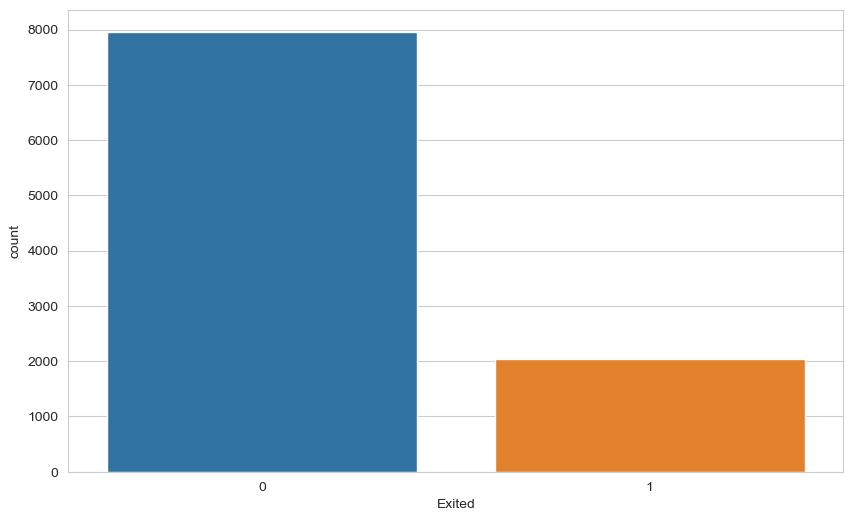

In [11]:
sns.countplot(df["Exited"]);
# exited: Binary flag 1 if the customer closed account with bank and 
# 0 if the customer is retained.

In [12]:
df.corr()

,RowNumber,CustomerId,CreditScore,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
RowNumber,1.000,0.004,0.006,0.001,-0.006,-0.009,0.007,0.001,0.012,-0.006,-0.017
CustomerId,0.004,1.000,0.005,0.009,-0.015,-0.012,0.017,-0.014,0.002,0.015,-0.006
CreditScore,0.006,0.005,1.000,-0.004,0.001,0.006,0.012,-0.005,0.026,-0.001,-0.027
Age,0.001,0.009,-0.004,1.000,-0.010,0.028,-0.031,-0.012,0.085,-0.007,0.285
Tenure,-0.006,-0.015,0.001,-0.010,1.000,-0.012,0.013,0.023,-0.028,0.008,-0.014
Balance,-0.009,-0.012,0.006,0.028,-0.012,1.000,-0.304,-0.015,-0.010,0.013,0.119
NumOfProducts,0.007,0.017,0.012,-0.031,0.013,-0.304,1.000,0.003,0.010,0.014,-0.048
HasCrCard,0.001,-0.014,-0.005,-0.012,0.023,-0.015,0.003,1.000,-0.012,-0.010,-0.007
IsActiveMember,0.012,0.002,0.026,0.085,-0.028,-0.010,0.010,-0.012,1.000,-0.011,-0.156
EstimatedSalary,-0.006,0.015,-0.001,-0.007,0.008,0.013,0.014,-0.010,-0.011,1.000,0.012


In [13]:
#sns.histplot(x="Age", data=df,kde=True)
#sns.histplot(x='Age', hue='Exited', data=df, alpha=0.5)
#sns.boxplot(y='Age', x='Exited', data=df)

## RowNumber

In [14]:
df = df.drop('RowNumber', axis = 1)

## CustomerId

In [15]:
df = df.drop('CustomerId', axis = 1)

## Surname

In [16]:
df = df.drop('Surname', axis = 1)

## CreditScore

In [17]:
import plotly.express as px 
fig = px.histogram(df['CreditScore'], nbins=60, marginal="box",  opacity=0.75)
fig.show()

## Geography

In [18]:
df['Geography'].value_counts()

France     5014
Germany    2509
Spain      2477
Name: Geography, dtype: int64

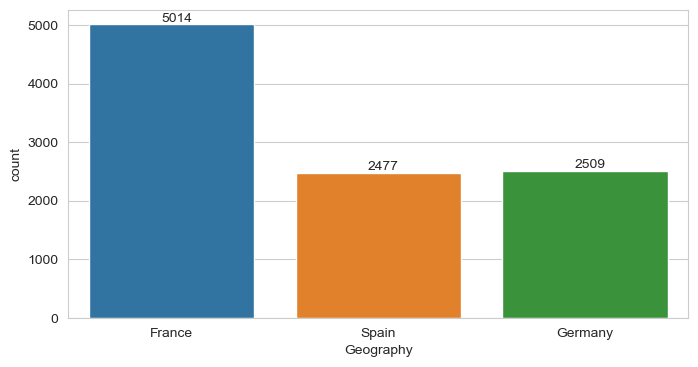

In [19]:
plt.rcParams["figure.figsize"] = (8, 4)
ax = sns.countplot(df["Geography"])
for p in ax.patches:
    ax.annotate('{}'.format(p.get_height()), (p.get_x() + 0.35, p.get_height() + 50))

plt.show()

## Gender

In [20]:
df['Gender'].value_counts()

Male      5457
Female    4543
Name: Gender, dtype: int64

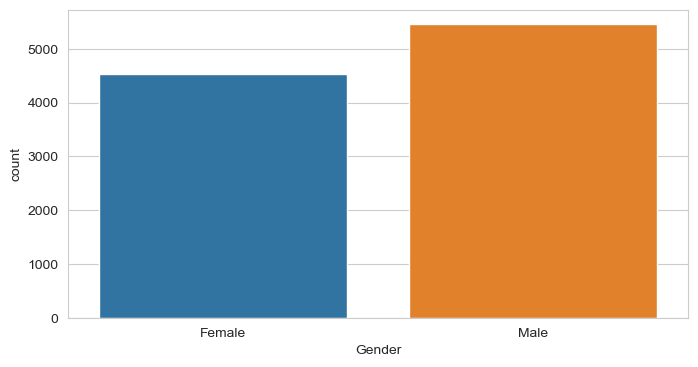

In [21]:
sns.countplot(df["Gender"]);

## Age

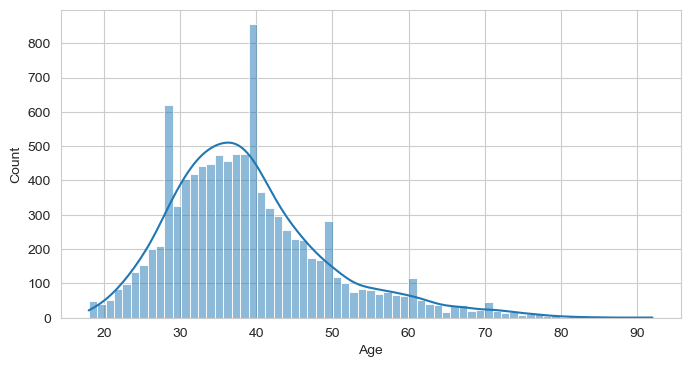

In [22]:
sns.histplot(x="Age", data=df,kde=True);

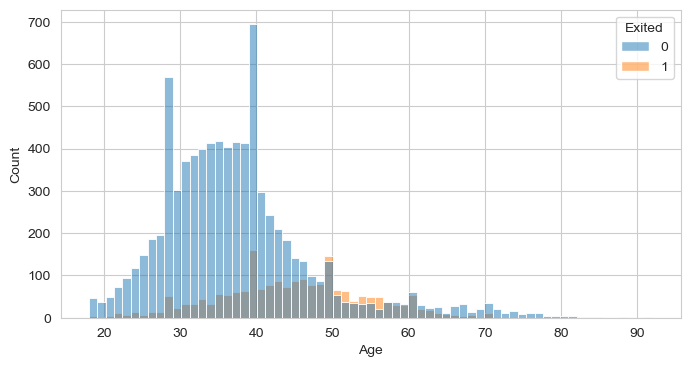

In [23]:
sns.histplot(x='Age', hue='Exited', data=df, alpha=0.5);

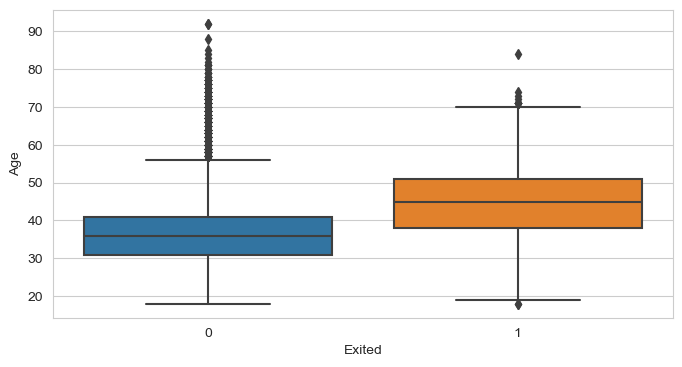

In [24]:
sns.boxplot(y='Age', x='Exited', data=df);

## Tenure

In [25]:
# The number of years for which the customer has been with the bank.
df['Tenure'].value_counts(dropna = False)

2     1048
1     1035
7     1028
8     1025
5     1012
3     1009
4      989
9      984
6      967
10     490
0      413
Name: Tenure, dtype: int64

In [26]:
fig = px.histogram(df['Tenure'], marginal="box",  opacity=0.75)
fig.show()

## CreditScore

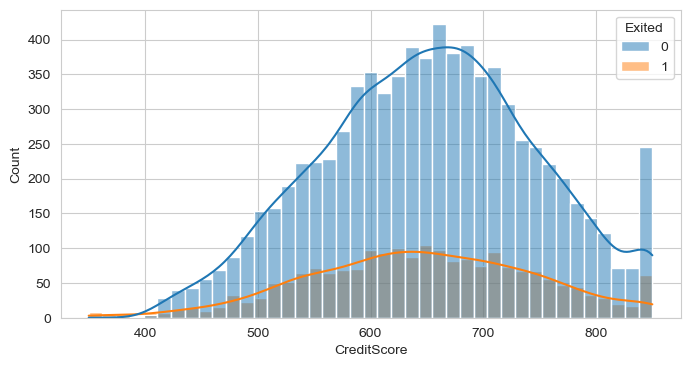

In [27]:
sns.histplot(x='CreditScore',data=df, hue='Exited',kde=True);

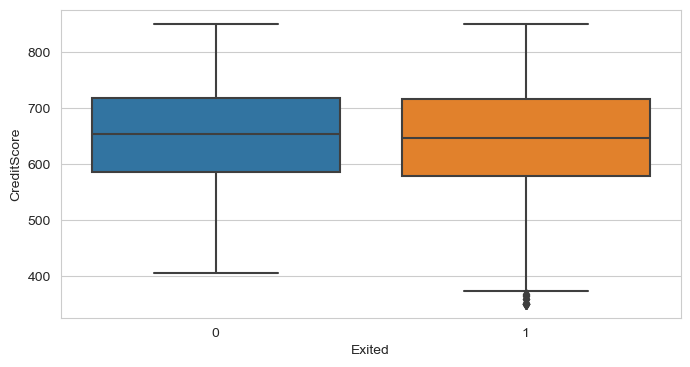

In [28]:
sns.boxplot(y='CreditScore', x='Exited', data=df);

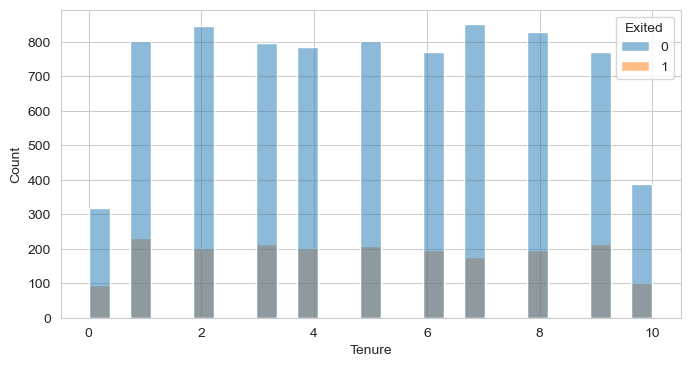

In [29]:
sns.histplot(x="Tenure",hue= 'Exited', data=df);

## Balance

<AxesSubplot:xlabel='Balance', ylabel='Density'>

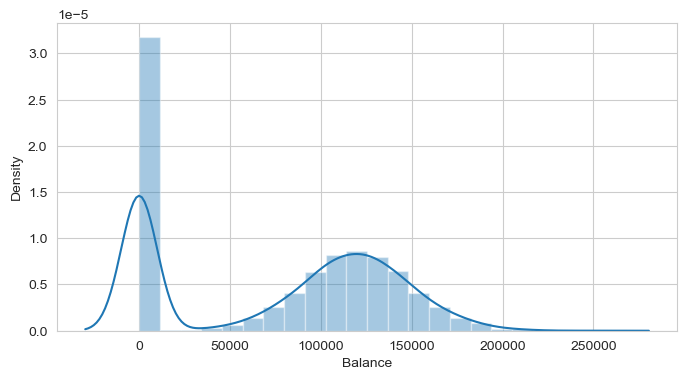

In [30]:
sns.distplot(df.Balance)

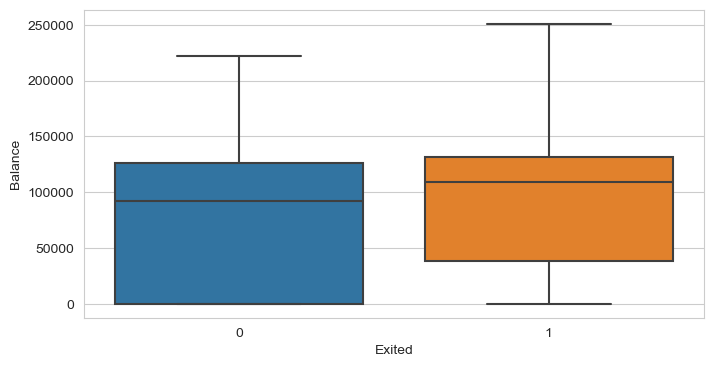

In [31]:
sns.boxplot(y='Balance', x='Exited', data=df);

## NumOfProducts

In [32]:
df['NumOfProducts'].value_counts(dropna = False)

1    5084
2    4590
3     266
4      60
Name: NumOfProducts, dtype: int64

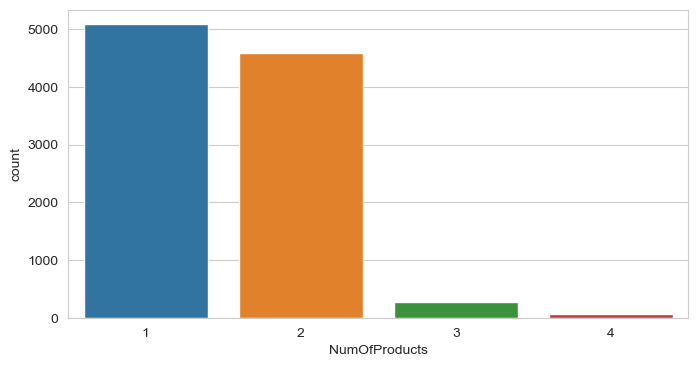

In [33]:
sns.countplot(df['NumOfProducts']);

## EstimatedSalary

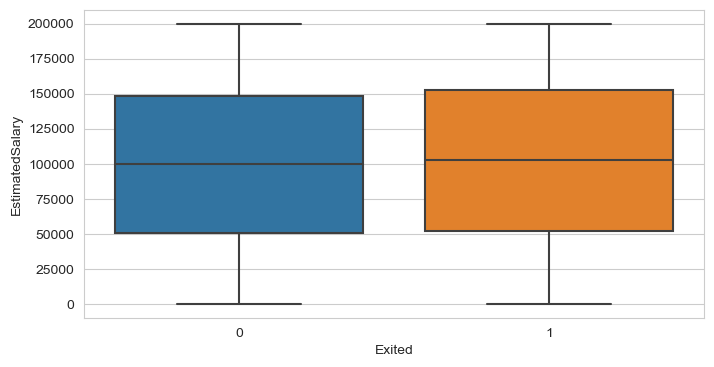

In [34]:
sns.boxplot(y='EstimatedSalary', x='Exited', data=df);

## HasCrCard

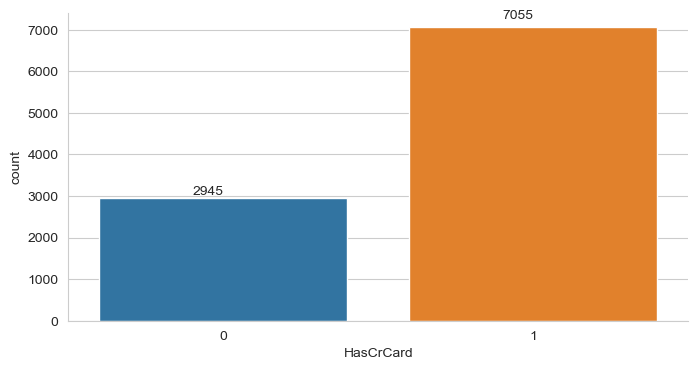

In [35]:
ax=sns.countplot(x='HasCrCard', data=df)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() + 0.3, p.get_height() * 1.03));

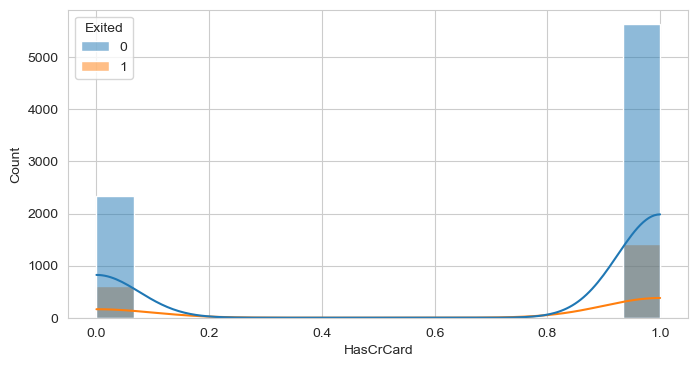

In [36]:
sns.histplot(x="HasCrCard",hue= 'Exited', data=df,kde=True);

## IsActiveMember

In [37]:
df['IsActiveMember'].value_counts()

1    5151
0    4849
Name: IsActiveMember, dtype: int64

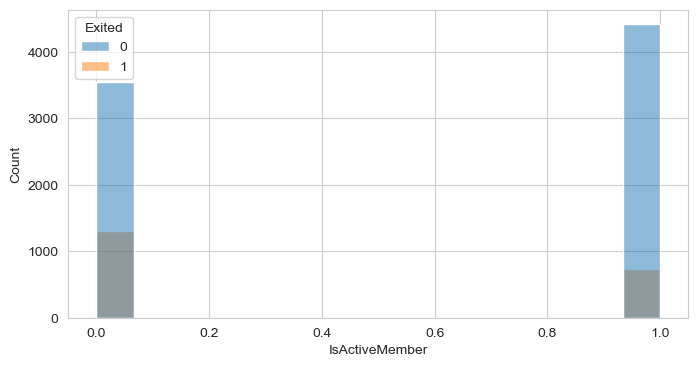

In [38]:
sns.histplot(x="IsActiveMember",hue= 'Exited', data=df);

## NumOfProducts

In [39]:
df.NumOfProducts.value_counts()

1    5084
2    4590
3     266
4      60
Name: NumOfProducts, dtype: int64

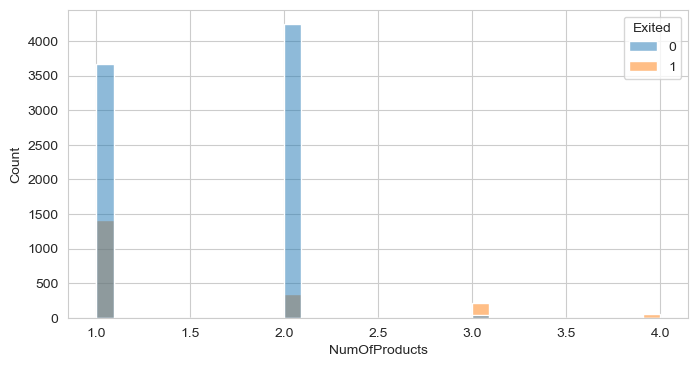

In [40]:
sns.histplot(x="NumOfProducts",hue= 'Exited', data=df);

## Exited

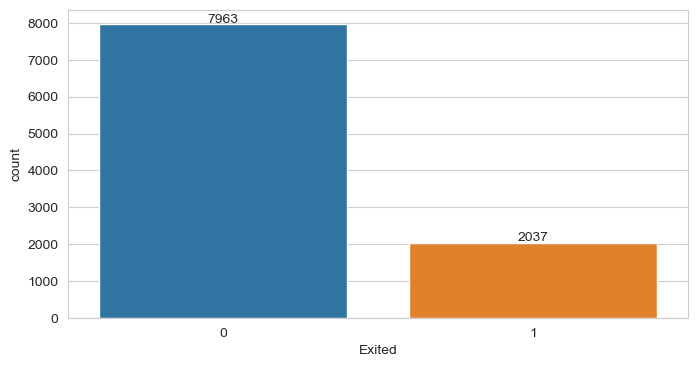

In [41]:
plt.rcParams["figure.figsize"] = (8, 4)
ax = sns.countplot(df["Exited"])
for p in ax.patches:
    ax.annotate('{}'.format(p.get_height()), (p.get_x() + 0.35, p.get_height() + 50))

plt.show()

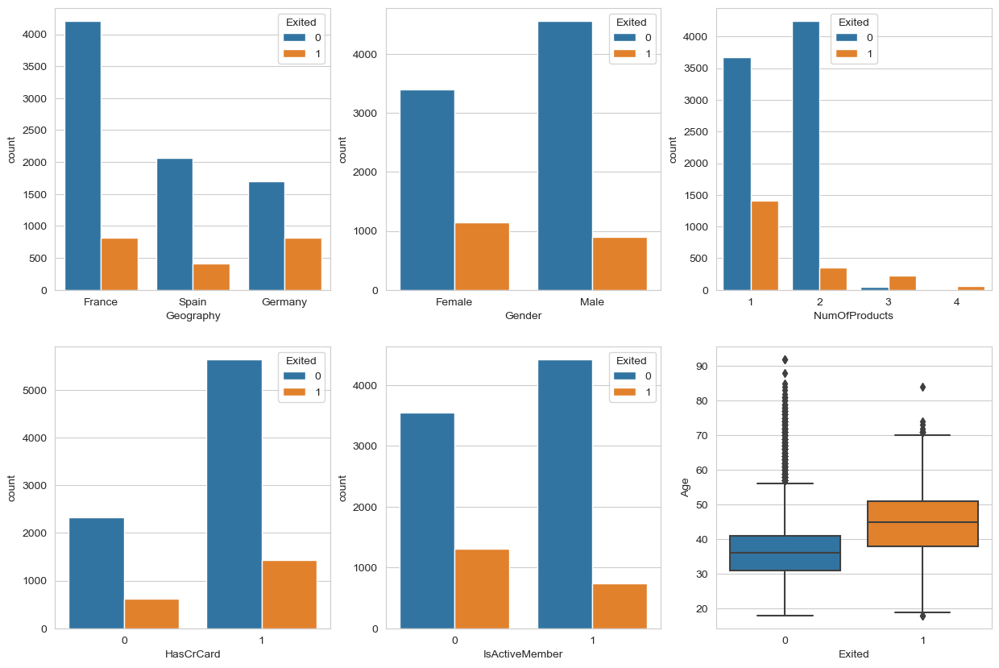

In [42]:
category = ["Geography", "Gender", "NumOfProducts", "HasCrCard", "IsActiveMember"]
index = 0
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
for i in category:
    index += 1
    plt.subplot(2, 3, index)
    sns.countplot(data=df, x=i, hue="Exited")

sns.boxplot(x='Exited', y='Age', data=df, ax=axes[1,2]);

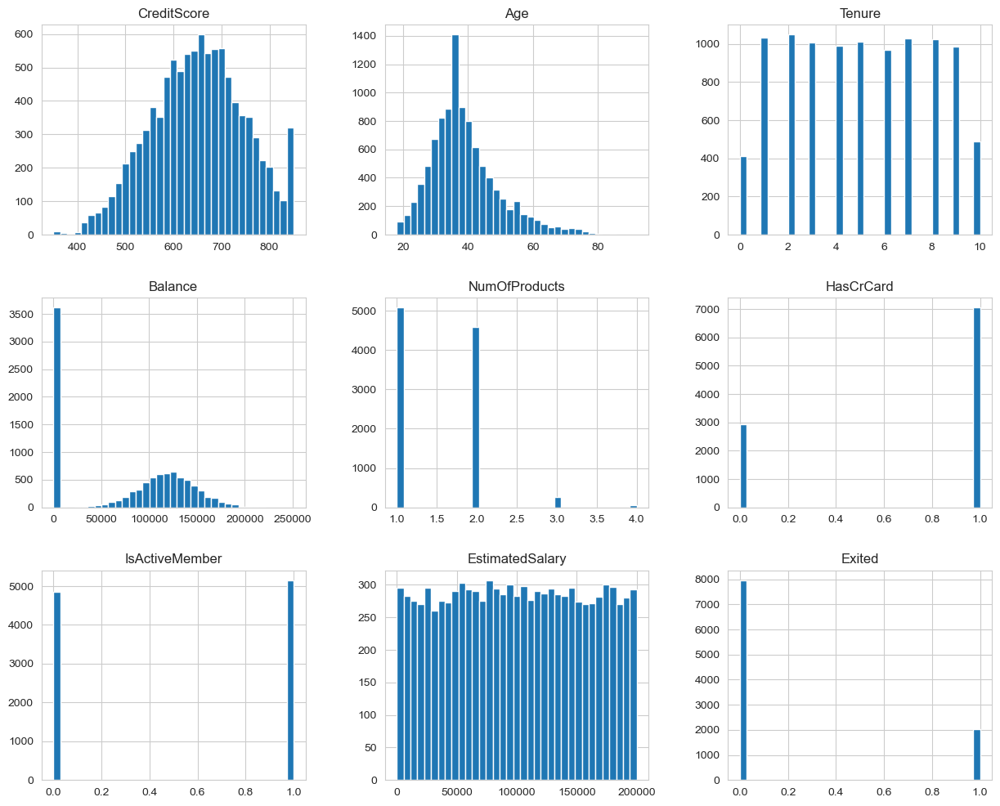

In [43]:
df.hist(figsize=(15, 12), bins=35);

In [44]:
df.corr()[['Exited']].sort_values(by='Exited', ascending=False)

,Exited
Exited,1.000
Age,0.285
Balance,0.119
EstimatedSalary,0.012
HasCrCard,-0.007
Tenure,-0.014
CreditScore,-0.027
NumOfProducts,-0.048
IsActiveMember,-0.156


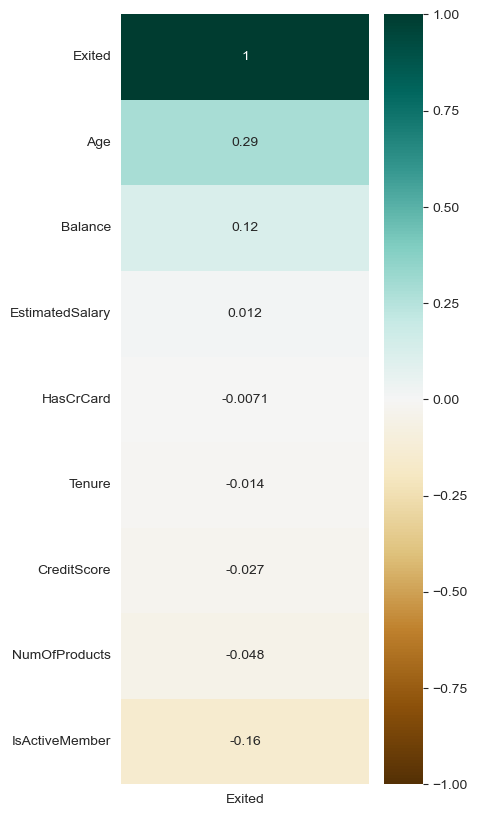

In [45]:
# for the target variable
plt.figure(figsize=(4, 10))
sns.heatmap(data=df.corr()[['Exited']].sort_values(by='Exited', ascending=False),
            vmin = -1, vmax = 1, 
            annot=True, 
            cmap='BrBG');

## Overall

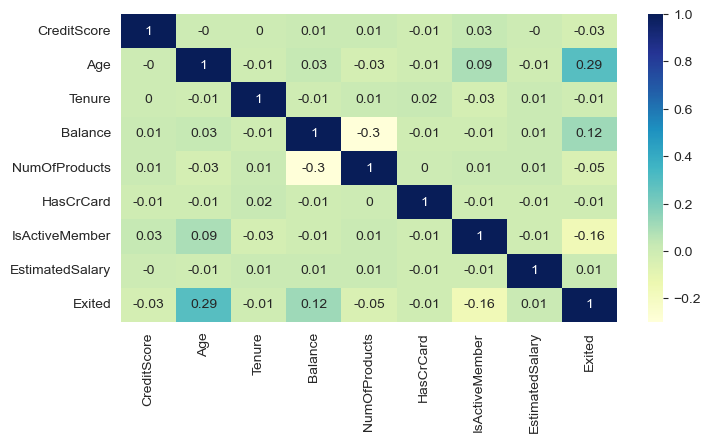

In [46]:
sns.heatmap(df.corr().round(2), annot=True, cmap='YlGnBu')
plt.show()

In [47]:
df.shape

(10000, 11)

In [48]:
#sns.pairplot(df);

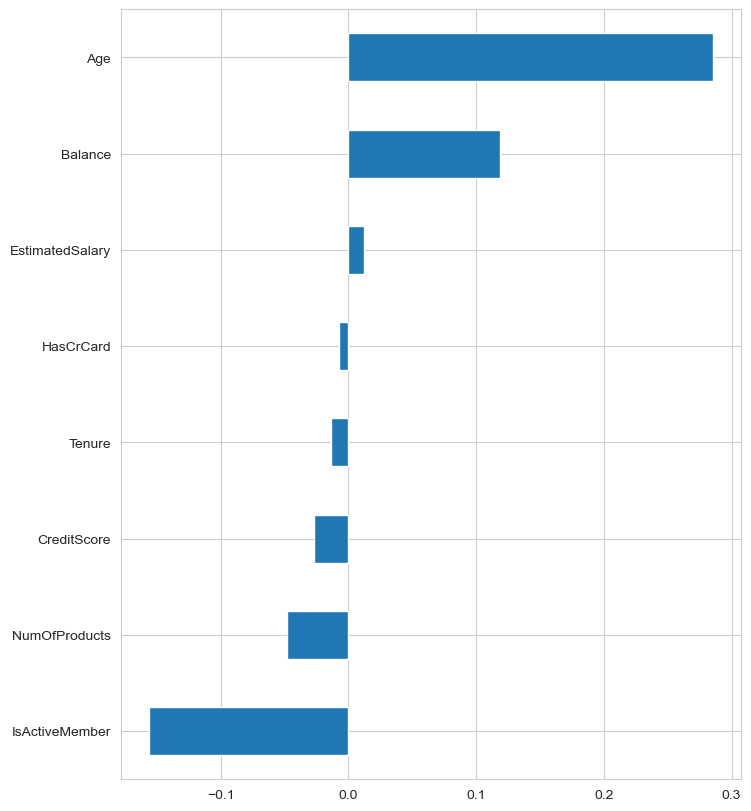

In [49]:
plt.figure(figsize = (8,10))
df.corr()['Exited'].sort_values().drop("Exited").plot(kind = "barh");

### Dummy

In [55]:
df = pd.get_dummies(df,drop_first=True)
df.head()

,CreditScore,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Geography_Germany,Geography_Spain,Gender_Male
0,619,42,2,0.000,1,1,1,101348.880,1,0,0,0
1,608,41,1,83807.860,1,0,1,112542.580,0,0,1,0
2,502,42,8,159660.800,3,1,0,113931.570,1,0,0,0
3,699,39,1,0.000,2,0,0,93826.630,0,0,0,0
4,850,43,2,125510.820,1,1,1,79084.100,0,0,1,0


In [56]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
CreditScore,10000.000,650.529,96.653,350.000,584.000,652.000,718.000,850.000
Age,10000.000,38.922,10.488,18.000,32.000,37.000,44.000,92.000
Tenure,10000.000,5.013,2.892,0.000,3.000,5.000,7.000,10.000
Balance,10000.000,76485.889,62397.405,0.000,0.000,97198.540,127644.240,250898.090
NumOfProducts,10000.000,1.530,0.582,1.000,1.000,1.000,2.000,4.000
HasCrCard,10000.000,0.706,0.456,0.000,0.000,1.000,1.000,1.000
IsActiveMember,10000.000,0.515,0.500,0.000,0.000,1.000,1.000,1.000
EstimatedSalary,10000.000,100090.240,57510.493,11.580,51002.110,100193.915,149388.247,199992.480
Exited,10000.000,0.204,0.403,0.000,0.000,0.000,0.000,1.000
Geography_Germany,10000.000,0.251,0.434,0.000,0.000,0.000,1.000,1.000


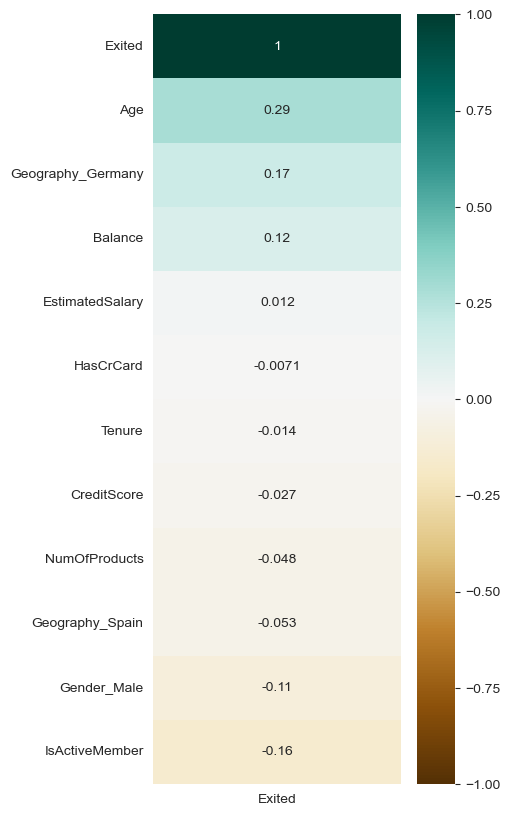

In [57]:
plt.figure(figsize=(4, 10))
sns.heatmap(data=df.corr()[['Exited']].sort_values(by='Exited', ascending=False),
            vmin = -1, vmax = 1, 
            annot=True, 
            cmap='BrBG');

# Preprocessing of Data
- Train | Test Split, Scalling

In [58]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
#random_state = 42
seed = 42

In [59]:
X = df.drop('Exited', axis=1)
y = df['Exited']

In [ ]:
X

In [ ]:
y

In [61]:
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify = y, test_size = 0.3, random_state = seed)

In [62]:
scaler = MinMaxScaler()

In [68]:
X_train= scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [64]:
print(X_train.shape)
print(X_test.shape)

(7000, 11)
(3000, 11)


# Modelling & Model Performance

## without class_weigth

### Create The Model

In [ ]:
!python --version

In [ ]:
!pwd

In [65]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import plot_roc_curve, roc_auc_score, roc_curve
from sklearn.model_selection import cross_val_score, cross_validate
from sklearn.model_selection import GridSearchCV

In [66]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

In [67]:
def eval_metric(actual, pred):
    mae = mean_absolute_error(actual, pred)
    mse = mean_squared_error(actual, pred)
    rmse = np.sqrt(mean_squared_error(actual, pred))
    score = r2_score(actual, pred)
    return print("r2_score:", score, "\nmae:", mae, "\nmse:", mse, "\nrmse:", rmse)

In [69]:
tf.random.set_seed(seed)
model = Sequential()
model.add(Dense(16, activation='relu', input_dim=X_train.shape[1])) 
model.add(Dense(8, activation='relu'))
model.add(Dense(4, activation='relu'))
model.add(Dense(1, activation='sigmoid'))

model.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['Recall'])

In [56]:
#!pip install tensorflow
!python --version

Python 3.9.13


In [70]:
model.fit(x = X_train, y = y_train, validation_split = 0.1, batch_size = 32, epochs = 1000, verbose=1)

2022-09-19 11:10:55.479359: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:116] None of the MLIR optimization passes are enabled (registered 2)


Epoch 1/1000
197/197 [==============================] - 1s 3ms/step - loss: 0.6155 - recall: 0.1814 - val_loss: 0.4996 - val_recall: 0.0000e+00
Epoch 2/1000
197/197 [==============================] - 0s 594us/step - loss: 0.4867 - recall: 0.0000e+00 - val_loss: 0.4806 - val_recall: 0.0000e+00
Epoch 3/1000
197/197 [==============================] - 0s 614us/step - loss: 0.4809 - recall: 0.0039 - val_loss: 0.4570 - val_recall: 0.0604
Epoch 4/1000
197/197 [==============================] - 0s 623us/step - loss: 0.4548 - recall: 0.0749 - val_loss: 0.4424 - val_recall: 0.1812
Epoch 5/1000
197/197 [==============================] - 0s 621us/step - loss: 0.4436 - recall: 0.1611 - val_loss: 0.4370 - val_recall: 0.1812
Epoch 6/1000
197/197 [==============================] - 0s 596us/step - loss: 0.4374 - recall: 0.1523 - val_loss: 0.4292 - val_recall: 0.2215
Epoch 7/1000
197/197 [==============================] - 0s 623us/step - loss: 0.4452 - recall: 0.2180 - val_loss: 0.4250 - val_recall: 0.2

197/197 [==============================] - 0s 599us/step - loss: 0.3305 - recall: 0.4716 - val_loss: 0.3565 - val_recall: 0.4228
Epoch 59/1000
197/197 [==============================] - 0s 600us/step - loss: 0.3290 - recall: 0.4740 - val_loss: 0.3542 - val_recall: 0.3490
Epoch 60/1000
197/197 [==============================] - 0s 582us/step - loss: 0.3332 - recall: 0.4423 - val_loss: 0.3542 - val_recall: 0.3960
Epoch 61/1000
197/197 [==============================] - 0s 577us/step - loss: 0.3382 - recall: 0.4674 - val_loss: 0.3601 - val_recall: 0.3423
Epoch 62/1000
197/197 [==============================] - 0s 576us/step - loss: 0.3287 - recall: 0.4608 - val_loss: 0.3575 - val_recall: 0.3624
Epoch 63/1000
197/197 [==============================] - 0s 575us/step - loss: 0.3306 - recall: 0.4712 - val_loss: 0.3539 - val_recall: 0.3758
Epoch 64/1000
197/197 [==============================] - 0s 576us/step - loss: 0.3430 - recall: 0.4357 - val_loss: 0.3550 - val_recall: 0.4027
Epoch 65/1000

197/197 [==============================] - 0s 583us/step - loss: 0.3300 - recall: 0.4662 - val_loss: 0.3511 - val_recall: 0.4094
Epoch 116/1000
197/197 [==============================] - 0s 571us/step - loss: 0.3286 - recall: 0.4747 - val_loss: 0.3513 - val_recall: 0.4094
Epoch 117/1000
197/197 [==============================] - 0s 578us/step - loss: 0.3163 - recall: 0.4892 - val_loss: 0.3501 - val_recall: 0.4094
Epoch 118/1000
197/197 [==============================] - 0s 570us/step - loss: 0.3222 - recall: 0.4825 - val_loss: 0.3523 - val_recall: 0.4161
Epoch 119/1000
197/197 [==============================] - 0s 571us/step - loss: 0.3253 - recall: 0.4758 - val_loss: 0.3575 - val_recall: 0.3624
Epoch 120/1000
197/197 [==============================] - 0s 583us/step - loss: 0.3369 - recall: 0.4753 - val_loss: 0.3514 - val_recall: 0.3893
Epoch 121/1000
197/197 [==============================] - 0s 581us/step - loss: 0.3262 - recall: 0.4609 - val_loss: 0.3550 - val_recall: 0.4027
Epoch 1

Epoch 172/1000
197/197 [==============================] - 0s 576us/step - loss: 0.3096 - recall: 0.5023 - val_loss: 0.3569 - val_recall: 0.4564
Epoch 173/1000
197/197 [==============================] - 0s 573us/step - loss: 0.3365 - recall: 0.4577 - val_loss: 0.3526 - val_recall: 0.4362
Epoch 174/1000
197/197 [==============================] - 0s 570us/step - loss: 0.3303 - recall: 0.4920 - val_loss: 0.3555 - val_recall: 0.4228
Epoch 175/1000
197/197 [==============================] - 0s 563us/step - loss: 0.3487 - recall: 0.4520 - val_loss: 0.3546 - val_recall: 0.3423
Epoch 176/1000
197/197 [==============================] - 0s 572us/step - loss: 0.3201 - recall: 0.4991 - val_loss: 0.3537 - val_recall: 0.3624
Epoch 177/1000
197/197 [==============================] - 0s 573us/step - loss: 0.3136 - recall: 0.4658 - val_loss: 0.3514 - val_recall: 0.3826
Epoch 178/1000
197/197 [==============================] - 0s 578us/step - loss: 0.3149 - recall: 0.4567 - val_loss: 0.3510 - val_recall:

Epoch 229/1000
197/197 [==============================] - 0s 575us/step - loss: 0.3187 - recall: 0.4918 - val_loss: 0.3564 - val_recall: 0.3490
Epoch 230/1000
197/197 [==============================] - 0s 577us/step - loss: 0.3227 - recall: 0.4879 - val_loss: 0.3530 - val_recall: 0.4228
Epoch 231/1000
197/197 [==============================] - 0s 577us/step - loss: 0.3159 - recall: 0.5025 - val_loss: 0.3594 - val_recall: 0.4161
Epoch 232/1000
197/197 [==============================] - 0s 570us/step - loss: 0.3130 - recall: 0.4817 - val_loss: 0.3495 - val_recall: 0.4161
Epoch 233/1000
197/197 [==============================] - 0s 575us/step - loss: 0.3231 - recall: 0.4820 - val_loss: 0.3535 - val_recall: 0.4966
Epoch 234/1000
197/197 [==============================] - 0s 588us/step - loss: 0.3234 - recall: 0.4964 - val_loss: 0.3630 - val_recall: 0.3356
Epoch 235/1000
197/197 [==============================] - 0s 581us/step - loss: 0.3104 - recall: 0.5057 - val_loss: 0.3522 - val_recall:

Epoch 286/1000
197/197 [==============================] - 0s 592us/step - loss: 0.3159 - recall: 0.5084 - val_loss: 0.3556 - val_recall: 0.3826
Epoch 287/1000
197/197 [==============================] - 0s 592us/step - loss: 0.3200 - recall: 0.4798 - val_loss: 0.3649 - val_recall: 0.3423
Epoch 288/1000
197/197 [==============================] - 0s 592us/step - loss: 0.3157 - recall: 0.4750 - val_loss: 0.3576 - val_recall: 0.3960
Epoch 289/1000
197/197 [==============================] - 0s 589us/step - loss: 0.3191 - recall: 0.4841 - val_loss: 0.3611 - val_recall: 0.3893
Epoch 290/1000
197/197 [==============================] - 0s 573us/step - loss: 0.3125 - recall: 0.4976 - val_loss: 0.3720 - val_recall: 0.5570
Epoch 291/1000
197/197 [==============================] - 0s 575us/step - loss: 0.3087 - recall: 0.5084 - val_loss: 0.3582 - val_recall: 0.4161
Epoch 292/1000
197/197 [==============================] - 0s 592us/step - loss: 0.3071 - recall: 0.5032 - val_loss: 0.3575 - val_recall:

Epoch 343/1000
197/197 [==============================] - 0s 576us/step - loss: 0.3188 - recall: 0.5172 - val_loss: 0.3666 - val_recall: 0.3691
Epoch 344/1000
197/197 [==============================] - 0s 592us/step - loss: 0.3192 - recall: 0.4792 - val_loss: 0.3599 - val_recall: 0.4430
Epoch 345/1000
197/197 [==============================] - 0s 584us/step - loss: 0.3138 - recall: 0.5086 - val_loss: 0.3688 - val_recall: 0.4497
Epoch 346/1000
197/197 [==============================] - 0s 583us/step - loss: 0.3103 - recall: 0.5118 - val_loss: 0.3570 - val_recall: 0.4765
Epoch 347/1000
197/197 [==============================] - 0s 585us/step - loss: 0.3110 - recall: 0.5322 - val_loss: 0.3612 - val_recall: 0.4295
Epoch 348/1000
197/197 [==============================] - 0s 604us/step - loss: 0.3163 - recall: 0.4796 - val_loss: 0.3612 - val_recall: 0.3826
Epoch 349/1000
197/197 [==============================] - 0s 602us/step - loss: 0.3090 - recall: 0.4962 - val_loss: 0.3617 - val_recall:

Epoch 400/1000
197/197 [==============================] - 0s 588us/step - loss: 0.3113 - recall: 0.4834 - val_loss: 0.3625 - val_recall: 0.4362
Epoch 401/1000
197/197 [==============================] - 0s 595us/step - loss: 0.3121 - recall: 0.4988 - val_loss: 0.3657 - val_recall: 0.3758
Epoch 402/1000
197/197 [==============================] - 0s 591us/step - loss: 0.3240 - recall: 0.4747 - val_loss: 0.3628 - val_recall: 0.5034
Epoch 403/1000
197/197 [==============================] - 0s 579us/step - loss: 0.3051 - recall: 0.5207 - val_loss: 0.3614 - val_recall: 0.3758
Epoch 404/1000
197/197 [==============================] - 0s 590us/step - loss: 0.3033 - recall: 0.5281 - val_loss: 0.3679 - val_recall: 0.4161
Epoch 405/1000
197/197 [==============================] - 0s 608us/step - loss: 0.3143 - recall: 0.5109 - val_loss: 0.3678 - val_recall: 0.4094
Epoch 406/1000
197/197 [==============================] - 0s 596us/step - loss: 0.3130 - recall: 0.4866 - val_loss: 0.3588 - val_recall:

Epoch 457/1000
197/197 [==============================] - 0s 595us/step - loss: 0.3087 - recall: 0.4987 - val_loss: 0.3612 - val_recall: 0.4430
Epoch 458/1000
197/197 [==============================] - 0s 587us/step - loss: 0.3128 - recall: 0.5031 - val_loss: 0.3655 - val_recall: 0.5235
Epoch 459/1000
197/197 [==============================] - 0s 623us/step - loss: 0.3181 - recall: 0.5106 - val_loss: 0.3627 - val_recall: 0.4161
Epoch 460/1000
197/197 [==============================] - 0s 600us/step - loss: 0.3114 - recall: 0.5011 - val_loss: 0.3677 - val_recall: 0.4027
Epoch 461/1000
197/197 [==============================] - 0s 598us/step - loss: 0.3204 - recall: 0.4896 - val_loss: 0.3613 - val_recall: 0.4094
Epoch 462/1000
197/197 [==============================] - 0s 581us/step - loss: 0.3190 - recall: 0.5198 - val_loss: 0.3654 - val_recall: 0.4161
Epoch 463/1000
197/197 [==============================] - 0s 576us/step - loss: 0.3141 - recall: 0.5074 - val_loss: 0.3596 - val_recall:

Epoch 514/1000
197/197 [==============================] - 0s 682us/step - loss: 0.3084 - recall: 0.5365 - val_loss: 0.3651 - val_recall: 0.4295
Epoch 515/1000
197/197 [==============================] - 0s 610us/step - loss: 0.2984 - recall: 0.5037 - val_loss: 0.3683 - val_recall: 0.3826
Epoch 516/1000
197/197 [==============================] - 0s 591us/step - loss: 0.3071 - recall: 0.5248 - val_loss: 0.3654 - val_recall: 0.4362
Epoch 517/1000
197/197 [==============================] - 0s 630us/step - loss: 0.3055 - recall: 0.5067 - val_loss: 0.3672 - val_recall: 0.4161
Epoch 518/1000
197/197 [==============================] - 0s 607us/step - loss: 0.3061 - recall: 0.5155 - val_loss: 0.3663 - val_recall: 0.4430
Epoch 519/1000
197/197 [==============================] - 0s 620us/step - loss: 0.3135 - recall: 0.5346 - val_loss: 0.3631 - val_recall: 0.4698
Epoch 520/1000
197/197 [==============================] - 0s 629us/step - loss: 0.3228 - recall: 0.5210 - val_loss: 0.3664 - val_recall:

Epoch 571/1000
197/197 [==============================] - 0s 622us/step - loss: 0.2904 - recall: 0.5306 - val_loss: 0.3672 - val_recall: 0.4161
Epoch 572/1000
197/197 [==============================] - 0s 626us/step - loss: 0.3112 - recall: 0.5069 - val_loss: 0.3694 - val_recall: 0.4564
Epoch 573/1000
197/197 [==============================] - 0s 597us/step - loss: 0.3188 - recall: 0.4868 - val_loss: 0.3745 - val_recall: 0.4497
Epoch 574/1000
197/197 [==============================] - 0s 602us/step - loss: 0.3052 - recall: 0.5204 - val_loss: 0.3734 - val_recall: 0.4295
Epoch 575/1000
197/197 [==============================] - 0s 605us/step - loss: 0.3059 - recall: 0.5216 - val_loss: 0.3686 - val_recall: 0.4698
Epoch 576/1000
197/197 [==============================] - 0s 588us/step - loss: 0.3039 - recall: 0.5155 - val_loss: 0.3632 - val_recall: 0.4430
Epoch 577/1000
197/197 [==============================] - 0s 601us/step - loss: 0.3076 - recall: 0.5269 - val_loss: 0.3740 - val_recall:

Epoch 628/1000
197/197 [==============================] - 0s 709us/step - loss: 0.2977 - recall: 0.4995 - val_loss: 0.3667 - val_recall: 0.5101
Epoch 629/1000
197/197 [==============================] - 0s 712us/step - loss: 0.3205 - recall: 0.5116 - val_loss: 0.3680 - val_recall: 0.4564
Epoch 630/1000
197/197 [==============================] - 0s 669us/step - loss: 0.3102 - recall: 0.5135 - val_loss: 0.3703 - val_recall: 0.4295
Epoch 631/1000
197/197 [==============================] - 0s 582us/step - loss: 0.3253 - recall: 0.5144 - val_loss: 0.3757 - val_recall: 0.4698
Epoch 632/1000
197/197 [==============================] - 0s 614us/step - loss: 0.3114 - recall: 0.5472 - val_loss: 0.3679 - val_recall: 0.4765
Epoch 633/1000
197/197 [==============================] - 0s 614us/step - loss: 0.3007 - recall: 0.5111 - val_loss: 0.3701 - val_recall: 0.4564
Epoch 634/1000
197/197 [==============================] - 0s 592us/step - loss: 0.3072 - recall: 0.5310 - val_loss: 0.3720 - val_recall:

Epoch 685/1000
197/197 [==============================] - 0s 619us/step - loss: 0.3130 - recall: 0.5210 - val_loss: 0.3676 - val_recall: 0.4430
Epoch 686/1000
197/197 [==============================] - 0s 606us/step - loss: 0.3090 - recall: 0.5114 - val_loss: 0.3625 - val_recall: 0.4228
Epoch 687/1000
197/197 [==============================] - 0s 603us/step - loss: 0.3005 - recall: 0.5126 - val_loss: 0.3666 - val_recall: 0.4228
Epoch 688/1000
197/197 [==============================] - 0s 602us/step - loss: 0.3082 - recall: 0.5289 - val_loss: 0.3697 - val_recall: 0.4698
Epoch 689/1000
197/197 [==============================] - 0s 580us/step - loss: 0.3185 - recall: 0.5189 - val_loss: 0.3688 - val_recall: 0.4228
Epoch 690/1000
197/197 [==============================] - 0s 566us/step - loss: 0.3046 - recall: 0.5138 - val_loss: 0.3750 - val_recall: 0.4698
Epoch 691/1000
197/197 [==============================] - 0s 606us/step - loss: 0.3068 - recall: 0.5184 - val_loss: 0.3649 - val_recall:

Epoch 742/1000
197/197 [==============================] - 0s 585us/step - loss: 0.3140 - recall: 0.5196 - val_loss: 0.3698 - val_recall: 0.4899
Epoch 743/1000
197/197 [==============================] - 0s 621us/step - loss: 0.3045 - recall: 0.5124 - val_loss: 0.3688 - val_recall: 0.4631
Epoch 744/1000
197/197 [==============================] - 0s 577us/step - loss: 0.3005 - recall: 0.5264 - val_loss: 0.3758 - val_recall: 0.4765
Epoch 745/1000
197/197 [==============================] - 0s 582us/step - loss: 0.2993 - recall: 0.5327 - val_loss: 0.3797 - val_recall: 0.4161
Epoch 746/1000
197/197 [==============================] - 0s 581us/step - loss: 0.3024 - recall: 0.5134 - val_loss: 0.3699 - val_recall: 0.4027
Epoch 747/1000
197/197 [==============================] - 0s 569us/step - loss: 0.3146 - recall: 0.4791 - val_loss: 0.3686 - val_recall: 0.4564
Epoch 748/1000
197/197 [==============================] - 0s 576us/step - loss: 0.3124 - recall: 0.5108 - val_loss: 0.3730 - val_recall:

Epoch 799/1000
197/197 [==============================] - 0s 580us/step - loss: 0.3050 - recall: 0.5171 - val_loss: 0.3809 - val_recall: 0.4765
Epoch 800/1000
197/197 [==============================] - 0s 571us/step - loss: 0.3133 - recall: 0.5238 - val_loss: 0.3701 - val_recall: 0.4362
Epoch 801/1000
197/197 [==============================] - 0s 574us/step - loss: 0.2967 - recall: 0.5280 - val_loss: 0.3723 - val_recall: 0.5101
Epoch 802/1000
197/197 [==============================] - 0s 585us/step - loss: 0.2960 - recall: 0.5589 - val_loss: 0.3686 - val_recall: 0.4698
Epoch 803/1000
197/197 [==============================] - 0s 606us/step - loss: 0.3008 - recall: 0.5111 - val_loss: 0.3730 - val_recall: 0.4765
Epoch 804/1000
197/197 [==============================] - 0s 602us/step - loss: 0.3164 - recall: 0.5025 - val_loss: 0.3659 - val_recall: 0.4564
Epoch 805/1000
197/197 [==============================] - 0s 626us/step - loss: 0.3032 - recall: 0.5446 - val_loss: 0.3683 - val_recall:

Epoch 856/1000
197/197 [==============================] - 0s 586us/step - loss: 0.3067 - recall: 0.5226 - val_loss: 0.3783 - val_recall: 0.4899
Epoch 857/1000
197/197 [==============================] - 0s 571us/step - loss: 0.2991 - recall: 0.5615 - val_loss: 0.3721 - val_recall: 0.5034
Epoch 858/1000
197/197 [==============================] - 0s 579us/step - loss: 0.3012 - recall: 0.5123 - val_loss: 0.3728 - val_recall: 0.5235
Epoch 859/1000
197/197 [==============================] - 0s 579us/step - loss: 0.3178 - recall: 0.5304 - val_loss: 0.3681 - val_recall: 0.4161
Epoch 860/1000
197/197 [==============================] - 0s 566us/step - loss: 0.2981 - recall: 0.5058 - val_loss: 0.3672 - val_recall: 0.5101
Epoch 861/1000
197/197 [==============================] - 0s 580us/step - loss: 0.3122 - recall: 0.4995 - val_loss: 0.3706 - val_recall: 0.4362
Epoch 862/1000
197/197 [==============================] - 0s 571us/step - loss: 0.3068 - recall: 0.5177 - val_loss: 0.3739 - val_recall:

Epoch 913/1000
197/197 [==============================] - 0s 657us/step - loss: 0.3068 - recall: 0.5203 - val_loss: 0.3760 - val_recall: 0.3893
Epoch 914/1000
197/197 [==============================] - 0s 633us/step - loss: 0.3145 - recall: 0.5068 - val_loss: 0.3729 - val_recall: 0.4564
Epoch 915/1000
197/197 [==============================] - 0s 681us/step - loss: 0.2983 - recall: 0.5444 - val_loss: 0.3806 - val_recall: 0.4027
Epoch 916/1000
197/197 [==============================] - 0s 713us/step - loss: 0.2957 - recall: 0.5228 - val_loss: 0.3758 - val_recall: 0.4295
Epoch 917/1000
197/197 [==============================] - 0s 709us/step - loss: 0.3047 - recall: 0.5331 - val_loss: 0.3734 - val_recall: 0.4698
Epoch 918/1000
197/197 [==============================] - 0s 697us/step - loss: 0.2970 - recall: 0.5229 - val_loss: 0.3676 - val_recall: 0.4430
Epoch 919/1000
197/197 [==============================] - 0s 698us/step - loss: 0.3168 - recall: 0.4920 - val_loss: 0.3702 - val_recall:

Epoch 970/1000
197/197 [==============================] - 0s 595us/step - loss: 0.2885 - recall: 0.5556 - val_loss: 0.3748 - val_recall: 0.4698
Epoch 971/1000
197/197 [==============================] - 0s 600us/step - loss: 0.2890 - recall: 0.5706 - val_loss: 0.3705 - val_recall: 0.4966
Epoch 972/1000
197/197 [==============================] - 0s 566us/step - loss: 0.3221 - recall: 0.5268 - val_loss: 0.3844 - val_recall: 0.3826
Epoch 973/1000
197/197 [==============================] - 0s 581us/step - loss: 0.3004 - recall: 0.5341 - val_loss: 0.3753 - val_recall: 0.4094
Epoch 974/1000
197/197 [==============================] - 0s 596us/step - loss: 0.3055 - recall: 0.5397 - val_loss: 0.3716 - val_recall: 0.4295
Epoch 975/1000
197/197 [==============================] - 0s 592us/step - loss: 0.3022 - recall: 0.4920 - val_loss: 0.3755 - val_recall: 0.3960
Epoch 976/1000
197/197 [==============================] - 0s 576us/step - loss: 0.3017 - recall: 0.5298 - val_loss: 0.3695 - val_recall:

In [71]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 16)                192       
_________________________________________________________________
dense_1 (Dense)              (None, 8)                 136       
_________________________________________________________________
dense_2 (Dense)              (None, 4)                 36        
_________________________________________________________________
dense_3 (Dense)              (None, 1)                 5         
Total params: 369
Trainable params: 369
Non-trainable params: 0
_________________________________________________________________


In [72]:
loss_df = pd.DataFrame(model.history.history)
loss_df.head()

,loss,recall,val_loss,val_recall
0,0.553,0.048,0.500,0.000
1,0.486,0.000,0.481,0.000
2,0.468,0.019,0.457,0.060
3,0.453,0.101,0.442,0.181
4,0.445,0.147,0.437,0.181


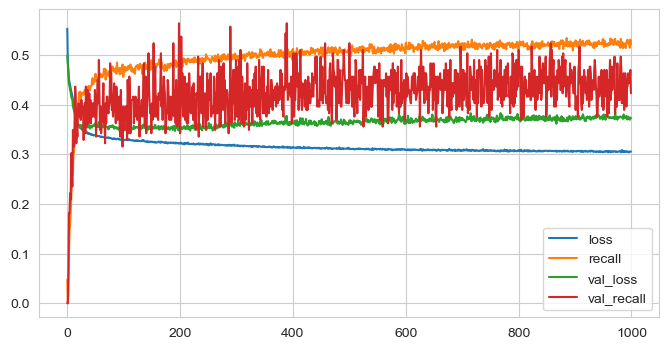

In [73]:
loss_df.plot();

In [74]:
model.evaluate(X_test, y_test, verbose=0)

[0.35390689969062805, 0.47954174876213074]

In [75]:
loss, accuracy = model.evaluate(X_test, y_test, verbose=0)
print("loss : ", loss)
print("accuracy : ", accuracy)

loss :  0.35390689969062805
accuracy :  0.47954174876213074


In [76]:
y_pred = model.predict(X_test) > 0.5
#y_pred = model.predict_classes(X_test) for tf 2.5.0
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

[[2275  114]
 [ 318  293]]
              precision    recall  f1-score   support

           0       0.88      0.95      0.91      2389
           1       0.72      0.48      0.58       611

    accuracy                           0.86      3000
   macro avg       0.80      0.72      0.74      3000
weighted avg       0.85      0.86      0.84      3000



### Evaluate The Model

- Plot the model history to observe the changing of metrics
- Make prediction to see "confusion matrix" and "classification report"
- Check ROC (Receiver Operating Curve) and AUC (Area Under Curve) for the model

## with class_weigth

Investigate how the "class_weight" hyper-parameter is used in a Neural Network.

### Create The Model

### Evaluate The Model

- Plot the model history to observe the changing of metrics
- Make prediction to see "confusion matrix" and "classification report"
- Check ROC (Receiver Operating Curve) and AUC (Area Under Curve) for the model

## Implementation Different Methods to Develop The Model

- Implement the following methods on model creating with "class_weight" parameter
- Create and evaluate model for each method 

### Increase The Learning Rate and Observe The Results

### Add Dropout Layer

### Add Early Stop

#### Monitor the "val_loss" as metric

#### Monitor the "val_recall" as metric

## GridSearchCV

In [77]:
from tensorflow.keras.optimizers import Adam, Adadelta, RMSprop, Nadam
from tenso

In [78]:
def build_classifier(optimizer, learn_rate):
    tf.random.set_seed(seed)
    classifier = Sequential()
    classifier.add(Dense(units = 36, activation = 'relu'))
    classifier.add(Dense(units = 18, activation = 'relu'))
    classifier.add(Dense(units = 9, activation = 'relu'))
    classifier.add(Dense(units = 1, activation = 'sigmoid'))
    classifier.compile(optimizer = optimizer(learn_rate), loss = 'binary_crossentropy', metrics = ['accuracy'])
    return classifier

In [83]:
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.wrappers.scikit_learn import KerasClassifier

In [81]:
early_stop = EarlyStopping(monitor = "val_loss", mode = "min", verbose = 1, patience = 15, restore_best_weights = True)

In [89]:
classifier_model = KerasClassifier(build_fn = build_classifier, validation_split = 0.1, epochs = 200)

parameters = {'batch_size': [32, 64],
              'optimizer': [Adam, RMSprop, Adadelta, Nadam],
              'learn_rate': [0.001, 0.003, 0.005]}

grid_model = GridSearchCV(estimator = classifier_model,
                          param_grid = parameters,
                          scoring = 'accuracy',
                          cv = 10,                    
#                           verbose = 1,
                          n_jobs = -1,)


In [90]:
%%time
grid_model.fit(X_train, y_train, callbacks = [early_stop])

2022-09-19 11:28:12.191764: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-09-19 11:28:12.191944: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-09-19 11:28:12.192023: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2
To enable them in other operations, rebuild TensorF

Epoch 1/200
178/178 [==============================] - 1s 5ms/step - loss: 0.5778 - accuracy: 0.7833 - val_loss: 0.4742 - val_accuracy: 0.7889
Epoch 2/200
178/178 [==============================] - 1s 5ms/step - loss: 0.5753 - accuracy: 0.7867 - val_loss: 0.4733 - val_accuracy: 0.7889
Epoch 2/200
178/178 [==============================] - 1s 5ms/step - loss: 0.5809 - accuracy: 0.7785 - val_loss: 0.4747 - val_accuracy: 0.7889
Epoch 2/200
178/178 [==============================] - 1s 5ms/step - loss: 0.5755 - accuracy: 0.7820 - val_loss: 0.4783 - val_accuracy: 0.7889
Epoch 2/200
178/178 [==============================] - 1s 5ms/step - loss: 0.5759 - accuracy: 0.7842 - val_loss: 0.4793 - val_accuracy: 0.7889
Epoch 2/200
178/178 [==============================] - 1s 5ms/step - loss: 0.5772 - accuracy: 0.7785 - val_loss: 0.4773 - val_accuracy: 0.7889
Epoch 2/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4870 - accuracy: 0.7863 - val_loss: 0.4527 - val_accuracy: 0.8048

178/178 [==============================] - 0s 2ms/step - loss: 0.4255 - accuracy: 0.8224 - val_loss: 0.4150 - val_accuracy: 0.8175
Epoch 6/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4419 - accuracy: 0.8127 - val_loss: 0.4111 - val_accuracy: 0.8143
Epoch 6/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4233 - accuracy: 0.8221 - val_loss: 0.4188 - val_accuracy: 0.8159
Epoch 6/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4435 - accuracy: 0.8099 - val_loss: 0.4141 - val_accuracy: 0.8079
Epoch 6/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4378 - accuracy: 0.8058 - val_loss: 0.4232 - val_accuracy: 0.8048
Epoch 6/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4398 - accuracy: 0.8063 - val_loss: 0.4386 - val_accuracy: 0.8206
Epoch 6/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4102 - accuracy: 0.8210 - val_loss: 0.4123 - val_accuracy: 0.8159
Epoch 7/200

178/178 [==============================] - 0s 1ms/step - loss: 0.3682 - accuracy: 0.8381 - val_loss: 0.3676 - val_accuracy: 0.8444
Epoch 11/200
178/178 [==============================] - 0s 1ms/step - loss: 0.3707 - accuracy: 0.8422 - val_loss: 0.3635 - val_accuracy: 0.8508
Epoch 11/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3818 - accuracy: 0.8331 - val_loss: 0.3662 - val_accuracy: 0.8444
Epoch 11/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3769 - accuracy: 0.8388 - val_loss: 0.3649 - val_accuracy: 0.8508
Epoch 11/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3796 - accuracy: 0.8370 - val_loss: 0.3618 - val_accuracy: 0.8492
Epoch 11/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3718 - accuracy: 0.8383 - val_loss: 0.3647 - val_accuracy: 0.8444
Epoch 11/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3671 - accuracy: 0.8399 - val_loss: 0.3604 - val_accuracy: 0.8508
Epoch

178/178 [==============================] - 0s 2ms/step - loss: 0.3502 - accuracy: 0.8535 - val_loss: 0.3539 - val_accuracy: 0.8540
Epoch 16/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3551 - accuracy: 0.8506 - val_loss: 0.3526 - val_accuracy: 0.8524
Epoch 16/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3449 - accuracy: 0.8585 - val_loss: 0.3572 - val_accuracy: 0.8492
Epoch 16/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3465 - accuracy: 0.8567 - val_loss: 0.3526 - val_accuracy: 0.8492
Epoch 16/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3472 - accuracy: 0.8569 - val_loss: 0.3447 - val_accuracy: 0.8556
Epoch 16/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3391 - accuracy: 0.8623 - val_loss: 0.3625 - val_accuracy: 0.8540
Epoch 17/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3465 - accuracy: 0.8548 - val_loss: 0.3483 - val_accuracy: 0.8524
Epoch

178/178 [==============================] - 0s 2ms/step - loss: 0.3498 - accuracy: 0.8538 - val_loss: 0.3600 - val_accuracy: 0.8381
Epoch 21/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3379 - accuracy: 0.8626 - val_loss: 0.3558 - val_accuracy: 0.8524
Epoch 21/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3382 - accuracy: 0.8620 - val_loss: 0.3554 - val_accuracy: 0.8508
Epoch 21/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3425 - accuracy: 0.8558 - val_loss: 0.3679 - val_accuracy: 0.8302
Epoch 21/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3518 - accuracy: 0.8526 - val_loss: 0.3560 - val_accuracy: 0.8524
Epoch 21/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3441 - accuracy: 0.8554 - val_loss: 0.3483 - val_accuracy: 0.8603
Epoch 22/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3533 - accuracy: 0.8513 - val_loss: 0.3619 - val_accuracy: 0.8444
Epoch

178/178 [==============================] - 0s 2ms/step - loss: 0.3489 - accuracy: 0.8526 - val_loss: 0.3640 - val_accuracy: 0.8270
Epoch 26/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3413 - accuracy: 0.8584 - val_loss: 0.3519 - val_accuracy: 0.8397
Epoch 26/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3433 - accuracy: 0.8537 - val_loss: 0.3466 - val_accuracy: 0.8603
Epoch 27/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3492 - accuracy: 0.8513 - val_loss: 0.3330 - val_accuracy: 0.8492
Epoch 27/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3479 - accuracy: 0.8519 - val_loss: 0.3513 - val_accuracy: 0.8492
Epoch 27/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3540 - accuracy: 0.8467 - val_loss: 0.3510 - val_accuracy: 0.8540
Epoch 27/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3463 - accuracy: 0.8501 - val_loss: 0.3494 - val_accuracy: 0.8587
Epoch

178/178 [==============================] - 0s 2ms/step - loss: 0.3311 - accuracy: 0.8674 - val_loss: 0.3455 - val_accuracy: 0.8524
Epoch 32/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3273 - accuracy: 0.8609 - val_loss: 0.3325 - val_accuracy: 0.8587
Epoch 31/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3374 - accuracy: 0.8616 - val_loss: 0.3495 - val_accuracy: 0.8524
Epoch 32/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3332 - accuracy: 0.8669 - val_loss: 0.3581 - val_accuracy: 0.8571
Epoch 32/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3489 - accuracy: 0.8593 - val_loss: 0.3488 - val_accuracy: 0.8524
Epoch 32/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3485 - accuracy: 0.8560 - val_loss: 0.3480 - val_accuracy: 0.8524
Epoch 32/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3439 - accuracy: 0.8545 - val_loss: 0.3474 - val_accuracy: 0.8571
Epoch

178/178 [==============================] - 0s 2ms/step - loss: 0.3356 - accuracy: 0.8636 - val_loss: 0.3534 - val_accuracy: 0.8508
Epoch 37/200
178/178 [==============================] - 0s 1ms/step - loss: 0.3398 - accuracy: 0.8587 - val_loss: 0.3497 - val_accuracy: 0.8540
Epoch 37/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3369 - accuracy: 0.8622 - val_loss: 0.3563 - val_accuracy: 0.8508
Epoch 37/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3328 - accuracy: 0.8685 - val_loss: 0.3527 - val_accuracy: 0.8492
Epoch 37/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3232 - accuracy: 0.8705 - val_loss: 0.3551 - val_accuracy: 0.8429
Epoch 37/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3377 - accuracy: 0.8530 - val_loss: 0.3552 - val_accuracy: 0.8444
Epoch 38/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3283 - accuracy: 0.8659 - val_loss: 0.3327 - val_accuracy: 0.8540
Epoch

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


178/178 [==============================] - 0s 2ms/step - loss: 0.3244 - accuracy: 0.8660 - val_loss: 0.3500 - val_accuracy: 0.8492
Epoch 40/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3261 - accuracy: 0.8608 - val_loss: 0.3730 - val_accuracy: 0.8444
Epoch 40/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3269 - accuracy: 0.8666 - val_loss: 0.3480 - val_accuracy: 0.8540
Epoch 40/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3242 - accuracy: 0.8639 - val_loss: 0.3559 - val_accuracy: 0.8444
Epoch 40/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3199 - accuracy: 0.8685 - val_loss: 0.3488 - val_accuracy: 0.8460
Epoch 41/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3072 - accuracy: 0.8758 - val_loss: 0.3662 - val_accuracy: 0.8524
Epoch 40/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3244 - accuracy: 0.8715 - val_loss: 0.3465 - val_accuracy: 0.8492
Epoch

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


178/178 [==============================] - 0s 2ms/step - loss: 0.3287 - accuracy: 0.8680 - val_loss: 0.3466 - val_accuracy: 0.8476
Epoch 41/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3244 - accuracy: 0.8621 - val_loss: 0.3511 - val_accuracy: 0.8492
Epoch 42/200
123/178 [===================>..........] - ETA: 0s - loss: 0.3160 - accuracy: 0.8694Restoring model weights from the end of the best epoch.
Epoch 00038: early stopping
Epoch 1/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3162 - accuracy: 0.8739 - val_loss: 0.3289 - val_accuracy: 0.8635
Epoch 41/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3328 - accuracy: 0.8604 - val_loss: 0.3553 - val_accuracy: 0.8413
Epoch 42/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3115 - accuracy: 0.8767 - val_loss: 0.3541 - val_accuracy: 0.8492
Epoch 41/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3246 - accuracy: 0.8613 - val_loss:

178/178 [==============================] - 0s 2ms/step - loss: 0.4533 - accuracy: 0.8061 - val_loss: 0.4326 - val_accuracy: 0.8111
Epoch 5/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3279 - accuracy: 0.8652 - val_loss: 0.3489 - val_accuracy: 0.8508
Epoch 47/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3080 - accuracy: 0.8779 - val_loss: 0.3532 - val_accuracy: 0.8476
Epoch 46/200
144/178 [=======================>......] - ETA: 0s - loss: 0.3255 - accuracy: 0.8674

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


178/178 [==============================] - 0s 2ms/step - loss: 0.3241 - accuracy: 0.8646 - val_loss: 0.3620 - val_accuracy: 0.8540
Epoch 47/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3231 - accuracy: 0.8630 - val_loss: 0.3506 - val_accuracy: 0.8429
Epoch 47/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3264 - accuracy: 0.8626 - val_loss: 0.3521 - val_accuracy: 0.8556
Epoch 47/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4370 - accuracy: 0.8186 - val_loss: 0.4328 - val_accuracy: 0.8048
Epoch 6/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3318 - accuracy: 0.8633 - val_loss: 0.3345 - val_accuracy: 0.8603
Epoch 47/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3317 - accuracy: 0.8653 - val_loss: 0.3449 - val_accuracy: 0.8508
Epoch 48/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3312 - accuracy: 0.8625 - val_loss: 0.3499 - val_accuracy: 0.8476
Epoch 

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


178/178 [==============================] - 0s 2ms/step - loss: 0.3295 - accuracy: 0.8634 - val_loss: 0.3645 - val_accuracy: 0.8540
Epoch 49/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3188 - accuracy: 0.8648 - val_loss: 0.3456 - val_accuracy: 0.8540
Epoch 49/200
  1/178 [..............................] - ETA: 0s - loss: 0.2785 - accuracy: 0.9375Restoring model weights from the end of the best epoch.
Epoch 00046: early stopping
Epoch 1/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3184 - accuracy: 0.8692 - val_loss: 0.3539 - val_accuracy: 0.8540
Epoch 49/200
178/178 [==============================] - 0s 1ms/step - loss: 0.3340 - accuracy: 0.8620 - val_loss: 0.3482 - val_accuracy: 0.8508
Epoch 50/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4231 - accuracy: 0.8162 - val_loss: 0.4223 - val_accuracy: 0.8159
Epoch 7/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3268 - accuracy: 0.8661 - val_loss: 

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


178/178 [==============================] - 0s 2ms/step - loss: 0.3264 - accuracy: 0.8629 - val_loss: 0.3695 - val_accuracy: 0.8492
Epoch 51/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3347 - accuracy: 0.8599 - val_loss: 0.3449 - val_accuracy: 0.8524
Epoch 51/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3355 - accuracy: 0.8588 - val_loss: 0.3498 - val_accuracy: 0.8635
Epoch 51/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3300 - accuracy: 0.8671 - val_loss: 0.3453 - val_accuracy: 0.8508
Epoch 51/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4245 - accuracy: 0.8215 - val_loss: 0.4172 - val_accuracy: 0.8254
Epoch 9/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3300 - accuracy: 0.8648 - val_loss: 0.3522 - val_accuracy: 0.8397
Epoch 52/200
166/178 [==========================>...] - ETA: 0s - loss: 0.3261 - accuracy: 0.8656Restoring model weights from the end of the best epoc

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


178/178 [==============================] - 0s 1ms/step - loss: 0.4573 - accuracy: 0.8015 - val_loss: 0.4472 - val_accuracy: 0.7937
Epoch 4/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3992 - accuracy: 0.8289 - val_loss: 0.4129 - val_accuracy: 0.8159
Epoch 54/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4331 - accuracy: 0.8149 - val_loss: 0.4294 - val_accuracy: 0.8063
Epoch 54/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4118 - accuracy: 0.8202 - val_loss: 0.4010 - val_accuracy: 0.8397
Epoch 12/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3197 - accuracy: 0.8681 - val_loss: 0.3503 - val_accuracy: 0.8508
Epoch 55/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3237 - accuracy: 0.8618 - val_loss: 0.3549 - val_accuracy: 0.8460
Epoch 55/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4790 - accuracy: 0.7918 - val_loss: 0.4593 - val_accuracy: 0.7968
Epoch 

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


178/178 [==============================] - 0s 2ms/step - loss: 0.3804 - accuracy: 0.8363 - val_loss: 0.3805 - val_accuracy: 0.8429
Epoch 15/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4497 - accuracy: 0.8084 - val_loss: 0.4329 - val_accuracy: 0.7968
Epoch 6/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4484 - accuracy: 0.8043 - val_loss: 0.4251 - val_accuracy: 0.8159
Epoch 8/200
  1/178 [..............................] - ETA: 0s - loss: 0.4453 - accuracy: 0.8125

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '
/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does bi

178/178 [==============================] - 0s 2ms/step - loss: 0.4242 - accuracy: 0.8193 - val_loss: 0.4163 - val_accuracy: 0.8190
Epoch 17/200
178/178 [==============================] - 0s 1ms/step - loss: 0.3812 - accuracy: 0.8409 - val_loss: 0.3709 - val_accuracy: 0.8413
Epoch 16/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3201 - accuracy: 0.8716 - val_loss: 0.3442 - val_accuracy: 0.8460
Epoch 59/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4359 - accuracy: 0.8161 - val_loss: 0.4231 - val_accuracy: 0.8079
Epoch 7/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4264 - accuracy: 0.8122 - val_loss: 0.4246 - val_accuracy: 0.8143
Epoch 11/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3847 - accuracy: 0.8323 - val_loss: 0.3623 - val_accuracy: 0.8429
Epoch 18/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3798 - accuracy: 0.8399 - val_loss: 0.3680 - val_accuracy: 0.8476
Epoch 

178/178 [==============================] - 0s 2ms/step - loss: 0.3147 - accuracy: 0.8661 - val_loss: 0.3495 - val_accuracy: 0.8603
Epoch 64/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4782 - accuracy: 0.7935 - val_loss: 0.4545 - val_accuracy: 0.7905
Epoch 3/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3874 - accuracy: 0.8380 - val_loss: 0.3839 - val_accuracy: 0.8397
Epoch 16/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4448 - accuracy: 0.8089 - val_loss: 0.4449 - val_accuracy: 0.7968
Epoch 4/200
178/178 [==============================] - 0s 1ms/step - loss: 0.3459 - accuracy: 0.8560 - val_loss: 0.3602 - val_accuracy: 0.8444
Epoch 23/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3537 - accuracy: 0.8550 - val_loss: 0.3585 - val_accuracy: 0.8429
Epoch 22/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4509 - accuracy: 0.8019 - val_loss: 0.4200 - val_accuracy: 0.8079
Epoch 8

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


178/178 [==============================] - 0s 2ms/step - loss: 0.3430 - accuracy: 0.8569 - val_loss: 0.3581 - val_accuracy: 0.8429
Epoch 23/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4482 - accuracy: 0.8079 - val_loss: 0.4482 - val_accuracy: 0.7984
Epoch 6/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4442 - accuracy: 0.8096 - val_loss: 0.4351 - val_accuracy: 0.8000
Epoch 5/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3850 - accuracy: 0.8367 - val_loss: 0.3737 - val_accuracy: 0.8365
Epoch 16/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4010 - accuracy: 0.8313 - val_loss: 0.3849 - val_accuracy: 0.8397
Epoch 14/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4313 - accuracy: 0.8129 - val_loss: 0.4292 - val_accuracy: 0.8190
Epoch 10/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3464 - accuracy: 0.8536 - val_loss: 0.3560 - val_accuracy: 0.8413
Epoch 2

178/178 [==============================] - 0s 2ms/step - loss: 0.4104 - accuracy: 0.8278 - val_loss: 0.4051 - val_accuracy: 0.8222
Epoch 11/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3938 - accuracy: 0.8301 - val_loss: 0.3930 - val_accuracy: 0.8365
Epoch 15/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4804 - accuracy: 0.7921 - val_loss: 0.4698 - val_accuracy: 0.8079
Epoch 3/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4244 - accuracy: 0.8167 - val_loss: 0.4212 - val_accuracy: 0.8302
Epoch 10/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3788 - accuracy: 0.8415 - val_loss: 0.3599 - val_accuracy: 0.8508
Epoch 19/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4310 - accuracy: 0.8126 - val_loss: 0.4244 - val_accuracy: 0.8270
Epoch 10/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3348 - accuracy: 0.8595 - val_loss: 0.3584 - val_accuracy: 0.8460
Epoch 

178/178 [==============================] - 0s 2ms/step - loss: 0.3670 - accuracy: 0.8512 - val_loss: 0.3764 - val_accuracy: 0.8460
Epoch 26/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3524 - accuracy: 0.8558 - val_loss: 0.3550 - val_accuracy: 0.8444
Epoch 20/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3501 - accuracy: 0.8526 - val_loss: 0.3685 - val_accuracy: 0.8397
Epoch 15/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3960 - accuracy: 0.8272 - val_loss: 0.3894 - val_accuracy: 0.8413
Epoch 34/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3779 - accuracy: 0.8440 - val_loss: 0.3710 - val_accuracy: 0.8429
Epoch 16/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3311 - accuracy: 0.8696 - val_loss: 0.3614 - val_accuracy: 0.8492
Epoch 35/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3625 - accuracy: 0.8479 - val_loss: 0.3575 - val_accuracy: 0.8460
Epoch

178/178 [==============================] - 0s 2ms/step - loss: 0.3610 - accuracy: 0.8466 - val_loss: 0.3554 - val_accuracy: 0.8508
Epoch 25/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3475 - accuracy: 0.8523 - val_loss: 0.3606 - val_accuracy: 0.8413
Epoch 31/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3476 - accuracy: 0.8557 - val_loss: 0.3565 - val_accuracy: 0.8492
Epoch 39/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3422 - accuracy: 0.8672 - val_loss: 0.3730 - val_accuracy: 0.8476
Epoch 20/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3435 - accuracy: 0.8589 - val_loss: 0.3663 - val_accuracy: 0.8460
Epoch 29/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3456 - accuracy: 0.8643 - val_loss: 0.3839 - val_accuracy: 0.8397
Epoch 20/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3556 - accuracy: 0.8540 - val_loss: 0.3629 - val_accuracy: 0.8460
Epoch

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


178/178 [==============================] - 0s 2ms/step - loss: 0.3355 - accuracy: 0.8568 - val_loss: 0.4008 - val_accuracy: 0.8476
Epoch 38/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3569 - accuracy: 0.8531 - val_loss: 0.3583 - val_accuracy: 0.8524
Epoch 30/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3343 - accuracy: 0.8641 - val_loss: 0.3501 - val_accuracy: 0.8492
Epoch 44/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3285 - accuracy: 0.8638 - val_loss: 0.3531 - val_accuracy: 0.8540
Epoch 36/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3541 - accuracy: 0.8505 - val_loss: 0.3647 - val_accuracy: 0.8492
Epoch 25/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3645 - accuracy: 0.8445 - val_loss: 0.3631 - val_accuracy: 0.8476
Epoch 25/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3754 - accuracy: 0.8471 - val_loss: 0.3531 - val_accuracy: 0.8524
Epoch

178/178 [==============================] - 0s 1ms/step - loss: 0.3474 - accuracy: 0.8587 - val_loss: 0.3507 - val_accuracy: 0.8571
Epoch 24/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3373 - accuracy: 0.8666 - val_loss: 0.3613 - val_accuracy: 0.8508
Epoch 41/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3541 - accuracy: 0.8503 - val_loss: 0.3621 - val_accuracy: 0.8492
Epoch 39/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3464 - accuracy: 0.8627 - val_loss: 0.3594 - val_accuracy: 0.8413
Epoch 30/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3546 - accuracy: 0.8529 - val_loss: 0.3670 - val_accuracy: 0.8508
Epoch 36/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6828 - accuracy: 0.6763 - val_loss: 0.6840 - val_accuracy: 0.6571
Epoch 50/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3378 - accuracy: 0.8627 - val_loss: 0.3550 - val_accuracy: 0.8476
Epoch

178/178 [==============================] - 0s 2ms/step - loss: 0.3290 - accuracy: 0.8653 - val_loss: 0.3504 - val_accuracy: 0.8476
Epoch 36/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3423 - accuracy: 0.8572 - val_loss: 0.3771 - val_accuracy: 0.8444
Epoch 46/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3572 - accuracy: 0.8528 - val_loss: 0.3441 - val_accuracy: 0.8635
Epoch 29/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3498 - accuracy: 0.8568 - val_loss: 0.3722 - val_accuracy: 0.8492
Epoch 35/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3593 - accuracy: 0.8519 - val_loss: 0.3696 - val_accuracy: 0.8460
Epoch 35/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3336 - accuracy: 0.8578 - val_loss: 0.3495 - val_accuracy: 0.8476
Epoch 45/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3372 - accuracy: 0.8620 - val_loss: 0.3764 - val_accuracy: 0.8429
Epoch

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '
/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does bi

178/178 [==============================] - 0s 2ms/step - loss: 0.6758 - accuracy: 0.7206 - val_loss: 0.6762 - val_accuracy: 0.7365
Epoch 12/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3332 - accuracy: 0.8657 - val_loss: 0.3654 - val_accuracy: 0.8460
Epoch 58/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3420 - accuracy: 0.8606 - val_loss: 0.3621 - val_accuracy: 0.8397
Epoch 52/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3384 - accuracy: 0.8647 - val_loss: 0.3543 - val_accuracy: 0.8460
Epoch 48/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3459 - accuracy: 0.8604 - val_loss: 0.3700 - val_accuracy: 0.8476
Epoch 50/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3361 - accuracy: 0.8559 - val_loss: 0.3495 - val_accuracy: 0.8524
Epoch 45/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6745 - accuracy: 0.7333 - val_loss: 0.6751 - val_accuracy: 0.7429
Epoch

178/178 [==============================] - 0s 2ms/step - loss: 0.3443 - accuracy: 0.8578 - val_loss: 0.3645 - val_accuracy: 0.8603
Epoch 38/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3484 - accuracy: 0.8545 - val_loss: 0.3604 - val_accuracy: 0.8365
Epoch 50/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3370 - accuracy: 0.8601 - val_loss: 0.3610 - val_accuracy: 0.8413
Epoch 44/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6691 - accuracy: 0.7511 - val_loss: 0.6695 - val_accuracy: 0.7540
Epoch 18/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3309 - accuracy: 0.8677 - val_loss: 0.3700 - val_accuracy: 0.8476
Epoch 64/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3321 - accuracy: 0.8589 - val_loss: 0.3650 - val_accuracy: 0.8444
Epoch 56/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6830 - accuracy: 0.6769 - val_loss: 0.6830 - val_accuracy: 0.6619
Epoch

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


178/178 [==============================] - 0s 2ms/step - loss: 0.3284 - accuracy: 0.8677 - val_loss: 0.3690 - val_accuracy: 0.8365
Epoch 56/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3323 - accuracy: 0.8616 - val_loss: 0.3578 - val_accuracy: 0.8397
Epoch 40/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3207 - accuracy: 0.8688 - val_loss: 0.3488 - val_accuracy: 0.8508
Epoch 66/200
  1/178 [..............................] - ETA: 0s - loss: 0.3009 - accuracy: 0.9062

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '
/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does bi

178/178 [==============================] - 0s 2ms/step - loss: 0.6804 - accuracy: 0.6938 - val_loss: 0.6811 - val_accuracy: 0.6810
Epoch 7/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3253 - accuracy: 0.8736 - val_loss: 0.3373 - val_accuracy: 0.8651
Epoch 41/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3491 - accuracy: 0.8543 - val_loss: 0.3652 - val_accuracy: 0.8444
Epoch 53/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6660 - accuracy: 0.7707 - val_loss: 0.6659 - val_accuracy: 0.7667
Epoch 21/200
178/178 [==============================] - 0s 1ms/step - loss: 0.6801 - accuracy: 0.6894 - val_loss: 0.6801 - val_accuracy: 0.6873
Epoch 8/200
102/178 [================>.............] - ETA: 0s - loss: 0.6778 - accuracy: 0.7224Restoring model weights from the end of the best epoch.
Epoch 00058: early stopping
Epoch 1/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3376 - accuracy: 0.8619 - val_loss: 0

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


178/178 [==============================] - 0s 2ms/step - loss: 0.6611 - accuracy: 0.7799 - val_loss: 0.6622 - val_accuracy: 0.7794
Epoch 70/200
178/178 [==============================] - 0s 1ms/step - loss: 0.6763 - accuracy: 0.7191 - val_loss: 0.6770 - val_accuracy: 0.7254
Epoch 11/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6760 - accuracy: 0.7208 - val_loss: 0.6770 - val_accuracy: 0.7254
Epoch 11/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3372 - accuracy: 0.8632 - val_loss: 0.3313 - val_accuracy: 0.8635
Epoch 45/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6605 - accuracy: 0.7775 - val_loss: 0.6609 - val_accuracy: 0.7825
Epoch 25/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3273 - accuracy: 0.8625 - val_loss: 0.3631 - val_accuracy: 0.8429
Epoch 57/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6757 - accuracy: 0.7230 - val_loss: 0.6759 - val_accuracy: 0.7365
Epoch

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


178/178 [==============================] - 0s 1ms/step - loss: 0.6812 - accuracy: 0.6866 - val_loss: 0.6813 - val_accuracy: 0.6810
Epoch 7/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3442 - accuracy: 0.8580 - val_loss: 0.3393 - val_accuracy: 0.8571
Epoch 49/200
178/178 [==============================] - 0s 1ms/step - loss: 0.6541 - accuracy: 0.7932 - val_loss: 0.6559 - val_accuracy: 0.7873
Epoch 75/200
178/178 [==============================] - 0s 1ms/step - loss: 0.6698 - accuracy: 0.7604 - val_loss: 0.6714 - val_accuracy: 0.7492
Epoch 16/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6810 - accuracy: 0.6864 - val_loss: 0.6811 - val_accuracy: 0.6810
Epoch 7/200
 48/178 [=======>......................] - ETA: 0s - loss: 0.6712 - accuracy: 0.7389Restoring model weights from the end of the best epoch.
Epoch 00059: early stopping
Epoch 1/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6812 - accuracy: 0.6830 - val_loss: 0

178/178 [==============================] - 0s 2ms/step - loss: 0.6762 - accuracy: 0.7178 - val_loss: 0.6762 - val_accuracy: 0.7365
Epoch 12/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6655 - accuracy: 0.7702 - val_loss: 0.6667 - val_accuracy: 0.7683
Epoch 20/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3409 - accuracy: 0.8603 - val_loss: 0.3339 - val_accuracy: 0.8619
Epoch 54/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6792 - accuracy: 0.6962 - val_loss: 0.6799 - val_accuracy: 0.6952
Epoch 8/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6765 - accuracy: 0.7155 - val_loss: 0.6760 - val_accuracy: 0.7381
Epoch 21/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6484 - accuracy: 0.7968 - val_loss: 0.6495 - val_accuracy: 0.7937
Epoch 34/200
 44/178 [======>.......................] - ETA: 0s - loss: 0.6758 - accuracy: 0.7200

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


178/178 [==============================] - 0s 2ms/step - loss: 0.6824 - accuracy: 0.6725 - val_loss: 0.6830 - val_accuracy: 0.6619
Epoch 5/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6649 - accuracy: 0.7766 - val_loss: 0.6655 - val_accuracy: 0.7683
Epoch 21/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6756 - accuracy: 0.7220 - val_loss: 0.6751 - val_accuracy: 0.7429
Epoch 13/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3350 - accuracy: 0.8634 - val_loss: 0.3448 - val_accuracy: 0.8603
Epoch 9/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6752 - accuracy: 0.7258 - val_loss: 0.6749 - val_accuracy: 0.7444
Epoch 13/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6635 - accuracy: 0.7744 - val_loss: 0.6642 - val_accuracy: 0.7762
Epoch 13/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6819 - accuracy: 0.6770 - val_loss: 0.6820 - val_accuracy: 0.6746
Epoch 6

178/178 [==============================] - 0s 2ms/step - loss: 0.6732 - accuracy: 0.7403 - val_loss: 0.6734 - val_accuracy: 0.7444
Epoch 14/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6564 - accuracy: 0.7919 - val_loss: 0.6577 - val_accuracy: 0.7857
Epoch 27/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6698 - accuracy: 0.7464 - val_loss: 0.6693 - val_accuracy: 0.7571
Epoch 18/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6686 - accuracy: 0.7582 - val_loss: 0.6684 - val_accuracy: 0.7619
Epoch 19/200
178/178 [==============================] - 0s 1ms/step - loss: 0.6717 - accuracy: 0.7512 - val_loss: 0.6723 - val_accuracy: 0.7508
Epoch 15/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6823 - accuracy: 0.6722 - val_loss: 0.6828 - val_accuracy: 0.6635
Epoch 5/200
178/178 [==============================] - 0s 1ms/step - loss: 0.6682 - accuracy: 0.7599 - val_loss: 0.6681 - val_accuracy: 0.7603
Epoch 

178/178 [==============================] - 0s 2ms/step - loss: 0.3433 - accuracy: 0.8650 - val_loss: 0.3385 - val_accuracy: 0.8571
Epoch 65/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6509 - accuracy: 0.7964 - val_loss: 0.6526 - val_accuracy: 0.7921
Epoch 31/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6349 - accuracy: 0.7927 - val_loss: 0.6355 - val_accuracy: 0.7889
Epoch 45/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6506 - accuracy: 0.7908 - val_loss: 0.6512 - val_accuracy: 0.7937
Epoch 32/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6628 - accuracy: 0.7778 - val_loss: 0.6634 - val_accuracy: 0.7762
Epoch 23/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6696 - accuracy: 0.7643 - val_loss: 0.6712 - val_accuracy: 0.7492
Epoch 16/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6620 - accuracy: 0.7835 - val_loss: 0.6632 - val_accuracy: 0.7778
Epoch

178/178 [==============================] - 0s 2ms/step - loss: 0.6571 - accuracy: 0.7890 - val_loss: 0.6569 - val_accuracy: 0.7873
Epoch 28/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3244 - accuracy: 0.8641 - val_loss: 0.3540 - val_accuracy: 0.8524
Epoch 70/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6448 - accuracy: 0.7943 - val_loss: 0.6459 - val_accuracy: 0.7937
Epoch 36/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6591 - accuracy: 0.7905 - val_loss: 0.6614 - val_accuracy: 0.7825
Epoch 24/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6577 - accuracy: 0.7835 - val_loss: 0.6572 - val_accuracy: 0.7857
Epoch 28/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6547 - accuracy: 0.7945 - val_loss: 0.6559 - val_accuracy: 0.7889
Epoch 29/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6645 - accuracy: 0.7764 - val_loss: 0.6652 - val_accuracy: 0.7730
Epoch

178/178 [==============================] - 0s 2ms/step - loss: 0.3488 - accuracy: 0.8585 - val_loss: 0.3373 - val_accuracy: 0.8603
Epoch 75/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6482 - accuracy: 0.8028 - val_loss: 0.6506 - val_accuracy: 0.7937
Epoch 33/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6354 - accuracy: 0.8072 - val_loss: 0.6393 - val_accuracy: 0.7905
Epoch 41/200
178/178 [==============================] - 0s 1ms/step - loss: 0.6537 - accuracy: 0.7959 - val_loss: 0.6550 - val_accuracy: 0.7889
Epoch 29/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6346 - accuracy: 0.8074 - val_loss: 0.6381 - val_accuracy: 0.7905
Epoch 42/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6484 - accuracy: 0.7976 - val_loss: 0.6496 - val_accuracy: 0.7937
Epoch 34/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6582 - accuracy: 0.7875 - val_loss: 0.6589 - val_accuracy: 0.7857
Epoch

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


178/178 [==============================] - 0s 2ms/step - loss: 0.6477 - accuracy: 0.7866 - val_loss: 0.6471 - val_accuracy: 0.7937
Epoch 44/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6560 - accuracy: 0.7917 - val_loss: 0.6563 - val_accuracy: 0.7873
Epoch 28/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6166 - accuracy: 0.7961 - val_loss: 0.6189 - val_accuracy: 0.7889
Epoch 58/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6645 - accuracy: 0.7783 - val_loss: 0.6650 - val_accuracy: 0.7730
Epoch 21/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6503 - accuracy: 0.7801 - val_loss: 0.6484 - val_accuracy: 0.7937
Epoch 35/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6471 - accuracy: 0.7901 - val_loss: 0.6468 - val_accuracy: 0.7937
Epoch 36/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6493 - accuracy: 0.7985 - val_loss: 0.6511 - val_accuracy: 0.7937
Epoch

178/178 [==============================] - 0s 2ms/step - loss: 0.6433 - accuracy: 0.7869 - val_loss: 0.6422 - val_accuracy: 0.7921
Epoch 40/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6842 - accuracy: 0.6547 - val_loss: 0.6841 - val_accuracy: 0.6746
Epoch 3/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6359 - accuracy: 0.8087 - val_loss: 0.6405 - val_accuracy: 0.7905
Epoch 41/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6426 - accuracy: 0.8042 - val_loss: 0.6446 - val_accuracy: 0.7921
Epoch 37/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6382 - accuracy: 0.7966 - val_loss: 0.6395 - val_accuracy: 0.7905
Epoch 42/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6467 - accuracy: 0.8022 - val_loss: 0.6484 - val_accuracy: 0.7937
Epoch 34/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6566 - accuracy: 0.7915 - val_loss: 0.6574 - val_accuracy: 0.7857
Epoch 

178/178 [==============================] - 0s 2ms/step - loss: 0.6479 - accuracy: 0.8045 - val_loss: 0.6509 - val_accuracy: 0.7937
Epoch 32/200
178/178 [==============================] - 0s 1ms/step - loss: 0.6318 - accuracy: 0.7990 - val_loss: 0.6341 - val_accuracy: 0.7889
Epoch 46/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6322 - accuracy: 0.7952 - val_loss: 0.6332 - val_accuracy: 0.7889
Epoch 54/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6373 - accuracy: 0.7954 - val_loss: 0.6381 - val_accuracy: 0.7905
Epoch 42/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6431 - accuracy: 0.7907 - val_loss: 0.6419 - val_accuracy: 0.7921
Epoch 69/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6328 - accuracy: 0.7956 - val_loss: 0.6347 - val_accuracy: 0.7889
Epoch 46/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6209 - accuracy: 0.7931 - val_loss: 0.6214 - val_accuracy: 0.7889
Epoch

178/178 [==============================] - 0s 2ms/step - loss: 0.6745 - accuracy: 0.7303 - val_loss: 0.6732 - val_accuracy: 0.7413
Epoch 51/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6316 - accuracy: 0.8039 - val_loss: 0.6354 - val_accuracy: 0.7889
Epoch 74/200
178/178 [==============================] - 0s 1ms/step - loss: 0.6140 - accuracy: 0.7976 - val_loss: 0.6160 - val_accuracy: 0.7889
Epoch 59/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6288 - accuracy: 0.8031 - val_loss: 0.6316 - val_accuracy: 0.7889
Epoch 47/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6238 - accuracy: 0.8034 - val_loss: 0.6269 - val_accuracy: 0.7889
Epoch 52/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6274 - accuracy: 0.7921 - val_loss: 0.6285 - val_accuracy: 0.7889
Epoch 51/200
178/178 [==============================] - 0s 1ms/step - loss: 0.6731 - accuracy: 0.7396 - val_loss: 0.6720 - val_accuracy: 0.7476
Epoch

178/178 [==============================] - 0s 2ms/step - loss: 0.6226 - accuracy: 0.7945 - val_loss: 0.6236 - val_accuracy: 0.7889
Epoch 42/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5907 - accuracy: 0.7954 - val_loss: 0.5942 - val_accuracy: 0.7889
Epoch 79/200
178/178 [==============================] - 0s 1ms/step - loss: 0.6258 - accuracy: 0.8039 - val_loss: 0.6288 - val_accuracy: 0.7889
Epoch 49/200
178/178 [==============================] - 0s 1ms/step - loss: 0.6206 - accuracy: 0.7910 - val_loss: 0.6208 - val_accuracy: 0.7889
Epoch 57/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6060 - accuracy: 0.7995 - val_loss: 0.6097 - val_accuracy: 0.7889
Epoch 64/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6200 - accuracy: 0.7976 - val_loss: 0.6224 - val_accuracy: 0.7889
Epoch 56/200
178/178 [==============================] - 0s 1ms/step - loss: 0.6675 - accuracy: 0.7618 - val_loss: 0.6658 - val_accuracy: 0.7651
Epoch

178/178 [==============================] - 0s 1ms/step - loss: 0.6041 - accuracy: 0.7949 - val_loss: 0.6054 - val_accuracy: 0.7889
Epoch 68/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6127 - accuracy: 0.7952 - val_loss: 0.6148 - val_accuracy: 0.7889
Epoch 23/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6170 - accuracy: 0.7938 - val_loss: 0.6176 - val_accuracy: 0.7889
Epoch 62/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6209 - accuracy: 0.7973 - val_loss: 0.6224 - val_accuracy: 0.7889
Epoch 54/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6273 - accuracy: 0.8069 - val_loss: 0.6315 - val_accuracy: 0.7889
Epoch 47/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6176 - accuracy: 0.7979 - val_loss: 0.6190 - val_accuracy: 0.7889
Epoch 57/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5884 - accuracy: 0.7895 - val_loss: 0.5889 - val_accuracy: 0.7889
Epoch

178/178 [==============================] - 0s 2ms/step - loss: 0.5970 - accuracy: 0.7955 - val_loss: 0.5996 - val_accuracy: 0.7889
Epoch 73/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5956 - accuracy: 0.7979 - val_loss: 0.5991 - val_accuracy: 0.7889
Epoch 73/200
178/178 [==============================] - 0s 1ms/step - loss: 0.6061 - accuracy: 0.8001 - val_loss: 0.6089 - val_accuracy: 0.7889
Epoch 67/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6132 - accuracy: 0.7868 - val_loss: 0.6119 - val_accuracy: 0.7889
Epoch 65/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6102 - accuracy: 0.7991 - val_loss: 0.6128 - val_accuracy: 0.7889
Epoch 59/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6050 - accuracy: 0.8044 - val_loss: 0.6097 - val_accuracy: 0.7889
Epoch 66/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5952 - accuracy: 0.7974 - val_loss: 0.5984 - val_accuracy: 0.7889
Epoch

178/178 [==============================] - 0s 1ms/step - loss: 0.6036 - accuracy: 0.7949 - val_loss: 0.6052 - val_accuracy: 0.7889
Epoch 70/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5917 - accuracy: 0.7944 - val_loss: 0.5935 - val_accuracy: 0.7889
Epoch 63/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6064 - accuracy: 0.7970 - val_loss: 0.6069 - val_accuracy: 0.7889
Epoch 67/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6043 - accuracy: 0.7942 - val_loss: 0.6063 - val_accuracy: 0.7889
Epoch 94/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6156 - accuracy: 0.8026 - val_loss: 0.6188 - val_accuracy: 0.7889
Epoch 57/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6017 - accuracy: 0.7966 - val_loss: 0.6040 - val_accuracy: 0.7889
Epoch 71/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6066 - accuracy: 0.7950 - val_loss: 0.6100 - val_accuracy: 0.7889
Epoch

178/178 [==============================] - 0s 2ms/step - loss: 0.6420 - accuracy: 0.8021 - val_loss: 0.6418 - val_accuracy: 0.8032
Epoch 37/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5734 - accuracy: 0.7923 - val_loss: 0.5751 - val_accuracy: 0.7889
Epoch 83/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5844 - accuracy: 0.7948 - val_loss: 0.5880 - val_accuracy: 0.7889
Epoch 98/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6012 - accuracy: 0.8023 - val_loss: 0.6054 - val_accuracy: 0.7889
Epoch 68/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5988 - accuracy: 0.7972 - val_loss: 0.6011 - val_accuracy: 0.7889
Epoch 76/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6027 - accuracy: 0.7812 - val_loss: 0.6007 - val_accuracy: 0.7889
Epoch 38/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6119 - accuracy: 0.7925 - val_loss: 0.6127 - val_accuracy: 0.7889
Epoch

178/178 [==============================] - 0s 2ms/step - loss: 0.5796 - accuracy: 0.7985 - val_loss: 0.5833 - val_accuracy: 0.7889
Epoch 103/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5771 - accuracy: 0.8021 - val_loss: 0.5828 - val_accuracy: 0.7889
Epoch 88/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5935 - accuracy: 0.7950 - val_loss: 0.5954 - val_accuracy: 0.7889
Epoch 77/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5955 - accuracy: 0.7899 - val_loss: 0.5952 - val_accuracy: 0.7889
Epoch 43/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5867 - accuracy: 0.8040 - val_loss: 0.5923 - val_accuracy: 0.7889
Epoch 82/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5922 - accuracy: 0.7915 - val_loss: 0.5929 - val_accuracy: 0.7889
Epoch 81/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5695 - accuracy: 0.7901 - val_loss: 0.5696 - val_accuracy: 0.7889
Epoc

178/178 [==============================] - 0s 2ms/step - loss: 0.5982 - accuracy: 0.7960 - val_loss: 0.6010 - val_accuracy: 0.7889
Epoch 72/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5878 - accuracy: 0.7915 - val_loss: 0.5900 - val_accuracy: 0.7889
Epoch 85/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6280 - accuracy: 0.7996 - val_loss: 0.6269 - val_accuracy: 0.8016
Epoch 48/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5817 - accuracy: 0.8090 - val_loss: 0.5899 - val_accuracy: 0.7889
Epoch 82/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5901 - accuracy: 0.7938 - val_loss: 0.5929 - val_accuracy: 0.7889
Epoch 79/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5686 - accuracy: 0.8027 - val_loss: 0.5768 - val_accuracy: 0.7889
Epoch 94/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5855 - accuracy: 0.7932 - val_loss: 0.5866 - val_accuracy: 0.7889
Epoch

178/178 [==============================] - 0s 2ms/step - loss: 0.5792 - accuracy: 0.7936 - val_loss: 0.5820 - val_accuracy: 0.7889
Epoch 98/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5607 - accuracy: 0.7887 - val_loss: 0.5612 - val_accuracy: 0.7889
Epoch 114/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6222 - accuracy: 0.7957 - val_loss: 0.6203 - val_accuracy: 0.8016
Epoch 53/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5930 - accuracy: 0.7958 - val_loss: 0.5954 - val_accuracy: 0.7889
Epoch 77/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5790 - accuracy: 0.7941 - val_loss: 0.5816 - val_accuracy: 0.7889
Epoch 88/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6206 - accuracy: 0.7977 - val_loss: 0.6190 - val_accuracy: 0.8016
Epoch 54/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5916 - accuracy: 0.7955 - val_loss: 0.5943 - val_accuracy: 0.7889
Epoc

178/178 [==============================] - 0s 1ms/step - loss: 0.5716 - accuracy: 0.8012 - val_loss: 0.5773 - val_accuracy: 0.7889
Epoch 97/200
178/178 [==============================] - 0s 1ms/step - loss: 0.6162 - accuracy: 0.7967 - val_loss: 0.6138 - val_accuracy: 0.8016
Epoch 58/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5776 - accuracy: 0.7988 - val_loss: 0.5824 - val_accuracy: 0.7889
Epoch 96/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5523 - accuracy: 0.7969 - val_loss: 0.5573 - val_accuracy: 0.7889
Epoch 119/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5737 - accuracy: 0.8010 - val_loss: 0.5795 - val_accuracy: 0.7889
Epoch 92/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5643 - accuracy: 0.7952 - val_loss: 0.5681 - val_accuracy: 0.7889
Epoch 104/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5780 - accuracy: 0.7903 - val_loss: 0.5801 - val_accuracy: 0.7889
Epo

Epoch 123/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5748 - accuracy: 0.7891 - val_loss: 0.5764 - val_accuracy: 0.7889
Epoch 99/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5538 - accuracy: 0.8062 - val_loss: 0.5646 - val_accuracy: 0.7889
Epoch 108/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5819 - accuracy: 0.7984 - val_loss: 0.5857 - val_accuracy: 0.7889
Epoch 86/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5526 - accuracy: 0.8060 - val_loss: 0.5640 - val_accuracy: 0.7889
Epoch 108/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5707 - accuracy: 0.7993 - val_loss: 0.5747 - val_accuracy: 0.7889
Epoch 97/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5517 - accuracy: 0.8095 - val_loss: 0.5637 - val_accuracy: 0.7889
Epoch 109/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5513 - accuracy: 0.8076 - val_loss: 0.5632 - val_accur

178/178 [==============================] - 0s 2ms/step - loss: 0.5677 - accuracy: 0.7915 - val_loss: 0.5692 - val_accuracy: 0.7889
Epoch 106/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5717 - accuracy: 0.8051 - val_loss: 0.5806 - val_accuracy: 0.7889
Epoch 91/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5714 - accuracy: 0.7901 - val_loss: 0.5719 - val_accuracy: 0.7889
Epoch 104/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5538 - accuracy: 0.7973 - val_loss: 0.5598 - val_accuracy: 0.7889
Epoch 113/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5695 - accuracy: 0.7936 - val_loss: 0.5701 - val_accuracy: 0.7889
Epoch 102/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6016 - accuracy: 0.8014 - val_loss: 0.6012 - val_accuracy: 0.8016
Epoch 68/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5673 - accuracy: 0.7932 - val_loss: 0.5687 - val_accuracy: 0.7889
E

178/178 [==============================] - 0s 2ms/step - loss: 0.5636 - accuracy: 0.7986 - val_loss: 0.5691 - val_accuracy: 0.7889
Epoch 103/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5688 - accuracy: 0.8003 - val_loss: 0.5758 - val_accuracy: 0.7889
Epoch 96/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5587 - accuracy: 0.8020 - val_loss: 0.5657 - val_accuracy: 0.7889
Epoch 107/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5984 - accuracy: 0.7914 - val_loss: 0.5951 - val_accuracy: 0.8016
Epoch 73/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5606 - accuracy: 0.7959 - val_loss: 0.5644 - val_accuracy: 0.7889
Epoch 134/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5675 - accuracy: 0.7827 - val_loss: 0.5641 - val_accuracy: 0.7889
Epoch 112/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5588 - accuracy: 0.8063 - val_loss: 0.5682 - val_accuracy: 0.7889
E

178/178 [==============================] - 0s 2ms/step - loss: 0.5650 - accuracy: 0.7883 - val_loss: 0.5634 - val_accuracy: 0.7889
Epoch 123/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5610 - accuracy: 0.7894 - val_loss: 0.5615 - val_accuracy: 0.7889
Epoch 112/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5919 - accuracy: 0.7950 - val_loss: 0.5892 - val_accuracy: 0.8016
Epoch 78/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5708 - accuracy: 0.7899 - val_loss: 0.5703 - val_accuracy: 0.7889
Epoch 102/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5370 - accuracy: 0.7973 - val_loss: 0.5439 - val_accuracy: 0.7889
Epoch 139/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5549 - accuracy: 0.7986 - val_loss: 0.5604 - val_accuracy: 0.7889
Epoch 116/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5610 - accuracy: 0.7889 - val_loss: 0.5601 - val_accuracy: 0.7889


178/178 [==============================] - 0s 1ms/step - loss: 0.5474 - accuracy: 0.8028 - val_loss: 0.5565 - val_accuracy: 0.7889
Epoch 121/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5430 - accuracy: 0.7956 - val_loss: 0.5486 - val_accuracy: 0.7889
Epoch 129/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5561 - accuracy: 0.7959 - val_loss: 0.5597 - val_accuracy: 0.7889
Epoch 114/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5503 - accuracy: 0.7973 - val_loss: 0.5567 - val_accuracy: 0.7889
Epoch 118/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5576 - accuracy: 0.7905 - val_loss: 0.5588 - val_accuracy: 0.7889
Epoch 129/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5837 - accuracy: 0.7977 - val_loss: 0.5823 - val_accuracy: 0.8016
Epoch 84/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5542 - accuracy: 0.7905 - val_loss: 0.5558 - val_accuracy: 0.7889


178/178 [==============================] - 0s 2ms/step - loss: 0.5457 - accuracy: 0.7988 - val_loss: 0.5528 - val_accuracy: 0.7889
Epoch 127/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5527 - accuracy: 0.7889 - val_loss: 0.5529 - val_accuracy: 0.7889
Epoch 126/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5348 - accuracy: 0.8012 - val_loss: 0.5453 - val_accuracy: 0.7889
Epoch 134/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5454 - accuracy: 0.7989 - val_loss: 0.5531 - val_accuracy: 0.7889
Epoch 123/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5447 - accuracy: 0.8044 - val_loss: 0.5552 - val_accuracy: 0.7889
Epoch 125/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5340 - accuracy: 0.8010 - val_loss: 0.5447 - val_accuracy: 0.7889
Epoch 134/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5492 - accuracy: 0.8059 - val_loss: 0.5609 - val_accuracy: 0.7889

178/178 [==============================] - 0s 2ms/step - loss: 0.5333 - accuracy: 0.8012 - val_loss: 0.5423 - val_accuracy: 0.7889
Epoch 139/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5338 - accuracy: 0.7985 - val_loss: 0.5417 - val_accuracy: 0.7889
Epoch 139/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5531 - accuracy: 0.7889 - val_loss: 0.5517 - val_accuracy: 0.7889
Epoch 130/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5343 - accuracy: 0.7913 - val_loss: 0.5353 - val_accuracy: 0.7889
Epoch 155/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5482 - accuracy: 0.8009 - val_loss: 0.5569 - val_accuracy: 0.7889
Epoch 118/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5359 - accuracy: 0.8122 - val_loss: 0.5516 - val_accuracy: 0.7889
Epoch 125/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5464 - accuracy: 0.7932 - val_loss: 0.5490 - val_accuracy: 0.7889

178/178 [==============================] - 0s 2ms/step - loss: 0.5274 - accuracy: 0.8029 - val_loss: 0.5396 - val_accuracy: 0.7889
Epoch 144/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5394 - accuracy: 0.7992 - val_loss: 0.5463 - val_accuracy: 0.7889
Epoch 133/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5274 - accuracy: 0.8020 - val_loss: 0.5390 - val_accuracy: 0.7889
Epoch 144/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5674 - accuracy: 0.7982 - val_loss: 0.5665 - val_accuracy: 0.8016
Epoch 99/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5359 - accuracy: 0.8016 - val_loss: 0.5457 - val_accuracy: 0.7889
Epoch 138/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5432 - accuracy: 0.7967 - val_loss: 0.5481 - val_accuracy: 0.7889
Epoch 130/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5479 - accuracy: 0.7956 - val_loss: 0.5532 - val_accuracy: 0.7889


178/178 [==============================] - 0s 2ms/step - loss: 0.5303 - accuracy: 0.8074 - val_loss: 0.5433 - val_accuracy: 0.7889
Epoch 138/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5245 - accuracy: 0.7954 - val_loss: 0.5309 - val_accuracy: 0.7889
Epoch 165/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5425 - accuracy: 0.7938 - val_loss: 0.5455 - val_accuracy: 0.7889
Epoch 140/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5353 - accuracy: 0.7989 - val_loss: 0.5429 - val_accuracy: 0.7889
Epoch 143/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5290 - accuracy: 0.8072 - val_loss: 0.5450 - val_accuracy: 0.7889
Epoch 135/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5407 - accuracy: 0.7919 - val_loss: 0.5427 - val_accuracy: 0.7889
Epoch 142/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5366 - accuracy: 0.7873 - val_loss: 0.5359 - val_accuracy: 0.7889

178/178 [==============================] - 0s 2ms/step - loss: 0.5235 - accuracy: 0.8013 - val_loss: 0.5339 - val_accuracy: 0.7889
Epoch 154/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5353 - accuracy: 0.7959 - val_loss: 0.5405 - val_accuracy: 0.7889
Epoch 143/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5173 - accuracy: 0.8020 - val_loss: 0.5289 - val_accuracy: 0.7889
Epoch 170/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5256 - accuracy: 0.8000 - val_loss: 0.5345 - val_accuracy: 0.7889
Epoch 154/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5460 - accuracy: 0.7843 - val_loss: 0.5427 - val_accuracy: 0.7889
Epoch 145/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5407 - accuracy: 0.7971 - val_loss: 0.5465 - val_accuracy: 0.7889
Epoch 133/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5402 - accuracy: 0.7895 - val_loss: 0.5403 - val_accuracy: 0.7889

178/178 [==============================] - 0s 1ms/step - loss: 0.5281 - accuracy: 0.8099 - val_loss: 0.5434 - val_accuracy: 0.7889
Epoch 138/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5577 - accuracy: 0.7934 - val_loss: 0.5527 - val_accuracy: 0.8016
Epoch 114/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5516 - accuracy: 0.7725 - val_loss: 0.5400 - val_accuracy: 0.7889
Epoch 150/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5299 - accuracy: 0.8001 - val_loss: 0.5393 - val_accuracy: 0.7889
Epoch 145/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5359 - accuracy: 0.7914 - val_loss: 0.5373 - val_accuracy: 0.7889
Epoch 149/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5195 - accuracy: 0.7996 - val_loss: 0.5267 - val_accuracy: 0.7889
Epoch 176/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5136 - accuracy: 0.8081 - val_loss: 0.5313 - val_accuracy: 0.7889

178/178 [==============================] - 0s 1ms/step - loss: 0.5360 - accuracy: 0.7930 - val_loss: 0.5405 - val_accuracy: 0.7889
Epoch 143/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5366 - accuracy: 0.7867 - val_loss: 0.5367 - val_accuracy: 0.7889
Epoch 150/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5405 - accuracy: 0.7853 - val_loss: 0.5375 - val_accuracy: 0.7889
Epoch 155/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5308 - accuracy: 0.7956 - val_loss: 0.5350 - val_accuracy: 0.7889
Epoch 157/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5307 - accuracy: 0.7956 - val_loss: 0.5348 - val_accuracy: 0.7889
Epoch 154/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5205 - accuracy: 0.7957 - val_loss: 0.5251 - val_accuracy: 0.7889
Epoch 181/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5174 - accuracy: 0.8006 - val_loss: 0.5292 - val_accuracy: 0.7889

178/178 [==============================] - 0s 1ms/step - loss: 0.5199 - accuracy: 0.7994 - val_loss: 0.5297 - val_accuracy: 0.7889
Epoch 165/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5502 - accuracy: 0.7955 - val_loss: 0.5478 - val_accuracy: 0.8016
Epoch 120/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5378 - accuracy: 0.7863 - val_loss: 0.5370 - val_accuracy: 0.7889
Epoch 156/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5292 - accuracy: 0.7981 - val_loss: 0.5362 - val_accuracy: 0.7889
Epoch 151/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5144 - accuracy: 0.7986 - val_loss: 0.5248 - val_accuracy: 0.7889
Epoch 182/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5298 - accuracy: 0.7948 - val_loss: 0.5343 - val_accuracy: 0.7889
Epoch 155/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5265 - accuracy: 0.7968 - val_loss: 0.5344 - val_accuracy: 0.7889

178/178 [==============================] - 0s 1ms/step - loss: 0.5384 - accuracy: 0.8080 - val_loss: 0.5439 - val_accuracy: 0.8016
Epoch 125/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5291 - accuracy: 0.7948 - val_loss: 0.5338 - val_accuracy: 0.7889
Epoch 156/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5226 - accuracy: 0.7997 - val_loss: 0.5321 - val_accuracy: 0.7889
Epoch 160/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5157 - accuracy: 0.7971 - val_loss: 0.5233 - val_accuracy: 0.7889
Epoch 187/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5138 - accuracy: 0.8029 - val_loss: 0.5269 - val_accuracy: 0.7889
Epoch 171/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5306 - accuracy: 0.7941 - val_loss: 0.5347 - val_accuracy: 0.7889
Epoch 161/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5264 - accuracy: 0.7956 - val_loss: 0.5322 - val_accuracy: 0.7889

178/178 [==============================] - 0s 1ms/step - loss: 0.5133 - accuracy: 0.8046 - val_loss: 0.5260 - val_accuracy: 0.7889
Epoch 130/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5184 - accuracy: 0.8028 - val_loss: 0.5300 - val_accuracy: 0.7889
Epoch 165/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5357 - accuracy: 0.7895 - val_loss: 0.5348 - val_accuracy: 0.7889
Epoch 166/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5203 - accuracy: 0.8020 - val_loss: 0.5316 - val_accuracy: 0.7889
Epoch 154/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5088 - accuracy: 0.8026 - val_loss: 0.5219 - val_accuracy: 0.7889
Epoch 192/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5187 - accuracy: 0.7975 - val_loss: 0.5252 - val_accuracy: 0.7889
Epoch 176/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5237 - accuracy: 0.7962 - val_loss: 0.5302 - val_accuracy: 0.7889

178/178 [==============================] - 0s 1ms/step - loss: 0.5286 - accuracy: 0.7895 - val_loss: 0.5286 - val_accuracy: 0.7889
Epoch 174/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5322 - accuracy: 0.8038 - val_loss: 0.5368 - val_accuracy: 0.8016
Epoch 135/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5074 - accuracy: 0.8051 - val_loss: 0.5243 - val_accuracy: 0.7889
Epoch 180/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5205 - accuracy: 0.7977 - val_loss: 0.5282 - val_accuracy: 0.7889
Epoch 173/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5196 - accuracy: 0.8000 - val_loss: 0.5280 - val_accuracy: 0.7889
Epoch 170/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5173 - accuracy: 0.8026 - val_loss: 0.5295 - val_accuracy: 0.7889
Epoch 166/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5319 - accuracy: 0.7888 - val_loss: 0.5305 - val_accuracy: 0.7889

178/178 [==============================] - 0s 1ms/step - loss: 0.5237 - accuracy: 0.7925 - val_loss: 0.5269 - val_accuracy: 0.7889
Epoch 179/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5132 - accuracy: 0.7989 - val_loss: 0.5228 - val_accuracy: 0.7889
Epoch 185/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5234 - accuracy: 0.7936 - val_loss: 0.5265 - val_accuracy: 0.7889
Epoch 175/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5334 - accuracy: 0.8011 - val_loss: 0.5336 - val_accuracy: 0.8016
Epoch 140/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5243 - accuracy: 0.7938 - val_loss: 0.5277 - val_accuracy: 0.7889
Epoch 171/200
 86/178 [=============>................] - ETA: 0s - loss: 0.5111 - accuracy: 0.8014

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


178/178 [==============================] - 0s 1ms/step - loss: 0.5190 - accuracy: 0.8018 - val_loss: 0.5303 - val_accuracy: 0.7889
Epoch 164/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5124 - accuracy: 0.8002 - val_loss: 0.5225 - val_accuracy: 0.7889
Epoch 186/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5251 - accuracy: 0.7910 - val_loss: 0.5261 - val_accuracy: 0.7889
Epoch 176/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5180 - accuracy: 0.8029 - val_loss: 0.5299 - val_accuracy: 0.7889
Epoch 165/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5264 - accuracy: 0.7902 - val_loss: 0.5283 - val_accuracy: 0.7889
Epoch 177/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5095 - accuracy: 0.8009 - val_loss: 0.5219 - val_accuracy: 0.7889
Epoch 187/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5152 - accuracy: 0.7992 - val_loss: 0.5255 - val_accuracy: 0.7889

178/178 [==============================] - 0s 1ms/step - loss: 0.5368 - accuracy: 0.7814 - val_loss: 0.5269 - val_accuracy: 0.7889
Epoch 181/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5308 - accuracy: 0.7875 - val_loss: 0.5283 - val_accuracy: 0.7889
Epoch 169/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5044 - accuracy: 0.8070 - val_loss: 0.5208 - val_accuracy: 0.7889
Epoch 191/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5282 - accuracy: 0.8022 - val_loss: 0.5301 - val_accuracy: 0.8016
Epoch 146/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5183 - accuracy: 0.7962 - val_loss: 0.5249 - val_accuracy: 0.7889
Epoch 185/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5118 - accuracy: 0.8029 - val_loss: 0.5256 - val_accuracy: 0.7889
Epoch 177/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5241 - accuracy: 0.7904 - val_loss: 0.5245 - val_accuracy: 0.7889

178/178 [==============================] - 0s 1ms/step - loss: 0.5204 - accuracy: 0.7945 - val_loss: 0.5266 - val_accuracy: 0.7889
Epoch 182/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5060 - accuracy: 0.8043 - val_loss: 0.5205 - val_accuracy: 0.7889
Epoch 192/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5426 - accuracy: 0.7849 - val_loss: 0.5295 - val_accuracy: 0.8016
Epoch 147/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5199 - accuracy: 0.7947 - val_loss: 0.5246 - val_accuracy: 0.7889
Epoch 186/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5136 - accuracy: 0.8001 - val_loss: 0.5240 - val_accuracy: 0.7889
Epoch 182/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5215 - accuracy: 0.7954 - val_loss: 0.5253 - val_accuracy: 0.7889
Epoch 178/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5154 - accuracy: 0.7981 - val_loss: 0.5242 - val_accuracy: 0.7889

178/178 [==============================] - 0s 1ms/step - loss: 0.5152 - accuracy: 0.7950 - val_loss: 0.5199 - val_accuracy: 0.7889
Epoch 196/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3901 - accuracy: 0.8371 - val_loss: 0.3830 - val_accuracy: 0.8397
Epoch 187/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5213 - accuracy: 0.7954 - val_loss: 0.5261 - val_accuracy: 0.7889
Epoch 175/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5035 - accuracy: 0.8016 - val_loss: 0.5193 - val_accuracy: 0.7889
Epoch 197/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5328 - accuracy: 0.7930 - val_loss: 0.5267 - val_accuracy: 0.8016
Epoch 152/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5126 - accuracy: 0.7989 - val_loss: 0.5224 - val_accuracy: 0.7889
Epoch 187/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5168 - accuracy: 0.7969 - val_loss: 0.5231 - val_accuracy: 0.7889

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '
/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does bi

178/178 [==============================] - 0s 1ms/step - loss: 0.5221 - accuracy: 0.7891 - val_loss: 0.5215 - val_accuracy: 0.7889
Epoch 194/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5146 - accuracy: 0.7986 - val_loss: 0.5234 - val_accuracy: 0.7889
Epoch 192/200
178/178 [==============================] - 0s 1ms/step - loss: 0.3534 - accuracy: 0.8552 - val_loss: 0.3561 - val_accuracy: 0.8492
Epoch 14/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5271 - accuracy: 0.7968 - val_loss: 0.5242 - val_accuracy: 0.8016
Epoch 157/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5049 - accuracy: 0.8090 - val_loss: 0.5245 - val_accuracy: 0.7889
Epoch 180/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5085 - accuracy: 0.8030 - val_loss: 0.5211 - val_accuracy: 0.7889
Epoch 192/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5207 - accuracy: 0.7910 - val_loss: 0.5217 - val_accuracy: 0.7889


/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


178/178 [==============================] - 0s 1ms/step - loss: 0.5041 - accuracy: 0.8073 - val_loss: 0.5210 - val_accuracy: 0.7889
Epoch 193/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5103 - accuracy: 0.8003 - val_loss: 0.5200 - val_accuracy: 0.7889
Epoch 200/200
178/178 [==============================] - 0s 1ms/step - loss: 0.3385 - accuracy: 0.8589 - val_loss: 0.3549 - val_accuracy: 0.8508
Epoch 20/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5136 - accuracy: 0.7976 - val_loss: 0.5218 - val_accuracy: 0.7889
Epoch 198/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5119 - accuracy: 0.8022 - val_loss: 0.5227 - val_accuracy: 0.7889
Epoch 186/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5035 - accuracy: 0.8055 - val_loss: 0.5196 - val_accuracy: 0.7889
Epoch 198/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5253 - accuracy: 0.7940 - val_loss: 0.5214 - val_accuracy: 0.8016


/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


Epoch 199/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5130 - accuracy: 0.7969 - val_loss: 0.5215 - val_accuracy: 0.7889
Epoch 199/200
178/178 [==============================] - 0s 1ms/step - loss: 0.3375 - accuracy: 0.8621 - val_loss: 0.3611 - val_accuracy: 0.8524
Epoch 21/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5188 - accuracy: 0.8019 - val_loss: 0.5209 - val_accuracy: 0.8016
Epoch 164/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5100 - accuracy: 0.8002 - val_loss: 0.5205 - val_accuracy: 0.7889
Epoch 195/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4206 - accuracy: 0.8246 - val_loss: 0.4224 - val_accuracy: 0.8063
Epoch 6/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5035 - accuracy: 0.8048 - val_loss: 0.5191 - val_accuracy: 0.7889
Epoch 200/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4232 - accuracy: 0.8217 - val_loss: 0.4176 - val_accur

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '
/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does bi

178/178 [==============================] - 0s 2ms/step - loss: 0.3342 - accuracy: 0.8626 - val_loss: 0.3589 - val_accuracy: 0.8556
Epoch 23/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5061 - accuracy: 0.8021 - val_loss: 0.5200 - val_accuracy: 0.7889
Epoch 197/200
178/178 [==============================] - 1s 3ms/step - loss: 0.5816 - accuracy: 0.7832 - val_loss: 0.4705 - val_accuracy: 0.7889
Epoch 2/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4108 - accuracy: 0.8163 - val_loss: 0.3982 - val_accuracy: 0.8381
Epoch 8/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4191 - accuracy: 0.8159 - val_loss: 0.4002 - val_accuracy: 0.8397
Epoch 8/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5218 - accuracy: 0.7883 - val_loss: 0.5215 - val_accuracy: 0.7889
Epoch 167/200
178/178 [==============================] - 0s 1ms/step - loss: 0.3391 - accuracy: 0.8621 - val_loss: 0.3503 - val_accuracy: 0.8540
Epoch 

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


178/178 [==============================] - 0s 2ms/step - loss: 0.3628 - accuracy: 0.8473 - val_loss: 0.3661 - val_accuracy: 0.8508
Epoch 5/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5146 - accuracy: 0.7942 - val_loss: 0.5205 - val_accuracy: 0.7889
Epoch 194/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3372 - accuracy: 0.8592 - val_loss: 0.3518 - val_accuracy: 0.8540
Epoch 28/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4193 - accuracy: 0.8200 - val_loss: 0.3955 - val_accuracy: 0.8222
Epoch 7/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5157 - accuracy: 0.8018 - val_loss: 0.5176 - val_accuracy: 0.8016
Epoch 172/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4530 - accuracy: 0.8097 - val_loss: 0.4355 - val_accuracy: 0.8032
Epoch 4/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3630 - accuracy: 0.8501 - val_loss: 0.3831 - val_accuracy: 0.8460
Epoch 

178/178 [==============================] - 0s 2ms/step - loss: 0.3701 - accuracy: 0.8424 - val_loss: 0.3516 - val_accuracy: 0.8444
Epoch 18/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3698 - accuracy: 0.8382 - val_loss: 0.3639 - val_accuracy: 0.8492
Epoch 11/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3291 - accuracy: 0.8630 - val_loss: 0.3487 - val_accuracy: 0.8556
Epoch 34/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5211 - accuracy: 0.7944 - val_loss: 0.5155 - val_accuracy: 0.8016
Epoch 9/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4338 - accuracy: 0.8161 - val_loss: 0.4216 - val_accuracy: 0.8079
Epoch 5/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3521 - accuracy: 0.8534 - val_loss: 0.3583 - val_accuracy: 0.8460
Epoch 19/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3251 - accuracy: 0.8655 - val_loss: 0.3479 - val_accuracy: 0.8651
Epoch 3

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


178/178 [==============================] - 0s 2ms/step - loss: 0.3634 - accuracy: 0.8481 - val_loss: 0.3561 - val_accuracy: 0.8476
Epoch 179/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3375 - accuracy: 0.8585 - val_loss: 0.3542 - val_accuracy: 0.8508
Epoch 20/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3665 - accuracy: 0.8545 - val_loss: 0.3797 - val_accuracy: 0.8460
Epoch 11/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3382 - accuracy: 0.8580 - val_loss: 0.3599 - val_accuracy: 0.8540
Epoch 20/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3392 - accuracy: 0.8572 - val_loss: 0.3491 - val_accuracy: 0.8603
Epoch 36/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4211 - accuracy: 0.8221 - val_loss: 0.4036 - val_accuracy: 0.8206
Epoch 7/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5045 - accuracy: 0.8097 - val_loss: 0.5148 - val_accuracy: 0.8016
Epoch

178/178 [==============================] - 0s 2ms/step - loss: 0.3603 - accuracy: 0.8431 - val_loss: 0.3533 - val_accuracy: 0.8444
Epoch 19/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3467 - accuracy: 0.8509 - val_loss: 0.3524 - val_accuracy: 0.8540
Epoch 25/200
178/178 [==============================] - 2s 3ms/step - loss: 0.5775 - accuracy: 0.7772 - val_loss: 0.4756 - val_accuracy: 0.7889
Epoch 2/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3290 - accuracy: 0.8697 - val_loss: 0.3465 - val_accuracy: 0.8556
Epoch 18/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3577 - accuracy: 0.8522 - val_loss: 0.3579 - val_accuracy: 0.8397
Epoch 16/200
178/178 [==============================] - 0s 1ms/step - loss: 0.3481 - accuracy: 0.8570 - val_loss: 0.3506 - val_accuracy: 0.8460
Epoch 16/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3455 - accuracy: 0.8545 - val_loss: 0.3570 - val_accuracy: 0.8460
Epoch 

178/178 [==============================] - 0s 2ms/step - loss: 0.3469 - accuracy: 0.8572 - val_loss: 0.3565 - val_accuracy: 0.8413
Epoch 16/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3405 - accuracy: 0.8539 - val_loss: 0.3559 - val_accuracy: 0.8476
Epoch 24/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3400 - accuracy: 0.8554 - val_loss: 0.3588 - val_accuracy: 0.8492
Epoch 23/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3328 - accuracy: 0.8656 - val_loss: 0.3487 - val_accuracy: 0.8603
Epoch 190/200
178/178 [==============================] - 0s 3ms/step - loss: 0.3432 - accuracy: 0.8555 - val_loss: 0.3655 - val_accuracy: 0.8381
Epoch 21/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3356 - accuracy: 0.8629 - val_loss: 0.3548 - val_accuracy: 0.8524
Epoch 17/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3343 - accuracy: 0.8565 - val_loss: 0.3510 - val_accuracy: 0.8540
Epoc

178/178 [==============================] - 0s 2ms/step - loss: 0.3314 - accuracy: 0.8588 - val_loss: 0.3527 - val_accuracy: 0.8540
Epoch 35/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3389 - accuracy: 0.8638 - val_loss: 0.3619 - val_accuracy: 0.8524
Epoch 28/200
178/178 [==============================] - 0s 3ms/step - loss: 0.3344 - accuracy: 0.8652 - val_loss: 0.3484 - val_accuracy: 0.8492
Epoch 51/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3243 - accuracy: 0.8625 - val_loss: 0.3509 - val_accuracy: 0.8524
Epoch 35/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3655 - accuracy: 0.8491 - val_loss: 0.3685 - val_accuracy: 0.8413
Epoch 12/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3505 - accuracy: 0.8533 - val_loss: 0.3579 - val_accuracy: 0.8397
Epoch 26/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3630 - accuracy: 0.8437 - val_loss: 0.3617 - val_accuracy: 0.8444
Epoch

178/178 [==============================] - 0s 2ms/step - loss: 0.3205 - accuracy: 0.8682 - val_loss: 0.3526 - val_accuracy: 0.8556
Epoch 40/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3362 - accuracy: 0.8615 - val_loss: 0.3728 - val_accuracy: 0.8381
Epoch 33/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3185 - accuracy: 0.8627 - val_loss: 0.3513 - val_accuracy: 0.8476
Epoch 31/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3377 - accuracy: 0.8558 - val_loss: 0.3603 - val_accuracy: 0.8460
Epoch 31/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3439 - accuracy: 0.8605 - val_loss: 0.3542 - val_accuracy: 0.8540
Epoch 17/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3223 - accuracy: 0.8680 - val_loss: 0.3546 - val_accuracy: 0.8444
Epoch 40/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3462 - accuracy: 0.8551 - val_loss: 0.3607 - val_accuracy: 0.8476
Epoch

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


178/178 [==============================] - 0s 2ms/step - loss: 0.3388 - accuracy: 0.8601 - val_loss: 0.3565 - val_accuracy: 0.8524
Epoch 32/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3309 - accuracy: 0.8581 - val_loss: 0.3509 - val_accuracy: 0.8524
Epoch 57/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3523 - accuracy: 0.8527 - val_loss: 0.3524 - val_accuracy: 0.8556
Epoch 18/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3158 - accuracy: 0.8686 - val_loss: 0.3511 - val_accuracy: 0.8524
Epoch 42/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3352 - accuracy: 0.8646 - val_loss: 0.3547 - val_accuracy: 0.8540
Epoch 35/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3434 - accuracy: 0.8577 - val_loss: 0.3739 - val_accuracy: 0.8333
Epoch 33/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3293 - accuracy: 0.8643 - val_loss: 0.3640 - val_accuracy: 0.8381
Epoch

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


178/178 [==============================] - 0s 2ms/step - loss: 0.3540 - accuracy: 0.8450 - val_loss: 0.3500 - val_accuracy: 0.8540
Epoch 23/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3314 - accuracy: 0.8633 - val_loss: 0.3686 - val_accuracy: 0.8413
Epoch 46/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3198 - accuracy: 0.8685 - val_loss: 0.3507 - val_accuracy: 0.8571
Epoch 47/200
178/178 [==============================] - 0s 1ms/step - loss: 0.3226 - accuracy: 0.8676 - val_loss: 0.3676 - val_accuracy: 0.8540
Epoch 40/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3259 - accuracy: 0.8691 - val_loss: 0.3540 - val_accuracy: 0.8460
Epoch 41/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3092 - accuracy: 0.8748 - val_loss: 0.3537 - val_accuracy: 0.8492
Epoch 63/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3322 - accuracy: 0.8544 - val_loss: 0.3583 - val_accuracy: 0.8508
Epoch

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


178/178 [==============================] - 0s 2ms/step - loss: 0.4505 - accuracy: 0.8073 - val_loss: 0.4574 - val_accuracy: 0.8143
Epoch 4/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3216 - accuracy: 0.8692 - val_loss: 0.3531 - val_accuracy: 0.8460
Epoch 47/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3226 - accuracy: 0.8678 - val_loss: 0.3479 - val_accuracy: 0.8587
Epoch 48/200
  1/178 [..............................] - ETA: 0s - loss: 0.2160 - accuracy: 0.9375Restoring model weights from the end of the best epoch.
Epoch 00036: early stopping
Epoch 1/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3208 - accuracy: 0.8694 - val_loss: 0.3539 - val_accuracy: 0.8460
Epoch 41/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3146 - accuracy: 0.8693 - val_loss: 0.3539 - val_accuracy: 0.8540
Epoch 64/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4333 - accuracy: 0.8164 - val_loss: 

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


178/178 [==============================] - 0s 2ms/step - loss: 0.3402 - accuracy: 0.8532 - val_loss: 0.3531 - val_accuracy: 0.8444
Epoch 49/200
162/178 [==========================>...] - ETA: 0s - loss: 0.4396 - accuracy: 0.8044Restoring model weights from the end of the best epoch.
Epoch 00032: early stopping
Epoch 1/200
 29/178 [===>..........................] - ETA: 0s - loss: 0.3004 - accuracy: 0.8817

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


178/178 [==============================] - 0s 2ms/step - loss: 0.4388 - accuracy: 0.8054 - val_loss: 0.4415 - val_accuracy: 0.8190
Epoch 6/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3120 - accuracy: 0.8713 - val_loss: 0.3609 - val_accuracy: 0.8476
Epoch 49/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3418 - accuracy: 0.8586 - val_loss: 0.3583 - val_accuracy: 0.8508
Epoch 26/200
178/178 [==============================] - 1s 4ms/step - loss: 0.5295 - accuracy: 0.7966 - val_loss: 0.4554 - val_accuracy: 0.7889
Epoch 2/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3312 - accuracy: 0.8623 - val_loss: 0.3488 - val_accuracy: 0.8492
Epoch 50/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3213 - accuracy: 0.8690 - val_loss: 0.3538 - val_accuracy: 0.8397
Epoch 44/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4236 - accuracy: 0.8222 - val_loss: 0.4206 - val_accuracy: 0.8190
Epoch 7

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


178/178 [==============================] - 0s 2ms/step - loss: 0.3239 - accuracy: 0.8729 - val_loss: 0.3527 - val_accuracy: 0.8429
Epoch 52/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4114 - accuracy: 0.8289 - val_loss: 0.3665 - val_accuracy: 0.8556
Epoch 5/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3266 - accuracy: 0.8635 - val_loss: 0.3597 - val_accuracy: 0.8508
Epoch 53/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4191 - accuracy: 0.8212 - val_loss: 0.3926 - val_accuracy: 0.8349
Epoch 5/200
178/178 [==============================] - 1s 3ms/step - loss: 0.5343 - accuracy: 0.7897 - val_loss: 0.4592 - val_accuracy: 0.7889
Epoch 53/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3367 - accuracy: 0.8618 - val_loss: 0.3516 - val_accuracy: 0.8444
Epoch 2/200
 32/178 [====>.........................] - ETA: 0s - loss: 0.4239 - accuracy: 0.8285Restoring model weights from the end of the best epoch.

178/178 [==============================] - 0s 2ms/step - loss: 0.3782 - accuracy: 0.8470 - val_loss: 0.3683 - val_accuracy: 0.8429
Epoch 6/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3517 - accuracy: 0.8564 - val_loss: 0.3676 - val_accuracy: 0.8508
Epoch 9/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4311 - accuracy: 0.8139 - val_loss: 0.3995 - val_accuracy: 0.8222
Epoch 4/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3230 - accuracy: 0.8656 - val_loss: 0.3507 - val_accuracy: 0.8492
Epoch 34/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3300 - accuracy: 0.8640 - val_loss: 0.3536 - val_accuracy: 0.8460
Epoch 51/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3981 - accuracy: 0.8263 - val_loss: 0.3720 - val_accuracy: 0.8524
Epoch 8/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3665 - accuracy: 0.8417 - val_loss: 0.3546 - val_accuracy: 0.8397
Epoch 15/

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


178/178 [==============================] - 0s 2ms/step - loss: 0.3477 - accuracy: 0.8541 - val_loss: 0.3508 - val_accuracy: 0.8603
Epoch 11/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3715 - accuracy: 0.8469 - val_loss: 0.3738 - val_accuracy: 0.8476
Epoch 9/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3483 - accuracy: 0.8547 - val_loss: 0.3384 - val_accuracy: 0.8619
Epoch 16/200
 34/178 [====>.........................] - ETA: 0s - loss: 0.3286 - accuracy: 0.8662Restoring model weights from the end of the best epoch.
Epoch 00057: early stopping
Epoch 1/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3709 - accuracy: 0.8434 - val_loss: 0.3645 - val_accuracy: 0.8571
Epoch 8/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3785 - accuracy: 0.8429 - val_loss: 0.3716 - val_accuracy: 0.8444
Epoch 6/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3295 - accuracy: 0.8664 - val_loss: 0.

178/178 [==============================] - 0s 2ms/step - loss: 0.3433 - accuracy: 0.8578 - val_loss: 0.3598 - val_accuracy: 0.8524
Epoch 21/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3514 - accuracy: 0.8563 - val_loss: 0.3532 - val_accuracy: 0.8492
Epoch 13/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3476 - accuracy: 0.8521 - val_loss: 0.3521 - val_accuracy: 0.8476
Epoch 16/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4204 - accuracy: 0.8187 - val_loss: 0.4244 - val_accuracy: 0.8095
Epoch 5/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3465 - accuracy: 0.8541 - val_loss: 0.3470 - val_accuracy: 0.8508
Epoch 11/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3087 - accuracy: 0.8686 - val_loss: 0.3637 - val_accuracy: 0.8492
Epoch 64/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3459 - accuracy: 0.8577 - val_loss: 0.3584 - val_accuracy: 0.8476
Epoch 

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


178/178 [==============================] - 0s 1ms/step - loss: 0.3361 - accuracy: 0.8592 - val_loss: 0.3361 - val_accuracy: 0.8524
Epoch 24/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3451 - accuracy: 0.8580 - val_loss: 0.3518 - val_accuracy: 0.8540
Epoch 17/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3463 - accuracy: 0.8503 - val_loss: 0.3467 - val_accuracy: 0.8587
Epoch 16/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3223 - accuracy: 0.8624 - val_loss: 0.3573 - val_accuracy: 0.8460
Epoch 60/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3435 - accuracy: 0.8598 - val_loss: 0.3552 - val_accuracy: 0.8476
Epoch 19/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3774 - accuracy: 0.8404 - val_loss: 0.3609 - val_accuracy: 0.8524
Epoch 8/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3129 - accuracy: 0.8726 - val_loss: 0.3516 - val_accuracy: 0.8444
Epoch 

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '
/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does bi

178/178 [==============================] - 0s 2ms/step - loss: 0.3460 - accuracy: 0.8508 - val_loss: 0.3544 - val_accuracy: 0.8571
Epoch 22/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3448 - accuracy: 0.8596 - val_loss: 0.3308 - val_accuracy: 0.8651
Epoch 29/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4180 - accuracy: 0.8218 - val_loss: 0.3961 - val_accuracy: 0.8238
Epoch 4/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3480 - accuracy: 0.8556 - val_loss: 0.3600 - val_accuracy: 0.8540
Epoch 19/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3406 - accuracy: 0.8585 - val_loss: 0.3617 - val_accuracy: 0.8476
Epoch 21/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3586 - accuracy: 0.8523 - val_loss: 0.3474 - val_accuracy: 0.8619
Epoch 13/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3399 - accuracy: 0.8541 - val_loss: 0.3423 - val_accuracy: 0.8587
Epoch 

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


178/178 [==============================] - 0s 2ms/step - loss: 0.3243 - accuracy: 0.8659 - val_loss: 0.3590 - val_accuracy: 0.8460
Epoch 29/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4273 - accuracy: 0.8222 - val_loss: 0.4071 - val_accuracy: 0.8175
Epoch 4/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3211 - accuracy: 0.8675 - val_loss: 0.3277 - val_accuracy: 0.8603
Epoch 34/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3573 - accuracy: 0.8531 - val_loss: 0.3591 - val_accuracy: 0.8476
Epoch 9/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4323 - accuracy: 0.8136 - val_loss: 0.4388 - val_accuracy: 0.8079
Epoch 4/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3330 - accuracy: 0.8675 - val_loss: 0.3611 - val_accuracy: 0.8397
Epoch 24/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3389 - accuracy: 0.8558 - val_loss: 0.3624 - val_accuracy: 0.8571
Epoch 26

178/178 [==============================] - 0s 2ms/step - loss: 0.3190 - accuracy: 0.8720 - val_loss: 0.3525 - val_accuracy: 0.8492
Epoch 34/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3273 - accuracy: 0.8695 - val_loss: 0.3602 - val_accuracy: 0.8540
Epoch 4/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3423 - accuracy: 0.8589 - val_loss: 0.3336 - val_accuracy: 0.8603
Epoch 39/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3615 - accuracy: 0.8532 - val_loss: 0.3662 - val_accuracy: 0.8540
Epoch 9/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3188 - accuracy: 0.8699 - val_loss: 0.3632 - val_accuracy: 0.8365
Epoch 34/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3128 - accuracy: 0.8737 - val_loss: 0.3476 - val_accuracy: 0.8587
Epoch 35/200
  1/178 [..............................] - ETA: 0s - loss: 0.3693 - accuracy: 0.8750

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


178/178 [==============================] - 0s 2ms/step - loss: 0.3165 - accuracy: 0.8699 - val_loss: 0.3370 - val_accuracy: 0.8492
Epoch 15/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3316 - accuracy: 0.8669 - val_loss: 0.3599 - val_accuracy: 0.8492
Epoch 30/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3560 - accuracy: 0.8520 - val_loss: 0.3651 - val_accuracy: 0.8492
Epoch 10/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3347 - accuracy: 0.8637 - val_loss: 0.3565 - val_accuracy: 0.8444
Epoch 24/200
178/178 [==============================] - 0s 3ms/step - loss: 0.3126 - accuracy: 0.8731 - val_loss: 0.3502 - val_accuracy: 0.8635
Epoch 35/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3829 - accuracy: 0.8360 - val_loss: 0.3496 - val_accuracy: 0.8603
Epoch 6/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3135 - accuracy: 0.8784 - val_loss: 0.3296 - val_accuracy: 0.8619
Epoch 

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


178/178 [==============================] - 0s 2ms/step - loss: 0.3513 - accuracy: 0.8519 - val_loss: 0.3580 - val_accuracy: 0.8556
Epoch 12/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3502 - accuracy: 0.8529 - val_loss: 0.3663 - val_accuracy: 0.8540
Epoch 26/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3208 - accuracy: 0.8706 - val_loss: 0.3590 - val_accuracy: 0.8444
Epoch 38/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3732 - accuracy: 0.8458 - val_loss: 0.3312 - val_accuracy: 0.8683
Epoch 8/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3587 - accuracy: 0.8512 - val_loss: 0.3560 - val_accuracy: 0.8540
Epoch 13/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3492 - accuracy: 0.8582 - val_loss: 0.3492 - val_accuracy: 0.8444
Epoch 18/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3234 - accuracy: 0.8689 - val_loss: 0.3305 - val_accuracy: 0.8587
Epoch 

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


178/178 [==============================] - 0s 2ms/step - loss: 0.4257 - accuracy: 0.8252 - val_loss: 0.4134 - val_accuracy: 0.8222
Epoch 4/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3597 - accuracy: 0.8452 - val_loss: 0.3589 - val_accuracy: 0.8524
Epoch 15/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3299 - accuracy: 0.8615 - val_loss: 0.3575 - val_accuracy: 0.8540
Epoch 29/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3356 - accuracy: 0.8613 - val_loss: 0.3667 - val_accuracy: 0.8460
Epoch 21/200
178/178 [==============================] - 0s 3ms/step - loss: 0.3357 - accuracy: 0.8631 - val_loss: 0.3498 - val_accuracy: 0.8619
Epoch 16/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3038 - accuracy: 0.8791 - val_loss: 0.3338 - val_accuracy: 0.8619
Epoch 46/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4453 - accuracy: 0.8118 - val_loss: 0.4384 - val_accuracy: 0.7952
Epoch 

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


Epoch 12/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3406 - accuracy: 0.8526 - val_loss: 0.3487 - val_accuracy: 0.8540
Epoch 22/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3323 - accuracy: 0.8675 - val_loss: 0.3571 - val_accuracy: 0.8524
Epoch 17/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4259 - accuracy: 0.8197 - val_loss: 0.4211 - val_accuracy: 0.8032
Epoch 4/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4078 - accuracy: 0.8383 - val_loss: 0.3895 - val_accuracy: 0.8397
Epoch 6/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3240 - accuracy: 0.8592 - val_loss: 0.3561 - val_accuracy: 0.8540
Epoch 17/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3361 - accuracy: 0.8562 - val_loss: 0.3474 - val_accuracy: 0.8492
Epoch 23/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3673 - accuracy: 0.8432 - val_loss: 0.3299 - val_accuracy: 0

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


 71/178 [==========>...................] - ETA: 0s - loss: 0.3443 - accuracy: 0.8657Restoring model weights from the end of the best epoch.
Epoch 00039: early stopping
Epoch 1/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4250 - accuracy: 0.8170 - val_loss: 0.4228 - val_accuracy: 0.8175
Epoch 5/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3891 - accuracy: 0.8417 - val_loss: 0.3770 - val_accuracy: 0.8476
Epoch 7/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3454 - accuracy: 0.8602 - val_loss: 0.3579 - val_accuracy: 0.8444
Restoring model weights from the end of the best epoch.
Epoch 00040: early stopping
Epoch 1/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3282 - accuracy: 0.8638 - val_loss: 0.3422 - val_accuracy: 0.8524
Epoch 49/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3491 - accuracy: 0.8556 - val_loss: 0.3580 - val_accuracy: 0.8524
Epoch 19/200
 99/178 [==========

178/178 [==============================] - 0s 2ms/step - loss: 0.4091 - accuracy: 0.8365 - val_loss: 0.4022 - val_accuracy: 0.8333
Epoch 6/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3433 - accuracy: 0.8539 - val_loss: 0.3585 - val_accuracy: 0.8524
Epoch 23/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3364 - accuracy: 0.8648 - val_loss: 0.3601 - val_accuracy: 0.8492
Epoch 24/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4234 - accuracy: 0.8230 - val_loss: 0.4081 - val_accuracy: 0.8302
Epoch 6/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3950 - accuracy: 0.8385 - val_loss: 0.3853 - val_accuracy: 0.8413
Epoch 7/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3310 - accuracy: 0.8643 - val_loss: 0.3561 - val_accuracy: 0.8397
Epoch 30/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3261 - accuracy: 0.8643 - val_loss: 0.3660 - val_accuracy: 0.8429
Epoch 24

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


178/178 [==============================] - 0s 2ms/step - loss: 0.3362 - accuracy: 0.8658 - val_loss: 0.3613 - val_accuracy: 0.8460
Epoch 15/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3984 - accuracy: 0.8383 - val_loss: 0.3825 - val_accuracy: 0.8397
Epoch 7/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4055 - accuracy: 0.8248 - val_loss: 0.3748 - val_accuracy: 0.8540
Epoch 8/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3824 - accuracy: 0.8464 - val_loss: 0.3709 - val_accuracy: 0.8460
Epoch 9/200
178/178 [==============================] - 0s 1ms/step - loss: 0.3425 - accuracy: 0.8596 - val_loss: 0.3551 - val_accuracy: 0.8476
Epoch 27/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3467 - accuracy: 0.8553 - val_loss: 0.3578 - val_accuracy: 0.8508
Epoch 14/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3445 - accuracy: 0.8544 - val_loss: 0.3358 - val_accuracy: 0.8651
Epoch 22

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


178/178 [==============================] - 0s 2ms/step - loss: 0.3491 - accuracy: 0.8550 - val_loss: 0.3611 - val_accuracy: 0.8492
Epoch 16/200
 62/178 [=========>....................] - ETA: 0s - loss: 0.3510 - accuracy: 0.8543Restoring model weights from the end of the best epoch.
Epoch 00030: early stopping
Epoch 1/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3420 - accuracy: 0.8630 - val_loss: 0.3603 - val_accuracy: 0.8508
Epoch 15/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3470 - accuracy: 0.8513 - val_loss: 0.3335 - val_accuracy: 0.8619
Epoch 23/200
178/178 [==============================] - 0s 1ms/step - loss: 0.3742 - accuracy: 0.8497 - val_loss: 0.3688 - val_accuracy: 0.8476
Epoch 9/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3622 - accuracy: 0.8520 - val_loss: 0.4292 - val_accuracy: 0.8429
Epoch 11/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3736 - accuracy: 0.8438 - val_loss: 

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


178/178 [==============================] - 0s 2ms/step - loss: 0.3484 - accuracy: 0.8587 - val_loss: 0.3776 - val_accuracy: 0.8492
Epoch 14/200
178/178 [==============================] - 1s 3ms/step - loss: 0.5039 - accuracy: 0.7909 - val_loss: 0.4510 - val_accuracy: 0.7968
Epoch 2/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4372 - accuracy: 0.8152 - val_loss: 0.4317 - val_accuracy: 0.8143
Epoch 4/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3295 - accuracy: 0.8633 - val_loss: 0.3511 - val_accuracy: 0.8524
Epoch 20/200
 30/178 [====>.........................] - ETA: 0s - loss: 0.3379 - accuracy: 0.8632

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


178/178 [==============================] - 0s 2ms/step - loss: 0.3418 - accuracy: 0.8606 - val_loss: 0.3339 - val_accuracy: 0.8619
Epoch 27/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3455 - accuracy: 0.8579 - val_loss: 0.3630 - val_accuracy: 0.8540
Epoch 15/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3499 - accuracy: 0.8549 - val_loss: 0.3637 - val_accuracy: 0.8540
Epoch 19/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3337 - accuracy: 0.8639 - val_loss: 0.3602 - val_accuracy: 0.8540
Epoch 21/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4384 - accuracy: 0.8141 - val_loss: 0.4914 - val_accuracy: 0.7603
Epoch 5/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3370 - accuracy: 0.8604 - val_loss: 0.3263 - val_accuracy: 0.8683
Epoch 28/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3606 - accuracy: 0.8532 - val_loss: 0.3595 - val_accuracy: 0.8571
Epoch 

178/178 [==============================] - 0s 2ms/step - loss: 0.3332 - accuracy: 0.8628 - val_loss: 0.3485 - val_accuracy: 0.8587
Epoch 20/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3575 - accuracy: 0.8497 - val_loss: 0.3600 - val_accuracy: 0.8460
Epoch 19/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3233 - accuracy: 0.8708 - val_loss: 0.3306 - val_accuracy: 0.8571
Epoch 33/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3727 - accuracy: 0.8512 - val_loss: 0.3851 - val_accuracy: 0.8413
Epoch 9/200
178/178 [==============================] - 0s 1ms/step - loss: 0.3419 - accuracy: 0.8603 - val_loss: 0.3796 - val_accuracy: 0.8429
Epoch 25/200
178/178 [==============================] - 1s 3ms/step - loss: 0.4310 - accuracy: 0.8136 - val_loss: 0.4262 - val_accuracy: 0.8143
Epoch 4/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4332 - accuracy: 0.8106 - val_loss: 0.4231 - val_accuracy: 0.8095
Epoch 4

178/178 [==============================] - 0s 2ms/step - loss: 0.3400 - accuracy: 0.8660 - val_loss: 0.3508 - val_accuracy: 0.8603
Epoch 14/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3153 - accuracy: 0.8690 - val_loss: 0.3297 - val_accuracy: 0.8635
Epoch 38/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3402 - accuracy: 0.8589 - val_loss: 0.3592 - val_accuracy: 0.8492
Epoch 30/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3445 - accuracy: 0.8582 - val_loss: 0.3894 - val_accuracy: 0.8333
Epoch 24/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3406 - accuracy: 0.8661 - val_loss: 0.3445 - val_accuracy: 0.8492
Epoch 32/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3748 - accuracy: 0.8503 - val_loss: 0.3672 - val_accuracy: 0.8508
Epoch 9/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3664 - accuracy: 0.8545 - val_loss: 0.3695 - val_accuracy: 0.8429
Epoch 

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


178/178 [==============================] - 0s 2ms/step - loss: 0.3422 - accuracy: 0.8611 - val_loss: 0.3490 - val_accuracy: 0.8635
Epoch 12/200
178/178 [==============================] - 0s 1ms/step - loss: 0.3647 - accuracy: 0.8479 - val_loss: 0.3589 - val_accuracy: 0.8556
Epoch 19/200
178/178 [==============================] - 0s 1ms/step - loss: 0.3603 - accuracy: 0.8504 - val_loss: 0.3623 - val_accuracy: 0.8508
Epoch 18/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3410 - accuracy: 0.8609 - val_loss: 0.3447 - val_accuracy: 0.8571
Epoch 36/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3700 - accuracy: 0.8513 - val_loss: 0.3734 - val_accuracy: 0.8460
Epoch 13/200
178/178 [==============================] - 0s 1ms/step - loss: 0.3754 - accuracy: 0.8443 - val_loss: 0.3805 - val_accuracy: 0.8460
Epoch 13/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3399 - accuracy: 0.8595 - val_loss: 0.3538 - val_accuracy: 0.8460
Epoch

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


178/178 [==============================] - 0s 1ms/step - loss: 0.3252 - accuracy: 0.8682 - val_loss: 0.3671 - val_accuracy: 0.8460
Epoch 20/200
178/178 [==============================] - 0s 1ms/step - loss: 0.3352 - accuracy: 0.8588 - val_loss: 0.3484 - val_accuracy: 0.8556
Epoch 31/200
178/178 [==============================] - 0s 1ms/step - loss: 0.3633 - accuracy: 0.8468 - val_loss: 0.3772 - val_accuracy: 0.8460
Epoch 15/200
178/178 [==============================] - 0s 1ms/step - loss: 0.3643 - accuracy: 0.8451 - val_loss: 0.3611 - val_accuracy: 0.8556
Epoch 15/200
178/178 [==============================] - 0s 1ms/step - loss: 0.3551 - accuracy: 0.8509 - val_loss: 0.3767 - val_accuracy: 0.8381
Epoch 22/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3417 - accuracy: 0.8634 - val_loss: 0.3720 - val_accuracy: 0.8444
Epoch 21/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3414 - accuracy: 0.8640 - val_loss: 0.3677 - val_accuracy: 0.8444
Epoch

178/178 [==============================] - 0s 2ms/step - loss: 0.3313 - accuracy: 0.8708 - val_loss: 0.3763 - val_accuracy: 0.8460
Epoch 20/200
178/178 [==============================] - 0s 1ms/step - loss: 0.3493 - accuracy: 0.8534 - val_loss: 0.3533 - val_accuracy: 0.8492
Epoch 26/200
178/178 [==============================] - 0s 1ms/step - loss: 0.6777 - accuracy: 0.7130 - val_loss: 0.6766 - val_accuracy: 0.7317
Epoch 35/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3234 - accuracy: 0.8715 - val_loss: 0.3757 - val_accuracy: 0.8397
Epoch 20/200
178/178 [==============================] - 0s 1ms/step - loss: 0.3814 - accuracy: 0.8467 - val_loss: 0.3697 - val_accuracy: 0.8492
Epoch 7/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3409 - accuracy: 0.8611 - val_loss: 0.3711 - val_accuracy: 0.8524
Epoch 37/200
178/178 [==============================] - 0s 1ms/step - loss: 0.3534 - accuracy: 0.8585 - val_loss: 0.3623 - val_accuracy: 0.8556
Epoch 

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


178/178 [==============================] - 0s 2ms/step - loss: 0.3238 - accuracy: 0.8660 - val_loss: 0.3636 - val_accuracy: 0.8492
Epoch 40/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3558 - accuracy: 0.8529 - val_loss: 0.3595 - val_accuracy: 0.8413
Epoch 23/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3606 - accuracy: 0.8532 - val_loss: 0.3732 - val_accuracy: 0.8524
Epoch 24/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3392 - accuracy: 0.8639 - val_loss: 0.3588 - val_accuracy: 0.8524
Epoch 31/200
178/178 [==============================] - 0s 1ms/step - loss: 0.3477 - accuracy: 0.8493 - val_loss: 0.3474 - val_accuracy: 0.8508
Epoch 39/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6639 - accuracy: 0.7823 - val_loss: 0.6639 - val_accuracy: 0.7762
Epoch 9/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3254 - accuracy: 0.8733 - val_loss: 0.3605 - val_accuracy: 0.8508
Epoch 

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


178/178 [==============================] - 0s 2ms/step - loss: 0.3412 - accuracy: 0.8573 - val_loss: 0.3563 - val_accuracy: 0.8556
Epoch 32/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3285 - accuracy: 0.8620 - val_loss: 0.3719 - val_accuracy: 0.8460
Epoch 40/200
178/178 [==============================] - 0s 1ms/step - loss: 0.6607 - accuracy: 0.7840 - val_loss: 0.6604 - val_accuracy: 0.7825
Epoch 10/200
117/178 [==================>...........] - ETA: 0s - loss: 0.3242 - accuracy: 0.8683Restoring model weights from the end of the best epoch.
Epoch 00028: early stopping
Epoch 1/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3081 - accuracy: 0.8702 - val_loss: 0.3546 - val_accuracy: 0.8556
Epoch 49/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3560 - accuracy: 0.8543 - val_loss: 0.3455 - val_accuracy: 0.8556
Epoch 12/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3276 - accuracy: 0.8654 - val_loss:

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


178/178 [==============================] - 1s 3ms/step - loss: 0.6847 - accuracy: 0.6577 - val_loss: 0.6841 - val_accuracy: 0.6571
Epoch 2/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3263 - accuracy: 0.8652 - val_loss: 0.3575 - val_accuracy: 0.8492
Epoch 45/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3154 - accuracy: 0.8707 - val_loss: 0.3528 - val_accuracy: 0.8556
Epoch 53/200
178/178 [==============================] - 0s 1ms/step - loss: 0.3662 - accuracy: 0.8462 - val_loss: 0.3499 - val_accuracy: 0.8714
Epoch 15/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3397 - accuracy: 0.8560 - val_loss: 0.3525 - val_accuracy: 0.8524
Epoch 28/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3480 - accuracy: 0.8529 - val_loss: 0.3834 - val_accuracy: 0.8460
Epoch 4/200
178/178 [==============================] - 0s 1ms/step - loss: 0.6827 - accuracy: 0.6739 - val_loss: 0.6816 - val_accuracy: 0.6810
Epoch 3

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '
/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does bi

178/178 [==============================] - 0s 1ms/step - loss: 0.3396 - accuracy: 0.8624 - val_loss: 0.3814 - val_accuracy: 0.8397
Epoch 29/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3375 - accuracy: 0.8650 - val_loss: 0.3624 - val_accuracy: 0.8556
Epoch 30/200
178/178 [==============================] - 0s 1ms/step - loss: 0.6792 - accuracy: 0.7036 - val_loss: 0.6790 - val_accuracy: 0.7048
Epoch 4/200
133/178 [=====================>........] - ETA: 0s - loss: 0.3172 - accuracy: 0.8650Restoring model weights from the end of the best epoch.
Epoch 00042: early stopping
Epoch 1/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6404 - accuracy: 0.8019 - val_loss: 0.6417 - val_accuracy: 0.7921
Epoch 15/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3420 - accuracy: 0.8684 - val_loss: 0.3405 - val_accuracy: 0.8651
Epoch 17/200
178/178 [==============================] - 0s 3ms/step - loss: 0.6771 - accuracy: 0.7197 - val_loss: 

178/178 [==============================] - 0s 1ms/step - loss: 0.6797 - accuracy: 0.6972 - val_loss: 0.6790 - val_accuracy: 0.7048
Epoch 4/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6782 - accuracy: 0.7119 - val_loss: 0.6766 - val_accuracy: 0.7286
Epoch 5/200
178/178 [==============================] - 0s 1ms/step - loss: 0.6208 - accuracy: 0.8009 - val_loss: 0.6219 - val_accuracy: 0.7889
Epoch 20/200
178/178 [==============================] - 0s 1ms/step - loss: 0.6798 - accuracy: 0.6914 - val_loss: 0.6790 - val_accuracy: 0.7048
Epoch 10/200
178/178 [==============================] - 0s 1ms/step - loss: 0.3325 - accuracy: 0.8660 - val_loss: 0.3848 - val_accuracy: 0.8460
Epoch 35/200
178/178 [==============================] - 0s 1ms/step - loss: 0.3489 - accuracy: 0.8549 - val_loss: 0.3721 - val_accuracy: 0.8524
Epoch 43/200


178/178 [==============================] - 0s 1ms/step - loss: 0.6597 - accuracy: 0.7890 - val_loss: 0.6596 - val_accuracy: 0.7841
Epoch 10/200
178/178 [==============================] - 0s 1ms/step - loss: 0.6749 - accuracy: 0.7289 - val_loss: 0.6737 - val_accuracy: 0.7444
Epoch 6/200
178/178 [==============================] - 0s 1ms/step - loss: 0.6193 - accuracy: 0.7933 - val_loss: 0.6180 - val_accuracy: 0.7889
Epoch 5/200
178/178 [==============================] - 0s 1ms/step - loss: 0.6567 - accuracy: 0.7877 - val_loss: 0.6559 - val_accuracy: 0.7873
Epoch 11/200


178/178 [==============================] - 0s 1ms/step - loss: 0.3276 - accuracy: 0.8614 - val_loss: 0.3721 - val_accuracy: 0.8556
Epoch 5/200
178/178 [==============================] - 0s 1ms/step - loss: 0.6718 - accuracy: 0.7430 - val_loss: 0.6707 - val_accuracy: 0.7540
Epoch 7/200
178/178 [==============================] - 0s 1ms/step - loss: 0.6748 - accuracy: 0.7305 - val_loss: 0.6732 - val_accuracy: 0.7444
Epoch 6/200
  1/178 [..............................] - ETA: 0s - loss: 0.6516 - accuracy: 0.6875

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


178/178 [==============================] - 0s 2ms/step - loss: 0.3352 - accuracy: 0.8607 - val_loss: 0.3548 - val_accuracy: 0.8556
Epoch 6/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6530 - accuracy: 0.7941 - val_loss: 0.6521 - val_accuracy: 0.7921
Epoch 12/200
178/178 [==============================] - 0s 1ms/step - loss: 0.3333 - accuracy: 0.8631 - val_loss: 0.3557 - val_accuracy: 0.8571
Epoch 45/200
149/178 [========================>.....] - ETA: 0s - loss: 0.6493 - accuracy: 0.7954Restoring model weights from the end of the best epoch.
Epoch 00036: early stopping
Epoch 1/200
178/178 [==============================] - 0s 1ms/step - loss: 0.6078 - accuracy: 0.8026 - val_loss: 0.6102 - val_accuracy: 0.7889
Epoch 23/200
178/178 [==============================] - 0s 1ms/step - loss: 0.3469 - accuracy: 0.8556 - val_loss: 0.3467 - val_accuracy: 0.8619
Epoch 25/200
178/178 [==============================] - 0s 1ms/step - loss: 0.6716 - accuracy: 0.7471 - val_loss: 

178/178 [==============================] - 0s 2ms/step - loss: 0.6546 - accuracy: 0.7864 - val_loss: 0.6524 - val_accuracy: 0.7921
Epoch 12/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3340 - accuracy: 0.8630 - val_loss: 0.3392 - val_accuracy: 0.8587
Epoch 30/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6769 - accuracy: 0.7195 - val_loss: 0.6757 - val_accuracy: 0.7397
Epoch 5/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6309 - accuracy: 0.7854 - val_loss: 0.6283 - val_accuracy: 0.7889
Epoch 28/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6320 - accuracy: 0.7810 - val_loss: 0.6282 - val_accuracy: 0.7889
Epoch 18/200
178/178 [==============================] - 0s 1ms/step - loss: 0.6743 - accuracy: 0.7331 - val_loss: 0.6726 - val_accuracy: 0.7508
Epoch 6/200
  1/178 [..............................] - ETA: 0s - loss: 0.6702 - accuracy: 0.8125

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


178/178 [==============================] - 0s 2ms/step - loss: 0.3247 - accuracy: 0.8622 - val_loss: 0.3382 - val_accuracy: 0.8619
Epoch 31/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5853 - accuracy: 0.7990 - val_loss: 0.5886 - val_accuracy: 0.7889
Epoch 29/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6244 - accuracy: 0.7987 - val_loss: 0.6242 - val_accuracy: 0.7889
Epoch 19/200
178/178 [==============================] - 0s 1ms/step - loss: 0.6431 - accuracy: 0.7913 - val_loss: 0.6419 - val_accuracy: 0.7921
Epoch 15/200
129/178 [====================>.........] - ETA: 0s - loss: 0.5799 - accuracy: 0.8036Restoring model weights from the end of the best epoch.
Epoch 00042: early stopping
Epoch 1/200
178/178 [==============================] - 0s 1ms/step - loss: 0.6465 - accuracy: 0.7899 - val_loss: 0.6448 - val_accuracy: 0.7921
Epoch 14/200
178/178 [==============================] - 0s 1ms/step - loss: 0.6468 - accuracy: 0.7875 - val_loss:

178/178 [==============================] - 0s 2ms/step - loss: 0.5696 - accuracy: 0.7982 - val_loss: 0.5730 - val_accuracy: 0.7889
Epoch 34/200
178/178 [==============================] - 0s 1ms/step - loss: 0.6023 - accuracy: 0.7993 - val_loss: 0.6042 - val_accuracy: 0.7889
Epoch 4/200
178/178 [==============================] - 0s 1ms/step - loss: 0.6277 - accuracy: 0.7900 - val_loss: 0.6251 - val_accuracy: 0.7889
Epoch 19/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6281 - accuracy: 0.7879 - val_loss: 0.6254 - val_accuracy: 0.7889
Epoch 19/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3442 - accuracy: 0.8576 - val_loss: 0.3772 - val_accuracy: 0.8492
Epoch 58/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5672 - accuracy: 0.7968 - val_loss: 0.5702 - val_accuracy: 0.7889
Epoch 25/200
178/178 [==============================] - 0s 1ms/step - loss: 0.6764 - accuracy: 0.7223 - val_loss: 0.6759 - val_accuracy: 0.7381
Epoch 

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


178/178 [==============================] - 0s 2ms/step - loss: 0.5899 - accuracy: 0.8001 - val_loss: 0.5930 - val_accuracy: 0.7889
Epoch 27/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3144 - accuracy: 0.8733 - val_loss: 0.3686 - val_accuracy: 0.8476
Epoch 40/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6157 - accuracy: 0.7907 - val_loss: 0.6138 - val_accuracy: 0.7889
Epoch 38/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6141 - accuracy: 0.7958 - val_loss: 0.6133 - val_accuracy: 0.7889
Epoch 22/200
178/178 [==============================] - 0s 1ms/step - loss: 0.6400 - accuracy: 0.7987 - val_loss: 0.6395 - val_accuracy: 0.7905
Epoch 15/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5874 - accuracy: 0.7993 - val_loss: 0.5895 - val_accuracy: 0.7889
Epoch 28/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6670 - accuracy: 0.7689 - val_loss: 0.6663 - val_accuracy: 0.7667
Epoch

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


178/178 [==============================] - 0s 2ms/step - loss: 0.6314 - accuracy: 0.7836 - val_loss: 0.6273 - val_accuracy: 0.7889
Epoch 18/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5765 - accuracy: 0.7979 - val_loss: 0.5794 - val_accuracy: 0.7889
Epoch 31/200
178/178 [==============================] - 0s 3ms/step - loss: 0.5765 - accuracy: 0.7981 - val_loss: 0.5794 - val_accuracy: 0.7889
Epoch 31/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5962 - accuracy: 0.7921 - val_loss: 0.5956 - val_accuracy: 0.7889
Epoch 27/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6040 - accuracy: 0.7832 - val_loss: 0.5992 - val_accuracy: 0.7889
Epoch 26/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5475 - accuracy: 0.7998 - val_loss: 0.5528 - val_accuracy: 0.7889
Epoch 42/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6012 - accuracy: 0.7883 - val_loss: 0.5982 - val_accuracy: 0.7889
Epoch

178/178 [==============================] - 0s 2ms/step - loss: 0.5627 - accuracy: 0.7936 - val_loss: 0.5647 - val_accuracy: 0.7889
Epoch 36/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5855 - accuracy: 0.7873 - val_loss: 0.5826 - val_accuracy: 0.7889
Epoch 31/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6794 - accuracy: 0.6945 - val_loss: 0.6775 - val_accuracy: 0.7190
Epoch 47/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5560 - accuracy: 0.8015 - val_loss: 0.5616 - val_accuracy: 0.7889
Epoch 17/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6001 - accuracy: 0.8041 - val_loss: 0.6037 - val_accuracy: 0.7889
Epoch 24/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5763 - accuracy: 0.7963 - val_loss: 0.5784 - val_accuracy: 0.7889
Epoch 37/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6624 - accuracy: 0.7764 - val_loss: 0.6620 - val_accuracy: 0.7794
Epoch

178/178 [==============================] - 0s 2ms/step - loss: 0.5880 - accuracy: 0.7990 - val_loss: 0.5892 - val_accuracy: 0.7889
Epoch 28/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5678 - accuracy: 0.7903 - val_loss: 0.5670 - val_accuracy: 0.7889
Epoch 13/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5706 - accuracy: 0.7876 - val_loss: 0.5683 - val_accuracy: 0.7889
Epoch 36/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5284 - accuracy: 0.7989 - val_loss: 0.5350 - val_accuracy: 0.7889
Epoch 52/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6625 - accuracy: 0.7761 - val_loss: 0.6603 - val_accuracy: 0.7794
Epoch 9/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6138 - accuracy: 0.7915 - val_loss: 0.6113 - val_accuracy: 0.7889
Epoch 29/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5406 - accuracy: 0.8076 - val_loss: 0.5503 - val_accuracy: 0.7889
Epoch 

178/178 [==============================] - 0s 2ms/step - loss: 0.5352 - accuracy: 0.7979 - val_loss: 0.5425 - val_accuracy: 0.7889
Epoch 46/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5425 - accuracy: 0.8087 - val_loss: 0.5548 - val_accuracy: 0.7889
Epoch 41/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6283 - accuracy: 0.7918 - val_loss: 0.6265 - val_accuracy: 0.7889
Epoch 18/200
178/178 [==============================] - 0s 1ms/step - loss: 0.6442 - accuracy: 0.7939 - val_loss: 0.6402 - val_accuracy: 0.8032
Epoch 14/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5434 - accuracy: 0.8094 - val_loss: 0.5564 - val_accuracy: 0.7889
Epoch 41/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5507 - accuracy: 0.7968 - val_loss: 0.5533 - val_accuracy: 0.7889
Epoch 42/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5642 - accuracy: 0.8051 - val_loss: 0.5701 - val_accuracy: 0.7889
Epoch

178/178 [==============================] - 0s 2ms/step - loss: 0.5588 - accuracy: 0.7913 - val_loss: 0.5570 - val_accuracy: 0.7889
Epoch 39/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5161 - accuracy: 0.7960 - val_loss: 0.5235 - val_accuracy: 0.7889
Epoch 62/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5180 - accuracy: 0.8083 - val_loss: 0.5325 - val_accuracy: 0.7889
Epoch 19/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5407 - accuracy: 0.7952 - val_loss: 0.5435 - val_accuracy: 0.7889
Epoch 47/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5698 - accuracy: 0.8038 - val_loss: 0.5760 - val_accuracy: 0.7889
Epoch 32/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5975 - accuracy: 0.8095 - val_loss: 0.6030 - val_accuracy: 0.7889
Epoch 24/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5187 - accuracy: 0.8092 - val_loss: 0.5331 - val_accuracy: 0.7889
Epoch

178/178 [==============================] - 0s 1ms/step - loss: 0.5092 - accuracy: 0.8019 - val_loss: 0.5197 - val_accuracy: 0.7889
Epoch 51/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5433 - accuracy: 0.7945 - val_loss: 0.5462 - val_accuracy: 0.7889
Epoch 44/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5862 - accuracy: 0.7938 - val_loss: 0.5854 - val_accuracy: 0.7889
Epoch 29/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5539 - accuracy: 0.8052 - val_loss: 0.5620 - val_accuracy: 0.7889
Epoch 37/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5295 - accuracy: 0.8009 - val_loss: 0.5367 - val_accuracy: 0.7889
Epoch 52/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5146 - accuracy: 0.7947 - val_loss: 0.5190 - val_accuracy: 0.7889
Epoch 68/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5444 - accuracy: 0.7908 - val_loss: 0.5442 - val_accuracy: 0.7889
Epoch

178/178 [==============================] - 0s 2ms/step - loss: 0.5235 - accuracy: 0.7976 - val_loss: 0.5315 - val_accuracy: 0.7889
Epoch 56/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5084 - accuracy: 0.8023 - val_loss: 0.5219 - val_accuracy: 0.7889
Epoch 62/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5078 - accuracy: 0.8000 - val_loss: 0.5166 - val_accuracy: 0.7889
Epoch 72/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5249 - accuracy: 0.8054 - val_loss: 0.5374 - val_accuracy: 0.7889
Epoch 49/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5476 - accuracy: 0.7964 - val_loss: 0.5503 - val_accuracy: 0.7889
Epoch 57/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5276 - accuracy: 0.7910 - val_loss: 0.5293 - val_accuracy: 0.7889
Epoch 57/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5140 - accuracy: 0.7979 - val_loss: 0.5223 - val_accuracy: 0.7889
Epoch

178/178 [==============================] - 0s 1ms/step - loss: 0.5282 - accuracy: 0.7876 - val_loss: 0.5247 - val_accuracy: 0.7889
Epoch 61/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5293 - accuracy: 0.7860 - val_loss: 0.5252 - val_accuracy: 0.7889
Epoch 77/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5553 - accuracy: 0.7984 - val_loss: 0.5593 - val_accuracy: 0.7889
Epoch 61/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5247 - accuracy: 0.7988 - val_loss: 0.5306 - val_accuracy: 0.7889
Epoch 54/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5028 - accuracy: 0.8063 - val_loss: 0.5186 - val_accuracy: 0.7889
Epoch 67/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5187 - accuracy: 0.7952 - val_loss: 0.5242 - val_accuracy: 0.7889
Epoch 62/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5154 - accuracy: 0.7895 - val_loss: 0.5137 - val_accuracy: 0.7889
Epoch

178/178 [==============================] - 0s 1ms/step - loss: 0.5243 - accuracy: 0.8011 - val_loss: 0.5345 - val_accuracy: 0.7889
Epoch 51/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5090 - accuracy: 0.7958 - val_loss: 0.5162 - val_accuracy: 0.7889
Epoch 71/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5108 - accuracy: 0.7995 - val_loss: 0.5210 - val_accuracy: 0.7889
Epoch 66/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5056 - accuracy: 0.8044 - val_loss: 0.5206 - val_accuracy: 0.7889
Epoch 66/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4988 - accuracy: 0.8013 - val_loss: 0.5122 - val_accuracy: 0.7889
Epoch 82/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5428 - accuracy: 0.7995 - val_loss: 0.5483 - val_accuracy: 0.7889
Epoch 43/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5130 - accuracy: 0.7982 - val_loss: 0.5218 - val_accuracy: 0.7889
Epoch

Epoch 71/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5377 - accuracy: 0.8017 - val_loss: 0.5379 - val_accuracy: 0.8016
Epoch 44/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5319 - accuracy: 0.8002 - val_loss: 0.5392 - val_accuracy: 0.7889
Epoch 48/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5010 - accuracy: 0.8002 - val_loss: 0.5132 - val_accuracy: 0.7889
Epoch 77/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5135 - accuracy: 0.7942 - val_loss: 0.5207 - val_accuracy: 0.7889
Epoch 64/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5012 - accuracy: 0.8010 - val_loss: 0.5133 - val_accuracy: 0.7889
Epoch 77/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5180 - accuracy: 0.7908 - val_loss: 0.5171 - val_accuracy: 0.7889
Epoch 72/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5162 - accuracy: 0.7921 - val_loss: 0.5166 - val_accuracy:

178/178 [==============================] - 0s 1ms/step - loss: 0.5125 - accuracy: 0.7954 - val_loss: 0.5174 - val_accuracy: 0.7889
Epoch 69/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5149 - accuracy: 0.7997 - val_loss: 0.5226 - val_accuracy: 0.7889
Epoch 62/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5064 - accuracy: 0.7911 - val_loss: 0.5089 - val_accuracy: 0.7889
Epoch 93/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5143 - accuracy: 0.7893 - val_loss: 0.5150 - val_accuracy: 0.7889
Epoch 77/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5037 - accuracy: 0.7948 - val_loss: 0.5111 - val_accuracy: 0.7889
Epoch 54/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5038 - accuracy: 0.8019 - val_loss: 0.5168 - val_accuracy: 0.7889
Epoch 70/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5033 - accuracy: 0.7957 - val_loss: 0.5111 - val_accuracy: 0.7889
Epoch

178/178 [==============================] - 0s 1ms/step - loss: 0.5164 - accuracy: 0.7876 - val_loss: 0.5132 - val_accuracy: 0.7889
Epoch 54/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5212 - accuracy: 0.7957 - val_loss: 0.5262 - val_accuracy: 0.7889
Epoch 58/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5140 - accuracy: 0.7971 - val_loss: 0.5190 - val_accuracy: 0.7889
Epoch 67/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4973 - accuracy: 0.8040 - val_loss: 0.5124 - val_accuracy: 0.7889
Epoch 82/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5054 - accuracy: 0.7957 - val_loss: 0.5099 - val_accuracy: 0.7889
Epoch 87/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4966 - accuracy: 0.8021 - val_loss: 0.5096 - val_accuracy: 0.7889
Epoch 88/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4992 - accuracy: 0.8029 - val_loss: 0.5128 - val_accuracy: 0.7889
Epoch

178/178 [==============================] - 0s 2ms/step - loss: 0.4949 - accuracy: 0.7977 - val_loss: 0.5086 - val_accuracy: 0.7889
Epoch 92/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5183 - accuracy: 0.7849 - val_loss: 0.5113 - val_accuracy: 0.7889
Epoch 102/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5082 - accuracy: 0.7932 - val_loss: 0.5102 - val_accuracy: 0.7889
Epoch 87/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4927 - accuracy: 0.8011 - val_loss: 0.5087 - val_accuracy: 0.7889
Epoch 92/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5119 - accuracy: 0.7947 - val_loss: 0.5161 - val_accuracy: 0.7889
Epoch 72/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5004 - accuracy: 0.7954 - val_loss: 0.5084 - val_accuracy: 0.7889
Epoch 93/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5126 - accuracy: 0.7883 - val_loss: 0.5109 - val_accuracy: 0.7889
Epoc

178/178 [==============================] - 0s 2ms/step - loss: 0.4740 - accuracy: 0.8153 - val_loss: 0.5075 - val_accuracy: 0.7889
Epoch 97/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4994 - accuracy: 0.7995 - val_loss: 0.5097 - val_accuracy: 0.7889
Epoch 91/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5007 - accuracy: 0.8020 - val_loss: 0.5142 - val_accuracy: 0.7889
Epoch 76/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5025 - accuracy: 0.7944 - val_loss: 0.5059 - val_accuracy: 0.7889
Epoch 107/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4820 - accuracy: 0.8107 - val_loss: 0.5076 - val_accuracy: 0.7889
Epoch 64/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5038 - accuracy: 0.7941 - val_loss: 0.5087 - val_accuracy: 0.7889
Epoch 92/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5055 - accuracy: 0.8018 - val_loss: 0.5180 - val_accuracy: 0.7889
Epoc

178/178 [==============================] - 0s 2ms/step - loss: 0.4874 - accuracy: 0.8066 - val_loss: 0.5066 - val_accuracy: 0.7889
Epoch 97/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5112 - accuracy: 0.7917 - val_loss: 0.5152 - val_accuracy: 0.7889
Epoch 73/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4999 - accuracy: 0.7977 - val_loss: 0.5093 - val_accuracy: 0.7889
Epoch 89/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5037 - accuracy: 0.7908 - val_loss: 0.5048 - val_accuracy: 0.7889
Epoch 82/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5093 - accuracy: 0.7962 - val_loss: 0.5066 - val_accuracy: 0.8016
Epoch 70/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5072 - accuracy: 0.7923 - val_loss: 0.5081 - val_accuracy: 0.7889
Epoch 97/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5024 - accuracy: 0.7964 - val_loss: 0.5073 - val_accuracy: 0.7889
Epoch

178/178 [==============================] - 0s 1ms/step - loss: 0.5139 - accuracy: 0.7865 - val_loss: 0.5069 - val_accuracy: 0.7889
Epoch 102/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4844 - accuracy: 0.8060 - val_loss: 0.5054 - val_accuracy: 0.7889
Epoch 103/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5055 - accuracy: 0.7897 - val_loss: 0.5039 - val_accuracy: 0.7889
Epoch 118/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5111 - accuracy: 0.7911 - val_loss: 0.5039 - val_accuracy: 0.8016
Epoch 75/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5112 - accuracy: 0.7898 - val_loss: 0.5125 - val_accuracy: 0.7889
Epoch 79/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4940 - accuracy: 0.8037 - val_loss: 0.5103 - val_accuracy: 0.7889
Epoch 87/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5093 - accuracy: 0.7884 - val_loss: 0.5066 - val_accuracy: 0.7889
Ep

178/178 [==============================] - 0s 1ms/step - loss: 0.5001 - accuracy: 0.7957 - val_loss: 0.5058 - val_accuracy: 0.7889
Epoch 107/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5158 - accuracy: 0.7876 - val_loss: 0.5017 - val_accuracy: 0.8016
Epoch 113/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4962 - accuracy: 0.7980 - val_loss: 0.5058 - val_accuracy: 0.7889
Epoch 107/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4887 - accuracy: 0.8037 - val_loss: 0.5052 - val_accuracy: 0.7889
Epoch 108/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4971 - accuracy: 0.8004 - val_loss: 0.5091 - val_accuracy: 0.7889
Epoch 92/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4934 - accuracy: 0.7982 - val_loss: 0.5046 - val_accuracy: 0.7889
Epoch 113/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4928 - accuracy: 0.7998 - val_loss: 0.5030 - val_accuracy: 0.7889


178/178 [==============================] - 0s 2ms/step - loss: 0.4979 - accuracy: 0.8010 - val_loss: 0.5013 - val_accuracy: 0.8016
Epoch 81/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5045 - accuracy: 0.7899 - val_loss: 0.5044 - val_accuracy: 0.7889
Epoch 114/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4964 - accuracy: 0.7995 - val_loss: 0.5050 - val_accuracy: 0.7889
Epoch 109/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5009 - accuracy: 0.7979 - val_loss: 0.5089 - val_accuracy: 0.7889
Epoch 93/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4939 - accuracy: 0.8015 - val_loss: 0.5066 - val_accuracy: 0.7889
Epoch 101/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5040 - accuracy: 0.7957 - val_loss: 0.5104 - val_accuracy: 0.7889
Epoch 85/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4976 - accuracy: 0.8029 - val_loss: 0.5010 - val_accuracy: 0.8016
Ep

178/178 [==============================] - 0s 1ms/step - loss: 0.4992 - accuracy: 0.7996 - val_loss: 0.4998 - val_accuracy: 0.8016
Epoch 86/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4999 - accuracy: 0.7930 - val_loss: 0.5046 - val_accuracy: 0.7889
Epoch 113/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5047 - accuracy: 0.7896 - val_loss: 0.5020 - val_accuracy: 0.7889
Epoch 129/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5002 - accuracy: 0.7932 - val_loss: 0.5046 - val_accuracy: 0.7889
Epoch 113/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5072 - accuracy: 0.7896 - val_loss: 0.5040 - val_accuracy: 0.7889
Epoch 114/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4959 - accuracy: 0.8011 - val_loss: 0.5078 - val_accuracy: 0.7889
Epoch 98/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4909 - accuracy: 0.8014 - val_loss: 0.5037 - val_accuracy: 0.7889
E

178/178 [==============================] - 0s 1ms/step - loss: 0.4881 - accuracy: 0.8012 - val_loss: 0.5027 - val_accuracy: 0.7889
Epoch 124/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5053 - accuracy: 0.7903 - val_loss: 0.5037 - val_accuracy: 0.7889
Epoch 118/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4893 - accuracy: 0.8049 - val_loss: 0.4985 - val_accuracy: 0.8016
Epoch 91/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4958 - accuracy: 0.7970 - val_loss: 0.5077 - val_accuracy: 0.7889
Epoch 95/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4973 - accuracy: 0.7986 - val_loss: 0.5068 - val_accuracy: 0.7889
Epoch 103/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4945 - accuracy: 0.7968 - val_loss: 0.5012 - val_accuracy: 0.7889
Epoch 134/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4833 - accuracy: 0.8062 - val_loss: 0.5032 - val_accuracy: 0.7889
E

178/178 [==============================] - 0s 1ms/step - loss: 0.4937 - accuracy: 0.7991 - val_loss: 0.5059 - val_accuracy: 0.7889
Epoch 108/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4925 - accuracy: 0.7973 - val_loss: 0.5004 - val_accuracy: 0.7889
Epoch 123/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4955 - accuracy: 0.7956 - val_loss: 0.5020 - val_accuracy: 0.7889
Epoch 129/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4989 - accuracy: 0.7961 - val_loss: 0.5039 - val_accuracy: 0.7889
Epoch 116/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4988 - accuracy: 0.7941 - val_loss: 0.5017 - val_accuracy: 0.7889
Epoch 97/200
137/178 [======================>.......] - ETA: 0s - loss: 0.4982 - accuracy: 0.7965Epoch 125/200


178/178 [==============================] - 0s 1ms/step - loss: 0.4942 - accuracy: 0.7976 - val_loss: 0.5003 - val_accuracy: 0.7889
Epoch 140/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5074 - accuracy: 0.7899 - val_loss: 0.5062 - val_accuracy: 0.7889
Epoch 102/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4863 - accuracy: 0.8044 - val_loss: 0.5025 - val_accuracy: 0.7889
Epoch 125/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4805 - accuracy: 0.8068 - val_loss: 0.5016 - val_accuracy: 0.7889
Epoch 131/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4863 - accuracy: 0.8030 - val_loss: 0.5025 - val_accuracy: 0.7889
Epoch 125/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5088 - accuracy: 0.7862 - val_loss: 0.5023 - val_accuracy: 0.7889
Epoch 132/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4954 - accuracy: 0.7982 - val_loss: 0.4969 - val_accuracy: 0.8016

178/178 [==============================] - 0s 1ms/step - loss: 0.5039 - accuracy: 0.7893 - val_loss: 0.5018 - val_accuracy: 0.7889
Epoch 129/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4928 - accuracy: 0.7962 - val_loss: 0.4995 - val_accuracy: 0.7889
Epoch 145/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4799 - accuracy: 0.8071 - val_loss: 0.5010 - val_accuracy: 0.7889
Epoch 135/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5076 - accuracy: 0.7889 - val_loss: 0.5016 - val_accuracy: 0.7889
Epoch 107/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4947 - accuracy: 0.7964 - val_loss: 0.5011 - val_accuracy: 0.7889
Epoch 131/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5093 - accuracy: 0.7874 - val_loss: 0.5017 - val_accuracy: 0.7889
Epoch 130/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4986 - accuracy: 0.7963 - val_loss: 0.4963 - val_accuracy: 0.8016

178/178 [==============================] - 0s 1ms/step - loss: 0.5057 - accuracy: 0.7875 - val_loss: 0.4988 - val_accuracy: 0.7889
Epoch 134/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4832 - accuracy: 0.8058 - val_loss: 0.5003 - val_accuracy: 0.7889
Epoch 140/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4855 - accuracy: 0.8012 - val_loss: 0.5000 - val_accuracy: 0.7889
Epoch 141/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4914 - accuracy: 0.8004 - val_loss: 0.5020 - val_accuracy: 0.7889
Epoch 127/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4997 - accuracy: 0.7921 - val_loss: 0.4986 - val_accuracy: 0.7889
Epoch 151/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5090 - accuracy: 0.7880 - val_loss: 0.5003 - val_accuracy: 0.7889
Epoch 136/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4876 - accuracy: 0.8006 - val_loss: 0.5001 - val_accuracy: 0.7889

178/178 [==============================] - 0s 2ms/step - loss: 0.5016 - accuracy: 0.7913 - val_loss: 0.4980 - val_accuracy: 0.7889
Epoch 155/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4937 - accuracy: 0.7961 - val_loss: 0.4995 - val_accuracy: 0.7889
Epoch 145/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4879 - accuracy: 0.8009 - val_loss: 0.5012 - val_accuracy: 0.7889
Epoch 132/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5027 - accuracy: 0.7903 - val_loss: 0.5033 - val_accuracy: 0.7889
Epoch 117/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4867 - accuracy: 0.8004 - val_loss: 0.4995 - val_accuracy: 0.7889
Epoch 141/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4980 - accuracy: 0.7938 - val_loss: 0.5000 - val_accuracy: 0.7889
Epoch 113/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4926 - accuracy: 0.7976 - val_loss: 0.4978 - val_accuracy: 0.7889

178/178 [==============================] - 0s 1ms/step - loss: 0.5000 - accuracy: 0.7896 - val_loss: 0.4995 - val_accuracy: 0.7889
Epoch 144/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5025 - accuracy: 0.7921 - val_loss: 0.5025 - val_accuracy: 0.7889
Epoch 129/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5002 - accuracy: 0.7908 - val_loss: 0.5025 - val_accuracy: 0.7889
Epoch 150/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4677 - accuracy: 0.8122 - val_loss: 0.4984 - val_accuracy: 0.7889
Epoch 152/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4813 - accuracy: 0.8046 - val_loss: 0.4988 - val_accuracy: 0.7889
Epoch 146/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4894 - accuracy: 0.7984 - val_loss: 0.4971 - val_accuracy: 0.7889
Epoch 161/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5040 - accuracy: 0.7877 - val_loss: 0.4993 - val_accuracy: 0.7889

178/178 [==============================] - 0s 1ms/step - loss: 0.5079 - accuracy: 0.7868 - val_loss: 0.4987 - val_accuracy: 0.7889
Epoch 149/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4918 - accuracy: 0.7954 - val_loss: 0.4965 - val_accuracy: 0.7889
Epoch 165/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4789 - accuracy: 0.8085 - val_loss: 0.5017 - val_accuracy: 0.7889
Epoch 134/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4988 - accuracy: 0.7924 - val_loss: 0.4980 - val_accuracy: 0.7889
Epoch 155/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4943 - accuracy: 0.7963 - val_loss: 0.4936 - val_accuracy: 0.8016
Epoch 123/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4872 - accuracy: 0.7996 - val_loss: 0.4963 - val_accuracy: 0.7889
Epoch 166/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4763 - accuracy: 0.8076 - val_loss: 0.4976 - val_accuracy: 0.7889

178/178 [==============================] - 0s 1ms/step - loss: 0.4970 - accuracy: 0.7933 - val_loss: 0.5009 - val_accuracy: 0.7889
Epoch 132/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4786 - accuracy: 0.8042 - val_loss: 0.4972 - val_accuracy: 0.7889
Epoch 160/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4939 - accuracy: 0.7988 - val_loss: 0.5009 - val_accuracy: 0.7889
Epoch 139/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5021 - accuracy: 0.7887 - val_loss: 0.4988 - val_accuracy: 0.7889
Epoch 128/200
  1/178 [..............................] - ETA: 0s - loss: 0.4921 - accuracy: 0.8125Epoch 147/200


178/178 [==============================] - 0s 2ms/step - loss: 0.4982 - accuracy: 0.7915 - val_loss: 0.4972 - val_accuracy: 0.7889
Epoch 156/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4791 - accuracy: 0.8059 - val_loss: 0.4956 - val_accuracy: 0.7889
Epoch 171/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5081 - accuracy: 0.7845 - val_loss: 0.4978 - val_accuracy: 0.7889
Epoch 162/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4841 - accuracy: 0.8007 - val_loss: 0.4971 - val_accuracy: 0.7889
Epoch 161/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5002 - accuracy: 0.7923 - val_loss: 0.4930 - val_accuracy: 0.8016
Epoch 133/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4859 - accuracy: 0.8035 - val_loss: 0.5008 - val_accuracy: 0.7889
Epoch 156/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4921 - accuracy: 0.7948 - val_loss: 0.4955 - val_accuracy: 0.7889

178/178 [==============================] - 0s 1ms/step - loss: 0.4925 - accuracy: 0.7973 - val_loss: 0.4926 - val_accuracy: 0.8016
Epoch 133/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4870 - accuracy: 0.7990 - val_loss: 0.4964 - val_accuracy: 0.7889
Epoch 161/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4891 - accuracy: 0.7996 - val_loss: 0.4949 - val_accuracy: 0.7889
Epoch 176/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4830 - accuracy: 0.7995 - val_loss: 0.4961 - val_accuracy: 0.7889
Epoch 167/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4882 - accuracy: 0.7968 - val_loss: 0.4970 - val_accuracy: 0.7889
Epoch 160/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4766 - accuracy: 0.8099 - val_loss: 0.4999 - val_accuracy: 0.7889
Epoch 138/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4936 - accuracy: 0.7941 - val_loss: 0.4968 - val_accuracy: 0.7889

178/178 [==============================] - 0s 1ms/step - loss: 0.4883 - accuracy: 0.7987 - val_loss: 0.4957 - val_accuracy: 0.7889
Epoch 166/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4923 - accuracy: 0.7957 - val_loss: 0.4942 - val_accuracy: 0.7889
Epoch 181/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4947 - accuracy: 0.7935 - val_loss: 0.4961 - val_accuracy: 0.7889
Epoch 171/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4915 - accuracy: 0.7956 - val_loss: 0.4963 - val_accuracy: 0.7889
Epoch 165/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5030 - accuracy: 0.7867 - val_loss: 0.4993 - val_accuracy: 0.7889
Epoch 150/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4973 - accuracy: 0.7903 - val_loss: 0.4971 - val_accuracy: 0.7889
Epoch 139/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4924 - accuracy: 0.7930 - val_loss: 0.4955 - val_accuracy: 0.7889

178/178 [==============================] - 0s 1ms/step - loss: 0.4983 - accuracy: 0.7906 - val_loss: 0.4949 - val_accuracy: 0.7889
Epoch 171/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4844 - accuracy: 0.8001 - val_loss: 0.4935 - val_accuracy: 0.7889
Epoch 186/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4989 - accuracy: 0.7907 - val_loss: 0.4963 - val_accuracy: 0.7889
Epoch 163/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4958 - accuracy: 0.7940 - val_loss: 0.4949 - val_accuracy: 0.7889
Epoch 176/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4915 - accuracy: 0.7962 - val_loss: 0.4955 - val_accuracy: 0.7889
Epoch 170/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4882 - accuracy: 0.8020 - val_loss: 0.4983 - val_accuracy: 0.7889
Epoch 148/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5021 - accuracy: 0.7888 - val_loss: 0.4953 - val_accuracy: 0.7889

178/178 [==============================] - 0s 1ms/step - loss: 0.4997 - accuracy: 0.7887 - val_loss: 0.4910 - val_accuracy: 0.8016
Epoch 149/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5119 - accuracy: 0.7814 - val_loss: 0.4946 - val_accuracy: 0.7889
Epoch 176/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4905 - accuracy: 0.7989 - val_loss: 0.4942 - val_accuracy: 0.7889
Epoch 181/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4808 - accuracy: 0.8017 - val_loss: 0.4939 - val_accuracy: 0.7889
Epoch 182/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4910 - accuracy: 0.7954 - val_loss: 0.4956 - val_accuracy: 0.7889
Epoch 168/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4900 - accuracy: 0.7983 - val_loss: 0.4948 - val_accuracy: 0.7889
Epoch 175/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4926 - accuracy: 0.7951 - val_loss: 0.4977 - val_accuracy: 0.7889

178/178 [==============================] - 0s 1ms/step - loss: 0.4837 - accuracy: 0.8026 - val_loss: 0.4969 - val_accuracy: 0.7889
Epoch 186/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5114 - accuracy: 0.7814 - val_loss: 0.4939 - val_accuracy: 0.7889
Epoch 181/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4908 - accuracy: 0.7962 - val_loss: 0.4948 - val_accuracy: 0.7889
Epoch 154/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4985 - accuracy: 0.7888 - val_loss: 0.4968 - val_accuracy: 0.7889
Epoch 158/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4818 - accuracy: 0.8009 - val_loss: 0.4932 - val_accuracy: 0.7889
Epoch 187/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4800 - accuracy: 0.8012 - val_loss: 0.4941 - val_accuracy: 0.7889
Epoch 182/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4815 - accuracy: 0.7971 - val_loss: 0.4920 - val_accuracy: 0.7889

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


178/178 [==============================] - 0s 1ms/step - loss: 0.4807 - accuracy: 0.8036 - val_loss: 0.4928 - val_accuracy: 0.7889
Epoch 191/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4884 - accuracy: 0.7954 - val_loss: 0.4926 - val_accuracy: 0.7889
Epoch 178/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4880 - accuracy: 0.8015 - val_loss: 0.4962 - val_accuracy: 0.7889
Epoch 170/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4943 - accuracy: 0.7925 - val_loss: 0.4900 - val_accuracy: 0.8016
Epoch 185/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4915 - accuracy: 0.7954 - val_loss: 0.4940 - val_accuracy: 0.7889
Epoch 179/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4958 - accuracy: 0.7938 - val_loss: 0.4961 - val_accuracy: 0.7889
Epoch 171/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4923 - accuracy: 0.7952 - val_loss: 0.4924 - val_accuracy: 0.7889

178/178 [==============================] - 0s 1ms/step - loss: 0.4953 - accuracy: 0.7902 - val_loss: 0.4926 - val_accuracy: 0.7889
Epoch 190/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4888 - accuracy: 0.7965 - val_loss: 0.4934 - val_accuracy: 0.7889
Epoch 183/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4913 - accuracy: 0.7950 - val_loss: 0.4921 - val_accuracy: 0.7889
Epoch 196/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4915 - accuracy: 0.7962 - val_loss: 0.4952 - val_accuracy: 0.7889
Epoch 168/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4827 - accuracy: 0.8019 - val_loss: 0.4896 - val_accuracy: 0.8016
Epoch 191/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4910 - accuracy: 0.7970 - val_loss: 0.4955 - val_accuracy: 0.7889
Epoch 175/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4382 - accuracy: 0.8173 - val_loss: 0.4157 - val_accuracy: 0.8286

178/178 [==============================] - 0s 1ms/step - loss: 0.3460 - accuracy: 0.8603 - val_loss: 0.3506 - val_accuracy: 0.8635
Epoch 7/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5013 - accuracy: 0.7860 - val_loss: 0.4944 - val_accuracy: 0.7889
Epoch 195/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4819 - accuracy: 0.7994 - val_loss: 0.4911 - val_accuracy: 0.7889
Epoch 197/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4858 - accuracy: 0.8003 - val_loss: 0.4927 - val_accuracy: 0.7889


/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '
/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does bi

Epoch 188/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4747 - accuracy: 0.8072 - val_loss: 0.4948 - val_accuracy: 0.7889
Epoch 169/200
178/178 [==============================] - 0s 1ms/step - loss: 0.3494 - accuracy: 0.8504 - val_loss: 0.3601 - val_accuracy: 0.8508
Epoch 8/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4952 - accuracy: 0.7910 - val_loss: 0.4918 - val_accuracy: 0.7889
Epoch 196/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4841 - accuracy: 0.7983 - val_loss: 0.4925 - val_accuracy: 0.7889
Epoch 189/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4977 - accuracy: 0.7890 - val_loss: 0.4942 - val_accuracy: 0.7889
Epoch 174/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4787 - accuracy: 0.8032 - val_loss: 0.4910 - val_accuracy: 0.7889
Epoch 170/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4857 - accuracy: 0.7966 - val_loss: 0.4916 - val_accu

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


178/178 [==============================] - 0s 1ms/step - loss: 0.4927 - accuracy: 0.7941 - val_loss: 0.4942 - val_accuracy: 0.7889
Epoch 184/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4867 - accuracy: 0.7964 - val_loss: 0.4912 - val_accuracy: 0.7889
Epoch 200/200
178/178 [==============================] - 0s 1ms/step - loss: 0.3406 - accuracy: 0.8657 - val_loss: 0.3665 - val_accuracy: 0.8460
Epoch 12/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4397 - accuracy: 0.8114 - val_loss: 0.4215 - val_accuracy: 0.8111
Epoch 3/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5003 - accuracy: 0.7873 - val_loss: 0.4886 - val_accuracy: 0.8016
Epoch 193/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4827 - accuracy: 0.8014 - val_loss: 0.4941 - val_accuracy: 0.7889
Epoch 178/200
110/178 [=================>............] - ETA: 0s - loss: 0.4762 - accuracy: 0.8096

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '
/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does bi

178/178 [==============================] - 0s 1ms/step - loss: 0.3413 - accuracy: 0.8560 - val_loss: 0.3674 - val_accuracy: 0.8429
Epoch 13/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4964 - accuracy: 0.7894 - val_loss: 0.4918 - val_accuracy: 0.7889
Epoch 194/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4083 - accuracy: 0.8282 - val_loss: 0.3887 - val_accuracy: 0.8444
Epoch 4/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4919 - accuracy: 0.7948 - val_loss: 0.4886 - val_accuracy: 0.8016
Epoch 179/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4790 - accuracy: 0.8064 - val_loss: 0.4939 - val_accuracy: 0.7889
Epoch 186/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4122 - accuracy: 0.8262 - val_loss: 0.3980 - val_accuracy: 0.8333
Epoch 4/200
178/178 [==============================] - 0s 1ms/step - loss: 0.3359 - accuracy: 0.8630 - val_loss: 0.3563 - val_accuracy: 0.8556
Epoc

178/178 [==============================] - 0s 1ms/step - loss: 0.4746 - accuracy: 0.8048 - val_loss: 0.4909 - val_accuracy: 0.7889
Epoch 19/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4926 - accuracy: 0.7929 - val_loss: 0.4881 - val_accuracy: 0.8016
Epoch 181/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4359 - accuracy: 0.8121 - val_loss: 0.4304 - val_accuracy: 0.8111
Epoch 4/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4866 - accuracy: 0.7982 - val_loss: 0.4926 - val_accuracy: 0.7889
Epoch 185/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3776 - accuracy: 0.8422 - val_loss: 0.3796 - val_accuracy: 0.8460
Epoch 6/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3893 - accuracy: 0.8389 - val_loss: 0.3893 - val_accuracy: 0.8444
Epoch 10/200
178/178 [==============================] - 0s 1ms/step - loss: 0.3489 - accuracy: 0.8545 - val_loss: 0.3520 - val_accuracy: 0.8460
Epoch

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


178/178 [==============================] - 0s 2ms/step - loss: 0.3435 - accuracy: 0.8533 - val_loss: 0.3555 - val_accuracy: 0.8444
Epoch 11/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4887 - accuracy: 0.7948 - val_loss: 0.4879 - val_accuracy: 0.8016
Epoch 183/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3282 - accuracy: 0.8710 - val_loss: 0.3599 - val_accuracy: 0.8540
Epoch 21/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4785 - accuracy: 0.8009 - val_loss: 0.4923 - val_accuracy: 0.7889
Epoch 187/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4299 - accuracy: 0.8110 - val_loss: 0.4064 - val_accuracy: 0.8286
Epoch 6/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3718 - accuracy: 0.8389 - val_loss: 0.3695 - val_accuracy: 0.8460
Epoch 8/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4980 - accuracy: 0.7896 - val_loss: 0.4928 - val_accuracy: 0.7889
Epoch

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


178/178 [==============================] - 0s 2ms/step - loss: 0.4931 - accuracy: 0.7929 - val_loss: 0.4922 - val_accuracy: 0.7889
Epoch 188/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3816 - accuracy: 0.8421 - val_loss: 0.3609 - val_accuracy: 0.8444
Epoch 7/200
178/178 [==============================] - 0s 1ms/step - loss: 0.3673 - accuracy: 0.8466 - val_loss: 0.3528 - val_accuracy: 0.8460
Epoch 9/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4851 - accuracy: 0.8002 - val_loss: 0.4927 - val_accuracy: 0.7889
Epoch 13/200
178/178 [==============================] - 0s 1ms/step - loss: 0.3421 - accuracy: 0.8588 - val_loss: 0.3763 - val_accuracy: 0.8444
Epoch 13/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4882 - accuracy: 0.7972 - val_loss: 0.4877 - val_accuracy: 0.8016
Epoch 185/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4864 - accuracy: 0.7967 - val_loss: 0.4921 - val_accuracy: 0.7889
Epoch

178/178 [==============================] - 0s 2ms/step - loss: 0.4177 - accuracy: 0.8191 - val_loss: 0.4009 - val_accuracy: 0.8238
Epoch 194/200
178/178 [==============================] - 0s 1ms/step - loss: 0.3412 - accuracy: 0.8597 - val_loss: 0.3506 - val_accuracy: 0.8524
Epoch 14/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3516 - accuracy: 0.8506 - val_loss: 0.3569 - val_accuracy: 0.8508
Epoch 15/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3804 - accuracy: 0.8428 - val_loss: 0.4218 - val_accuracy: 0.8349
Epoch 6/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3376 - accuracy: 0.8586 - val_loss: 0.3466 - val_accuracy: 0.8476
Epoch 19/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4943 - accuracy: 0.7897 - val_loss: 0.4872 - val_accuracy: 0.8016
Epoch 191/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4867 - accuracy: 0.7970 - val_loss: 0.4912 - val_accuracy: 0.7889
Epoc

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


Epoch 14/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3400 - accuracy: 0.8543 - val_loss: 0.3699 - val_accuracy: 0.8317
Epoch 16/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3237 - accuracy: 0.8638 - val_loss: 0.3452 - val_accuracy: 0.8571
Epoch 20/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3753 - accuracy: 0.8432 - val_loss: 0.3738 - val_accuracy: 0.8460
Epoch 17/200
178/178 [==============================] - 0s 1ms/step - loss: 0.3222 - accuracy: 0.8694 - val_loss: 0.3560 - val_accuracy: 0.8587
Epoch 21/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3326 - accuracy: 0.8632 - val_loss: 0.3479 - val_accuracy: 0.8571
Epoch 16/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3313 - accuracy: 0.8646 - val_loss: 0.3756 - val_accuracy: 0.8413
Epoch 21/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4825 - accuracy: 0.8001 - val_loss: 0.4909 - val_accuracy:

178/178 [==============================] - 0s 2ms/step - loss: 0.3347 - accuracy: 0.8543 - val_loss: 0.3494 - val_accuracy: 0.8492
Epoch 25/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4237 - accuracy: 0.8134 - val_loss: 0.4092 - val_accuracy: 0.8095
Epoch 4/200
178/178 [==============================] - 0s 1ms/step - loss: 0.3402 - accuracy: 0.8595 - val_loss: 0.3494 - val_accuracy: 0.8540
Epoch 11/200
  1/178 [..............................] - ETA: 0s - loss: 0.2551 - accuracy: 0.9062

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


178/178 [==============================] - 0s 2ms/step - loss: 0.3256 - accuracy: 0.8696 - val_loss: 0.3511 - val_accuracy: 0.8635
Epoch 20/200
178/178 [==============================] - 0s 1ms/step - loss: 0.3523 - accuracy: 0.8574 - val_loss: 0.3592 - val_accuracy: 0.8460
Epoch 13/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3393 - accuracy: 0.8525 - val_loss: 0.3528 - val_accuracy: 0.8603
Epoch 22/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3286 - accuracy: 0.8622 - val_loss: 0.3641 - val_accuracy: 0.8524
Epoch 21/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3386 - accuracy: 0.8559 - val_loss: 0.3594 - val_accuracy: 0.8460
Epoch 26/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3918 - accuracy: 0.8297 - val_loss: 0.3702 - val_accuracy: 0.8476
Epoch 5/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3300 - accuracy: 0.8636 - val_loss: 0.3528 - val_accuracy: 0.8460
Epoch 

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


178/178 [==============================] - 0s 2ms/step - loss: 0.3708 - accuracy: 0.8501 - val_loss: 0.4073 - val_accuracy: 0.8079
Epoch 8/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3456 - accuracy: 0.8525 - val_loss: 0.3640 - val_accuracy: 0.8460
Epoch 15/200
178/178 [==============================] - 0s 1ms/step - loss: 0.3337 - accuracy: 0.8567 - val_loss: 0.3608 - val_accuracy: 0.8492
Epoch 25/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3419 - accuracy: 0.8573 - val_loss: 0.3577 - val_accuracy: 0.8476
Epoch 26/200
178/178 [==============================] - 0s 1ms/step - loss: 0.3285 - accuracy: 0.8640 - val_loss: 0.3797 - val_accuracy: 0.8095
Epoch 17/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3302 - accuracy: 0.8649 - val_loss: 0.3585 - val_accuracy: 0.8524
Epoch 24/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3255 - accuracy: 0.8637 - val_loss: 0.3498 - val_accuracy: 0.8556
Epoch 

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


178/178 [==============================] - 0s 2ms/step - loss: 0.3474 - accuracy: 0.8520 - val_loss: 0.3739 - val_accuracy: 0.8444
Epoch 10/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3311 - accuracy: 0.8677 - val_loss: 0.3586 - val_accuracy: 0.8476
Epoch 28/200
178/178 [==============================] - 0s 1ms/step - loss: 0.3363 - accuracy: 0.8657 - val_loss: 0.3432 - val_accuracy: 0.8524
Epoch 17/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3447 - accuracy: 0.8569 - val_loss: 0.3620 - val_accuracy: 0.8381
Epoch 32/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3466 - accuracy: 0.8555 - val_loss: 0.3602 - val_accuracy: 0.8524
Epoch 26/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3375 - accuracy: 0.8591 - val_loss: 0.3577 - val_accuracy: 0.8429
Epoch 32/200
  1/178 [..............................] - ETA: 0s - loss: 0.2693 - accuracy: 0.9062Restoring model weights from the end of the best epo

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '
/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does bi

Epoch 20/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3381 - accuracy: 0.8587 - val_loss: 0.3671 - val_accuracy: 0.8413
Epoch 27/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3872 - accuracy: 0.8332 - val_loss: 0.3665 - val_accuracy: 0.8540
Epoch 6/200
178/178 [==============================] - 0s 1ms/step - loss: 0.3444 - accuracy: 0.8577 - val_loss: 0.3590 - val_accuracy: 0.8381
Epoch 12/200
178/178 [==============================] - 1s 3ms/step - loss: 0.5138 - accuracy: 0.7947 - val_loss: 0.4754 - val_accuracy: 0.7889
Epoch 2/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3334 - accuracy: 0.8629 - val_loss: 0.3828 - val_accuracy: 0.8222
Epoch 21/200
114/178 [==================>...........] - ETA: 0s - loss: 0.3779 - accuracy: 0.8407Restoring model weights from the end of the best epoch.
Epoch 00028: early stopping
Epoch 1/200
157/178 [=========================>....] - ETA: 0s - loss: 0.4006 - accuracy: 0.8362Resto

178/178 [==============================] - 0s 2ms/step - loss: 0.3448 - accuracy: 0.8586 - val_loss: 0.3639 - val_accuracy: 0.8508
Epoch 7/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3305 - accuracy: 0.8663 - val_loss: 0.3701 - val_accuracy: 0.8508
Epoch 33/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3487 - accuracy: 0.8553 - val_loss: 0.3385 - val_accuracy: 0.8603
Epoch 12/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3773 - accuracy: 0.8414 - val_loss: 0.3595 - val_accuracy: 0.8444
Epoch 5/200
178/178 [==============================] - 0s 1ms/step - loss: 0.3699 - accuracy: 0.8507 - val_loss: 0.3582 - val_accuracy: 0.8429
Epoch 6/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3324 - accuracy: 0.8596 - val_loss: 0.3592 - val_accuracy: 0.8460
Epoch 27/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3717 - accuracy: 0.8482 - val_loss: 0.3688 - val_accuracy: 0.8476
Epoch 6/

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


178/178 [==============================] - 0s 2ms/step - loss: 0.3388 - accuracy: 0.8627 - val_loss: 0.3334 - val_accuracy: 0.8587
Epoch 16/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3360 - accuracy: 0.8582 - val_loss: 0.3469 - val_accuracy: 0.8524
Epoch 13/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3540 - accuracy: 0.8541 - val_loss: 0.3584 - val_accuracy: 0.8444
Epoch 10/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3228 - accuracy: 0.8658 - val_loss: 0.3559 - val_accuracy: 0.8508
Epoch 29/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3556 - accuracy: 0.8542 - val_loss: 0.3576 - val_accuracy: 0.8460
Epoch 10/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3463 - accuracy: 0.8550 - val_loss: 0.3578 - val_accuracy: 0.8524
Epoch 12/200
 62/178 [=========>....................] - ETA: 0s - loss: 0.3284 - accuracy: 0.8699Restoring model weights from the end of the best epo

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


178/178 [==============================] - 0s 2ms/step - loss: 0.3341 - accuracy: 0.8663 - val_loss: 0.3346 - val_accuracy: 0.8746
Epoch 17/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3288 - accuracy: 0.8656 - val_loss: 0.3499 - val_accuracy: 0.8492
Epoch 14/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3454 - accuracy: 0.8543 - val_loss: 0.3479 - val_accuracy: 0.8508
Epoch 11/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3232 - accuracy: 0.8655 - val_loss: 0.3528 - val_accuracy: 0.8429
Epoch 23/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3480 - accuracy: 0.8574 - val_loss: 0.3483 - val_accuracy: 0.8571
Epoch 11/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3364 - accuracy: 0.8616 - val_loss: 0.3496 - val_accuracy: 0.8508
Epoch 13/200
 63/178 [=========>....................] - ETA: 0s - loss: 0.3188 - accuracy: 0.8656Restoring model weights from the end of the best epo

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


178/178 [==============================] - 0s 2ms/step - loss: 0.3487 - accuracy: 0.8597 - val_loss: 0.3477 - val_accuracy: 0.8492
Epoch 18/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3395 - accuracy: 0.8605 - val_loss: 0.3525 - val_accuracy: 0.8540
Epoch 15/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3390 - accuracy: 0.8610 - val_loss: 0.3577 - val_accuracy: 0.8413
Epoch 27/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3459 - accuracy: 0.8562 - val_loss: 0.3544 - val_accuracy: 0.8492
Epoch 15/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3391 - accuracy: 0.8556 - val_loss: 0.3500 - val_accuracy: 0.8444
Epoch 17/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4011 - accuracy: 0.8346 - val_loss: 0.3864 - val_accuracy: 0.8349
Epoch 4/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3858 - accuracy: 0.8392 - val_loss: 0.3895 - val_accuracy: 0.8190
Epoch 

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


178/178 [==============================] - 0s 2ms/step - loss: 0.3170 - accuracy: 0.8699 - val_loss: 0.3486 - val_accuracy: 0.8476
Epoch 23/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4118 - accuracy: 0.8232 - val_loss: 0.3758 - val_accuracy: 0.8413
Epoch 4/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3303 - accuracy: 0.8675 - val_loss: 0.3708 - val_accuracy: 0.8429
Epoch 20/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3238 - accuracy: 0.8674 - val_loss: 0.3450 - val_accuracy: 0.8587
Epoch 22/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3371 - accuracy: 0.8612 - val_loss: 0.3537 - val_accuracy: 0.8619
Epoch 20/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3288 - accuracy: 0.8647 - val_loss: 0.3519 - val_accuracy: 0.8556
Epoch 20/200
101/178 [================>.............] - ETA: 0s - loss: 0.3423 - accuracy: 0.8585Restoring model weights from the end of the best epoc

178/178 [==============================] - 0s 2ms/step - loss: 0.3324 - accuracy: 0.8666 - val_loss: 0.3583 - val_accuracy: 0.8587
Epoch 14/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3392 - accuracy: 0.8570 - val_loss: 0.3555 - val_accuracy: 0.8651
Epoch 25/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3553 - accuracy: 0.8464 - val_loss: 0.3621 - val_accuracy: 0.8508
Epoch 15/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3864 - accuracy: 0.8379 - val_loss: 0.3581 - val_accuracy: 0.8524
Epoch 29/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3464 - accuracy: 0.8572 - val_loss: 0.3689 - val_accuracy: 0.8492
Epoch 10/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3195 - accuracy: 0.8695 - val_loss: 0.3418 - val_accuracy: 0.8619
Epoch 32/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3367 - accuracy: 0.8546 - val_loss: 0.3613 - val_accuracy: 0.8667
Epoch

Epoch 32/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3288 - accuracy: 0.8678 - val_loss: 0.3604 - val_accuracy: 0.8635
Epoch 20/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3475 - accuracy: 0.8553 - val_loss: 0.3558 - val_accuracy: 0.8413
Epoch 19/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3118 - accuracy: 0.8722 - val_loss: 0.3603 - val_accuracy: 0.8365
Epoch 34/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3343 - accuracy: 0.8597 - val_loss: 0.3649 - val_accuracy: 0.8508
Epoch 30/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3531 - accuracy: 0.8497 - val_loss: 0.3531 - val_accuracy: 0.8524
Epoch 15/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3155 - accuracy: 0.8718 - val_loss: 0.3453 - val_accuracy: 0.8540
Epoch 37/200
170/178 [===========================>..] - ETA: 0s - loss: 0.3117 - accuracy: 0.8766

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '
/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does bi

178/178 [==============================] - 0s 2ms/step - loss: 0.3318 - accuracy: 0.8626 - val_loss: 0.3793 - val_accuracy: 0.8444
Epoch 21/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3200 - accuracy: 0.8706 - val_loss: 0.3500 - val_accuracy: 0.8492
Epoch 20/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3122 - accuracy: 0.8762 - val_loss: 0.3498 - val_accuracy: 0.8524
Epoch 35/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3459 - accuracy: 0.8569 - val_loss: 0.3497 - val_accuracy: 0.8524
Epoch 11/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3347 - accuracy: 0.8612 - val_loss: 0.3441 - val_accuracy: 0.8667
Epoch 16/200
109/178 [=================>............] - ETA: 0s - loss: 0.3388 - accuracy: 0.8585Restoring model weights from the end of the best epoch.
Epoch 00030: early stopping
Epoch 1/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3169 - accuracy: 0.8638 - val_loss:

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '
/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does bi

178/178 [==============================] - 0s 2ms/step - loss: 0.4394 - accuracy: 0.8173 - val_loss: 0.4206 - val_accuracy: 0.8381
Epoch 3/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4401 - accuracy: 0.8138 - val_loss: 0.4347 - val_accuracy: 0.8000
Epoch 3/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3195 - accuracy: 0.8666 - val_loss: 0.3493 - val_accuracy: 0.8556
Epoch 39/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3308 - accuracy: 0.8678 - val_loss: 0.3527 - val_accuracy: 0.8444
Epoch 24/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3188 - accuracy: 0.8713 - val_loss: 0.3548 - val_accuracy: 0.8556
Epoch 20/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3103 - accuracy: 0.8681 - val_loss: 0.3485 - val_accuracy: 0.8413
Epoch 42/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4064 - accuracy: 0.8214 - val_loss: 0.3981 - val_accuracy: 0.8365
Epoch 1

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '
/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does bi

178/178 [==============================] - 0s 2ms/step - loss: 0.4098 - accuracy: 0.8240 - val_loss: 0.3924 - val_accuracy: 0.8175
Epoch 5/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4098 - accuracy: 0.8291 - val_loss: 0.4071 - val_accuracy: 0.8238
Epoch 5/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3427 - accuracy: 0.8575 - val_loss: 0.3813 - val_accuracy: 0.8397
Epoch 26/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3342 - accuracy: 0.8633 - val_loss: 0.3584 - val_accuracy: 0.8587
Epoch 17/200
119/178 [===================>..........] - ETA: 0s - loss: 0.3901 - accuracy: 0.8432Restoring model weights from the end of the best epoch.
Epoch 00039: early stopping
Epoch 1/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3735 - accuracy: 0.8414 - val_loss: 0.3522 - val_accuracy: 0.8603
Epoch 6/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3797 - accuracy: 0.8476 - val_loss: 0.

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


178/178 [==============================] - 0s 2ms/step - loss: 0.3426 - accuracy: 0.8606 - val_loss: 0.3594 - val_accuracy: 0.8365
Epoch 22/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3495 - accuracy: 0.8538 - val_loss: 0.3357 - val_accuracy: 0.8619
Epoch 11/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3688 - accuracy: 0.8518 - val_loss: 0.3579 - val_accuracy: 0.8603
Epoch 7/200
178/178 [==============================] - 0s 1ms/step - loss: 0.3545 - accuracy: 0.8557 - val_loss: 0.3609 - val_accuracy: 0.8540
Epoch 11/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3296 - accuracy: 0.8641 - val_loss: 0.3558 - val_accuracy: 0.8413
Epoch 5/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3519 - accuracy: 0.8533 - val_loss: 0.3314 - val_accuracy: 0.8714
Epoch 12/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3749 - accuracy: 0.8408 - val_loss: 0.3731 - val_accuracy: 0.8540
Epoch 8

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


178/178 [==============================] - 0s 2ms/step - loss: 0.3564 - accuracy: 0.8475 - val_loss: 0.3285 - val_accuracy: 0.8794
Epoch 15/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3551 - accuracy: 0.8550 - val_loss: 0.4056 - val_accuracy: 0.8492
Epoch 11/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4504 - accuracy: 0.8050 - val_loss: 0.4308 - val_accuracy: 0.8254
Epoch 3/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3395 - accuracy: 0.8614 - val_loss: 0.3628 - val_accuracy: 0.8492
Epoch 15/200
178/178 [==============================] - 0s 1ms/step - loss: 0.3673 - accuracy: 0.8512 - val_loss: 0.3657 - val_accuracy: 0.8540
Epoch 9/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3601 - accuracy: 0.8518 - val_loss: 0.3697 - val_accuracy: 0.8429
Epoch 11/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3183 - accuracy: 0.8710 - val_loss: 0.3522 - val_accuracy: 0.8603
Epoch 3

178/178 [==============================] - 0s 2ms/step - loss: 0.3210 - accuracy: 0.8722 - val_loss: 0.3352 - val_accuracy: 0.8651
Epoch 20/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3791 - accuracy: 0.8405 - val_loss: 0.3619 - val_accuracy: 0.8492
Epoch 8/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3541 - accuracy: 0.8499 - val_loss: 0.3603 - val_accuracy: 0.8524
Epoch 16/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3543 - accuracy: 0.8517 - val_loss: 0.3533 - val_accuracy: 0.8556
Epoch 14/200
178/178 [==============================] - 0s 1ms/step - loss: 0.3585 - accuracy: 0.8499 - val_loss: 0.4209 - val_accuracy: 0.8159
Epoch 15/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3097 - accuracy: 0.8754 - val_loss: 0.3589 - val_accuracy: 0.8381
Epoch 37/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3356 - accuracy: 0.8665 - val_loss: 0.3870 - val_accuracy: 0.8460
Epoch 

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


178/178 [==============================] - 0s 2ms/step - loss: 0.3794 - accuracy: 0.8432 - val_loss: 0.3875 - val_accuracy: 0.8444
Epoch 6/200
178/178 [==============================] - 0s 1ms/step - loss: 0.3539 - accuracy: 0.8541 - val_loss: 0.3658 - val_accuracy: 0.8524
Epoch 17/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3716 - accuracy: 0.8406 - val_loss: 0.3597 - val_accuracy: 0.8540
Epoch 18/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3343 - accuracy: 0.8712 - val_loss: 0.4076 - val_accuracy: 0.8349
Epoch 23/200
178/178 [==============================] - 0s 1ms/step - loss: 0.3573 - accuracy: 0.8480 - val_loss: 0.3523 - val_accuracy: 0.8556
Epoch 23/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3440 - accuracy: 0.8561 - val_loss: 0.3353 - val_accuracy: 0.8667
Epoch 23/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3705 - accuracy: 0.8528 - val_loss: 0.3554 - val_accuracy: 0.8444
Epoch 

178/178 [==============================] - 0s 1ms/step - loss: 0.3385 - accuracy: 0.8611 - val_loss: 0.3784 - val_accuracy: 0.8540
Epoch 28/200
178/178 [==============================] - 0s 1ms/step - loss: 0.3370 - accuracy: 0.8560 - val_loss: 0.3667 - val_accuracy: 0.8540
Epoch 24/200
178/178 [==============================] - 0s 1ms/step - loss: 0.3397 - accuracy: 0.8584 - val_loss: 0.3699 - val_accuracy: 0.8540
Epoch 24/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3385 - accuracy: 0.8545 - val_loss: 0.3397 - val_accuracy: 0.8587
Epoch 16/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3445 - accuracy: 0.8590 - val_loss: 0.3553 - val_accuracy: 0.8460
Epoch 12/200
178/178 [==============================] - 0s 1ms/step - loss: 0.3351 - accuracy: 0.8644 - val_loss: 0.3927 - val_accuracy: 0.8413
Epoch 29/200
178/178 [==============================] - 0s 1ms/step - loss: 0.3224 - accuracy: 0.8697 - val_loss: 0.3546 - val_accuracy: 0.8524
Epoch

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


178/178 [==============================] - 0s 2ms/step - loss: 0.3704 - accuracy: 0.8509 - val_loss: 0.3639 - val_accuracy: 0.8492
Epoch 7/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3490 - accuracy: 0.8553 - val_loss: 0.3521 - val_accuracy: 0.8571
Epoch 27/200
178/178 [==============================] - 0s 1ms/step - loss: 0.3550 - accuracy: 0.8549 - val_loss: 0.3504 - val_accuracy: 0.8540
Epoch 19/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3571 - accuracy: 0.8540 - val_loss: 0.3589 - val_accuracy: 0.8556
Epoch 15/200
178/178 [==============================] - 0s 1ms/step - loss: 0.3516 - accuracy: 0.8570 - val_loss: 0.3596 - val_accuracy: 0.8571
Epoch 25/200
178/178 [==============================] - 0s 1ms/step - loss: 0.3486 - accuracy: 0.8532 - val_loss: 0.3616 - val_accuracy: 0.8492
Epoch 26/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3491 - accuracy: 0.8576 - val_loss: 0.3495 - val_accuracy: 0.8587
Epoch 

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '
/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does bi

178/178 [==============================] - 0s 2ms/step - loss: 0.3310 - accuracy: 0.8662 - val_loss: 0.3523 - val_accuracy: 0.8556
Epoch 17/200
178/178 [==============================] - 0s 1ms/step - loss: 0.3256 - accuracy: 0.8674 - val_loss: 0.3411 - val_accuracy: 0.8460
Epoch 34/200
178/178 [==============================] - 0s 1ms/step - loss: 0.3410 - accuracy: 0.8602 - val_loss: 0.3593 - val_accuracy: 0.8571
Epoch 30/200
103/178 [================>.............] - ETA: 0s - loss: 0.3629 - accuracy: 0.8399Restoring model weights from the end of the best epoch.
Epoch 00025: early stopping
Epoch 1/200
178/178 [==============================] - 0s 1ms/step - loss: 0.3505 - accuracy: 0.8543 - val_loss: 0.3518 - val_accuracy: 0.8651
Epoch 29/200
165/178 [==========================>...] - ETA: 0s - loss: 0.3341 - accuracy: 0.8632Restoring model weights from the end of the best epoch.
Epoch 00028: early stopping
Epoch 1/200
  1/178 [..............................] - ETA: 38s - loss: 0.67

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


178/178 [==============================] - 0s 1ms/step - loss: 0.3211 - accuracy: 0.8687 - val_loss: 0.3551 - val_accuracy: 0.8587
Epoch 35/200
178/178 [==============================] - 0s 1ms/step - loss: 0.3342 - accuracy: 0.8631 - val_loss: 0.3525 - val_accuracy: 0.8492
Epoch 31/200
178/178 [==============================] - 0s 1ms/step - loss: 0.3461 - accuracy: 0.8561 - val_loss: 0.3702 - val_accuracy: 0.8413
Epoch 11/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4538 - accuracy: 0.8046 - val_loss: 0.4284 - val_accuracy: 0.8270
Epoch 3/200
178/178 [==============================] - 0s 1ms/step - loss: 0.3459 - accuracy: 0.8586 - val_loss: 0.3570 - val_accuracy: 0.8540
Epoch 23/200
178/178 [==============================] - 0s 1ms/step - loss: 0.3463 - accuracy: 0.8530 - val_loss: 0.3436 - val_accuracy: 0.8556
Epoch 19/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3420 - accuracy: 0.8606 - val_loss: 0.3782 - val_accuracy: 0.8524
Epoch 

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


178/178 [==============================] - 0s 2ms/step - loss: 0.3205 - accuracy: 0.8660 - val_loss: 0.3543 - val_accuracy: 0.8587
Epoch 40/200
178/178 [==============================] - 0s 1ms/step - loss: 0.3423 - accuracy: 0.8621 - val_loss: 0.3648 - val_accuracy: 0.8476
Epoch 16/200
178/178 [==============================] - 0s 1ms/step - loss: 0.6713 - accuracy: 0.7519 - val_loss: 0.6691 - val_accuracy: 0.7571
Epoch 5/200
178/178 [==============================] - 0s 1ms/step - loss: 0.6753 - accuracy: 0.7293 - val_loss: 0.6738 - val_accuracy: 0.7444
Epoch 4/200
178/178 [==============================] - 0s 1ms/step - loss: 0.6664 - accuracy: 0.7686 - val_loss: 0.6643 - val_accuracy: 0.7746
Epoch 6/200
178/178 [==============================] - 0s 1ms/step - loss: 0.3367 - accuracy: 0.8663 - val_loss: 0.3887 - val_accuracy: 0.8524
Epoch 35/200
 41/178 [=====>........................] - ETA: 0s - loss: 0.3411 - accuracy: 0.8675Restoring model weights from the end of the best epoch.

178/178 [==============================] - 0s 1ms/step - loss: 0.3300 - accuracy: 0.8655 - val_loss: 0.3527 - val_accuracy: 0.8651
Epoch 32/200
178/178 [==============================] - 0s 1ms/step - loss: 0.3224 - accuracy: 0.8637 - val_loss: 0.3567 - val_accuracy: 0.8524
Epoch 40/200
178/178 [==============================] - 0s 1ms/step - loss: 0.6460 - accuracy: 0.8031 - val_loss: 0.6451 - val_accuracy: 0.7921
Epoch 9/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6373 - accuracy: 0.7905 - val_loss: 0.6336 - val_accuracy: 0.7889
Epoch 11/200
178/178 [==============================] - 0s 1ms/step - loss: 0.6399 - accuracy: 0.8028 - val_loss: 0.6388 - val_accuracy: 0.7921
Epoch 10/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3732 - accuracy: 0.8501 - val_loss: 0.3671 - val_accuracy: 0.8571
Epoch 29/200
178/178 [==============================] - 0s 1ms/step - loss: 0.6727 - accuracy: 0.7419 - val_loss: 0.6697 - val_accuracy: 0.7540
Epoch 

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '
/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does bi

178/178 [==============================] - 0s 1ms/step - loss: 0.3543 - accuracy: 0.8492 - val_loss: 0.3584 - val_accuracy: 0.8524
Epoch 23/200
178/178 [==============================] - 0s 1ms/step - loss: 0.6338 - accuracy: 0.7988 - val_loss: 0.6319 - val_accuracy: 0.7889
Epoch 11/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3614 - accuracy: 0.8472 - val_loss: 0.3478 - val_accuracy: 0.8762
Epoch 15/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6226 - accuracy: 0.7971 - val_loss: 0.6204 - val_accuracy: 0.7889
Epoch 13/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3214 - accuracy: 0.8675 - val_loss: 0.3756 - val_accuracy: 0.8381
Epoch 31/200
178/178 [==============================] - 0s 1ms/step - loss: 0.3378 - accuracy: 0.8576 - val_loss: 0.3598 - val_accuracy: 0.8492
Epoch 35/200
178/178 [==============================] - 0s 1ms/step - loss: 0.6617 - accuracy: 0.7766 - val_loss: 0.6588 - val_accuracy: 0.7857
Epoch

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


178/178 [==============================] - 0s 2ms/step - loss: 0.6044 - accuracy: 0.8024 - val_loss: 0.6048 - val_accuracy: 0.7889
Epoch 15/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3550 - accuracy: 0.8538 - val_loss: 0.3369 - val_accuracy: 0.8683
Epoch 19/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5986 - accuracy: 0.7917 - val_loss: 0.5948 - val_accuracy: 0.7889
Epoch 17/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6810 - accuracy: 0.6771 - val_loss: 0.6783 - val_accuracy: 0.7095
Epoch 3/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3423 - accuracy: 0.8610 - val_loss: 0.3648 - val_accuracy: 0.8508
Epoch 39/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6374 - accuracy: 0.7921 - val_loss: 0.6340 - val_accuracy: 0.7889
Epoch 11/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3259 - accuracy: 0.8704 - val_loss: 0.3493 - val_accuracy: 0.8619
Restor

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


178/178 [==============================] - 0s 1ms/step - loss: 0.6715 - accuracy: 0.7497 - val_loss: 0.6689 - val_accuracy: 0.7603
Epoch 5/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5906 - accuracy: 0.7854 - val_loss: 0.5859 - val_accuracy: 0.7889
Epoch 18/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5841 - accuracy: 0.7956 - val_loss: 0.5828 - val_accuracy: 0.7889
Epoch 19/200
178/178 [==============================] - 0s 1ms/step - loss: 0.3170 - accuracy: 0.8776 - val_loss: 0.3772 - val_accuracy: 0.8492
Epoch 41/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6715 - accuracy: 0.7468 - val_loss: 0.6688 - val_accuracy: 0.7619
Epoch 5/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6257 - accuracy: 0.7899 - val_loss: 0.6207 - val_accuracy: 0.7889
Epoch 13/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5924 - accuracy: 0.7810 - val_loss: 0.5858 - val_accuracy: 0.7889
Epoch 1

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


178/178 [==============================] - 0s 1ms/step - loss: 0.6103 - accuracy: 0.7922 - val_loss: 0.6076 - val_accuracy: 0.7889
Epoch 15/200
178/178 [==============================] - 0s 1ms/step - loss: 0.3353 - accuracy: 0.8643 - val_loss: 0.3523 - val_accuracy: 0.8619
Epoch 24/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6752 - accuracy: 0.7255 - val_loss: 0.6732 - val_accuracy: 0.7460
Epoch 4/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5656 - accuracy: 0.7999 - val_loss: 0.5689 - val_accuracy: 0.7889
Epoch 21/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6549 - accuracy: 0.7889 - val_loss: 0.6517 - val_accuracy: 0.7937
Epoch 8/200
103/178 [================>.............] - ETA: 0s - loss: 0.6477 - accuracy: 0.7931Restoring model weights from the end of the best epoch.
Epoch 00042: early stopping
Epoch 1/200
178/178 [==============================] - 1s 3ms/step - loss: 0.6846 - accuracy: 0.6578 - val_loss: 0

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


178/178 [==============================] - 0s 2ms/step - loss: 0.6752 - accuracy: 0.7268 - val_loss: 0.6729 - val_accuracy: 0.7460
Epoch 4/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5481 - accuracy: 0.7970 - val_loss: 0.5508 - val_accuracy: 0.7889
Epoch 25/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6234 - accuracy: 0.7934 - val_loss: 0.6192 - val_accuracy: 0.7889
Epoch 13/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5416 - accuracy: 0.7968 - val_loss: 0.5465 - val_accuracy: 0.7889
Epoch 27/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6448 - accuracy: 0.8019 - val_loss: 0.6437 - val_accuracy: 0.7921
Epoch 9/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6237 - accuracy: 0.7914 - val_loss: 0.6192 - val_accuracy: 0.7889
Epoch 13/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6595 - accuracy: 0.7816 - val_loss: 0.6568 - val_accuracy: 0.7873
Epoch 2

178/178 [==============================] - 0s 1ms/step - loss: 0.6127 - accuracy: 0.7959 - val_loss: 0.6102 - val_accuracy: 0.7889
Epoch 14/200
178/178 [==============================] - 0s 1ms/step - loss: 0.6449 - accuracy: 0.7954 - val_loss: 0.6428 - val_accuracy: 0.7921
Epoch 9/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5272 - accuracy: 0.8006 - val_loss: 0.5350 - val_accuracy: 0.7889
Epoch 30/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5943 - accuracy: 0.7813 - val_loss: 0.5874 - val_accuracy: 0.7889
Epoch 18/200
178/178 [==============================] - 0s 1ms/step - loss: 0.6280 - accuracy: 0.7944 - val_loss: 0.6239 - val_accuracy: 0.7889
Epoch 12/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5554 - accuracy: 0.7852 - val_loss: 0.5501 - val_accuracy: 0.7889
Epoch 18/200
178/178 [==============================] - 0s 2ms/step - loss: 0.6800 - accuracy: 0.6902 - val_loss: 0.6768 - val_accuracy: 0.7206
Epoch 

178/178 [==============================] - 0s 1ms/step - loss: 0.5881 - accuracy: 0.8046 - val_loss: 0.5906 - val_accuracy: 0.7889
Epoch 17/200
178/178 [==============================] - 0s 1ms/step - loss: 0.6518 - accuracy: 0.7974 - val_loss: 0.6472 - val_accuracy: 0.8000
Epoch 23/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5382 - accuracy: 0.7881 - val_loss: 0.5352 - val_accuracy: 0.7889
Epoch 31/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5153 - accuracy: 0.8002 - val_loss: 0.5237 - val_accuracy: 0.7889
Epoch 37/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5161 - accuracy: 0.7960 - val_loss: 0.5230 - val_accuracy: 0.7889
Epoch 36/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5188 - accuracy: 0.7936 - val_loss: 0.5234 - val_accuracy: 0.7889
Epoch 36/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5324 - accuracy: 0.7900 - val_loss: 0.5329 - val_accuracy: 0.7889
Epoch

178/178 [==============================] - 0s 1ms/step - loss: 0.5455 - accuracy: 0.7903 - val_loss: 0.5438 - val_accuracy: 0.7889
Epoch 28/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5465 - accuracy: 0.8041 - val_loss: 0.5542 - val_accuracy: 0.7889
Epoch 24/200
178/178 [==============================] - 0s 1ms/step - loss: 0.6194 - accuracy: 0.7928 - val_loss: 0.6117 - val_accuracy: 0.8016
Epoch 13/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5406 - accuracy: 0.7960 - val_loss: 0.5424 - val_accuracy: 0.7889
Epoch 42/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5657 - accuracy: 0.7915 - val_loss: 0.5630 - val_accuracy: 0.7889
Epoch 41/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5279 - accuracy: 0.7871 - val_loss: 0.5254 - val_accuracy: 0.7889
Epoch 36/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4989 - accuracy: 0.8069 - val_loss: 0.5174 - val_accuracy: 0.7889
Epoch

178/178 [==============================] - 0s 1ms/step - loss: 0.5419 - accuracy: 0.8095 - val_loss: 0.5533 - val_accuracy: 0.7889
Epoch 24/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5268 - accuracy: 0.7962 - val_loss: 0.5314 - val_accuracy: 0.7889
Epoch 33/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5008 - accuracy: 0.7984 - val_loss: 0.5132 - val_accuracy: 0.7889
Epoch 47/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5381 - accuracy: 0.7996 - val_loss: 0.5434 - val_accuracy: 0.7889
Epoch 27/200


178/178 [==============================] - 0s 1ms/step - loss: 0.5222 - accuracy: 0.7999 - val_loss: 0.5295 - val_accuracy: 0.7889
Epoch 34/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5332 - accuracy: 0.7933 - val_loss: 0.5347 - val_accuracy: 0.7889
Epoch 30/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5182 - accuracy: 0.8030 - val_loss: 0.5282 - val_accuracy: 0.7889
Epoch 48/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4982 - accuracy: 0.8047 - val_loss: 0.5125 - val_accuracy: 0.7889
Epoch 42/200
123/178 [===================>..........] - ETA: 0s - loss: 0.4996 - accuracy: 0.8051Epoch 28/200


178/178 [==============================] - 0s 2ms/step - loss: 0.4998 - accuracy: 0.8038 - val_loss: 0.5127 - val_accuracy: 0.7889
Epoch 47/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5419 - accuracy: 0.7986 - val_loss: 0.5461 - val_accuracy: 0.7889
Epoch 26/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5235 - accuracy: 0.8014 - val_loss: 0.5323 - val_accuracy: 0.7889
Epoch 31/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5662 - accuracy: 0.8062 - val_loss: 0.5652 - val_accuracy: 0.8016
Epoch 20/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5004 - accuracy: 0.7989 - val_loss: 0.5123 - val_accuracy: 0.7889
Epoch 49/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5308 - accuracy: 0.7864 - val_loss: 0.5265 - val_accuracy: 0.7889
Epoch 43/200
 46/178 [======>.......................] - ETA: 0s - loss: 0.5427 - accuracy: 0.7936Epoch 35/200


178/178 [==============================] - 0s 2ms/step - loss: 0.4831 - accuracy: 0.8152 - val_loss: 0.5119 - val_accuracy: 0.7889
Epoch 48/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4855 - accuracy: 0.8138 - val_loss: 0.5121 - val_accuracy: 0.7889
Epoch 48/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5663 - accuracy: 0.7967 - val_loss: 0.5598 - val_accuracy: 0.8016
Epoch 21/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5390 - accuracy: 0.7971 - val_loss: 0.5428 - val_accuracy: 0.7889
Epoch 36/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5158 - accuracy: 0.7880 - val_loss: 0.5117 - val_accuracy: 0.7889
Epoch 50/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5211 - accuracy: 0.8009 - val_loss: 0.5302 - val_accuracy: 0.7889
Epoch 32/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5284 - accuracy: 0.7876 - val_loss: 0.5261 - val_accuracy: 0.7889
Epoch

178/178 [==============================] - 0s 1ms/step - loss: 0.5421 - accuracy: 0.7985 - val_loss: 0.5375 - val_accuracy: 0.8016
Epoch 26/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5239 - accuracy: 0.7932 - val_loss: 0.5251 - val_accuracy: 0.7889
Epoch 35/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5160 - accuracy: 0.7854 - val_loss: 0.5093 - val_accuracy: 0.7889
Epoch 55/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5154 - accuracy: 0.8072 - val_loss: 0.5300 - val_accuracy: 0.7889
Epoch 32/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4988 - accuracy: 0.8087 - val_loss: 0.5185 - val_accuracy: 0.7889
Epoch 41/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5072 - accuracy: 0.8050 - val_loss: 0.5219 - val_accuracy: 0.7889
Epoch 37/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5034 - accuracy: 0.7961 - val_loss: 0.5124 - val_accuracy: 0.7889
Epoch

178/178 [==============================] - 0s 1ms/step - loss: 0.5266 - accuracy: 0.7970 - val_loss: 0.5226 - val_accuracy: 0.8016
Epoch 31/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5029 - accuracy: 0.7990 - val_loss: 0.5140 - val_accuracy: 0.7889
Epoch 46/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5125 - accuracy: 0.7977 - val_loss: 0.5187 - val_accuracy: 0.7889
Epoch 40/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4918 - accuracy: 0.8028 - val_loss: 0.5074 - val_accuracy: 0.7889
Epoch 60/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5018 - accuracy: 0.7977 - val_loss: 0.5098 - val_accuracy: 0.7889
Epoch 54/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5075 - accuracy: 0.7956 - val_loss: 0.5149 - val_accuracy: 0.7889
Epoch 46/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5161 - accuracy: 0.8063 - val_loss: 0.5203 - val_accuracy: 0.8016
Epoch

178/178 [==============================] - 0s 1ms/step - loss: 0.4856 - accuracy: 0.8074 - val_loss: 0.5061 - val_accuracy: 0.7889
Epoch 36/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5092 - accuracy: 0.7970 - val_loss: 0.5164 - val_accuracy: 0.7889
Epoch 42/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5077 - accuracy: 0.7921 - val_loss: 0.5116 - val_accuracy: 0.7889
Epoch 51/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5134 - accuracy: 0.7919 - val_loss: 0.5143 - val_accuracy: 0.7889
Epoch 45/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5075 - accuracy: 0.7903 - val_loss: 0.5077 - val_accuracy: 0.7889
Epoch 47/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4928 - accuracy: 0.7995 - val_loss: 0.5059 - val_accuracy: 0.7889
Epoch 64/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4937 - accuracy: 0.8021 - val_loss: 0.5058 - val_accuracy: 0.7889
Epoch

178/178 [==============================] - 0s 1ms/step - loss: 0.5065 - accuracy: 0.7873 - val_loss: 0.5060 - val_accuracy: 0.7889
Epoch 64/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4926 - accuracy: 0.7997 - val_loss: 0.5045 - val_accuracy: 0.7889
Epoch 69/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4975 - accuracy: 0.7973 - val_loss: 0.5044 - val_accuracy: 0.7889
Epoch 70/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5100 - accuracy: 0.7957 - val_loss: 0.5061 - val_accuracy: 0.8016
Epoch 42/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5020 - accuracy: 0.7948 - val_loss: 0.5081 - val_accuracy: 0.7889
Epoch 57/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4924 - accuracy: 0.8074 - val_loss: 0.5099 - val_accuracy: 0.7889
Epoch 52/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4967 - accuracy: 0.8011 - val_loss: 0.5109 - val_accuracy: 0.7889
Epoch

178/178 [==============================] - 0s 2ms/step - loss: 0.5023 - accuracy: 0.7954 - val_loss: 0.5094 - val_accuracy: 0.7889
Epoch 53/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5016 - accuracy: 0.7957 - val_loss: 0.5063 - val_accuracy: 0.7889
Epoch 62/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4990 - accuracy: 0.7979 - val_loss: 0.5079 - val_accuracy: 0.7889
Epoch 57/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5040 - accuracy: 0.7941 - val_loss: 0.5067 - val_accuracy: 0.7889
Epoch 62/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4984 - accuracy: 0.7930 - val_loss: 0.5028 - val_accuracy: 0.7889
Epoch 75/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4800 - accuracy: 0.8088 - val_loss: 0.5027 - val_accuracy: 0.7889
Epoch 76/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5010 - accuracy: 0.7914 - val_loss: 0.5027 - val_accuracy: 0.7889
Epoch

178/178 [==============================] - 0s 1ms/step - loss: 0.4853 - accuracy: 0.8028 - val_loss: 0.5017 - val_accuracy: 0.7889
Epoch 79/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5059 - accuracy: 0.7929 - val_loss: 0.5072 - val_accuracy: 0.7889
Epoch 61/200
178/178 [==============================] - 0s 2ms/step - loss: 0.5012 - accuracy: 0.7957 - val_loss: 0.5074 - val_accuracy: 0.7889
Epoch 58/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5070 - accuracy: 0.7911 - val_loss: 0.5050 - val_accuracy: 0.7889
Epoch 67/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4984 - accuracy: 0.7975 - val_loss: 0.5046 - val_accuracy: 0.7889
Epoch 67/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5020 - accuracy: 0.7957 - val_loss: 0.4991 - val_accuracy: 0.8016
Epoch 53/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5016 - accuracy: 0.7907 - val_loss: 0.5013 - val_accuracy: 0.7889
Epoch

178/178 [==============================] - 0s 2ms/step - loss: 0.4842 - accuracy: 0.8018 - val_loss: 0.5001 - val_accuracy: 0.7889
Epoch 85/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4980 - accuracy: 0.7949 - val_loss: 0.4999 - val_accuracy: 0.7889
Epoch 86/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4815 - accuracy: 0.8057 - val_loss: 0.5001 - val_accuracy: 0.7889
Epoch 64/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5053 - accuracy: 0.7902 - val_loss: 0.5013 - val_accuracy: 0.7889
Epoch 80/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5002 - accuracy: 0.7971 - val_loss: 0.5055 - val_accuracy: 0.7889
Epoch 67/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5088 - accuracy: 0.7861 - val_loss: 0.5031 - val_accuracy: 0.7889
Epoch 73/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4978 - accuracy: 0.7941 - val_loss: 0.5028 - val_accuracy: 0.7889
Epoch

178/178 [==============================] - 0s 2ms/step - loss: 0.5029 - accuracy: 0.7893 - val_loss: 0.5020 - val_accuracy: 0.7889
Epoch 71/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4968 - accuracy: 0.7971 - val_loss: 0.4960 - val_accuracy: 0.8016
Epoch 63/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4901 - accuracy: 0.7982 - val_loss: 0.4987 - val_accuracy: 0.7889
Epoch 72/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4904 - accuracy: 0.7994 - val_loss: 0.4988 - val_accuracy: 0.7889
Epoch 90/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4951 - accuracy: 0.7950 - val_loss: 0.4986 - val_accuracy: 0.7889
Epoch 91/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4909 - accuracy: 0.7987 - val_loss: 0.4999 - val_accuracy: 0.7889
Epoch 85/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4938 - accuracy: 0.7981 - val_loss: 0.5039 - val_accuracy: 0.7889
Epoch

178/178 [==============================] - 0s 2ms/step - loss: 0.4892 - accuracy: 0.8020 - val_loss: 0.5031 - val_accuracy: 0.7889
Epoch 76/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4905 - accuracy: 0.8014 - val_loss: 0.4950 - val_accuracy: 0.8016
Epoch 68/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4810 - accuracy: 0.8053 - val_loss: 0.4974 - val_accuracy: 0.7889
Epoch 95/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4856 - accuracy: 0.8023 - val_loss: 0.4975 - val_accuracy: 0.7889
Epoch 95/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5006 - accuracy: 0.7912 - val_loss: 0.4985 - val_accuracy: 0.7889
Epoch 90/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5038 - accuracy: 0.7889 - val_loss: 0.5003 - val_accuracy: 0.7889
Epoch 83/200
 45/178 [======>.......................] - ETA: 0s - loss: 0.5090 - accuracy: 0.7844Epoch 74/200


178/178 [==============================] - 0s 1ms/step - loss: 0.4945 - accuracy: 0.7975 - val_loss: 0.5028 - val_accuracy: 0.7889
Epoch 77/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4728 - accuracy: 0.8095 - val_loss: 0.4971 - val_accuracy: 0.7889
Epoch 97/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4766 - accuracy: 0.8057 - val_loss: 0.4972 - val_accuracy: 0.7889
Epoch 96/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4884 - accuracy: 0.8003 - val_loss: 0.4982 - val_accuracy: 0.7889
Epoch 91/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5072 - accuracy: 0.7864 - val_loss: 0.5000 - val_accuracy: 0.7889
Epoch 84/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5005 - accuracy: 0.7931 - val_loss: 0.5026 - val_accuracy: 0.7889
Epoch 78/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4967 - accuracy: 0.7962 - val_loss: 0.4946 - val_accuracy: 0.8016
Epoch

178/178 [==============================] - 0s 1ms/step - loss: 0.4819 - accuracy: 0.8071 - val_loss: 0.5013 - val_accuracy: 0.7889
Epoch 83/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4939 - accuracy: 0.7944 - val_loss: 0.4987 - val_accuracy: 0.7889
Epoch 89/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5013 - accuracy: 0.7911 - val_loss: 0.4936 - val_accuracy: 0.8016
Epoch 75/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4774 - accuracy: 0.8066 - val_loss: 0.4956 - val_accuracy: 0.7889
Epoch 97/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4888 - accuracy: 0.7982 - val_loss: 0.4983 - val_accuracy: 0.7889
Epoch 89/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4998 - accuracy: 0.7939 - val_loss: 0.5010 - val_accuracy: 0.7889
Epoch 84/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4991 - accuracy: 0.7929 - val_loss: 0.4964 - val_accuracy: 0.7889
Epoch

Epoch 88/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4845 - accuracy: 0.8041 - val_loss: 0.5000 - val_accuracy: 0.7889
Epoch 88/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5070 - accuracy: 0.7876 - val_loss: 0.4926 - val_accuracy: 0.8016
Epoch 80/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4883 - accuracy: 0.7982 - val_loss: 0.4953 - val_accuracy: 0.7889
Epoch 102/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4804 - accuracy: 0.8035 - val_loss: 0.4944 - val_accuracy: 0.7889
Epoch 107/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4853 - accuracy: 0.8003 - val_loss: 0.4970 - val_accuracy: 0.7889
Epoch 94/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4904 - accuracy: 0.7977 - val_loss: 0.4987 - val_accuracy: 0.7889
Epoch 89/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4984 - accuracy: 0.7903 - val_loss: 0.4971 - val_accurac

178/178 [==============================] - 0s 1ms/step - loss: 0.4924 - accuracy: 0.7979 - val_loss: 0.4987 - val_accuracy: 0.7889
Epoch 93/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4892 - accuracy: 0.7987 - val_loss: 0.4980 - val_accuracy: 0.7889
Epoch 90/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4936 - accuracy: 0.7968 - val_loss: 0.4917 - val_accuracy: 0.8016
Epoch 85/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4874 - accuracy: 0.7980 - val_loss: 0.4941 - val_accuracy: 0.7889
Epoch 107/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4862 - accuracy: 0.7965 - val_loss: 0.4932 - val_accuracy: 0.7889
Epoch 112/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4972 - accuracy: 0.7887 - val_loss: 0.4928 - val_accuracy: 0.7889
Epoch 100/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4849 - accuracy: 0.7973 - val_loss: 0.4928 - val_accuracy: 0.7889
Ep

178/178 [==============================] - 0s 1ms/step - loss: 0.4768 - accuracy: 0.8058 - val_loss: 0.4922 - val_accuracy: 0.7889
Epoch 116/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4967 - accuracy: 0.7901 - val_loss: 0.4947 - val_accuracy: 0.7889
Epoch 104/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4872 - accuracy: 0.8011 - val_loss: 0.4974 - val_accuracy: 0.7889
Epoch 98/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4889 - accuracy: 0.7958 - val_loss: 0.4944 - val_accuracy: 0.7889
Epoch 118/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5016 - accuracy: 0.7827 - val_loss: 0.4928 - val_accuracy: 0.7889
Epoch 105/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4851 - accuracy: 0.7984 - val_loss: 0.4920 - val_accuracy: 0.7889
Epoch 117/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4866 - accuracy: 0.7972 - val_loss: 0.4919 - val_accuracy: 0.7889


178/178 [==============================] - 0s 1ms/step - loss: 0.4856 - accuracy: 0.7984 - val_loss: 0.4919 - val_accuracy: 0.7889
Epoch 116/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4915 - accuracy: 0.7967 - val_loss: 0.4935 - val_accuracy: 0.7889
Epoch 109/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4762 - accuracy: 0.8034 - val_loss: 0.4909 - val_accuracy: 0.7889
Epoch 121/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4852 - accuracy: 0.7958 - val_loss: 0.4909 - val_accuracy: 0.7889
Epoch 121/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4866 - accuracy: 0.7976 - val_loss: 0.4956 - val_accuracy: 0.7889
Epoch 99/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4889 - accuracy: 0.7986 - val_loss: 0.4961 - val_accuracy: 0.7889
Epoch 103/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4888 - accuracy: 0.7981 - val_loss: 0.4950 - val_accuracy: 0.7889


178/178 [==============================] - 0s 2ms/step - loss: 0.5013 - accuracy: 0.7883 - val_loss: 0.4923 - val_accuracy: 0.7889
Epoch 114/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4862 - accuracy: 0.7962 - val_loss: 0.4921 - val_accuracy: 0.7889
Epoch 113/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4816 - accuracy: 0.8002 - val_loss: 0.4897 - val_accuracy: 0.7889
Epoch 127/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4941 - accuracy: 0.7951 - val_loss: 0.4893 - val_accuracy: 0.8016
Epoch 100/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4834 - accuracy: 0.7991 - val_loss: 0.4948 - val_accuracy: 0.7889
Epoch 108/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4841 - accuracy: 0.7981 - val_loss: 0.4937 - val_accuracy: 0.7889
Epoch 108/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4706 - accuracy: 0.8085 - val_loss: 0.4895 - val_accuracy: 0.7889

178/178 [==============================] - 0s 1ms/step - loss: 0.4830 - accuracy: 0.7988 - val_loss: 0.4893 - val_accuracy: 0.7889
Epoch 127/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4705 - accuracy: 0.8061 - val_loss: 0.4883 - val_accuracy: 0.7889
Epoch 132/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4783 - accuracy: 0.8055 - val_loss: 0.4928 - val_accuracy: 0.7889
Epoch 132/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4729 - accuracy: 0.8062 - val_loss: 0.4907 - val_accuracy: 0.7889
Epoch 119/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4922 - accuracy: 0.7959 - val_loss: 0.4933 - val_accuracy: 0.7889
Epoch 114/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4945 - accuracy: 0.7938 - val_loss: 0.4922 - val_accuracy: 0.7889
Epoch 114/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4855 - accuracy: 0.7968 - val_loss: 0.4881 - val_accuracy: 0.7889

178/178 [==============================] - 0s 1ms/step - loss: 0.4902 - accuracy: 0.7914 - val_loss: 0.4881 - val_accuracy: 0.7889
Epoch 118/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4769 - accuracy: 0.8044 - val_loss: 0.4897 - val_accuracy: 0.7889
Epoch 125/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4889 - accuracy: 0.7949 - val_loss: 0.4873 - val_accuracy: 0.7889
Epoch 137/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4720 - accuracy: 0.8056 - val_loss: 0.4872 - val_accuracy: 0.7889
Epoch 138/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4835 - accuracy: 0.7974 - val_loss: 0.4915 - val_accuracy: 0.7889
Epoch 115/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4845 - accuracy: 0.7973 - val_loss: 0.4895 - val_accuracy: 0.7889
Epoch 124/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4747 - accuracy: 0.8062 - val_loss: 0.4921 - val_accuracy: 0.7889

178/178 [==============================] - 0s 2ms/step - loss: 0.4819 - accuracy: 0.7989 - val_loss: 0.4911 - val_accuracy: 0.7889
Epoch 123/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4728 - accuracy: 0.8039 - val_loss: 0.4862 - val_accuracy: 0.7889
Epoch 142/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4976 - accuracy: 0.7889 - val_loss: 0.4886 - val_accuracy: 0.7889
Epoch 130/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4999 - accuracy: 0.7845 - val_loss: 0.4870 - val_accuracy: 0.7889
Epoch 137/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4840 - accuracy: 0.7951 - val_loss: 0.4903 - val_accuracy: 0.7889
Epoch 120/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4728 - accuracy: 0.8040 - val_loss: 0.4861 - val_accuracy: 0.7889
Epoch 143/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4770 - accuracy: 0.8035 - val_loss: 0.4898 - val_accuracy: 0.7889

178/178 [==============================] - 0s 1ms/step - loss: 0.4832 - accuracy: 0.7932 - val_loss: 0.4850 - val_accuracy: 0.7889
Epoch 147/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4855 - accuracy: 0.7928 - val_loss: 0.4859 - val_accuracy: 0.7889
Epoch 142/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4881 - accuracy: 0.7927 - val_loss: 0.4850 - val_accuracy: 0.7889
Epoch 148/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4763 - accuracy: 0.8022 - val_loss: 0.4863 - val_accuracy: 0.8016
Epoch 121/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4904 - accuracy: 0.7932 - val_loss: 0.4886 - val_accuracy: 0.7889
Epoch 129/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4932 - accuracy: 0.7921 - val_loss: 0.4898 - val_accuracy: 0.7889
Epoch 129/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4818 - accuracy: 0.7968 - val_loss: 0.4848 - val_accuracy: 0.7889

178/178 [==============================] - 0s 1ms/step - loss: 0.4814 - accuracy: 0.7992 - val_loss: 0.4877 - val_accuracy: 0.7889
Epoch 133/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5020 - accuracy: 0.7790 - val_loss: 0.4849 - val_accuracy: 0.7889
Epoch 133/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4885 - accuracy: 0.7938 - val_loss: 0.4864 - val_accuracy: 0.7889
Epoch 140/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4834 - accuracy: 0.7952 - val_loss: 0.4839 - val_accuracy: 0.7889
Epoch 153/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4855 - accuracy: 0.7956 - val_loss: 0.4856 - val_accuracy: 0.8016
Epoch 126/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4582 - accuracy: 0.8123 - val_loss: 0.4841 - val_accuracy: 0.7889
Epoch 152/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4842 - accuracy: 0.7979 - val_loss: 0.4860 - val_accuracy: 0.7889

178/178 [==============================] - 0s 1ms/step - loss: 0.4707 - accuracy: 0.8074 - val_loss: 0.4865 - val_accuracy: 0.7889
Epoch 138/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4743 - accuracy: 0.8034 - val_loss: 0.4868 - val_accuracy: 0.7889
Epoch 135/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4655 - accuracy: 0.8076 - val_loss: 0.4828 - val_accuracy: 0.7889
Epoch 157/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4727 - accuracy: 0.8067 - val_loss: 0.4877 - val_accuracy: 0.7889
Epoch 152/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4981 - accuracy: 0.7843 - val_loss: 0.4854 - val_accuracy: 0.7889
Epoch 145/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4909 - accuracy: 0.7906 - val_loss: 0.4849 - val_accuracy: 0.8016
Epoch 131/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4742 - accuracy: 0.7998 - val_loss: 0.4828 - val_accuracy: 0.7889

178/178 [==============================] - 0s 2ms/step - loss: 0.4720 - accuracy: 0.8007 - val_loss: 0.4822 - val_accuracy: 0.7889
Epoch 161/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4892 - accuracy: 0.7940 - val_loss: 0.4843 - val_accuracy: 0.8016
Epoch 143/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4735 - accuracy: 0.8019 - val_loss: 0.4857 - val_accuracy: 0.7889
Epoch 140/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5113 - accuracy: 0.7725 - val_loss: 0.4844 - val_accuracy: 0.7889
Epoch 143/200
172/178 [===========================>..] - ETA: 0s - loss: 0.4753 - accuracy: 0.7998Epoch 163/200


178/178 [==============================] - 0s 2ms/step - loss: 0.4752 - accuracy: 0.7998 - val_loss: 0.4818 - val_accuracy: 0.7889
Epoch 162/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4793 - accuracy: 0.7994 - val_loss: 0.4820 - val_accuracy: 0.7889
Epoch 162/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4919 - accuracy: 0.7895 - val_loss: 0.4840 - val_accuracy: 0.7889
Epoch 149/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4807 - accuracy: 0.7966 - val_loss: 0.4865 - val_accuracy: 0.7889
Epoch 144/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4832 - accuracy: 0.7912 - val_loss: 0.4826 - val_accuracy: 0.7889
Epoch 158/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4718 - accuracy: 0.8006 - val_loss: 0.4855 - val_accuracy: 0.7889
Epoch 151/200
137/178 [======================>.......] - ETA: 0s - loss: 0.4951 - accuracy: 0.7888Epoch 164/200


178/178 [==============================] - 0s 2ms/step - loss: 0.4844 - accuracy: 0.7957 - val_loss: 0.4815 - val_accuracy: 0.7889
Epoch 163/200
178/178 [==============================] - 0s 1ms/step - loss: 0.5037 - accuracy: 0.7781 - val_loss: 0.4838 - val_accuracy: 0.7889
Epoch 163/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4797 - accuracy: 0.7983 - val_loss: 0.4839 - val_accuracy: 0.7889
Epoch 152/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4662 - accuracy: 0.8102 - val_loss: 0.4841 - val_accuracy: 0.8016
Epoch 138/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4857 - accuracy: 0.7927 - val_loss: 0.4852 - val_accuracy: 0.7889
Epoch 142/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4834 - accuracy: 0.7958 - val_loss: 0.4850 - val_accuracy: 0.7889
Epoch 145/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4872 - accuracy: 0.7908 - val_loss: 0.4824 - val_accuracy: 0.7889

178/178 [==============================] - 0s 1ms/step - loss: 0.5015 - accuracy: 0.7816 - val_loss: 0.4804 - val_accuracy: 0.7889
Epoch 169/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4937 - accuracy: 0.7860 - val_loss: 0.4827 - val_accuracy: 0.7889
Epoch 168/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4843 - accuracy: 0.7942 - val_loss: 0.4835 - val_accuracy: 0.8016
Epoch 143/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4817 - accuracy: 0.7947 - val_loss: 0.4813 - val_accuracy: 0.7889
Epoch 164/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4981 - accuracy: 0.7823 - val_loss: 0.4840 - val_accuracy: 0.7889
Epoch 150/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4952 - accuracy: 0.7843 - val_loss: 0.4842 - val_accuracy: 0.7889
Epoch 147/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4908 - accuracy: 0.7907 - val_loss: 0.4828 - val_accuracy: 0.7889

178/178 [==============================] - 0s 1ms/step - loss: 0.4831 - accuracy: 0.7966 - val_loss: 0.4817 - val_accuracy: 0.7889
Epoch 162/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4812 - accuracy: 0.7973 - val_loss: 0.4841 - val_accuracy: 0.7889
Epoch 155/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4747 - accuracy: 0.7987 - val_loss: 0.4790 - val_accuracy: 0.7889
Epoch 175/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4741 - accuracy: 0.8019 - val_loss: 0.4791 - val_accuracy: 0.7889
Epoch 174/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4746 - accuracy: 0.7990 - val_loss: 0.4814 - val_accuracy: 0.7889
Epoch 161/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4880 - accuracy: 0.7887 - val_loss: 0.4829 - val_accuracy: 0.8016
Epoch 149/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4880 - accuracy: 0.7905 - val_loss: 0.4826 - val_accuracy: 0.7889

178/178 [==============================] - 0s 1ms/step - loss: 0.4900 - accuracy: 0.7895 - val_loss: 0.4791 - val_accuracy: 0.7889
Epoch 174/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4765 - accuracy: 0.8011 - val_loss: 0.4824 - val_accuracy: 0.8016
Epoch 167/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4737 - accuracy: 0.7997 - val_loss: 0.4817 - val_accuracy: 0.7889
Epoch 160/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4747 - accuracy: 0.7996 - val_loss: 0.4783 - val_accuracy: 0.7889
Epoch 179/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4695 - accuracy: 0.8005 - val_loss: 0.4779 - val_accuracy: 0.7889
Epoch 180/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4734 - accuracy: 0.7998 - val_loss: 0.4780 - val_accuracy: 0.7889
Epoch 179/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4730 - accuracy: 0.8020 - val_loss: 0.4828 - val_accuracy: 0.7889

178/178 [==============================] - 0s 1ms/step - loss: 0.4845 - accuracy: 0.7925 - val_loss: 0.4779 - val_accuracy: 0.7889
Epoch 172/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4714 - accuracy: 0.8051 - val_loss: 0.4808 - val_accuracy: 0.7889
Epoch 165/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4780 - accuracy: 0.7953 - val_loss: 0.4767 - val_accuracy: 0.7889
Epoch 185/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4869 - accuracy: 0.7906 - val_loss: 0.4792 - val_accuracy: 0.7889


Epoch 171/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4825 - accuracy: 0.7925 - val_loss: 0.4817 - val_accuracy: 0.8016
Epoch 184/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4845 - accuracy: 0.7923 - val_loss: 0.4805 - val_accuracy: 0.7889
Epoch 163/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4682 - accuracy: 0.8012 - val_loss: 0.4777 - val_accuracy: 0.7889
Epoch 180/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4725 - accuracy: 0.8026 - val_loss: 0.4817 - val_accuracy: 0.7889
Epoch 166/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4737 - accuracy: 0.7989 - val_loss: 0.4770 - val_accuracy: 0.7889
Epoch 185/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4764 - accuracy: 0.7990 - val_loss: 0.4804 - val_accuracy: 0.7889
Epoch 166/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4728 - accuracy: 0.8001 - val_loss: 0.4764 - val_ac

178/178 [==============================] - 0s 2ms/step - loss: 0.4675 - accuracy: 0.8009 - val_loss: 0.4761 - val_accuracy: 0.7889
Epoch 170/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4770 - accuracy: 0.7951 - val_loss: 0.4754 - val_accuracy: 0.7889
Epoch 190/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4913 - accuracy: 0.7881 - val_loss: 0.4781 - val_accuracy: 0.7889
Epoch 178/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4791 - accuracy: 0.7962 - val_loss: 0.4794 - val_accuracy: 0.7889
Epoch 168/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4773 - accuracy: 0.7962 - val_loss: 0.4765 - val_accuracy: 0.7889
Epoch 185/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4707 - accuracy: 0.8019 - val_loss: 0.4812 - val_accuracy: 0.8016
Epoch 164/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4845 - accuracy: 0.7938 - val_loss: 0.4806 - val_accuracy: 0.7889

178/178 [==============================] - 0s 1ms/step - loss: 0.4745 - accuracy: 0.7999 - val_loss: 0.4783 - val_accuracy: 0.7889
Epoch 183/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4737 - accuracy: 0.7963 - val_loss: 0.4749 - val_accuracy: 0.7889
Epoch 169/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4878 - accuracy: 0.7860 - val_loss: 0.4782 - val_accuracy: 0.7889
Epoch 194/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4676 - accuracy: 0.7996 - val_loss: 0.4746 - val_accuracy: 0.7889
Epoch 194/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4901 - accuracy: 0.7899 - val_loss: 0.4795 - val_accuracy: 0.7889
Epoch 176/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4849 - accuracy: 0.7913 - val_loss: 0.4740 - val_accuracy: 0.7889
Epoch 196/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4803 - accuracy: 0.7985 - val_loss: 0.4805 - val_accuracy: 0.8016

178/178 [==============================] - 0s 1ms/step - loss: 0.4598 - accuracy: 0.8054 - val_loss: 0.4736 - val_accuracy: 0.7889
Epoch 177/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4734 - accuracy: 0.7981 - val_loss: 0.4759 - val_accuracy: 0.7889
Epoch 185/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4828 - accuracy: 0.7881 - val_loss: 0.4743 - val_accuracy: 0.7889
Epoch 194/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4640 - accuracy: 0.8064 - val_loss: 0.4734 - val_accuracy: 0.7889
Epoch 199/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4613 - accuracy: 0.8075 - val_loss: 0.4772 - val_accuracy: 0.7889
Epoch 180/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4647 - accuracy: 0.8045 - val_loss: 0.4731 - val_accuracy: 0.7889
Epoch 200/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4668 - accuracy: 0.8071 - val_loss: 0.4737 - val_accuracy: 0.7889

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


178/178 [==============================] - 0s 2ms/step - loss: 0.4650 - accuracy: 0.8043 - val_loss: 0.4782 - val_accuracy: 0.7889
Epoch 182/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4724 - accuracy: 0.8001 - val_loss: 0.4767 - val_accuracy: 0.7889
Epoch 187/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4713 - accuracy: 0.7965 - val_loss: 0.4737 - val_accuracy: 0.7889
Epoch 180/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4857 - accuracy: 0.7910 - val_loss: 0.4798 - val_accuracy: 0.8016
Epoch 197/200
115/178 [==================>...........] - ETA: 0s - loss: 0.4804 - accuracy: 0.7938

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '
/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does bi

178/178 [==============================] - 0s 1ms/step - loss: 0.4778 - accuracy: 0.7962 - val_loss: 0.4780 - val_accuracy: 0.7889
Epoch 183/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4858 - accuracy: 0.7897 - val_loss: 0.4750 - val_accuracy: 0.7889
Epoch 191/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4812 - accuracy: 0.7952 - val_loss: 0.4751 - val_accuracy: 0.7889
Epoch 188/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4767 - accuracy: 0.7965 - val_loss: 0.4765 - val_accuracy: 0.7889
Epoch 183/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4788 - accuracy: 0.7931 - val_loss: 0.4764 - val_accuracy: 0.7889
Epoch 181/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4735 - accuracy: 0.7978 - val_loss: 0.4735 - val_accuracy: 0.7889
Epoch 177/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4742 - accuracy: 0.7986 - val_loss: 0.4748 - val_accuracy: 0.7889

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


178/178 [==============================] - 1s 3ms/step - loss: 0.5139 - accuracy: 0.7928 - val_loss: 0.4429 - val_accuracy: 0.7984
Epoch 2/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4915 - accuracy: 0.7855 - val_loss: 0.4742 - val_accuracy: 0.7889
Epoch 195/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4706 - accuracy: 0.8024 - val_loss: 0.4742 - val_accuracy: 0.7889
Epoch 192/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4786 - accuracy: 0.7929 - val_loss: 0.4793 - val_accuracy: 0.8016
Epoch 181/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3841 - accuracy: 0.8425 - val_loss: 0.3554 - val_accuracy: 0.8540
Epoch 4/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4406 - accuracy: 0.8075 - val_loss: 0.4273 - val_accuracy: 0.8063
Epoch 3/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4746 - accuracy: 0.8003 - val_loss: 0.4751 - val_accuracy: 0.7889
Epoch

178/178 [==============================] - 0s 2ms/step - loss: 0.4827 - accuracy: 0.7891 - val_loss: 0.4740 - val_accuracy: 0.7889
Epoch 191/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4687 - accuracy: 0.8021 - val_loss: 0.4787 - val_accuracy: 0.8016
Epoch 186/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3416 - accuracy: 0.8655 - val_loss: 0.3564 - val_accuracy: 0.8571
Epoch 9/200
178/178 [==============================] - 0s 1ms/step - loss: 0.3484 - accuracy: 0.8485 - val_loss: 0.3531 - val_accuracy: 0.8381
Epoch 8/200
178/178 [==============================] - 0s 1ms/step - loss: 0.3604 - accuracy: 0.8451 - val_loss: 0.3578 - val_accuracy: 0.8524
Epoch 198/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4790 - accuracy: 0.7917 - val_loss: 0.4729 - val_accuracy: 0.7889
Epoch 8/200
 63/178 [=========>....................] - ETA: 0s - loss: 0.4864 - accuracy: 0.7851

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


178/178 [==============================] - 0s 2ms/step - loss: 0.4692 - accuracy: 0.8037 - val_loss: 0.4759 - val_accuracy: 0.7889
Epoch 192/200
178/178 [==============================] - 0s 1ms/step - loss: 0.3867 - accuracy: 0.8413 - val_loss: 0.3856 - val_accuracy: 0.8317
Epoch 5/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4824 - accuracy: 0.7894 - val_loss: 0.4737 - val_accuracy: 0.7889
Epoch 194/200
178/178 [==============================] - 0s 1ms/step - loss: 0.3533 - accuracy: 0.8559 - val_loss: 0.3597 - val_accuracy: 0.8540
Epoch 10/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4784 - accuracy: 0.7942 - val_loss: 0.4737 - val_accuracy: 0.7889
Epoch 187/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3445 - accuracy: 0.8530 - val_loss: 0.3593 - val_accuracy: 0.8524
Epoch 9/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4644 - accuracy: 0.8073 - val_loss: 0.4756 - val_accuracy: 0.7889
Epoc

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


178/178 [==============================] - 0s 1ms/step - loss: 0.4635 - accuracy: 0.8042 - val_loss: 0.4730 - val_accuracy: 0.7889
Epoch 197/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3391 - accuracy: 0.8594 - val_loss: 0.3635 - val_accuracy: 0.8508
Epoch 13/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4739 - accuracy: 0.7970 - val_loss: 0.4731 - val_accuracy: 0.7889
Epoch 195/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3382 - accuracy: 0.8613 - val_loss: 0.3649 - val_accuracy: 0.8444
Epoch 12/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3435 - accuracy: 0.8532 - val_loss: 0.3531 - val_accuracy: 0.8492
Epoch 12/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3528 - accuracy: 0.8504 - val_loss: 0.3576 - val_accuracy: 0.8508
Epoch 9/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4665 - accuracy: 0.7968 - val_loss: 0.4729 - val_accuracy: 0.7889
Epoc

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


178/178 [==============================] - 0s 1ms/step - loss: 0.3490 - accuracy: 0.8585 - val_loss: 0.3626 - val_accuracy: 0.8476
Epoch 13/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4748 - accuracy: 0.7971 - val_loss: 0.4777 - val_accuracy: 0.8016
Epoch 195/200
178/178 [==============================] - 0s 1ms/step - loss: 0.3431 - accuracy: 0.8529 - val_loss: 0.3719 - val_accuracy: 0.8476
Epoch 17/200
178/178 [==============================] - 0s 1ms/step - loss: 0.3522 - accuracy: 0.8537 - val_loss: 0.3502 - val_accuracy: 0.8619
Epoch 18/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3434 - accuracy: 0.8577 - val_loss: 0.3696 - val_accuracy: 0.8476
Epoch 17/200
178/178 [==============================] - 0s 2ms/step - loss: 0.4054 - accuracy: 0.8266 - val_loss: 0.3938 - val_accuracy: 0.8302
Epoch 4/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3456 - accuracy: 0.8532 - val_loss: 0.3414 - val_accuracy: 0.8635


/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '
/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does bi

Epoch 14/200
178/178 [==============================] - 0s 1ms/step - loss: 0.3415 - accuracy: 0.8627 - val_loss: 0.3537 - val_accuracy: 0.8540
Epoch 19/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3518 - accuracy: 0.8546 - val_loss: 0.3407 - val_accuracy: 0.8619
Epoch 18/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3445 - accuracy: 0.8624 - val_loss: 0.3556 - val_accuracy: 0.8556
Epoch 7/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3786 - accuracy: 0.8431 - val_loss: 0.3848 - val_accuracy: 0.8238
Epoch 5/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3475 - accuracy: 0.8512 - val_loss: 0.3554 - val_accuracy: 0.8603
Epoch 15/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3265 - accuracy: 0.8646 - val_loss: 0.3560 - val_accuracy: 0.8556
Epoch 20/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3487 - accuracy: 0.8533 - val_loss: 0.3543 - val_accuracy: 0

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '
/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does bi

178/178 [==============================] - 1s 3ms/step - loss: 0.5079 - accuracy: 0.7875 - val_loss: 0.4701 - val_accuracy: 0.8111
Epoch 2/200
178/178 [==============================] - 0s 1ms/step - loss: 0.3461 - accuracy: 0.8488 - val_loss: 0.3508 - val_accuracy: 0.8492
Epoch 11/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3611 - accuracy: 0.8484 - val_loss: 0.3627 - val_accuracy: 0.8571
Epoch 9/200
178/178 [==============================] - 0s 1ms/step - loss: 0.3508 - accuracy: 0.8524 - val_loss: 0.3506 - val_accuracy: 0.8619
Epoch 4/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3258 - accuracy: 0.8621 - val_loss: 0.3817 - val_accuracy: 0.8381
Epoch 24/200
178/178 [==============================] - 0s 1ms/step - loss: 0.4508 - accuracy: 0.8047 - val_loss: 0.4196 - val_accuracy: 0.8127
Epoch 3/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3165 - accuracy: 0.8676 - val_loss: 0.3460 - val_accuracy: 0.8603
Epoch 12/

178/178 [==============================] - 0s 2ms/step - loss: 0.4533 - accuracy: 0.7997 - val_loss: 0.4248 - val_accuracy: 0.8254
Epoch 3/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3246 - accuracy: 0.8673 - val_loss: 0.3615 - val_accuracy: 0.8603
Epoch 28/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3260 - accuracy: 0.8648 - val_loss: 0.3413 - val_accuracy: 0.8603
Epoch 27/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3358 - accuracy: 0.8608 - val_loss: 0.3481 - val_accuracy: 0.8571
Epoch 16/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3443 - accuracy: 0.8565 - val_loss: 0.3527 - val_accuracy: 0.8492
Epoch 14/200
178/178 [==============================] - 0s 1ms/step - loss: 0.3482 - accuracy: 0.8575 - val_loss: 0.3634 - val_accuracy: 0.8492
Epoch 9/200
178/178 [==============================] - 0s 1ms/step - loss: 0.3329 - accuracy: 0.8616 - val_loss: 0.3800 - val_accuracy: 0.8381
Epoch 2

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


178/178 [==============================] - 0s 1ms/step - loss: 0.3202 - accuracy: 0.8645 - val_loss: 0.3491 - val_accuracy: 0.8587
Epoch 31/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3590 - accuracy: 0.8490 - val_loss: 0.3553 - val_accuracy: 0.8413
Epoch 18/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3289 - accuracy: 0.8621 - val_loss: 0.3538 - val_accuracy: 0.8508
Epoch 20/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3335 - accuracy: 0.8642 - val_loss: 0.3519 - val_accuracy: 0.8540
Epoch 28/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3484 - accuracy: 0.8579 - val_loss: 0.3602 - val_accuracy: 0.8476
Epoch 13/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3684 - accuracy: 0.8419 - val_loss: 0.3689 - val_accuracy: 0.8460
Epoch 14/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3571 - accuracy: 0.8529 - val_loss: 0.3632 - val_accuracy: 0.8444
Epoch 1

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


178/178 [==============================] - 0s 2ms/step - loss: 0.3378 - accuracy: 0.8568 - val_loss: 0.3514 - val_accuracy: 0.8508
Epoch 22/200
89/89 [==============================] - 1s 5ms/step - loss: 0.6105 - accuracy: 0.7786 - val_loss: 0.5007 - val_accuracy: 0.7889
Epoch 2/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3253 - accuracy: 0.8680 - val_loss: 0.3595 - val_accuracy: 0.8460
Epoch 20/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3674 - accuracy: 0.8478 - val_loss: 0.3551 - val_accuracy: 0.8556
Epoch 17/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3460 - accuracy: 0.8568 - val_loss: 0.3672 - val_accuracy: 0.8476
Epoch 15/200
45/89 [==============>...............] - ETA: 0s - loss: 0.3809 - accuracy: 0.8320Restoring model weights from the end of the best epoch.
Epoch 00028: early stopping
Epoch 1/200
  1/178 [..............................] - ETA: 0s - loss: 0.5796 - accuracy: 0.7500

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


178/178 [==============================] - 0s 2ms/step - loss: 0.3492 - accuracy: 0.8553 - val_loss: 0.3558 - val_accuracy: 0.8603
Epoch 15/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4806 - accuracy: 0.7992 - val_loss: 0.4611 - val_accuracy: 0.7889
Epoch 3/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3491 - accuracy: 0.8547 - val_loss: 0.3410 - val_accuracy: 0.8667
Epoch 10/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3258 - accuracy: 0.8666 - val_loss: 0.3526 - val_accuracy: 0.8571
Epoch 23/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3331 - accuracy: 0.8618 - val_loss: 0.3800 - val_accuracy: 0.8524
Epoch 21/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4499 - accuracy: 0.8087 - val_loss: 0.4492 - val_accuracy: 0.7984
Epoch 4/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3352 - accuracy: 0.8600 - val_loss: 0.3434 - val_accuracy: 0.8556
Epoch 16/20

89/89 [==============================] - 0s 2ms/step - loss: 0.4611 - accuracy: 0.7976 - val_loss: 0.4398 - val_accuracy: 0.8016
Epoch 5/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3383 - accuracy: 0.8646 - val_loss: 0.3362 - val_accuracy: 0.8540
Epoch 14/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3433 - accuracy: 0.8582 - val_loss: 0.3517 - val_accuracy: 0.8492
Epoch 19/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3328 - accuracy: 0.8596 - val_loss: 0.3813 - val_accuracy: 0.8444
Epoch 27/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4142 - accuracy: 0.8153 - val_loss: 0.4064 - val_accuracy: 0.8175
Epoch 26/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3313 - accuracy: 0.8612 - val_loss: 0.3577 - val_accuracy: 0.8540
Epoch 25/200
89/89 [==============================] - 0s 3ms/step - loss: 0.4517 - accuracy: 0.8052 - val_loss: 0.4312 - val_accuracy: 0.8095
Epoch 6/200


/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


178/178 [==============================] - 0s 2ms/step - loss: 0.3139 - accuracy: 0.8766 - val_loss: 0.3669 - val_accuracy: 0.8476
Epoch 20/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3335 - accuracy: 0.8606 - val_loss: 0.3321 - val_accuracy: 0.8587
Epoch 16/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4350 - accuracy: 0.8157 - val_loss: 0.4143 - val_accuracy: 0.8222
Epoch 21/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3265 - accuracy: 0.8675 - val_loss: 0.3733 - val_accuracy: 0.8508
Epoch 29/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4114 - accuracy: 0.8211 - val_loss: 0.3961 - val_accuracy: 0.8206
Epoch 11/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3461 - accuracy: 0.8566 - val_loss: 0.3554 - val_accuracy: 0.8524
Epoch 30/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3670 - accuracy: 0.8422 - val_loss: 0.3702 - val_accuracy: 0.8413
Restoring mod

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


89/89 [==============================] - 0s 2ms/step - loss: 0.3993 - accuracy: 0.8289 - val_loss: 0.3763 - val_accuracy: 0.8460
Epoch 13/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3315 - accuracy: 0.8580 - val_loss: 0.3516 - val_accuracy: 0.8524
Epoch 34/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3395 - accuracy: 0.8555 - val_loss: 0.3605 - val_accuracy: 0.8524
Epoch 23/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3262 - accuracy: 0.8686 - val_loss: 0.3539 - val_accuracy: 0.8444
Epoch 24/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4628 - accuracy: 0.8001 - val_loss: 0.4518 - val_accuracy: 0.7905
Epoch 4/200
89/89 [==============================] - 0s 1ms/step - loss: 0.3890 - accuracy: 0.8311 - val_loss: 0.3671 - val_accuracy: 0.8524
Epoch 14/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3466 - accuracy: 0.8602 - val_loss: 0.3346 - val_accuracy: 0.8571
Epoch 19/200
1

89/89 [==============================] - 0s 2ms/step - loss: 0.3505 - accuracy: 0.8531 - val_loss: 0.3510 - val_accuracy: 0.8524
Epoch 26/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3264 - accuracy: 0.8666 - val_loss: 0.3699 - val_accuracy: 0.8476
Epoch 27/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4663 - accuracy: 0.7980 - val_loss: 0.4370 - val_accuracy: 0.8016
Epoch 5/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3397 - accuracy: 0.8598 - val_loss: 0.3515 - val_accuracy: 0.8508
Epoch 23/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3328 - accuracy: 0.8607 - val_loss: 0.3497 - val_accuracy: 0.8556
Epoch 42/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3584 - accuracy: 0.8483 - val_loss: 0.3564 - val_accuracy: 0.8524
Epoch 11/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3241 - accuracy: 0.8672 - val_loss: 0.3540 - val_accuracy: 0.8508
Epoch 28/200
178

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


178/178 [==============================] - 0s 2ms/step - loss: 0.3187 - accuracy: 0.8697 - val_loss: 0.3529 - val_accuracy: 0.8492
Epoch 29/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3340 - accuracy: 0.8628 - val_loss: 0.3563 - val_accuracy: 0.8476
Epoch 29/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4454 - accuracy: 0.8010 - val_loss: 0.4095 - val_accuracy: 0.8159
Epoch 8/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3548 - accuracy: 0.8499 - val_loss: 0.3513 - val_accuracy: 0.8492
Epoch 24/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3806 - accuracy: 0.8363 - val_loss: 0.3657 - val_accuracy: 0.8444
Epoch 14/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3309 - accuracy: 0.8622 - val_loss: 0.3518 - val_accuracy: 0.8492
Epoch 45/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3424 - accuracy: 0.8592 - val_loss: 0.3573 - val_accuracy: 0.8413
Epoch 30/200
178/1

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


89/89 [==============================] - 0s 2ms/step - loss: 0.3359 - accuracy: 0.8598 - val_loss: 0.3604 - val_accuracy: 0.8540
Epoch 16/200
 60/178 [=========>....................] - ETA: 0s - loss: 0.2921 - accuracy: 0.8794Restoring model weights from the end of the best epoch.
Epoch 00045: early stopping
Epoch 1/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3507 - accuracy: 0.8568 - val_loss: 0.3550 - val_accuracy: 0.8444
Epoch 32/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3573 - accuracy: 0.8515 - val_loss: 0.3529 - val_accuracy: 0.8571
Epoch 17/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3376 - accuracy: 0.8627 - val_loss: 0.3485 - val_accuracy: 0.8508
Epoch 29/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3533 - accuracy: 0.8469 - val_loss: 0.3493 - val_accuracy: 0.8524
Epoch 27/200
 96/178 [===============>..............] - ETA: 0s - loss: 0.2972 - accuracy: 0.8768

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


178/178 [==============================] - 0s 2ms/step - loss: 0.3023 - accuracy: 0.8749 - val_loss: 0.3615 - val_accuracy: 0.8540
Epoch 31/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3343 - accuracy: 0.8607 - val_loss: 0.3590 - val_accuracy: 0.8444
Epoch 33/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3972 - accuracy: 0.8292 - val_loss: 0.3811 - val_accuracy: 0.8349
Epoch 12/200
89/89 [==============================] - 1s 4ms/step - loss: 0.6108 - accuracy: 0.7767 - val_loss: 0.5000 - val_accuracy: 0.7889
Epoch 2/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3463 - accuracy: 0.8539 - val_loss: 0.3655 - val_accuracy: 0.8508
Epoch 28/200
76/89 [========================>.....] - ETA: 0s - loss: 0.3303 - accuracy: 0.8622

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


89/89 [==============================] - 0s 2ms/step - loss: 0.3939 - accuracy: 0.8322 - val_loss: 0.3736 - val_accuracy: 0.8556
Epoch 13/200
177/178 [============================>.] - ETA: 0s - loss: 0.3133 - accuracy: 0.8730Restoring model weights from the end of the best epoch.
Epoch 00030: early stopping
Epoch 1/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3312 - accuracy: 0.8619 - val_loss: 0.3524 - val_accuracy: 0.8413
Epoch 34/200
89/89 [==============================] - 0s 1ms/step - loss: 0.3426 - accuracy: 0.8597 - val_loss: 0.3519 - val_accuracy: 0.8540
Epoch 29/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4923 - accuracy: 0.7945 - val_loss: 0.4627 - val_accuracy: 0.7889
Epoch 3/200
178/178 [==============================] - 0s 2ms/step - loss: 0.3134 - accuracy: 0.8730 - val_loss: 0.3526 - val_accuracy: 0.8571
Epoch 32/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3487 - accuracy: 0.8565 - val_loss: 0.3514 - v

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


89/89 [==============================] - 0s 2ms/step - loss: 0.3596 - accuracy: 0.8500 - val_loss: 0.3591 - val_accuracy: 0.8460
Epoch 5/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3411 - accuracy: 0.8570 - val_loss: 0.3509 - val_accuracy: 0.8540
Epoch 23/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3301 - accuracy: 0.8640 - val_loss: 0.3624 - val_accuracy: 0.8460
Epoch 38/200
89/89 [==============================] - 0s 3ms/step - loss: 0.4912 - accuracy: 0.7938 - val_loss: 0.4641 - val_accuracy: 0.7889
Epoch 35/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4304 - accuracy: 0.8173 - val_loss: 0.4178 - val_accuracy: 0.8095
Epoch 7/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3417 - accuracy: 0.8581 - val_loss: 0.3523 - val_accuracy: 0.8540
Epoch 33/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4550 - accuracy: 0.8024 - val_loss: 0.4329 - val_accuracy: 0.8000
Epoch 6/200
89/89 [==

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


89/89 [==============================] - 0s 2ms/step - loss: 0.3643 - accuracy: 0.8508 - val_loss: 0.3614 - val_accuracy: 0.8476
Epoch 21/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4221 - accuracy: 0.8218 - val_loss: 0.4061 - val_accuracy: 0.8159
Epoch 9/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3370 - accuracy: 0.8542 - val_loss: 0.3473 - val_accuracy: 0.8508
Epoch 39/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3448 - accuracy: 0.8575 - val_loss: 0.3515 - val_accuracy: 0.8603
Epoch 37/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3569 - accuracy: 0.8516 - val_loss: 0.3559 - val_accuracy: 0.8460
Epoch 22/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4340 - accuracy: 0.8103 - val_loss: 0.4146 - val_accuracy: 0.8190
Epoch 8/200
89/89 [==============================] - 0s 3ms/step - loss: 0.3272 - accuracy: 0.8606 - val_loss: 0.3525 - val_accuracy: 0.8460
Epoch 40/200
89/89 [=

89/89 [==============================] - 0s 3ms/step - loss: 0.3225 - accuracy: 0.8650 - val_loss: 0.3497 - val_accuracy: 0.8524
Epoch 44/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3568 - accuracy: 0.8481 - val_loss: 0.3547 - val_accuracy: 0.8492
Epoch 15/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4038 - accuracy: 0.8258 - val_loss: 0.3782 - val_accuracy: 0.8429
Epoch 13/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3449 - accuracy: 0.8553 - val_loss: 0.3519 - val_accuracy: 0.8476
Epoch 43/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3465 - accuracy: 0.8580 - val_loss: 0.3539 - val_accuracy: 0.8460
Epoch 17/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4283 - accuracy: 0.8190 - val_loss: 0.4242 - val_accuracy: 0.8111
Epoch 9/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3531 - accuracy: 0.8545 - val_loss: 0.3608 - val_accuracy: 0.8492
Epoch 28/200
89/89 [

89/89 [==============================] - 0s 2ms/step - loss: 0.3598 - accuracy: 0.8490 - val_loss: 0.3658 - val_accuracy: 0.8381
Epoch 18/200
89/89 [==============================] - 0s 3ms/step - loss: 0.3501 - accuracy: 0.8505 - val_loss: 0.3542 - val_accuracy: 0.8476
Epoch 22/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3327 - accuracy: 0.8686 - val_loss: 0.3476 - val_accuracy: 0.8571
Epoch 48/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3449 - accuracy: 0.8513 - val_loss: 0.3517 - val_accuracy: 0.8556
Epoch 39/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3542 - accuracy: 0.8555 - val_loss: 0.3502 - val_accuracy: 0.8492
Epoch 17/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3487 - accuracy: 0.8586 - val_loss: 0.3578 - val_accuracy: 0.8397
Epoch 21/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3460 - accuracy: 0.8509 - val_loss: 0.3561 - val_accuracy: 0.8444
Epoch 23/200
89/89 

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


89/89 [==============================] - 0s 2ms/step - loss: 0.3603 - accuracy: 0.8509 - val_loss: 0.3386 - val_accuracy: 0.8635
Epoch 22/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3445 - accuracy: 0.8537 - val_loss: 0.3662 - val_accuracy: 0.8508
Epoch 38/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3883 - accuracy: 0.8351 - val_loss: 0.3754 - val_accuracy: 0.8365
Epoch 19/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4079 - accuracy: 0.8254 - val_loss: 0.4064 - val_accuracy: 0.8270
Epoch 15/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3307 - accuracy: 0.8648 - val_loss: 0.3492 - val_accuracy: 0.8476
Epoch 54/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3435 - accuracy: 0.8626 - val_loss: 0.3542 - val_accuracy: 0.8460
Epoch 45/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3668 - accuracy: 0.8483 - val_loss: 0.3717 - val_accuracy: 0.8444
Epoch 20/200
89/89 

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


89/89 [==============================] - 0s 2ms/step - loss: 0.3342 - accuracy: 0.8661 - val_loss: 0.3512 - val_accuracy: 0.8524
Epoch 32/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3521 - accuracy: 0.8549 - val_loss: 0.3611 - val_accuracy: 0.8460
Epoch 29/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3517 - accuracy: 0.8513 - val_loss: 0.3319 - val_accuracy: 0.8603
Epoch 28/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3385 - accuracy: 0.8587 - val_loss: 0.3576 - val_accuracy: 0.8508
Epoch 44/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3718 - accuracy: 0.8469 - val_loss: 0.3956 - val_accuracy: 0.8429
Epoch 21/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3212 - accuracy: 0.8667 - val_loss: 0.3531 - val_accuracy: 0.8508
Epoch 34/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3288 - accuracy: 0.8568 - val_loss: 0.3507 - val_accuracy: 0.8444
Epoch 60/200
89/89 

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '
/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does bi

89/89 [==============================] - 0s 2ms/step - loss: 0.3617 - accuracy: 0.8488 - val_loss: 0.3754 - val_accuracy: 0.8349
Epoch 23/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3296 - accuracy: 0.8622 - val_loss: 0.3524 - val_accuracy: 0.8444
Epoch 30/200
 1/89 [..............................] - ETA: 0s - loss: 0.4005 - accuracy: 0.8750Restoring model weights from the end of the best epoch.
Epoch 00048: early stopping
Epoch 1/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3332 - accuracy: 0.8654 - val_loss: 0.3517 - val_accuracy: 0.8571
Epoch 36/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3511 - accuracy: 0.8575 - val_loss: 0.3495 - val_accuracy: 0.8540
Epoch 28/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3309 - accuracy: 0.8648 - val_loss: 0.3503 - val_accuracy: 0.8444
Epoch 32/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3647 - accuracy: 0.8484 - val_loss: 0.3724 - val_

89/89 [==============================] - 0s 2ms/step - loss: 0.3163 - accuracy: 0.8710 - val_loss: 0.3518 - val_accuracy: 0.8508
Epoch 3/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3273 - accuracy: 0.8599 - val_loss: 0.3515 - val_accuracy: 0.8508
Epoch 42/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4647 - accuracy: 0.7995 - val_loss: 0.4576 - val_accuracy: 0.7889
Epoch 4/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3378 - accuracy: 0.8551 - val_loss: 0.3614 - val_accuracy: 0.8429
Epoch 38/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3570 - accuracy: 0.8498 - val_loss: 0.3606 - val_accuracy: 0.8556
Epoch 30/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4243 - accuracy: 0.8147 - val_loss: 0.4213 - val_accuracy: 0.8143
Epoch 13/200
89/89 [==============================] - 0s 1ms/step - loss: 0.3419 - accuracy: 0.8614 - val_loss: 0.3522 - val_accuracy: 0.8508
Epoch 43/200
89/89 [=

89/89 [==============================] - 0s 2ms/step - loss: 0.4628 - accuracy: 0.7934 - val_loss: 0.4464 - val_accuracy: 0.8063
Epoch 5/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3475 - accuracy: 0.8495 - val_loss: 0.3562 - val_accuracy: 0.8429
Epoch 39/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4191 - accuracy: 0.8213 - val_loss: 0.4132 - val_accuracy: 0.8238
Epoch 14/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3386 - accuracy: 0.8541 - val_loss: 0.3301 - val_accuracy: 0.8619
Epoch 38/200
89/89 [==============================] - 0s 1ms/step - loss: 0.3512 - accuracy: 0.8555 - val_loss: 0.3497 - val_accuracy: 0.8508
Epoch 36/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4555 - accuracy: 0.8042 - val_loss: 0.4279 - val_accuracy: 0.8143
Epoch 44/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4709 - accuracy: 0.7897 - val_loss: 0.4498 - val_accuracy: 0.8000
Epoch 5/200
65/89 [=

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


89/89 [==============================] - 0s 2ms/step - loss: 0.4577 - accuracy: 0.7988 - val_loss: 0.4385 - val_accuracy: 0.8048
Epoch 6/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3226 - accuracy: 0.8659 - val_loss: 0.3569 - val_accuracy: 0.8460
Epoch 40/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3470 - accuracy: 0.8522 - val_loss: 0.3297 - val_accuracy: 0.8540
Epoch 32/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4134 - accuracy: 0.8227 - val_loss: 0.4156 - val_accuracy: 0.8286
Epoch 15/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4460 - accuracy: 0.8103 - val_loss: 0.4245 - val_accuracy: 0.8127
Epoch 9/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3413 - accuracy: 0.8614 - val_loss: 0.3575 - val_accuracy: 0.8524
Epoch 6/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3450 - accuracy: 0.8600 - val_loss: 0.3577 - val_accuracy: 0.8444
Epoch 41/200
89/89 [==

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


Epoch 18/200
89/89 [==============================] - 0s 3ms/step - loss: 0.3333 - accuracy: 0.8568 - val_loss: 0.3297 - val_accuracy: 0.8540
Epoch 42/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3331 - accuracy: 0.8624 - val_loss: 0.3528 - val_accuracy: 0.8429
Epoch 43/200
89/89 [==============================] - 0s 3ms/step - loss: 0.4222 - accuracy: 0.8199 - val_loss: 0.4157 - val_accuracy: 0.8175
Epoch 12/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3346 - accuracy: 0.8661 - val_loss: 0.3552 - val_accuracy: 0.8444
Epoch 40/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3556 - accuracy: 0.8531 - val_loss: 0.3582 - val_accuracy: 0.8571
Epoch 36/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3254 - accuracy: 0.8636 - val_loss: 0.3495 - val_accuracy: 0.8413
Epoch 44/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4312 - accuracy: 0.8123 - val_loss: 0.4152 - val_accuracy: 0.8095
Epoch 

89/89 [==============================] - 0s 2ms/step - loss: 0.3426 - accuracy: 0.8632 - val_loss: 0.3522 - val_accuracy: 0.8429
Epoch 15/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4039 - accuracy: 0.8288 - val_loss: 0.4004 - val_accuracy: 0.8286
Epoch 16/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3735 - accuracy: 0.8434 - val_loss: 0.3680 - val_accuracy: 0.8508
Epoch 25/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3366 - accuracy: 0.8571 - val_loss: 0.3361 - val_accuracy: 0.8524
Epoch 49/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4049 - accuracy: 0.8190 - val_loss: 0.3768 - val_accuracy: 0.8365
Epoch 19/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3296 - accuracy: 0.8599 - val_loss: 0.3499 - val_accuracy: 0.8413
Epoch 50/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3403 - accuracy: 0.8603 - val_loss: 0.3495 - val_accuracy: 0.8476
Epoch 17/200
89/89 

89/89 [==============================] - 0s 2ms/step - loss: 0.3361 - accuracy: 0.8658 - val_loss: 0.3560 - val_accuracy: 0.8429
Epoch 54/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3815 - accuracy: 0.8410 - val_loss: 0.3767 - val_accuracy: 0.8460
Epoch 21/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3455 - accuracy: 0.8588 - val_loss: 0.3522 - val_accuracy: 0.8429
Epoch 51/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3609 - accuracy: 0.8453 - val_loss: 0.3630 - val_accuracy: 0.8476
Epoch 30/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4472 - accuracy: 0.8088 - val_loss: 0.4325 - val_accuracy: 0.8063
Epoch 54/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3796 - accuracy: 0.8421 - val_loss: 0.3685 - val_accuracy: 0.8492
Epoch 22/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3233 - accuracy: 0.8688 - val_loss: 0.3512 - val_accuracy: 0.8460
Epoch 48/200
89/89 

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


89/89 [==============================] - 0s 1ms/step - loss: 0.3802 - accuracy: 0.8437 - val_loss: 0.3625 - val_accuracy: 0.8460
Epoch 26/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3401 - accuracy: 0.8545 - val_loss: 0.3489 - val_accuracy: 0.8444
Epoch 57/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4328 - accuracy: 0.8123 - val_loss: 0.4208 - val_accuracy: 0.8079
Epoch 13/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3602 - accuracy: 0.8540 - val_loss: 0.3590 - val_accuracy: 0.8429
Epoch 30/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3263 - accuracy: 0.8636 - val_loss: 0.3348 - val_accuracy: 0.8524
Epoch 60/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3692 - accuracy: 0.8460 - val_loss: 0.3576 - val_accuracy: 0.8492
Epoch 27/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3263 - accuracy: 0.8715 - val_loss: 0.3552 - val_accuracy: 0.8444
Epoch 54/200
89/89 

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


89/89 [==============================] - 0s 2ms/step - loss: 0.3322 - accuracy: 0.8633 - val_loss: 0.3526 - val_accuracy: 0.8556
Epoch 36/200
89/89 [==============================] - 0s 1ms/step - loss: 0.3350 - accuracy: 0.8635 - val_loss: 0.3309 - val_accuracy: 0.8587
Epoch 66/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3594 - accuracy: 0.8518 - val_loss: 0.3753 - val_accuracy: 0.8460
Epoch 33/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3704 - accuracy: 0.8420 - val_loss: 0.3598 - val_accuracy: 0.8476
Epoch 23/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3230 - accuracy: 0.8660 - val_loss: 0.3520 - val_accuracy: 0.8524
Epoch 64/200
89/89 [==============================] - 0s 1ms/step - loss: 0.3522 - accuracy: 0.8551 - val_loss: 0.3529 - val_accuracy: 0.8571
Epoch 43/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3464 - accuracy: 0.8563 - val_loss: 0.3490 - val_accuracy: 0.8556
Epoch 20/200
89/89 

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


89/89 [==============================] - 0s 2ms/step - loss: 0.3402 - accuracy: 0.8604 - val_loss: 0.3575 - val_accuracy: 0.8508
Epoch 45/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3816 - accuracy: 0.8417 - val_loss: 0.3735 - val_accuracy: 0.8460
Epoch 22/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3586 - accuracy: 0.8521 - val_loss: 0.3559 - val_accuracy: 0.8556
Epoch 36/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3699 - accuracy: 0.8449 - val_loss: 0.3575 - val_accuracy: 0.8524
Epoch 26/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3452 - accuracy: 0.8610 - val_loss: 0.3671 - val_accuracy: 0.8476
Epoch 46/200
89/89 [==============================] - 0s 1ms/step - loss: 0.3433 - accuracy: 0.8591 - val_loss: 0.3667 - val_accuracy: 0.8508
Epoch 38/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4443 - accuracy: 0.8103 - val_loss: 0.4312 - val_accuracy: 0.8063
Epoch 23/200
89/89 

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


89/89 [==============================] - 0s 2ms/step - loss: 0.3441 - accuracy: 0.8558 - val_loss: 0.3582 - val_accuracy: 0.8603
Epoch 40/200
89/89 [==============================] - 1s 5ms/step - loss: 0.6848 - accuracy: 0.6534 - val_loss: 0.6859 - val_accuracy: 0.6349
Epoch 2/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3558 - accuracy: 0.8514 - val_loss: 0.3571 - val_accuracy: 0.8460
Epoch 30/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4125 - accuracy: 0.8206 - val_loss: 0.4212 - val_accuracy: 0.8143
Epoch 11/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3364 - accuracy: 0.8604 - val_loss: 0.3477 - val_accuracy: 0.8556
Epoch 42/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4524 - accuracy: 0.8040 - val_loss: 0.4631 - val_accuracy: 0.8095
Epoch 5/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3336 - accuracy: 0.8616 - val_loss: 0.3472 - val_accuracy: 0.8476
Epoch 44/200
89/89 [=

37/89 [===========>..................] - ETA: 0s - loss: 0.3263 - accuracy: 0.8609Restoring model weights from the end of the best epoch.
Epoch 00071: early stopping
Epoch 1/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6849 - accuracy: 0.6484 - val_loss: 0.6856 - val_accuracy: 0.6413
Epoch 3/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3515 - accuracy: 0.8541 - val_loss: 0.3480 - val_accuracy: 0.8508
Epoch 43/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4274 - accuracy: 0.8128 - val_loss: 0.4263 - val_accuracy: 0.8190
Epoch 12/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3618 - accuracy: 0.8548 - val_loss: 0.3607 - val_accuracy: 0.8492
Epoch 45/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4586 - accuracy: 0.7954 - val_loss: 0.4638 - val_accuracy: 0.8111
Epoch 6/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3476 - accuracy: 0.8555 - val_loss: 0.3528 - val_ac

89/89 [==============================] - 0s 2ms/step - loss: 0.3438 - accuracy: 0.8577 - val_loss: 0.3523 - val_accuracy: 0.8492
Epoch 46/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3302 - accuracy: 0.8621 - val_loss: 0.3475 - val_accuracy: 0.8556
Epoch 44/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3546 - accuracy: 0.8555 - val_loss: 0.3593 - val_accuracy: 0.8429
Epoch 13/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3619 - accuracy: 0.8477 - val_loss: 0.3513 - val_accuracy: 0.8524
Epoch 29/200
89/89 [==============================] - 0s 1ms/step - loss: 0.3424 - accuracy: 0.8600 - val_loss: 0.3679 - val_accuracy: 0.8476
Epoch 53/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3441 - accuracy: 0.8545 - val_loss: 0.3693 - val_accuracy: 0.8302
Epoch 33/200
89/89 [==============================] - 0s 1ms/step - loss: 0.3362 - accuracy: 0.8589 - val_loss: 0.3479 - val_accuracy: 0.8476
Epoch 45/200
89/89 

89/89 [==============================] - 0s 1ms/step - loss: 0.3396 - accuracy: 0.8619 - val_loss: 0.3522 - val_accuracy: 0.8397
Epoch 46/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3329 - accuracy: 0.8650 - val_loss: 0.3626 - val_accuracy: 0.8429
Epoch 54/200
89/89 [==============================] - 0s 1ms/step - loss: 0.3402 - accuracy: 0.8607 - val_loss: 0.3475 - val_accuracy: 0.8460
Epoch 48/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6848 - accuracy: 0.6478 - val_loss: 0.6855 - val_accuracy: 0.6429
Epoch 3/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4230 - accuracy: 0.8113 - val_loss: 0.4166 - val_accuracy: 0.8270
Epoch 9/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3355 - accuracy: 0.8584 - val_loss: 0.3572 - val_accuracy: 0.8460
Epoch 31/200
89/89 [==============================] - 0s 1ms/step - loss: 0.3399 - accuracy: 0.8560 - val_loss: 0.3565 - val_accuracy: 0.8508
Epoch 45/200
89/89 [=

89/89 [==============================] - 0s 2ms/step - loss: 0.3388 - accuracy: 0.8529 - val_loss: 0.3476 - val_accuracy: 0.8492
Epoch 49/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4441 - accuracy: 0.8061 - val_loss: 0.4444 - val_accuracy: 0.8095
Epoch 10/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3447 - accuracy: 0.8622 - val_loss: 0.3551 - val_accuracy: 0.8492
Epoch 32/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3450 - accuracy: 0.8605 - val_loss: 0.3572 - val_accuracy: 0.8429
Epoch 46/200
89/89 [==============================] - 0s 1ms/step - loss: 0.3438 - accuracy: 0.8613 - val_loss: 0.3561 - val_accuracy: 0.8540
Epoch 36/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3489 - accuracy: 0.8572 - val_loss: 0.3474 - val_accuracy: 0.8429
Epoch 50/200
84/89 [===========================>..] - ETA: 0s - loss: 0.6816 - accuracy: 0.6817Epoch 5/200


89/89 [==============================] - 0s 2ms/step - loss: 0.4163 - accuracy: 0.8195 - val_loss: 0.4411 - val_accuracy: 0.8111
Epoch 11/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3439 - accuracy: 0.8646 - val_loss: 0.3677 - val_accuracy: 0.8460
Epoch 33/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3387 - accuracy: 0.8615 - val_loss: 0.3614 - val_accuracy: 0.8524
Epoch 9/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3485 - accuracy: 0.8491 - val_loss: 0.3505 - val_accuracy: 0.8508
Epoch 17/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3417 - accuracy: 0.8572 - val_loss: 0.3643 - val_accuracy: 0.8429
Epoch 57/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6832 - accuracy: 0.6688 - val_loss: 0.6842 - val_accuracy: 0.6571
Epoch 6/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4277 - accuracy: 0.8127 - val_loss: 0.4444 - val_accuracy: 0.8048
Epoch 12/200
89/89 [=

89/89 [==============================] - 0s 2ms/step - loss: 0.3463 - accuracy: 0.8592 - val_loss: 0.3491 - val_accuracy: 0.8524
Epoch 50/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6830 - accuracy: 0.6729 - val_loss: 0.6837 - val_accuracy: 0.6587
Epoch 7/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3454 - accuracy: 0.8551 - val_loss: 0.3547 - val_accuracy: 0.8476
Epoch 49/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3526 - accuracy: 0.8522 - val_loss: 0.3636 - val_accuracy: 0.8413
Epoch 35/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4133 - accuracy: 0.8220 - val_loss: 0.3940 - val_accuracy: 0.8460
Epoch 19/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4394 - accuracy: 0.8061 - val_loss: 0.4391 - val_accuracy: 0.8159
Epoch 13/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3478 - accuracy: 0.8535 - val_loss: 0.3544 - val_accuracy: 0.8476
Epoch 39/200
89/89 [

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


89/89 [==============================] - 0s 1ms/step - loss: 0.4180 - accuracy: 0.8146 - val_loss: 0.4327 - val_accuracy: 0.8111
Epoch 14/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3424 - accuracy: 0.8583 - val_loss: 0.3500 - val_accuracy: 0.8524
Epoch 53/200
89/89 [==============================] - 0s 1ms/step - loss: 0.3351 - accuracy: 0.8571 - val_loss: 0.3604 - val_accuracy: 0.8397
Epoch 8/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3423 - accuracy: 0.8614 - val_loss: 0.3553 - val_accuracy: 0.8508
Epoch 36/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3788 - accuracy: 0.8449 - val_loss: 0.3921 - val_accuracy: 0.8365
Epoch 20/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3531 - accuracy: 0.8511 - val_loss: 0.3499 - val_accuracy: 0.8460
Epoch 50/200
89/89 [==============================] - 0s 1ms/step - loss: 0.3395 - accuracy: 0.8624 - val_loss: 0.3495 - val_accuracy: 0.8476
Epoch 52/200
89/89 [

89/89 [==============================] - 0s 2ms/step - loss: 0.3787 - accuracy: 0.8376 - val_loss: 0.3683 - val_accuracy: 0.8492
Epoch 25/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6786 - accuracy: 0.7029 - val_loss: 0.6799 - val_accuracy: 0.6905
Epoch 14/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6851 - accuracy: 0.6495 - val_loss: 0.6855 - val_accuracy: 0.6444
Epoch 3/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3375 - accuracy: 0.8640 - val_loss: 0.3534 - val_accuracy: 0.8492
Epoch 42/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3358 - accuracy: 0.8622 - val_loss: 0.3516 - val_accuracy: 0.8413
Epoch 59/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3237 - accuracy: 0.8644 - val_loss: 0.3569 - val_accuracy: 0.8476
Epoch 57/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3258 - accuracy: 0.8716 - val_loss: 0.3643 - val_accuracy: 0.8302
Epoch 46/200
89/89 [

89/89 [==============================] - 0s 1ms/step - loss: 0.3346 - accuracy: 0.8616 - val_loss: 0.3509 - val_accuracy: 0.8460
Epoch 64/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3368 - accuracy: 0.8614 - val_loss: 0.3625 - val_accuracy: 0.8444
Epoch 51/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6728 - accuracy: 0.7493 - val_loss: 0.6745 - val_accuracy: 0.7444
Epoch 23/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6829 - accuracy: 0.6727 - val_loss: 0.6832 - val_accuracy: 0.6619
Epoch 8/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3440 - accuracy: 0.8515 - val_loss: 0.3585 - val_accuracy: 0.8476
Epoch 61/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3436 - accuracy: 0.8554 - val_loss: 0.3576 - val_accuracy: 0.8476
Epoch 31/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6751 - accuracy: 0.7271 - val_loss: 0.6762 - val_accuracy: 0.7349
Epoch 20/200
89/89 [

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '
/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does bi

89/89 [==============================] - 0s 2ms/step - loss: 0.3464 - accuracy: 0.8529 - val_loss: 0.3506 - val_accuracy: 0.8508
Epoch 62/200
89/89 [==============================] - 0s 1ms/step - loss: 0.3682 - accuracy: 0.8465 - val_loss: 0.3647 - val_accuracy: 0.8524
Epoch 26/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6750 - accuracy: 0.7341 - val_loss: 0.6755 - val_accuracy: 0.7381
Epoch 49/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6812 - accuracy: 0.6867 - val_loss: 0.6822 - val_accuracy: 0.6730
Epoch 10/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3402 - accuracy: 0.8567 - val_loss: 0.3642 - val_accuracy: 0.8524
Epoch 53/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3308 - accuracy: 0.8589 - val_loss: 0.3559 - val_accuracy: 0.8476
Epoch 63/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6725 - accuracy: 0.7426 - val_loss: 0.6731 - val_accuracy: 0.7444
Epoch 25/200
89/89 

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


89/89 [==============================] - 0s 1ms/step - loss: 0.3349 - accuracy: 0.8629 - val_loss: 0.3667 - val_accuracy: 0.8524
Epoch 53/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3289 - accuracy: 0.8644 - val_loss: 0.3576 - val_accuracy: 0.8381
Epoch 57/200
89/89 [==============================] - 0s 1ms/step - loss: 0.3428 - accuracy: 0.8574 - val_loss: 0.3462 - val_accuracy: 0.8508
Epoch 31/200
89/89 [==============================] - 0s 3ms/step - loss: 0.6791 - accuracy: 0.6946 - val_loss: 0.6799 - val_accuracy: 0.6905
Epoch 14/200
71/89 [======================>.......] - ETA: 0s - loss: 0.3420 - accuracy: 0.8603Restoring model weights from the end of the best epoch.
Epoch 00064: early stopping
Epoch 1/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6711 - accuracy: 0.7452 - val_loss: 0.6721 - val_accuracy: 0.7492
Epoch 26/200
89/89 [==============================] - 1s 3ms/step - loss: 0.6854 - accuracy: 0.6496 - val_loss: 0.6859 - val_

89/89 [==============================] - 0s 1ms/step - loss: 0.6783 - accuracy: 0.7025 - val_loss: 0.6793 - val_accuracy: 0.7016
Epoch 15/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6680 - accuracy: 0.7635 - val_loss: 0.6696 - val_accuracy: 0.7540
Epoch 30/200
89/89 [==============================] - 0s 1ms/step - loss: 0.3476 - accuracy: 0.8576 - val_loss: 0.3806 - val_accuracy: 0.8460
Epoch 27/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6843 - accuracy: 0.6618 - val_loss: 0.6851 - val_accuracy: 0.6476
Epoch 4/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3330 - accuracy: 0.8660 - val_loss: 0.3537 - val_accuracy: 0.8460
Epoch 55/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6852 - accuracy: 0.6466 - val_loss: 0.6855 - val_accuracy: 0.6444
Epoch 33/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6772 - accuracy: 0.7119 - val_loss: 0.6787 - val_accuracy: 0.7079
Epoch 3/200
89/89 [=

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


89/89 [==============================] - 0s 2ms/step - loss: 0.6696 - accuracy: 0.7593 - val_loss: 0.6706 - val_accuracy: 0.7524
Epoch 56/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6778 - accuracy: 0.7090 - val_loss: 0.6781 - val_accuracy: 0.7127
Epoch 34/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6671 - accuracy: 0.7642 - val_loss: 0.6681 - val_accuracy: 0.7603
Epoch 32/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6844 - accuracy: 0.6607 - val_loss: 0.6851 - val_accuracy: 0.6492
Epoch 4/200
89/89 [==============================] - 1s 4ms/step - loss: 0.6855 - accuracy: 0.6482 - val_loss: 0.6859 - val_accuracy: 0.6349
Epoch 2/200
89/89 [==============================] - 0s 1ms/step - loss: 0.3333 - accuracy: 0.8594 - val_loss: 0.3611 - val_accuracy: 0.8524
Epoch 40/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6838 - accuracy: 0.6652 - val_loss: 0.6842 - val_accuracy: 0.6571
Epoch 6/200
89/89 [==

89/89 [==============================] - 0s 2ms/step - loss: 0.6842 - accuracy: 0.6621 - val_loss: 0.6846 - val_accuracy: 0.6556
Epoch 5/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6853 - accuracy: 0.6395 - val_loss: 0.6855 - val_accuracy: 0.6444
Epoch 3/200
85/89 [===========================>..] - ETA: 0s - loss: 0.6834 - accuracy: 0.6688Restoring model weights from the end of the best epoch.
Epoch 00058: early stopping
Epoch 1/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6834 - accuracy: 0.6687 - val_loss: 0.6838 - val_accuracy: 0.6587
Epoch 7/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3245 - accuracy: 0.8737 - val_loss: 0.3667 - val_accuracy: 0.8460
Epoch 41/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3550 - accuracy: 0.8582 - val_loss: 0.3537 - val_accuracy: 0.8476
Epoch 58/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6845 - accuracy: 0.6554 - val_loss: 0.6850 - val_acc

89/89 [==============================] - 0s 2ms/step - loss: 0.3413 - accuracy: 0.8644 - val_loss: 0.3757 - val_accuracy: 0.8444
Epoch 59/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6748 - accuracy: 0.7307 - val_loss: 0.6761 - val_accuracy: 0.7381
Epoch 20/200
89/89 [==============================] - 0s 1ms/step - loss: 0.3424 - accuracy: 0.8586 - val_loss: 0.3405 - val_accuracy: 0.8603
Epoch 37/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6841 - accuracy: 0.6588 - val_loss: 0.6846 - val_accuracy: 0.6556
Epoch 5/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6820 - accuracy: 0.6782 - val_loss: 0.6828 - val_accuracy: 0.6635
Epoch 9/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6668 - accuracy: 0.7661 - val_loss: 0.6676 - val_accuracy: 0.7619
Epoch 32/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3365 - accuracy: 0.8578 - val_loss: 0.3548 - val_accuracy: 0.8540
Epoch 60/200
89/89 [=

89/89 [==============================] - 0s 1ms/step - loss: 0.6826 - accuracy: 0.6745 - val_loss: 0.6832 - val_accuracy: 0.6619
Epoch 8/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6843 - accuracy: 0.6537 - val_loss: 0.6841 - val_accuracy: 0.6571
Epoch 6/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6752 - accuracy: 0.7335 - val_loss: 0.6754 - val_accuracy: 0.7397
Epoch 21/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6816 - accuracy: 0.6865 - val_loss: 0.6822 - val_accuracy: 0.6730
Epoch 10/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3388 - accuracy: 0.8616 - val_loss: 0.3555 - val_accuracy: 0.8460
Epoch 44/200
89/89 [==============================] - 0s 1ms/step - loss: 0.3329 - accuracy: 0.8642 - val_loss: 0.3513 - val_accuracy: 0.8556
Epoch 61/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3564 - accuracy: 0.8501 - val_loss: 0.3451 - val_accuracy: 0.8508
Epoch 39/200
89/89 [=

89/89 [==============================] - 0s 1ms/step - loss: 0.6825 - accuracy: 0.6703 - val_loss: 0.6831 - val_accuracy: 0.6619
Epoch 62/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6616 - accuracy: 0.7800 - val_loss: 0.6634 - val_accuracy: 0.7762
Epoch 8/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3337 - accuracy: 0.8598 - val_loss: 0.3544 - val_accuracy: 0.8413
Epoch 40/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6843 - accuracy: 0.6572 - val_loss: 0.6850 - val_accuracy: 0.6492
Epoch 46/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6809 - accuracy: 0.6825 - val_loss: 0.6812 - val_accuracy: 0.6810
Epoch 12/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6639 - accuracy: 0.7769 - val_loss: 0.6653 - val_accuracy: 0.7746
Epoch 35/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6818 - accuracy: 0.6767 - val_loss: 0.6826 - val_accuracy: 0.6667
Epoch 9/200


89/89 [==============================] - 0s 2ms/step - loss: 0.3222 - accuracy: 0.8735 - val_loss: 0.3499 - val_accuracy: 0.8508
Epoch 63/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6808 - accuracy: 0.6826 - val_loss: 0.6816 - val_accuracy: 0.6810
Epoch 11/200
89/89 [==============================] - 0s 3ms/step - loss: 0.6719 - accuracy: 0.7473 - val_loss: 0.6734 - val_accuracy: 0.7444
Epoch 24/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6617 - accuracy: 0.7762 - val_loss: 0.6626 - val_accuracy: 0.7794
Epoch 13/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3441 - accuracy: 0.8556 - val_loss: 0.3575 - val_accuracy: 0.8460
Epoch 47/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6841 - accuracy: 0.6594 - val_loss: 0.6845 - val_accuracy: 0.6540
Epoch 5/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3394 - accuracy: 0.8662 - val_loss: 0.3543 - val_accuracy: 0.8556
Epoch 64/200
89/89 [

89/89 [==============================] - 0s 1ms/step - loss: 0.6840 - accuracy: 0.6578 - val_loss: 0.6840 - val_accuracy: 0.6571
Epoch 48/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6593 - accuracy: 0.7877 - val_loss: 0.6618 - val_accuracy: 0.7810
Epoch 37/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6798 - accuracy: 0.6919 - val_loss: 0.6800 - val_accuracy: 0.6905
Epoch 14/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6717 - accuracy: 0.7420 - val_loss: 0.6720 - val_accuracy: 0.7492
Epoch 26/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3392 - accuracy: 0.8661 - val_loss: 0.3357 - val_accuracy: 0.8587
Epoch 11/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6593 - accuracy: 0.7839 - val_loss: 0.6610 - val_accuracy: 0.7825
Epoch 41/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3409 - accuracy: 0.8623 - val_loss: 0.3478 - val_accuracy: 0.8492
Epoch 65/200
89/89 

89/89 [==============================] - 0s 2ms/step - loss: 0.6702 - accuracy: 0.7613 - val_loss: 0.6712 - val_accuracy: 0.7492
Epoch 27/200
89/89 [==============================] - 0s 3ms/step - loss: 0.6605 - accuracy: 0.7833 - val_loss: 0.6629 - val_accuracy: 0.7762
Epoch 38/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6811 - accuracy: 0.6799 - val_loss: 0.6810 - val_accuracy: 0.6810
Epoch 12/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3386 - accuracy: 0.8628 - val_loss: 0.3361 - val_accuracy: 0.8556
Epoch 66/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6583 - accuracy: 0.7866 - val_loss: 0.6602 - val_accuracy: 0.7825
Epoch 42/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6775 - accuracy: 0.7138 - val_loss: 0.6788 - val_accuracy: 0.7048
Epoch 16/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6821 - accuracy: 0.6763 - val_loss: 0.6830 - val_accuracy: 0.6619
Epoch 8/200
89/89 [

89/89 [==============================] - 0s 2ms/step - loss: 0.3275 - accuracy: 0.8705 - val_loss: 0.3506 - val_accuracy: 0.8540
Epoch 19/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6553 - accuracy: 0.7903 - val_loss: 0.6559 - val_accuracy: 0.7873
Epoch 47/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6668 - accuracy: 0.7679 - val_loss: 0.6675 - val_accuracy: 0.7651
Epoch 32/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6757 - accuracy: 0.7296 - val_loss: 0.6757 - val_accuracy: 0.7381
Epoch 13/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6779 - accuracy: 0.7058 - val_loss: 0.6774 - val_accuracy: 0.7238
Epoch 18/200
89/89 [==============================] - 0s 1ms/step - loss: 0.3476 - accuracy: 0.8561 - val_loss: 0.3626 - val_accuracy: 0.8508
Epoch 72/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6563 - accuracy: 0.7871 - val_loss: 0.6578 - val_accuracy: 0.7857
Epoch 44/200
89/89 

89/89 [==============================] - 0s 1ms/step - loss: 0.6775 - accuracy: 0.7090 - val_loss: 0.6771 - val_accuracy: 0.7238
Epoch 18/200
89/89 [==============================] - 0s 3ms/step - loss: 0.6724 - accuracy: 0.7377 - val_loss: 0.6723 - val_accuracy: 0.7492
Epoch 26/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6513 - accuracy: 0.7945 - val_loss: 0.6534 - val_accuracy: 0.7905
Epoch 60/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3366 - accuracy: 0.8666 - val_loss: 0.3377 - val_accuracy: 0.8524
Epoch 55/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6732 - accuracy: 0.7351 - val_loss: 0.6741 - val_accuracy: 0.7429
Epoch 23/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6726 - accuracy: 0.7381 - val_loss: 0.6728 - val_accuracy: 0.7492
Epoch 25/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6605 - accuracy: 0.7876 - val_loss: 0.6627 - val_accuracy: 0.7794
Epoch 38/200
89/89 

Epoch 50/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3448 - accuracy: 0.8567 - val_loss: 0.3721 - val_accuracy: 0.8444
Epoch 24/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3400 - accuracy: 0.8609 - val_loss: 0.3459 - val_accuracy: 0.8460
Epoch 78/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6478 - accuracy: 0.7967 - val_loss: 0.6499 - val_accuracy: 0.7937
Epoch 54/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6722 - accuracy: 0.7378 - val_loss: 0.6721 - val_accuracy: 0.7524
Epoch 26/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6707 - accuracy: 0.7500 - val_loss: 0.6708 - val_accuracy: 0.7540
Epoch 28/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3476 - accuracy: 0.8494 - val_loss: 0.3559 - val_accuracy: 0.8444
Epoch 62/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6725 - accuracy: 0.7384 - val_loss: 0.6727 - val_accuracy: 0.7492
Epoch 

89/89 [==============================] - 0s 2ms/step - loss: 0.6493 - accuracy: 0.7842 - val_loss: 0.6490 - val_accuracy: 0.7937
Epoch 55/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3483 - accuracy: 0.8543 - val_loss: 0.3345 - val_accuracy: 0.8587
Epoch 63/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6750 - accuracy: 0.7355 - val_loss: 0.6751 - val_accuracy: 0.7429
Epoch 58/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6577 - accuracy: 0.7938 - val_loss: 0.6602 - val_accuracy: 0.7825
Epoch 52/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6726 - accuracy: 0.7350 - val_loss: 0.6720 - val_accuracy: 0.7524
Epoch 26/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6453 - accuracy: 0.8025 - val_loss: 0.6481 - val_accuracy: 0.7937
Epoch 56/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6706 - accuracy: 0.7509 - val_loss: 0.6707 - val_accuracy: 0.7540
Epoch 28/200
89/89 

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


89/89 [==============================] - 0s 2ms/step - loss: 0.3431 - accuracy: 0.8638 - val_loss: 0.3606 - val_accuracy: 0.8460
Epoch 64/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3434 - accuracy: 0.8646 - val_loss: 0.3493 - val_accuracy: 0.8540
Epoch 59/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6713 - accuracy: 0.7524 - val_loss: 0.6713 - val_accuracy: 0.7492
Epoch 27/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6566 - accuracy: 0.7961 - val_loss: 0.6594 - val_accuracy: 0.7841
Epoch 42/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6469 - accuracy: 0.8068 - val_loss: 0.6498 - val_accuracy: 0.7937
Epoch 53/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6686 - accuracy: 0.7565 - val_loss: 0.6687 - val_accuracy: 0.7603
Epoch 31/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6687 - accuracy: 0.7684 - val_loss: 0.6700 - val_accuracy: 0.7540
Epoch 57/200
89/89 

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


89/89 [==============================] - 0s 1ms/step - loss: 0.6680 - accuracy: 0.7621 - val_loss: 0.6685 - val_accuracy: 0.7619
Epoch 31/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6656 - accuracy: 0.7771 - val_loss: 0.6672 - val_accuracy: 0.7667
Epoch 33/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6483 - accuracy: 0.7864 - val_loss: 0.6481 - val_accuracy: 0.7937
Epoch 55/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6436 - accuracy: 0.7981 - val_loss: 0.6455 - val_accuracy: 0.7937
Epoch 59/200
71/89 [======================>.......] - ETA: 0s - loss: 0.6688 - accuracy: 0.7526Restoring model weights from the end of the best epoch.
Epoch 00079: early stopping
Epoch 1/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6716 - accuracy: 0.7463 - val_loss: 0.6724 - val_accuracy: 0.7492
Epoch 25/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6559 - accuracy: 0.7877 - val_loss: 0.6568 - val_

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


89/89 [==============================] - 0s 1ms/step - loss: 0.6418 - accuracy: 0.8035 - val_loss: 0.6453 - val_accuracy: 0.7937
Epoch 32/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6652 - accuracy: 0.7771 - val_loss: 0.6662 - val_accuracy: 0.7683
Epoch 62/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6697 - accuracy: 0.7565 - val_loss: 0.6702 - val_accuracy: 0.7540
Epoch 28/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6430 - accuracy: 0.7959 - val_loss: 0.6444 - val_accuracy: 0.7921
Epoch 59/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6653 - accuracy: 0.7721 - val_loss: 0.6669 - val_accuracy: 0.7651
Epoch 33/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6847 - accuracy: 0.6551 - val_loss: 0.6855 - val_accuracy: 0.6444
Epoch 3/200
 1/89 [..............................] - ETA: 0s - loss: 0.6819 - accuracy: 0.7500Restoring model weights from the end of the best epoch.
Epoch 00062

89/89 [==============================] - 0s 2ms/step - loss: 0.6388 - accuracy: 0.8032 - val_loss: 0.6419 - val_accuracy: 0.7921
Epoch 63/200
89/89 [==============================] - 1s 3ms/step - loss: 0.6858 - accuracy: 0.6386 - val_loss: 0.6859 - val_accuracy: 0.6333
Epoch 2/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6683 - accuracy: 0.7673 - val_loss: 0.6695 - val_accuracy: 0.7556
Epoch 29/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6520 - accuracy: 0.7946 - val_loss: 0.6533 - val_accuracy: 0.7937
Epoch 49/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6654 - accuracy: 0.7760 - val_loss: 0.6661 - val_accuracy: 0.7667
Epoch 34/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6844 - accuracy: 0.6560 - val_loss: 0.6850 - val_accuracy: 0.6476
Epoch 4/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6620 - accuracy: 0.7782 - val_loss: 0.6632 - val_accuracy: 0.7762
Epoch 38/200
48/89 [=

89/89 [==============================] - 0s 1ms/step - loss: 0.6660 - accuracy: 0.7625 - val_loss: 0.6653 - val_accuracy: 0.7730
Epoch 35/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6413 - accuracy: 0.7947 - val_loss: 0.6426 - val_accuracy: 0.7921
Epoch 61/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6848 - accuracy: 0.6513 - val_loss: 0.6854 - val_accuracy: 0.6444
Epoch 3/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6837 - accuracy: 0.6628 - val_loss: 0.6846 - val_accuracy: 0.6556
Epoch 5/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6516 - accuracy: 0.7929 - val_loss: 0.6524 - val_accuracy: 0.7921
Epoch 50/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6626 - accuracy: 0.7796 - val_loss: 0.6639 - val_accuracy: 0.7762
Epoch 37/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6621 - accuracy: 0.7731 - val_loss: 0.6624 - val_accuracy: 0.7794
Epoch 39/200
89/89 [=

89/89 [==============================] - 0s 2ms/step - loss: 0.6616 - accuracy: 0.7799 - val_loss: 0.6631 - val_accuracy: 0.7778
Epoch 38/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6656 - accuracy: 0.7744 - val_loss: 0.6672 - val_accuracy: 0.7667
Epoch 32/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6628 - accuracy: 0.7790 - val_loss: 0.6638 - val_accuracy: 0.7762
Epoch 37/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6837 - accuracy: 0.6616 - val_loss: 0.6845 - val_accuracy: 0.6540
Epoch 5/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6475 - accuracy: 0.8070 - val_loss: 0.6507 - val_accuracy: 0.7937
Epoch 52/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6829 - accuracy: 0.6708 - val_loss: 0.6836 - val_accuracy: 0.6587
Epoch 7/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6367 - accuracy: 0.8077 - val_loss: 0.6408 - val_accuracy: 0.7921
Epoch 63/200
89/89 [=

89/89 [==============================] - 0s 2ms/step - loss: 0.6821 - accuracy: 0.6705 - val_loss: 0.6831 - val_accuracy: 0.6619
Epoch 38/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6600 - accuracy: 0.7805 - val_loss: 0.6614 - val_accuracy: 0.7825
Epoch 40/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6585 - accuracy: 0.7844 - val_loss: 0.6600 - val_accuracy: 0.7825
Epoch 42/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6844 - accuracy: 0.6577 - val_loss: 0.6845 - val_accuracy: 0.6651
Epoch 4/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6644 - accuracy: 0.7816 - val_loss: 0.6656 - val_accuracy: 0.7762
Epoch 34/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6829 - accuracy: 0.6657 - val_loss: 0.6835 - val_accuracy: 0.6556
Epoch 7/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6626 - accuracy: 0.7693 - val_loss: 0.6622 - val_accuracy: 0.7794
Epoch 39/200
89/89 [=

89/89 [==============================] - 0s 2ms/step - loss: 0.6815 - accuracy: 0.6821 - val_loss: 0.6818 - val_accuracy: 0.6873
Epoch 39/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6809 - accuracy: 0.6824 - val_loss: 0.6808 - val_accuracy: 0.6810
Epoch 12/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6320 - accuracy: 0.7993 - val_loss: 0.6344 - val_accuracy: 0.7889
Epoch 70/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6520 - accuracy: 0.8049 - val_loss: 0.6549 - val_accuracy: 0.7889
Epoch 48/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6790 - accuracy: 0.6996 - val_loss: 0.6797 - val_accuracy: 0.6984
Epoch 44/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6546 - accuracy: 0.7966 - val_loss: 0.6564 - val_accuracy: 0.7857
Epoch 46/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6800 - accuracy: 0.6896 - val_loss: 0.6802 - val_accuracy: 0.6889
Epoch 13/200
72/89 

89/89 [==============================] - 0s 2ms/step - loss: 0.6305 - accuracy: 0.7955 - val_loss: 0.6320 - val_accuracy: 0.7889
Epoch 74/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6787 - accuracy: 0.6996 - val_loss: 0.6791 - val_accuracy: 0.7048
Epoch 49/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6415 - accuracy: 0.7999 - val_loss: 0.6435 - val_accuracy: 0.7921
Epoch 60/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6574 - accuracy: 0.7795 - val_loss: 0.6573 - val_accuracy: 0.7857
Epoch 45/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6792 - accuracy: 0.6979 - val_loss: 0.6796 - val_accuracy: 0.7000
Epoch 14/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6298 - accuracy: 0.8027 - val_loss: 0.6325 - val_accuracy: 0.7889
Epoch 72/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6769 - accuracy: 0.7220 - val_loss: 0.6785 - val_accuracy: 0.7095
Epoch 16/200
89/89 

89/89 [==============================] - 0s 2ms/step - loss: 0.6789 - accuracy: 0.7015 - val_loss: 0.6790 - val_accuracy: 0.7048
Epoch 15/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6807 - accuracy: 0.6838 - val_loss: 0.6800 - val_accuracy: 0.7048
Epoch 12/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6580 - accuracy: 0.7850 - val_loss: 0.6591 - val_accuracy: 0.7857
Epoch 42/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6252 - accuracy: 0.8082 - val_loss: 0.6302 - val_accuracy: 0.7889
Epoch 73/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6548 - accuracy: 0.7849 - val_loss: 0.6556 - val_accuracy: 0.7889
Epoch 62/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6529 - accuracy: 0.7944 - val_loss: 0.6539 - val_accuracy: 0.7889
Epoch 49/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6800 - accuracy: 0.6906 - val_loss: 0.6794 - val_accuracy: 0.7111
Epoch 16/200
 1/89 

89/89 [==============================] - 0s 1ms/step - loss: 0.6492 - accuracy: 0.8009 - val_loss: 0.6514 - val_accuracy: 0.7937
Epoch 74/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6282 - accuracy: 0.7947 - val_loss: 0.6293 - val_accuracy: 0.7889
Epoch 52/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6533 - accuracy: 0.7959 - val_loss: 0.6547 - val_accuracy: 0.7889
Epoch 48/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6371 - accuracy: 0.8066 - val_loss: 0.6408 - val_accuracy: 0.7921
Epoch 63/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6578 - accuracy: 0.7826 - val_loss: 0.6582 - val_accuracy: 0.7857
Epoch 43/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6772 - accuracy: 0.7115 - val_loss: 0.6772 - val_accuracy: 0.7238
Epoch 18/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6530 - accuracy: 0.7898 - val_loss: 0.6530 - val_accuracy: 0.7937
Epoch 50/200
89/89 

89/89 [==============================] - 0s 2ms/step - loss: 0.6762 - accuracy: 0.7174 - val_loss: 0.6766 - val_accuracy: 0.7317
Epoch 19/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6789 - accuracy: 0.7002 - val_loss: 0.6781 - val_accuracy: 0.7175
Epoch 15/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6768 - accuracy: 0.7170 - val_loss: 0.6770 - val_accuracy: 0.7238
Epoch 18/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6231 - accuracy: 0.8109 - val_loss: 0.6288 - val_accuracy: 0.7889
Epoch 76/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6482 - accuracy: 0.7959 - val_loss: 0.6497 - val_accuracy: 0.7937
Epoch 45/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6249 - accuracy: 0.7954 - val_loss: 0.6274 - val_accuracy: 0.7889
Epoch 79/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6361 - accuracy: 0.8041 - val_loss: 0.6390 - val_accuracy: 0.7905
Epoch 65/200
89/89 

89/89 [==============================] - 0s 2ms/step - loss: 0.6762 - accuracy: 0.7153 - val_loss: 0.6764 - val_accuracy: 0.7349
Epoch 19/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6255 - accuracy: 0.7998 - val_loss: 0.6279 - val_accuracy: 0.7889
Epoch 55/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6521 - accuracy: 0.8036 - val_loss: 0.6556 - val_accuracy: 0.7889
Epoch 46/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6344 - accuracy: 0.8058 - val_loss: 0.6381 - val_accuracy: 0.7905
Epoch 66/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6745 - accuracy: 0.7383 - val_loss: 0.6752 - val_accuracy: 0.7397
Epoch 21/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6489 - accuracy: 0.8002 - val_loss: 0.6504 - val_accuracy: 0.7937
Epoch 53/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6768 - accuracy: 0.7177 - val_loss: 0.6768 - val_accuracy: 0.7206
Epoch 17/200
89/89 

89/89 [==============================] - 0s 2ms/step - loss: 0.6481 - accuracy: 0.7926 - val_loss: 0.6488 - val_accuracy: 0.7937
Epoch 55/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6467 - accuracy: 0.7937 - val_loss: 0.6470 - val_accuracy: 0.7937
Epoch 57/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6745 - accuracy: 0.7382 - val_loss: 0.6740 - val_accuracy: 0.7397
Epoch 21/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6490 - accuracy: 0.8004 - val_loss: 0.6513 - val_accuracy: 0.7937
Epoch 51/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6433 - accuracy: 0.7966 - val_loss: 0.6445 - val_accuracy: 0.7921
Epoch 60/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6203 - accuracy: 0.7952 - val_loss: 0.6221 - val_accuracy: 0.7889
Epoch 85/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6187 - accuracy: 0.8069 - val_loss: 0.6233 - val_accuracy: 0.7889
Epoch 82/200
89/89 

89/89 [==============================] - 0s 2ms/step - loss: 0.6441 - accuracy: 0.8033 - val_loss: 0.6469 - val_accuracy: 0.7937
Epoch 76/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6691 - accuracy: 0.7592 - val_loss: 0.6694 - val_accuracy: 0.7556
Epoch 29/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6162 - accuracy: 0.7973 - val_loss: 0.6187 - val_accuracy: 0.7889
Epoch 87/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6671 - accuracy: 0.7683 - val_loss: 0.6681 - val_accuracy: 0.7603
Epoch 31/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6370 - accuracy: 0.7993 - val_loss: 0.6392 - val_accuracy: 0.7905
Epoch 66/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6452 - accuracy: 0.7977 - val_loss: 0.6460 - val_accuracy: 0.7937
Epoch 57/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6387 - accuracy: 0.8014 - val_loss: 0.6417 - val_accuracy: 0.7921
Epoch 63/200
89/89 

89/89 [==============================] - 0s 1ms/step - loss: 0.6395 - accuracy: 0.7906 - val_loss: 0.6408 - val_accuracy: 0.7921
Epoch 64/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6416 - accuracy: 0.7941 - val_loss: 0.6428 - val_accuracy: 0.7921
Epoch 67/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6700 - accuracy: 0.7534 - val_loss: 0.6687 - val_accuracy: 0.7508
Epoch 28/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6446 - accuracy: 0.7949 - val_loss: 0.6452 - val_accuracy: 0.7921
Epoch 58/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6261 - accuracy: 0.7946 - val_loss: 0.6271 - val_accuracy: 0.7889
Epoch 78/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6672 - accuracy: 0.7699 - val_loss: 0.6679 - val_accuracy: 0.7619
Epoch 33/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6401 - accuracy: 0.7946 - val_loss: 0.6419 - val_accuracy: 0.7921
Epoch 63/200
89/89 

89/89 [==============================] - 0s 1ms/step - loss: 0.6648 - accuracy: 0.7810 - val_loss: 0.6671 - val_accuracy: 0.7667
Epoch 32/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6137 - accuracy: 0.7914 - val_loss: 0.6150 - val_accuracy: 0.7889
Epoch 93/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6360 - accuracy: 0.8044 - val_loss: 0.6391 - val_accuracy: 0.7905
Epoch 64/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6365 - accuracy: 0.7893 - val_loss: 0.6366 - val_accuracy: 0.7889
Epoch 69/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6680 - accuracy: 0.7612 - val_loss: 0.6672 - val_accuracy: 0.7603
Epoch 60/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6643 - accuracy: 0.7713 - val_loss: 0.6649 - val_accuracy: 0.7746
Epoch 35/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6108 - accuracy: 0.8014 - val_loss: 0.6151 - val_accuracy: 0.7889
Epoch 91/200
89/89 

89/89 [==============================] - 0s 2ms/step - loss: 0.6343 - accuracy: 0.7950 - val_loss: 0.6355 - val_accuracy: 0.7889
Epoch 70/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6621 - accuracy: 0.7739 - val_loss: 0.6617 - val_accuracy: 0.7810
Epoch 39/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6211 - accuracy: 0.7914 - val_loss: 0.6216 - val_accuracy: 0.7889
Epoch 84/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6054 - accuracy: 0.8053 - val_loss: 0.6116 - val_accuracy: 0.7889
Epoch 95/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6378 - accuracy: 0.7868 - val_loss: 0.6367 - val_accuracy: 0.7889
Epoch 69/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6308 - accuracy: 0.7929 - val_loss: 0.6322 - val_accuracy: 0.7889
Epoch 74/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6614 - accuracy: 0.7848 - val_loss: 0.6631 - val_accuracy: 0.7762
Epoch 37/200
89/89 

89/89 [==============================] - 0s 2ms/step - loss: 0.6072 - accuracy: 0.7963 - val_loss: 0.6099 - val_accuracy: 0.7889
Epoch 99/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6629 - accuracy: 0.7807 - val_loss: 0.6623 - val_accuracy: 0.7746
Epoch 36/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6318 - accuracy: 0.7870 - val_loss: 0.6313 - val_accuracy: 0.7889
Epoch 75/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6343 - accuracy: 0.7939 - val_loss: 0.6358 - val_accuracy: 0.7889
Epoch 70/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6612 - accuracy: 0.7833 - val_loss: 0.6623 - val_accuracy: 0.7794
Epoch 38/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6357 - accuracy: 0.8031 - val_loss: 0.6381 - val_accuracy: 0.7905
Epoch 66/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6551 - accuracy: 0.8080 - val_loss: 0.6600 - val_accuracy: 0.7825
Epoch 41/200
89/89 

89/89 [==============================] - 0s 2ms/step - loss: 0.6562 - accuracy: 0.7880 - val_loss: 0.6566 - val_accuracy: 0.7873
Epoch 45/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6265 - accuracy: 0.7904 - val_loss: 0.6268 - val_accuracy: 0.7889
Epoch 80/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6051 - accuracy: 0.7889 - val_loss: 0.6049 - val_accuracy: 0.7889
Epoch 105/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5992 - accuracy: 0.8070 - val_loss: 0.6054 - val_accuracy: 0.7889
Epoch 102/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6289 - accuracy: 0.7930 - val_loss: 0.6293 - val_accuracy: 0.7889
Epoch 91/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6522 - accuracy: 0.8044 - val_loss: 0.6557 - val_accuracy: 0.7873
Epoch 46/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6309 - accuracy: 0.7977 - val_loss: 0.6327 - val_accuracy: 0.7889
Epoch 72/200
89/8

89/89 [==============================] - 0s 2ms/step - loss: 0.6514 - accuracy: 0.7978 - val_loss: 0.6530 - val_accuracy: 0.7937
Epoch 49/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6212 - accuracy: 0.7963 - val_loss: 0.6240 - val_accuracy: 0.7889
Epoch 83/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6031 - accuracy: 0.8101 - val_loss: 0.6100 - val_accuracy: 0.7889
Epoch 97/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6215 - accuracy: 0.7890 - val_loss: 0.6215 - val_accuracy: 0.7889
Epoch 86/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5986 - accuracy: 0.7936 - val_loss: 0.6001 - val_accuracy: 0.7889
Epoch 111/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6217 - accuracy: 0.8030 - val_loss: 0.6254 - val_accuracy: 0.7889
Epoch 82/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6472 - accuracy: 0.8077 - val_loss: 0.6505 - val_accuracy: 0.7937
Epoch 108/200
89/8

89/89 [==============================] - 0s 1ms/step - loss: 0.6188 - accuracy: 0.8020 - val_loss: 0.6228 - val_accuracy: 0.7889
Epoch 83/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6483 - accuracy: 0.7933 - val_loss: 0.6472 - val_accuracy: 0.8000
Epoch 53/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6457 - accuracy: 0.7986 - val_loss: 0.6477 - val_accuracy: 0.7937
Epoch 55/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6147 - accuracy: 0.7930 - val_loss: 0.6163 - val_accuracy: 0.7889
Epoch 89/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5926 - accuracy: 0.7966 - val_loss: 0.5953 - val_accuracy: 0.7889
Epoch 103/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6439 - accuracy: 0.7972 - val_loss: 0.6451 - val_accuracy: 0.7921
Epoch 58/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6204 - accuracy: 0.7955 - val_loss: 0.6219 - val_accuracy: 0.7889
Epoch 84/200
89/89

89/89 [==============================] - 0s 2ms/step - loss: 0.6471 - accuracy: 0.7952 - val_loss: 0.6463 - val_accuracy: 0.8032
Epoch 54/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6167 - accuracy: 0.7948 - val_loss: 0.6179 - val_accuracy: 0.7889
Epoch 93/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6015 - accuracy: 0.7954 - val_loss: 0.6040 - val_accuracy: 0.7889
Epoch 104/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5943 - accuracy: 0.7897 - val_loss: 0.5946 - val_accuracy: 0.7889
Epoch 85/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6436 - accuracy: 0.7934 - val_loss: 0.6442 - val_accuracy: 0.7921
Epoch 118/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6180 - accuracy: 0.7938 - val_loss: 0.6193 - val_accuracy: 0.7889
Epoch 89/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6438 - accuracy: 0.8025 - val_loss: 0.6459 - val_accuracy: 0.7937
Epoch 57/200
89/8

89/89 [==============================] - 0s 1ms/step - loss: 0.6191 - accuracy: 0.7893 - val_loss: 0.6185 - val_accuracy: 0.7889
Epoch 86/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6417 - accuracy: 0.7986 - val_loss: 0.6433 - val_accuracy: 0.7921
Epoch 60/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5906 - accuracy: 0.7966 - val_loss: 0.5938 - val_accuracy: 0.7889
Epoch 119/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6146 - accuracy: 0.7937 - val_loss: 0.6161 - val_accuracy: 0.7889
Epoch 92/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5911 - accuracy: 0.7944 - val_loss: 0.5930 - val_accuracy: 0.7889
Epoch 120/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5984 - accuracy: 0.7986 - val_loss: 0.6023 - val_accuracy: 0.7889
Epoch 56/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6153 - accuracy: 0.8006 - val_loss: 0.6192 - val_accuracy: 0.7889
Epoch 87/200
89/8

89/89 [==============================] - 0s 2ms/step - loss: 0.5899 - accuracy: 0.7969 - val_loss: 0.5930 - val_accuracy: 0.7889
Epoch 117/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6439 - accuracy: 0.7897 - val_loss: 0.6442 - val_accuracy: 0.7921
Epoch 59/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6438 - accuracy: 0.8027 - val_loss: 0.6435 - val_accuracy: 0.8032
Epoch 57/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5956 - accuracy: 0.8032 - val_loss: 0.6014 - val_accuracy: 0.7889
Epoch 121/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6156 - accuracy: 0.7914 - val_loss: 0.6168 - val_accuracy: 0.7889
Epoch 92/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6150 - accuracy: 0.8002 - val_loss: 0.6183 - val_accuracy: 0.7889
Epoch 88/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5892 - accuracy: 0.7948 - val_loss: 0.5922 - val_accuracy: 0.7889
Epoch 118/200
89/

89/89 [==============================] - 0s 2ms/step - loss: 0.5876 - accuracy: 0.7957 - val_loss: 0.5915 - val_accuracy: 0.7889
Epoch 122/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6088 - accuracy: 0.8006 - val_loss: 0.6120 - val_accuracy: 0.7889
Epoch 97/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6372 - accuracy: 0.7950 - val_loss: 0.6397 - val_accuracy: 0.7921
Epoch 64/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5857 - accuracy: 0.8016 - val_loss: 0.5914 - val_accuracy: 0.7889
Epoch 119/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6425 - accuracy: 0.7897 - val_loss: 0.6424 - val_accuracy: 0.7921
Epoch 61/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6112 - accuracy: 0.7946 - val_loss: 0.6136 - val_accuracy: 0.7889
Epoch 95/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6103 - accuracy: 0.7930 - val_loss: 0.6112 - val_accuracy: 0.7889
Epoch 123/200
89/

89/89 [==============================] - 0s 749us/step - loss: 0.6089 - accuracy: 0.7926 - val_loss: 0.6104 - val_accuracy: 0.7889
Epoch 99/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5866 - accuracy: 0.7992 - val_loss: 0.5906 - val_accuracy: 0.7889
Epoch 120/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6405 - accuracy: 0.7922 - val_loss: 0.6415 - val_accuracy: 0.7921
Epoch 62/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6369 - accuracy: 0.7966 - val_loss: 0.6388 - val_accuracy: 0.7905
Epoch 65/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5854 - accuracy: 0.7963 - val_loss: 0.5900 - val_accuracy: 0.7889
Epoch 124/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6112 - accuracy: 0.8038 - val_loss: 0.6156 - val_accuracy: 0.7889
Epoch 91/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6127 - accuracy: 0.7902 - val_loss: 0.6143 - val_accuracy: 0.7889
Epoch 95/200
89

89/89 [==============================] - 0s 1ms/step - loss: 0.6114 - accuracy: 0.7948 - val_loss: 0.6134 - val_accuracy: 0.7889
Epoch 92/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5839 - accuracy: 0.8003 - val_loss: 0.5893 - val_accuracy: 0.7889
Epoch 125/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6058 - accuracy: 0.7948 - val_loss: 0.6087 - val_accuracy: 0.7889
Epoch 101/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6365 - accuracy: 0.7973 - val_loss: 0.6370 - val_accuracy: 0.7889
Epoch 122/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6373 - accuracy: 0.7948 - val_loss: 0.6397 - val_accuracy: 0.7921
Epoch 64/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5833 - accuracy: 0.7993 - val_loss: 0.5885 - val_accuracy: 0.7889
Epoch 126/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6123 - accuracy: 0.7940 - val_loss: 0.6139 - val_accuracy: 0.7889
Epoch 93/200
89

89/89 [==============================] - 0s 2ms/step - loss: 0.5827 - accuracy: 0.8004 - val_loss: 0.5883 - val_accuracy: 0.7889
Epoch 68/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6370 - accuracy: 0.7933 - val_loss: 0.6388 - val_accuracy: 0.7905
Epoch 65/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6388 - accuracy: 0.7961 - val_loss: 0.6379 - val_accuracy: 0.8032
Epoch 63/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6081 - accuracy: 0.7931 - val_loss: 0.6102 - val_accuracy: 0.7889
Epoch 99/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6086 - accuracy: 0.8028 - val_loss: 0.6130 - val_accuracy: 0.7889
Epoch 127/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6113 - accuracy: 0.7916 - val_loss: 0.6117 - val_accuracy: 0.7889
Epoch 98/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5922 - accuracy: 0.7982 - val_loss: 0.5965 - val_accuracy: 0.7889
Epoch 113/200
89/8

Epoch 64/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6092 - accuracy: 0.7910 - val_loss: 0.6094 - val_accuracy: 0.7889
Epoch 100/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5842 - accuracy: 0.7949 - val_loss: 0.5870 - val_accuracy: 0.7889
Epoch 128/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5959 - accuracy: 0.7899 - val_loss: 0.5957 - val_accuracy: 0.7889
Epoch 114/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6308 - accuracy: 0.8005 - val_loss: 0.6343 - val_accuracy: 0.7889
Epoch 70/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6377 - accuracy: 0.7910 - val_loss: 0.6360 - val_accuracy: 0.8016
Epoch 65/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6045 - accuracy: 0.7985 - val_loss: 0.6085 - val_accuracy: 0.7889
Epoch 101/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5854 - accuracy: 0.7896 - val_loss: 0.5863 - val_accuracy: 0.7889
Ep

89/89 [==============================] - 0s 2ms/step - loss: 0.5919 - accuracy: 0.7965 - val_loss: 0.5948 - val_accuracy: 0.7889
Epoch 115/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6032 - accuracy: 0.7946 - val_loss: 0.6054 - val_accuracy: 0.7889
Epoch 105/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6367 - accuracy: 0.7953 - val_loss: 0.6351 - val_accuracy: 0.8016
Epoch 66/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5787 - accuracy: 0.8026 - val_loss: 0.5860 - val_accuracy: 0.7889
Epoch 126/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6335 - accuracy: 0.8014 - val_loss: 0.6361 - val_accuracy: 0.7889
Epoch 68/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6067 - accuracy: 0.7960 - val_loss: 0.6077 - val_accuracy: 0.7889
Epoch 102/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6300 - accuracy: 0.8021 - val_loss: 0.6334 - val_accuracy: 0.7889
Epoch 101/200
8

89/89 [==============================] - 0s 1ms/step - loss: 0.6334 - accuracy: 0.7982 - val_loss: 0.6352 - val_accuracy: 0.7889
Epoch 69/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6081 - accuracy: 0.7862 - val_loss: 0.6069 - val_accuracy: 0.7889
Epoch 103/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6073 - accuracy: 0.7977 - val_loss: 0.6095 - val_accuracy: 0.7889
Epoch 98/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6104 - accuracy: 0.7865 - val_loss: 0.6084 - val_accuracy: 0.7889
Epoch 72/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5793 - accuracy: 0.7996 - val_loss: 0.5845 - val_accuracy: 0.7889
Epoch 128/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5901 - accuracy: 0.7979 - val_loss: 0.5932 - val_accuracy: 0.7889
Epoch 117/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6000 - accuracy: 0.7978 - val_loss: 0.6037 - val_accuracy: 0.7889
Epoch 107/200
89

89/89 [==============================] - 0s 1ms/step - loss: 0.5757 - accuracy: 0.8049 - val_loss: 0.5841 - val_accuracy: 0.7889
Epoch 132/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6093 - accuracy: 0.7839 - val_loss: 0.6076 - val_accuracy: 0.7889
Epoch 103/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5974 - accuracy: 0.8022 - val_loss: 0.6029 - val_accuracy: 0.7889
Epoch 108/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5794 - accuracy: 0.7961 - val_loss: 0.5837 - val_accuracy: 0.7889
Epoch 129/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6336 - accuracy: 0.7970 - val_loss: 0.6323 - val_accuracy: 0.8016
Epoch 69/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6281 - accuracy: 0.7983 - val_loss: 0.6307 - val_accuracy: 0.7889
Epoch 74/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6307 - accuracy: 0.7991 - val_loss: 0.6335 - val_accuracy: 0.7889
Epoch 71/200
89

89/89 [==============================] - 0s 2ms/step - loss: 0.5980 - accuracy: 0.8006 - val_loss: 0.6021 - val_accuracy: 0.7889
Epoch 109/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6286 - accuracy: 0.7905 - val_loss: 0.6298 - val_accuracy: 0.7889
Epoch 75/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6036 - accuracy: 0.7936 - val_loss: 0.6044 - val_accuracy: 0.7889
Epoch 106/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6302 - accuracy: 0.7964 - val_loss: 0.6326 - val_accuracy: 0.7889
Epoch 101/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5728 - accuracy: 0.8072 - val_loss: 0.5823 - val_accuracy: 0.7889
Epoch 110/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5995 - accuracy: 0.8008 - val_loss: 0.6036 - val_accuracy: 0.7889
Epoch 71/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6060 - accuracy: 0.7935 - val_loss: 0.6062 - val_accuracy: 0.7889
Epoch 73/200
89

89/89 [==============================] - 0s 1ms/step - loss: 0.5990 - accuracy: 0.7937 - val_loss: 0.6005 - val_accuracy: 0.7889
Epoch 111/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5817 - accuracy: 0.8080 - val_loss: 0.5901 - val_accuracy: 0.7889
Epoch 132/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5971 - accuracy: 0.8043 - val_loss: 0.6028 - val_accuracy: 0.7889
Epoch 108/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6263 - accuracy: 0.7976 - val_loss: 0.6280 - val_accuracy: 0.7889
Epoch 77/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6305 - accuracy: 0.7951 - val_loss: 0.6295 - val_accuracy: 0.8016
Epoch 72/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6023 - accuracy: 0.7982 - val_loss: 0.6053 - val_accuracy: 0.7889
Epoch 136/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6020 - accuracy: 0.7828 - val_loss: 0.5997 - val_accuracy: 0.7889
Epoch 112/200


89/89 [==============================] - 0s 1ms/step - loss: 0.6262 - accuracy: 0.7930 - val_loss: 0.6271 - val_accuracy: 0.7889
Epoch 78/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5985 - accuracy: 0.7994 - val_loss: 0.6020 - val_accuracy: 0.7889
Epoch 109/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6306 - accuracy: 0.7912 - val_loss: 0.6286 - val_accuracy: 0.8016
Epoch 104/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6282 - accuracy: 0.7913 - val_loss: 0.6299 - val_accuracy: 0.7889
Epoch 75/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6001 - accuracy: 0.7978 - val_loss: 0.6036 - val_accuracy: 0.7889
Epoch 108/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5970 - accuracy: 0.7931 - val_loss: 0.5989 - val_accuracy: 0.7889
Epoch 113/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5781 - accuracy: 0.7941 - val_loss: 0.5806 - val_accuracy: 0.7889
Epoch 137/200
8

89/89 [==============================] - 0s 2ms/step - loss: 0.5708 - accuracy: 0.8049 - val_loss: 0.5799 - val_accuracy: 0.7889
Epoch 138/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5830 - accuracy: 0.7989 - val_loss: 0.5878 - val_accuracy: 0.7889
Epoch 124/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6283 - accuracy: 0.7916 - val_loss: 0.6267 - val_accuracy: 0.8016
Epoch 111/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6240 - accuracy: 0.7951 - val_loss: 0.6253 - val_accuracy: 0.7889
Epoch 80/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6006 - accuracy: 0.7959 - val_loss: 0.6028 - val_accuracy: 0.7889
Epoch 106/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6266 - accuracy: 0.7959 - val_loss: 0.6281 - val_accuracy: 0.7889
Epoch 77/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5980 - accuracy: 0.7870 - val_loss: 0.5973 - val_accuracy: 0.7889
Epoch 115/200
8

89/89 [==============================] - 0s 2ms/step - loss: 0.6270 - accuracy: 0.7986 - val_loss: 0.6257 - val_accuracy: 0.8016
Epoch 112/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6224 - accuracy: 0.7967 - val_loss: 0.6244 - val_accuracy: 0.7889
Epoch 81/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6005 - accuracy: 0.7907 - val_loss: 0.6012 - val_accuracy: 0.7889
Epoch 78/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5739 - accuracy: 0.7975 - val_loss: 0.5786 - val_accuracy: 0.7889
Epoch 140/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5929 - accuracy: 0.7982 - val_loss: 0.5966 - val_accuracy: 0.7889
Epoch 116/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5803 - accuracy: 0.8013 - val_loss: 0.5863 - val_accuracy: 0.7889
Epoch 126/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5726 - accuracy: 0.7983 - val_loss: 0.5780 - val_accuracy: 0.7889
Epoch 137/200
8

89/89 [==============================] - 0s 1ms/step - loss: 0.6250 - accuracy: 0.7899 - val_loss: 0.6263 - val_accuracy: 0.7889
Epoch 79/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5966 - accuracy: 0.7888 - val_loss: 0.5958 - val_accuracy: 0.7889
Epoch 117/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5728 - accuracy: 0.7982 - val_loss: 0.5779 - val_accuracy: 0.7889
Epoch 141/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5664 - accuracy: 0.8075 - val_loss: 0.5773 - val_accuracy: 0.7889
Epoch 138/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5775 - accuracy: 0.8055 - val_loss: 0.5856 - val_accuracy: 0.7889
Epoch 127/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5975 - accuracy: 0.7987 - val_loss: 0.6012 - val_accuracy: 0.7889
Epoch 108/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6172 - accuracy: 0.8069 - val_loss: 0.6226 - val_accuracy: 0.7889
Epoch 83/200
8

89/89 [==============================] - 0s 2ms/step - loss: 0.5815 - accuracy: 0.7971 - val_loss: 0.5848 - val_accuracy: 0.7889
Epoch 128/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5965 - accuracy: 0.7914 - val_loss: 0.5972 - val_accuracy: 0.7889
Epoch 115/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5690 - accuracy: 0.8042 - val_loss: 0.5766 - val_accuracy: 0.7889
Epoch 143/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6210 - accuracy: 0.8000 - val_loss: 0.6245 - val_accuracy: 0.7889
Epoch 81/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5672 - accuracy: 0.8055 - val_loss: 0.5759 - val_accuracy: 0.7889
Epoch 140/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6000 - accuracy: 0.7882 - val_loss: 0.5989 - val_accuracy: 0.7889
Epoch 119/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5928 - accuracy: 0.7986 - val_loss: 0.5964 - val_accuracy: 0.7889
Epoch 116/200


89/89 [==============================] - 0s 2ms/step - loss: 0.5691 - accuracy: 0.8006 - val_loss: 0.5759 - val_accuracy: 0.7889
Epoch 144/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6263 - accuracy: 0.7877 - val_loss: 0.6220 - val_accuracy: 0.8016
Epoch 80/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6197 - accuracy: 0.8035 - val_loss: 0.6236 - val_accuracy: 0.7889
Epoch 82/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5942 - accuracy: 0.8013 - val_loss: 0.5987 - val_accuracy: 0.7889
Epoch 111/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5993 - accuracy: 0.7852 - val_loss: 0.5981 - val_accuracy: 0.7889
Epoch 130/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5943 - accuracy: 0.7877 - val_loss: 0.5935 - val_accuracy: 0.7889
Epoch 115/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6208 - accuracy: 0.8007 - val_loss: 0.6211 - val_accuracy: 0.8016
Epoch 81/200
89

89/89 [==============================] - 0s 2ms/step - loss: 0.5975 - accuracy: 0.7896 - val_loss: 0.5979 - val_accuracy: 0.7889
Epoch 112/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5930 - accuracy: 0.7932 - val_loss: 0.5949 - val_accuracy: 0.7889
Epoch 118/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6199 - accuracy: 0.8030 - val_loss: 0.6201 - val_accuracy: 0.8016
Epoch 82/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5663 - accuracy: 0.8041 - val_loss: 0.5746 - val_accuracy: 0.7889
Epoch 146/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6146 - accuracy: 0.8035 - val_loss: 0.6190 - val_accuracy: 0.7889
Epoch 87/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5630 - accuracy: 0.8090 - val_loss: 0.5739 - val_accuracy: 0.7889
Epoch 143/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6194 - accuracy: 0.7956 - val_loss: 0.6218 - val_accuracy: 0.7889
Epoch 84/200
89

89/89 [==============================] - 0s 2ms/step - loss: 0.6194 - accuracy: 0.8007 - val_loss: 0.6192 - val_accuracy: 0.8016
Epoch 83/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6135 - accuracy: 0.8041 - val_loss: 0.6181 - val_accuracy: 0.7889
Epoch 88/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5893 - accuracy: 0.7927 - val_loss: 0.5913 - val_accuracy: 0.7889
Epoch 147/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5940 - accuracy: 0.7903 - val_loss: 0.5958 - val_accuracy: 0.7889
Epoch 118/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5952 - accuracy: 0.7938 - val_loss: 0.5963 - val_accuracy: 0.7889
Epoch 114/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5919 - accuracy: 0.7928 - val_loss: 0.5933 - val_accuracy: 0.7889
Epoch 120/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6176 - accuracy: 0.7978 - val_loss: 0.6200 - val_accuracy: 0.7889
Epoch 86/200
89

89/89 [==============================] - 0s 1ms/step - loss: 0.5730 - accuracy: 0.8019 - val_loss: 0.5804 - val_accuracy: 0.7889
Epoch 134/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5901 - accuracy: 0.8012 - val_loss: 0.5950 - val_accuracy: 0.7889
Epoch 119/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6178 - accuracy: 0.7973 - val_loss: 0.6173 - val_accuracy: 0.8016
Epoch 146/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5717 - accuracy: 0.7923 - val_loss: 0.5727 - val_accuracy: 0.7889
Epoch 87/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5826 - accuracy: 0.8033 - val_loss: 0.5898 - val_accuracy: 0.7889
Epoch 125/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5693 - accuracy: 0.8069 - val_loss: 0.5797 - val_accuracy: 0.7889
Epoch 135/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5921 - accuracy: 0.7962 - val_loss: 0.5947 - val_accuracy: 0.7889
Epoch 116/200


89/89 [==============================] - 0s 2ms/step - loss: 0.5907 - accuracy: 0.7908 - val_loss: 0.5918 - val_accuracy: 0.7889
Epoch 122/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6174 - accuracy: 0.7991 - val_loss: 0.6164 - val_accuracy: 0.8016
Epoch 86/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5882 - accuracy: 0.7907 - val_loss: 0.5890 - val_accuracy: 0.7889
Epoch 126/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5782 - accuracy: 0.7924 - val_loss: 0.5790 - val_accuracy: 0.7889
Epoch 136/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5913 - accuracy: 0.7956 - val_loss: 0.5939 - val_accuracy: 0.7889
Epoch 117/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5892 - accuracy: 0.7981 - val_loss: 0.5935 - val_accuracy: 0.7889
Epoch 121/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5866 - accuracy: 0.7983 - val_loss: 0.5911 - val_accuracy: 0.7889
Epoch 123/200


Epoch 148/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6155 - accuracy: 0.7947 - val_loss: 0.6173 - val_accuracy: 0.7889
Epoch 89/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5833 - accuracy: 0.7989 - val_loss: 0.5883 - val_accuracy: 0.7889
Epoch 151/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6114 - accuracy: 0.8001 - val_loss: 0.6145 - val_accuracy: 0.7889
Epoch 92/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5939 - accuracy: 0.7849 - val_loss: 0.5928 - val_accuracy: 0.7889
Epoch 122/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6149 - accuracy: 0.7981 - val_loss: 0.6146 - val_accuracy: 0.8016
Epoch 88/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5871 - accuracy: 0.7905 - val_loss: 0.5876 - val_accuracy: 0.7889
Epoch 90/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6111 - accuracy: 0.7975 - val_loss: 0.6137 - val_accuracy: 0.7889
Epo

89/89 [==============================] - 0s 1ms/step - loss: 0.5893 - accuracy: 0.7929 - val_loss: 0.5920 - val_accuracy: 0.7889
Epoch 123/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5818 - accuracy: 0.8063 - val_loss: 0.5896 - val_accuracy: 0.7889
Epoch 138/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6153 - accuracy: 0.7961 - val_loss: 0.6136 - val_accuracy: 0.8016
Epoch 91/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6093 - accuracy: 0.7984 - val_loss: 0.6128 - val_accuracy: 0.7889
Epoch 94/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5662 - accuracy: 0.7950 - val_loss: 0.5702 - val_accuracy: 0.7889
Epoch 153/200
89/89 [==============================] - 0s 3ms/step - loss: 0.5692 - accuracy: 0.7875 - val_loss: 0.5694 - val_accuracy: 0.7889
Epoch 150/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5896 - accuracy: 0.7929 - val_loss: 0.5913 - val_accuracy: 0.7889
Epoch 139/200
8

89/89 [==============================] - 0s 2ms/step - loss: 0.6115 - accuracy: 0.7999 - val_loss: 0.6147 - val_accuracy: 0.7889
Epoch 92/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6138 - accuracy: 0.7980 - val_loss: 0.6127 - val_accuracy: 0.8016
Epoch 90/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5625 - accuracy: 0.7990 - val_loss: 0.5688 - val_accuracy: 0.7889
Epoch 151/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5660 - accuracy: 0.7955 - val_loss: 0.5696 - val_accuracy: 0.7889
Epoch 154/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5879 - accuracy: 0.7866 - val_loss: 0.5861 - val_accuracy: 0.7889
Epoch 125/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6060 - accuracy: 0.8027 - val_loss: 0.6119 - val_accuracy: 0.7889
Epoch 127/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5831 - accuracy: 0.8071 - val_loss: 0.5908 - val_accuracy: 0.7889
Epoch 95/200
89

89/89 [==============================] - 0s 1ms/step - loss: 0.5882 - accuracy: 0.7881 - val_loss: 0.5869 - val_accuracy: 0.7889
Epoch 100/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5529 - accuracy: 0.8078 - val_loss: 0.5651 - val_accuracy: 0.7889
Epoch 157/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5559 - accuracy: 0.8054 - val_loss: 0.5661 - val_accuracy: 0.7889
Epoch 98/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5842 - accuracy: 0.7857 - val_loss: 0.5819 - val_accuracy: 0.7889
Epoch 136/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6070 - accuracy: 0.8003 - val_loss: 0.6072 - val_accuracy: 0.8016
Epoch 96/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5817 - accuracy: 0.8004 - val_loss: 0.5863 - val_accuracy: 0.7889
Epoch 133/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5606 - accuracy: 0.8105 - val_loss: 0.5724 - val_accuracy: 0.7889
Epoch 146/200
8

89/89 [==============================] - 0s 2ms/step - loss: 0.5599 - accuracy: 0.7986 - val_loss: 0.5655 - val_accuracy: 0.7889
Epoch 97/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5778 - accuracy: 0.7999 - val_loss: 0.5830 - val_accuracy: 0.7889
Epoch 134/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5727 - accuracy: 0.7882 - val_loss: 0.5717 - val_accuracy: 0.7889
Epoch 147/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5841 - accuracy: 0.7917 - val_loss: 0.5855 - val_accuracy: 0.7889
Epoch 132/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5553 - accuracy: 0.8018 - val_loss: 0.5640 - val_accuracy: 0.7889
Epoch 159/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6059 - accuracy: 0.7952 - val_loss: 0.6078 - val_accuracy: 0.7889
Epoch 162/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5743 - accuracy: 0.8007 - val_loss: 0.5806 - val_accuracy: 0.7889
Epoch 138/200


89/89 [==============================] - 0s 2ms/step - loss: 0.5751 - accuracy: 0.8022 - val_loss: 0.5823 - val_accuracy: 0.7889
Epoch 135/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5828 - accuracy: 0.7935 - val_loss: 0.5848 - val_accuracy: 0.7889
Epoch 129/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5639 - accuracy: 0.7898 - val_loss: 0.5643 - val_accuracy: 0.7889
Epoch 163/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5770 - accuracy: 0.7950 - val_loss: 0.5799 - val_accuracy: 0.7889
Epoch 139/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6052 - accuracy: 0.7983 - val_loss: 0.6045 - val_accuracy: 0.8016
Epoch 99/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5832 - accuracy: 0.7884 - val_loss: 0.5816 - val_accuracy: 0.7889
Epoch 160/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5681 - accuracy: 0.7962 - val_loss: 0.5705 - val_accuracy: 0.7889
Epoch 149/200


89/89 [==============================] - 0s 2ms/step - loss: 0.5980 - accuracy: 0.8065 - val_loss: 0.6042 - val_accuracy: 0.7889
Epoch 104/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5545 - accuracy: 0.8018 - val_loss: 0.5628 - val_accuracy: 0.7889
Epoch 161/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5759 - accuracy: 0.7962 - val_loss: 0.5793 - val_accuracy: 0.7889
Epoch 140/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6060 - accuracy: 0.7951 - val_loss: 0.6036 - val_accuracy: 0.8016
Epoch 102/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5716 - accuracy: 0.7837 - val_loss: 0.5698 - val_accuracy: 0.7889
Epoch 137/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5999 - accuracy: 0.7987 - val_loss: 0.6033 - val_accuracy: 0.7889
Epoch 105/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5773 - accuracy: 0.7982 - val_loss: 0.5834 - val_accuracy: 0.7889
Epoch 135/200

89/89 [==============================] - 0s 2ms/step - loss: 0.5771 - accuracy: 0.8005 - val_loss: 0.5827 - val_accuracy: 0.7889
Epoch 132/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5847 - accuracy: 0.7871 - val_loss: 0.5828 - val_accuracy: 0.7889
Epoch 136/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5974 - accuracy: 0.8081 - val_loss: 0.6044 - val_accuracy: 0.7889
Epoch 104/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5578 - accuracy: 0.7954 - val_loss: 0.5617 - val_accuracy: 0.7889
Epoch 166/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5757 - accuracy: 0.7924 - val_loss: 0.5779 - val_accuracy: 0.7889
Epoch 142/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6070 - accuracy: 0.7890 - val_loss: 0.6018 - val_accuracy: 0.8016
Epoch 102/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5774 - accuracy: 0.7986 - val_loss: 0.5820 - val_accuracy: 0.7889
Epoch 133/200

89/89 [==============================] - 0s 1ms/step - loss: 0.5565 - accuracy: 0.7966 - val_loss: 0.5621 - val_accuracy: 0.7889
Epoch 167/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5863 - accuracy: 0.7792 - val_loss: 0.5821 - val_accuracy: 0.7889
Epoch 137/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5456 - accuracy: 0.8103 - val_loss: 0.5611 - val_accuracy: 0.7889
Epoch 164/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5721 - accuracy: 0.7990 - val_loss: 0.5773 - val_accuracy: 0.7889
Epoch 105/200
89/89 [==============================] - 0s 952us/step - loss: 0.5729 - accuracy: 0.8075 - val_loss: 0.5812 - val_accuracy: 0.7889
Epoch 134/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6021 - accuracy: 0.7966 - val_loss: 0.6009 - val_accuracy: 0.8016
Epoch 103/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5631 - accuracy: 0.7981 - val_loss: 0.5680 - val_accuracy: 0.7889
Epoch 153/2

89/89 [==============================] - 0s 1ms/step - loss: 0.5716 - accuracy: 0.8005 - val_loss: 0.5783 - val_accuracy: 0.7889
Epoch 141/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5974 - accuracy: 0.8081 - val_loss: 0.6000 - val_accuracy: 0.8016
Epoch 106/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5612 - accuracy: 0.7997 - val_loss: 0.5674 - val_accuracy: 0.7889
Epoch 154/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5946 - accuracy: 0.8044 - val_loss: 0.6000 - val_accuracy: 0.7889
Epoch 109/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5793 - accuracy: 0.7915 - val_loss: 0.5808 - val_accuracy: 0.7889
Epoch 139/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5669 - accuracy: 0.7821 - val_loss: 0.5610 - val_accuracy: 0.7889
Epoch 169/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5491 - accuracy: 0.8049 - val_loss: 0.5600 - val_accuracy: 0.7889
Epoch 166/200

89/89 [==============================] - 0s 2ms/step - loss: 0.5682 - accuracy: 0.8038 - val_loss: 0.5765 - val_accuracy: 0.7889
Epoch 141/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5936 - accuracy: 0.8051 - val_loss: 0.5948 - val_accuracy: 0.8016
Epoch 145/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5524 - accuracy: 0.7989 - val_loss: 0.5579 - val_accuracy: 0.7889
Epoch 175/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5722 - accuracy: 0.7926 - val_loss: 0.5737 - val_accuracy: 0.7889
Epoch 148/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5893 - accuracy: 0.8060 - val_loss: 0.5970 - val_accuracy: 0.7889
Epoch 172/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5715 - accuracy: 0.7962 - val_loss: 0.5762 - val_accuracy: 0.7889
Epoch 111/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5943 - accuracy: 0.7942 - val_loss: 0.5962 - val_accuracy: 0.7889
Epoch 176/200

89/89 [==============================] - 0s 2ms/step - loss: 0.5669 - accuracy: 0.7977 - val_loss: 0.5706 - val_accuracy: 0.7889
Epoch 153/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5499 - accuracy: 0.8056 - val_loss: 0.5605 - val_accuracy: 0.7889
Epoch 166/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5676 - accuracy: 0.7895 - val_loss: 0.5693 - val_accuracy: 0.7889
Epoch 156/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5738 - accuracy: 0.7884 - val_loss: 0.5726 - val_accuracy: 0.7889
Epoch 147/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5908 - accuracy: 0.7967 - val_loss: 0.5897 - val_accuracy: 0.8016
Epoch 116/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5825 - accuracy: 0.8052 - val_loss: 0.5904 - val_accuracy: 0.7889
Epoch 121/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5868 - accuracy: 0.8046 - val_loss: 0.5923 - val_accuracy: 0.7889
Epoch 119/200

89/89 [==============================] - 0s 2ms/step - loss: 0.5849 - accuracy: 0.7985 - val_loss: 0.5896 - val_accuracy: 0.7889
Epoch 122/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5879 - accuracy: 0.7957 - val_loss: 0.5916 - val_accuracy: 0.7889
Epoch 120/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5927 - accuracy: 0.7903 - val_loss: 0.5888 - val_accuracy: 0.8016
Epoch 179/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5710 - accuracy: 0.7858 - val_loss: 0.5694 - val_accuracy: 0.7889
Epoch 155/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5526 - accuracy: 0.7996 - val_loss: 0.5594 - val_accuracy: 0.7889
Epoch 168/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5659 - accuracy: 0.7914 - val_loss: 0.5681 - val_accuracy: 0.7889
Epoch 158/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5703 - accuracy: 0.7926 - val_loss: 0.5719 - val_accuracy: 0.7889
Epoch 153/200

89/89 [==============================] - 0s 2ms/step - loss: 0.5621 - accuracy: 0.7871 - val_loss: 0.5589 - val_accuracy: 0.7889
Epoch 169/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5657 - accuracy: 0.7904 - val_loss: 0.5675 - val_accuracy: 0.7889
Epoch 159/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5825 - accuracy: 0.8026 - val_loss: 0.5881 - val_accuracy: 0.7889
Epoch 124/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5731 - accuracy: 0.7824 - val_loss: 0.5707 - val_accuracy: 0.7889
Epoch 150/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5713 - accuracy: 0.7896 - val_loss: 0.5713 - val_accuracy: 0.7889
Epoch 154/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5447 - accuracy: 0.8006 - val_loss: 0.5535 - val_accuracy: 0.7889
Epoch 122/200
89/89 [==============================] - 0s 3ms/step - loss: 0.5660 - accuracy: 0.7917 - val_loss: 0.5689 - val_accuracy: 0.7889
Epoch 156/200

Epoch 189/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5841 - accuracy: 0.8002 - val_loss: 0.5832 - val_accuracy: 0.8016
Epoch 186/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5594 - accuracy: 0.7959 - val_loss: 0.5641 - val_accuracy: 0.7889
Epoch 165/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5439 - accuracy: 0.7958 - val_loss: 0.5508 - val_accuracy: 0.7889
Epoch 190/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5464 - accuracy: 0.8048 - val_loss: 0.5558 - val_accuracy: 0.7889
Epoch 162/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5804 - accuracy: 0.7961 - val_loss: 0.5836 - val_accuracy: 0.7889
Epoch 128/200
 1/89 [..............................] - ETA: 0s - loss: 0.5508 - accuracy: 0.8281Epoch 187/200


89/89 [==============================] - 0s 2ms/step - loss: 0.5792 - accuracy: 0.8077 - val_loss: 0.5824 - val_accuracy: 0.8016
Epoch 125/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5624 - accuracy: 0.7977 - val_loss: 0.5664 - val_accuracy: 0.7889
Epoch 157/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5660 - accuracy: 0.7866 - val_loss: 0.5648 - val_accuracy: 0.7889
Epoch 191/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5571 - accuracy: 0.7988 - val_loss: 0.5636 - val_accuracy: 0.7889
Epoch 166/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5826 - accuracy: 0.7939 - val_loss: 0.5848 - val_accuracy: 0.7889
Epoch 131/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5645 - accuracy: 0.7938 - val_loss: 0.5673 - val_accuracy: 0.7889
Epoch 161/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5609 - accuracy: 0.7916 - val_loss: 0.5630 - val_accuracy: 0.7889
Epoch 167/200

89/89 [==============================] - 0s 2ms/step - loss: 0.5395 - accuracy: 0.8024 - val_loss: 0.5499 - val_accuracy: 0.7889
Epoch 130/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5368 - accuracy: 0.8031 - val_loss: 0.5487 - val_accuracy: 0.7889
Epoch 189/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5577 - accuracy: 0.7986 - val_loss: 0.5637 - val_accuracy: 0.7889
Epoch 165/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5842 - accuracy: 0.7940 - val_loss: 0.5808 - val_accuracy: 0.8016
Epoch 127/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5825 - accuracy: 0.7916 - val_loss: 0.5834 - val_accuracy: 0.7889
Epoch 193/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5598 - accuracy: 0.7969 - val_loss: 0.5652 - val_accuracy: 0.7889
Epoch 159/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5589 - accuracy: 0.7942 - val_loss: 0.5625 - val_accuracy: 0.7889
Epoch 168/200

89/89 [==============================] - 0s 2ms/step - loss: 0.5381 - accuracy: 0.8001 - val_loss: 0.5482 - val_accuracy: 0.7889
Epoch 190/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5572 - accuracy: 0.7989 - val_loss: 0.5632 - val_accuracy: 0.7889
Epoch 166/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5805 - accuracy: 0.7933 - val_loss: 0.5827 - val_accuracy: 0.7889
Epoch 132/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5642 - accuracy: 0.7903 - val_loss: 0.5656 - val_accuracy: 0.7889
Epoch 164/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5455 - accuracy: 0.7999 - val_loss: 0.5539 - val_accuracy: 0.7889
Epoch 179/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5694 - accuracy: 0.7800 - val_loss: 0.5620 - val_accuracy: 0.7889
Epoch 160/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5360 - accuracy: 0.8065 - val_loss: 0.5478 - val_accuracy: 0.7889
Epoch 191/200

89/89 [==============================] - 0s 1ms/step - loss: 0.5784 - accuracy: 0.7965 - val_loss: 0.5820 - val_accuracy: 0.7889
Epoch 133/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5832 - accuracy: 0.7928 - val_loss: 0.5792 - val_accuracy: 0.8016
Epoch 129/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5412 - accuracy: 0.8047 - val_loss: 0.5534 - val_accuracy: 0.7889
Epoch 180/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5558 - accuracy: 0.8030 - val_loss: 0.5641 - val_accuracy: 0.7889
Epoch 161/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5361 - accuracy: 0.8039 - val_loss: 0.5473 - val_accuracy: 0.7889
Epoch 168/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5473 - accuracy: 0.7994 - val_loss: 0.5529 - val_accuracy: 0.7889
Epoch 181/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5814 - accuracy: 0.7952 - val_loss: 0.5785 - val_accuracy: 0.8016
Epoch 130/200

89/89 [==============================] - 0s 1ms/step - loss: 0.5549 - accuracy: 0.7993 - val_loss: 0.5613 - val_accuracy: 0.7889
Epoch 166/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5353 - accuracy: 0.8046 - val_loss: 0.5465 - val_accuracy: 0.7889
Epoch 200/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5425 - accuracy: 0.8005 - val_loss: 0.5506 - val_accuracy: 0.7889
Epoch 186/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5618 - accuracy: 0.7854 - val_loss: 0.5584 - val_accuracy: 0.7889
Epoch 176/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5718 - accuracy: 0.8033 - val_loss: 0.5747 - val_accuracy: 0.8016
Epoch 173/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5684 - accuracy: 0.8019 - val_loss: 0.5760 - val_accuracy: 0.7889
Epoch 141/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5557 - accuracy: 0.7974 - val_loss: 0.5607 - val_accuracy: 0.7889
Epoch 167/200

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


89/89 [==============================] - 0s 2ms/step - loss: 0.5541 - accuracy: 0.7941 - val_loss: 0.5579 - val_accuracy: 0.7889
Epoch 177/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5589 - accuracy: 0.7885 - val_loss: 0.5590 - val_accuracy: 0.7889
Epoch 174/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5617 - accuracy: 0.7882 - val_loss: 0.5614 - val_accuracy: 0.7889
Epoch 172/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5787 - accuracy: 0.7943 - val_loss: 0.5740 - val_accuracy: 0.8016
Epoch 136/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5706 - accuracy: 0.7971 - val_loss: 0.5753 - val_accuracy: 0.7889
Epoch 142/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5565 - accuracy: 0.7954 - val_loss: 0.5602 - val_accuracy: 0.7889
Epoch 168/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5435 - accuracy: 0.7984 - val_loss: 0.5497 - val_accuracy: 0.7889
Epoch 188/200

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


89/89 [==============================] - 0s 2ms/step - loss: 0.5544 - accuracy: 0.7936 - val_loss: 0.5569 - val_accuracy: 0.7889
Epoch 178/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5713 - accuracy: 0.8019 - val_loss: 0.5711 - val_accuracy: 0.8016
Epoch 140/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5691 - accuracy: 0.7983 - val_loss: 0.5746 - val_accuracy: 0.7889
Epoch 144/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5479 - accuracy: 0.7985 - val_loss: 0.5555 - val_accuracy: 0.7889
Epoch 182/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5571 - accuracy: 0.7901 - val_loss: 0.5589 - val_accuracy: 0.7889
Epoch 177/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5395 - accuracy: 0.8006 - val_loss: 0.5479 - val_accuracy: 0.7889
Epoch 192/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5553 - accuracy: 0.7915 - val_loss: 0.5565 - val_accuracy: 0.7889
Epoch 179/200

89/89 [==============================] - 0s 2ms/step - loss: 0.5518 - accuracy: 0.7906 - val_loss: 0.5532 - val_accuracy: 0.7889
Epoch 187/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5328 - accuracy: 0.8034 - val_loss: 0.5457 - val_accuracy: 0.7889
Epoch 197/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5603 - accuracy: 0.7816 - val_loss: 0.5560 - val_accuracy: 0.7889
Epoch 2/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5636 - accuracy: 0.7989 - val_loss: 0.5689 - val_accuracy: 0.7889
Epoch 152/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5314 - accuracy: 0.8072 - val_loss: 0.5453 - val_accuracy: 0.7889
Epoch 198/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5484 - accuracy: 0.7945 - val_loss: 0.5527 - val_accuracy: 0.7889
Epoch 188/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4359 - accuracy: 0.8162 - val_loss: 0.4263 - val_accuracy: 0.8063
Epoch 178/200
8

89/89 [==============================] - 0s 2ms/step - loss: 0.5471 - accuracy: 0.7978 - val_loss: 0.5536 - val_accuracy: 0.7889
Epoch 185/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5632 - accuracy: 0.7992 - val_loss: 0.5683 - val_accuracy: 0.7889
Epoch 153/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5479 - accuracy: 0.7935 - val_loss: 0.5522 - val_accuracy: 0.7889
Epoch 184/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4778 - accuracy: 0.7992 - val_loss: 0.4590 - val_accuracy: 0.7889
Epoch 189/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5509 - accuracy: 0.7955 - val_loss: 0.5546 - val_accuracy: 0.7889
Epoch 179/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5312 - accuracy: 0.8072 - val_loss: 0.5449 - val_accuracy: 0.7889
Epoch 199/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5654 - accuracy: 0.8019 - val_loss: 0.5655 - val_accuracy: 0.8016
Epoch 148/200

89/89 [==============================] - 0s 2ms/step - loss: 0.5660 - accuracy: 0.7936 - val_loss: 0.5677 - val_accuracy: 0.7889
Epoch 154/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5335 - accuracy: 0.8041 - val_loss: 0.5445 - val_accuracy: 0.7889
Epoch 200/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4267 - accuracy: 0.8112 - val_loss: 0.4085 - val_accuracy: 0.8175
Epoch 8/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5485 - accuracy: 0.7950 - val_loss: 0.5527 - val_accuracy: 0.7889
Epoch 187/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5626 - accuracy: 0.8005 - val_loss: 0.5689 - val_accuracy: 0.7889
Epoch 153/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4468 - accuracy: 0.8080 - val_loss: 0.4334 - val_accuracy: 0.8079
Epoch 5/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5490 - accuracy: 0.7976 - val_loss: 0.5547 - val_accuracy: 0.7889
Epoch 186/200
89/

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


89/89 [==============================] - 0s 1ms/step - loss: 0.5483 - accuracy: 0.7951 - val_loss: 0.5522 - val_accuracy: 0.7889
Epoch 188/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5717 - accuracy: 0.7849 - val_loss: 0.5642 - val_accuracy: 0.8016
Epoch 150/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4107 - accuracy: 0.8250 - val_loss: 0.4041 - val_accuracy: 0.8190
Epoch 9/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5442 - accuracy: 0.7989 - val_loss: 0.5509 - val_accuracy: 0.7889
Epoch 192/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5527 - accuracy: 0.7906 - val_loss: 0.5542 - val_accuracy: 0.7889
Epoch 156/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5477 - accuracy: 0.7953 - val_loss: 0.5518 - val_accuracy: 0.7889
Epoch 189/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5660 - accuracy: 0.7976 - val_loss: 0.5635 - val_accuracy: 0.8016
Epoch 182/200
8

89/89 [==============================] - 0s 2ms/step - loss: 0.5405 - accuracy: 0.7969 - val_loss: 0.5487 - val_accuracy: 0.7889
Epoch 197/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5556 - accuracy: 0.8017 - val_loss: 0.5636 - val_accuracy: 0.7889
Epoch 161/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5493 - accuracy: 0.7890 - val_loss: 0.5495 - val_accuracy: 0.7889
Epoch 194/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5649 - accuracy: 0.7930 - val_loss: 0.5603 - val_accuracy: 0.8016
Epoch 15/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5481 - accuracy: 0.7948 - val_loss: 0.5515 - val_accuracy: 0.7889
Epoch 193/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5627 - accuracy: 0.7933 - val_loss: 0.5647 - val_accuracy: 0.7889
Epoch 2/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3964 - accuracy: 0.8310 - val_loss: 0.3860 - val_accuracy: 0.8397
Epoch 12/200


89/89 [==============================] - 0s 2ms/step - loss: 0.5434 - accuracy: 0.7998 - val_loss: 0.5504 - val_accuracy: 0.7889
Epoch 188/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5499 - accuracy: 0.7881 - val_loss: 0.5491 - val_accuracy: 0.7889
Epoch 157/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5393 - accuracy: 0.7989 - val_loss: 0.5479 - val_accuracy: 0.7889
Epoch 199/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5562 - accuracy: 0.8010 - val_loss: 0.5642 - val_accuracy: 0.7889
Epoch 161/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5545 - accuracy: 0.7829 - val_loss: 0.5511 - val_accuracy: 0.7889
Epoch 194/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5593 - accuracy: 0.7933 - val_loss: 0.5624 - val_accuracy: 0.7889
Epoch 163/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5647 - accuracy: 0.7888 - val_loss: 0.5590 - val_accuracy: 0.8016
Epoch 196/200

89/89 [==============================] - 0s 2ms/step - loss: 0.5419 - accuracy: 0.7965 - val_loss: 0.5475 - val_accuracy: 0.7889
Epoch 200/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5536 - accuracy: 0.8049 - val_loss: 0.5636 - val_accuracy: 0.7889
Epoch 195/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5559 - accuracy: 0.7992 - val_loss: 0.5619 - val_accuracy: 0.7889
Epoch 164/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3700 - accuracy: 0.8415 - val_loss: 0.3526 - val_accuracy: 0.8492
Epoch 18/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5623 - accuracy: 0.7923 - val_loss: 0.5584 - val_accuracy: 0.8016
Epoch 159/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5491 - accuracy: 0.7889 - val_loss: 0.5502 - val_accuracy: 0.7889
Epoch 196/200
89/89 [==============================] - 0s 1ms/step - loss: 0.3646 - accuracy: 0.8448 - val_loss: 0.3676 - val_accuracy: 0.8540
Epoch 5/200
 1

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


89/89 [==============================] - 0s 2ms/step - loss: 0.5536 - accuracy: 0.8027 - val_loss: 0.5613 - val_accuracy: 0.7889
Epoch 165/200
89/89 [==============================] - 0s 1ms/step - loss: 0.3567 - accuracy: 0.8552 - val_loss: 0.3565 - val_accuracy: 0.8492
Epoch 19/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5424 - accuracy: 0.7971 - val_loss: 0.5498 - val_accuracy: 0.7889
Epoch 197/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5388 - accuracy: 0.8030 - val_loss: 0.5486 - val_accuracy: 0.7889
Epoch 6/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3663 - accuracy: 0.8460 - val_loss: 0.3628 - val_accuracy: 0.8476
Epoch 16/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3424 - accuracy: 0.8575 - val_loss: 0.3573 - val_accuracy: 0.8492
Epoch 20/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5569 - accuracy: 0.8004 - val_loss: 0.5572 - val_accuracy: 0.8016
Epoch 161/200
89/8

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


89/89 [==============================] - 0s 2ms/step - loss: 0.5543 - accuracy: 0.8020 - val_loss: 0.5554 - val_accuracy: 0.8016
Epoch 164/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3370 - accuracy: 0.8621 - val_loss: 0.3566 - val_accuracy: 0.8508
Epoch 23/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5395 - accuracy: 0.7968 - val_loss: 0.5469 - val_accuracy: 0.7889
Epoch 196/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5569 - accuracy: 0.7960 - val_loss: 0.5603 - val_accuracy: 0.7889
Epoch 168/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5544 - accuracy: 0.8017 - val_loss: 0.5548 - val_accuracy: 0.8016
Epoch 165/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3435 - accuracy: 0.8579 - val_loss: 0.3579 - val_accuracy: 0.8524
Epoch 20/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4116 - accuracy: 0.8238 - val_loss: 0.3962 - val_accuracy: 0.8270
Epoch 10/200
45

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


89/89 [==============================] - 0s 2ms/step - loss: 0.5335 - accuracy: 0.8045 - val_loss: 0.5465 - val_accuracy: 0.7889
Epoch 197/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5608 - accuracy: 0.7880 - val_loss: 0.5598 - val_accuracy: 0.7889
Epoch 169/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4072 - accuracy: 0.8220 - val_loss: 0.3897 - val_accuracy: 0.8270
Epoch 11/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3540 - accuracy: 0.8495 - val_loss: 0.3523 - val_accuracy: 0.8556
Epoch 25/200
89/89 [==============================] - 1s 4ms/step - loss: 0.6168 - accuracy: 0.7765 - val_loss: 0.4950 - val_accuracy: 0.7889
Epoch 2/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5552 - accuracy: 0.7938 - val_loss: 0.5581 - val_accuracy: 0.7889
Epoch 171/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5544 - accuracy: 0.7969 - val_loss: 0.5592 - val_accuracy: 0.7889
Epoch 170/200
89/

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


89/89 [==============================] - 0s 2ms/step - loss: 0.5591 - accuracy: 0.7859 - val_loss: 0.5577 - val_accuracy: 0.7889
Epoch 170/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5516 - accuracy: 0.7971 - val_loss: 0.5561 - val_accuracy: 0.7889
Epoch 175/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3668 - accuracy: 0.8468 - val_loss: 0.3701 - val_accuracy: 0.8524
Epoch 15/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4483 - accuracy: 0.8069 - val_loss: 0.4280 - val_accuracy: 0.8143
Epoch 6/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5570 - accuracy: 0.7886 - val_loss: 0.5572 - val_accuracy: 0.7889
Epoch 171/200
89/89 [==============================] - 1s 5ms/step - loss: 0.6170 - accuracy: 0.7737 - val_loss: 0.4962 - val_accuracy: 0.7889
Epoch 2/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3500 - accuracy: 0.8531 - val_loss: 0.3525 - val_accuracy: 0.8508
Epoch 26/200
89/89

Epoch 20/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4556 - accuracy: 0.8039 - val_loss: 0.4274 - val_accuracy: 0.8063
Epoch 6/200
89/89 [==============================] - 1s 4ms/step - loss: 0.6131 - accuracy: 0.7763 - val_loss: 0.4974 - val_accuracy: 0.7889
Epoch 179/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4065 - accuracy: 0.8191 - val_loss: 0.3836 - val_accuracy: 0.8413
Epoch 11/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5552 - accuracy: 0.7913 - val_loss: 0.5485 - val_accuracy: 0.8016
Epoch 176/200
89/89 [==============================] - 0s 1ms/step - loss: 0.3505 - accuracy: 0.8589 - val_loss: 0.3607 - val_accuracy: 0.8508
Epoch 21/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4434 - accuracy: 0.8048 - val_loss: 0.4139 - val_accuracy: 0.8159
Epoch 8/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3422 - accuracy: 0.8549 - val_loss: 0.3530 - val_accuracy: 0.8476
Epoch 

89/89 [==============================] - 0s 2ms/step - loss: 0.3315 - accuracy: 0.8586 - val_loss: 0.3544 - val_accuracy: 0.8476
Epoch 35/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5512 - accuracy: 0.7930 - val_loss: 0.5459 - val_accuracy: 0.8016
Epoch 181/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3559 - accuracy: 0.8488 - val_loss: 0.3534 - val_accuracy: 0.8444
Epoch 11/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4303 - accuracy: 0.8155 - val_loss: 0.4165 - val_accuracy: 0.8095
Epoch 7/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3428 - accuracy: 0.8536 - val_loss: 0.3492 - val_accuracy: 0.8508
Epoch 39/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5505 - accuracy: 0.7901 - val_loss: 0.5523 - val_accuracy: 0.7889
Epoch 184/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5395 - accuracy: 0.8069 - val_loss: 0.5508 - val_accuracy: 0.7889
Epoch 13/200
89/89

89/89 [==============================] - 0s 2ms/step - loss: 0.3977 - accuracy: 0.8297 - val_loss: 0.3784 - val_accuracy: 0.8444
Epoch 12/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3518 - accuracy: 0.8458 - val_loss: 0.3518 - val_accuracy: 0.8524
Epoch 27/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5416 - accuracy: 0.8000 - val_loss: 0.5504 - val_accuracy: 0.7889
Epoch 187/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5455 - accuracy: 0.7987 - val_loss: 0.5518 - val_accuracy: 0.7889
Epoch 185/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3301 - accuracy: 0.8657 - val_loss: 0.3528 - val_accuracy: 0.8476
Epoch 40/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3819 - accuracy: 0.8374 - val_loss: 0.3654 - val_accuracy: 0.8540
Epoch 14/200
89/89 [==============================] - 0s 1ms/step - loss: 0.3388 - accuracy: 0.8563 - val_loss: 0.3525 - val_accuracy: 0.8524
Epoch 13/200
89/8

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


89/89 [==============================] - 0s 2ms/step - loss: 0.3621 - accuracy: 0.8459 - val_loss: 0.3620 - val_accuracy: 0.8460
Epoch 17/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5492 - accuracy: 0.7883 - val_loss: 0.5496 - val_accuracy: 0.7889
Epoch 190/200
89/89 [==============================] - 0s 1ms/step - loss: 0.3890 - accuracy: 0.8370 - val_loss: 0.3767 - val_accuracy: 0.8365
Epoch 13/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3674 - accuracy: 0.8454 - val_loss: 0.3525 - val_accuracy: 0.8476
Epoch 32/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3301 - accuracy: 0.8639 - val_loss: 0.3499 - val_accuracy: 0.8524
Epoch 45/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3441 - accuracy: 0.8560 - val_loss: 0.3555 - val_accuracy: 0.8460
Epoch 33/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5351 - accuracy: 0.8073 - val_loss: 0.5477 - val_accuracy: 0.7889
Epoch 20/200
89/89

89/89 [==============================] - 0s 2ms/step - loss: 0.3434 - accuracy: 0.8623 - val_loss: 0.3472 - val_accuracy: 0.8524
Epoch 50/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3324 - accuracy: 0.8575 - val_loss: 0.3590 - val_accuracy: 0.8429
Epoch 193/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3479 - accuracy: 0.8532 - val_loss: 0.3535 - val_accuracy: 0.8444
Epoch 28/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3501 - accuracy: 0.8510 - val_loss: 0.3516 - val_accuracy: 0.8524
Epoch 25/200
89/89 [==============================] - 1s 5ms/step - loss: 0.6134 - accuracy: 0.7746 - val_loss: 0.4984 - val_accuracy: 0.7889
Epoch 2/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3599 - accuracy: 0.8486 - val_loss: 0.3609 - val_accuracy: 0.8508
Epoch 23/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3607 - accuracy: 0.8481 - val_loss: 0.3581 - val_accuracy: 0.8492
Epoch 19/200
89/89 

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '
/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does bi

89/89 [==============================] - 0s 3ms/step - loss: 0.3439 - accuracy: 0.8595 - val_loss: 0.3538 - val_accuracy: 0.8524
Epoch 28/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3510 - accuracy: 0.8532 - val_loss: 0.3557 - val_accuracy: 0.8476
Epoch 22/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5371 - accuracy: 0.7995 - val_loss: 0.5453 - val_accuracy: 0.7889
Epoch 200/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3216 - accuracy: 0.8654 - val_loss: 0.3518 - val_accuracy: 0.8540
Epoch 42/200
89/89 [==============================] - 0s 1ms/step - loss: 0.3469 - accuracy: 0.8541 - val_loss: 0.3556 - val_accuracy: 0.8508
Epoch 23/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3417 - accuracy: 0.8582 - val_loss: 0.3513 - val_accuracy: 0.8460
Epoch 29/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3143 - accuracy: 0.8681 - val_loss: 0.3497 - val_accuracy: 0.8492
Epoch 54/200
89/89

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


89/89 [==============================] - 0s 2ms/step - loss: 0.5383 - accuracy: 0.7982 - val_loss: 0.5368 - val_accuracy: 0.8016
Epoch 200/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3319 - accuracy: 0.8591 - val_loss: 0.3538 - val_accuracy: 0.8492
Epoch 45/200
89/89 [==============================] - 0s 3ms/step - loss: 0.4424 - accuracy: 0.8054 - val_loss: 0.4128 - val_accuracy: 0.8190
Epoch 30/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3550 - accuracy: 0.8511 - val_loss: 0.3593 - val_accuracy: 0.8381
Epoch 8/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3371 - accuracy: 0.8598 - val_loss: 0.3509 - val_accuracy: 0.8540
Epoch 32/200
89/89 [==============================] - 0s 1ms/step - loss: 0.3366 - accuracy: 0.8615 - val_loss: 0.3544 - val_accuracy: 0.8476
Epoch 46/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3430 - accuracy: 0.8539 - val_loss: 0.3598 - val_accuracy: 0.8508
Epoch 31/200
89/89 

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


89/89 [==============================] - 0s 2ms/step - loss: 0.3418 - accuracy: 0.8556 - val_loss: 0.3610 - val_accuracy: 0.8444
Epoch 33/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3525 - accuracy: 0.8523 - val_loss: 0.3520 - val_accuracy: 0.8524
Epoch 36/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4209 - accuracy: 0.8240 - val_loss: 0.4036 - val_accuracy: 0.8238
Epoch 9/200
89/89 [==============================] - 0s 1ms/step - loss: 0.3281 - accuracy: 0.8641 - val_loss: 0.3526 - val_accuracy: 0.8476
Epoch 47/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3431 - accuracy: 0.8596 - val_loss: 0.3610 - val_accuracy: 0.8413
Epoch 32/200
31/89 [=========>....................] - ETA: 0s - loss: 0.3232 - accuracy: 0.8703Restoring model weights from the end of the best epoch.
Epoch 00055: early stopping
Epoch 1/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3403 - accuracy: 0.8624 - val_loss: 0.3543 - val_a

89/89 [==============================] - 0s 2ms/step - loss: 0.4498 - accuracy: 0.7998 - val_loss: 0.4539 - val_accuracy: 0.8175
Epoch 6/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3457 - accuracy: 0.8517 - val_loss: 0.3702 - val_accuracy: 0.8508
Epoch 7/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3216 - accuracy: 0.8694 - val_loss: 0.3571 - val_accuracy: 0.8397
Epoch 6/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3461 - accuracy: 0.8491 - val_loss: 0.3496 - val_accuracy: 0.8460
Epoch 43/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3285 - accuracy: 0.8645 - val_loss: 0.3553 - val_accuracy: 0.8556
Epoch 40/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4253 - accuracy: 0.8173 - val_loss: 0.4070 - val_accuracy: 0.8254
Epoch 5/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3536 - accuracy: 0.8487 - val_loss: 0.3655 - val_accuracy: 0.8381
Epoch 8/200
 1/89 [....

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '
/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does bi

89/89 [==============================] - 0s 2ms/step - loss: 0.3409 - accuracy: 0.8578 - val_loss: 0.3547 - val_accuracy: 0.8444
Epoch 35/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3265 - accuracy: 0.8607 - val_loss: 0.3512 - val_accuracy: 0.8444
Epoch 44/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3864 - accuracy: 0.8416 - val_loss: 0.3765 - val_accuracy: 0.8492
Epoch 7/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3258 - accuracy: 0.8675 - val_loss: 0.3511 - val_accuracy: 0.8444
Epoch 41/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3441 - accuracy: 0.8617 - val_loss: 0.3543 - val_accuracy: 0.8540
Epoch 17/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4225 - accuracy: 0.8196 - val_loss: 0.4044 - val_accuracy: 0.8159
Epoch 9/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3329 - accuracy: 0.8631 - val_loss: 0.3556 - val_accuracy: 0.8492
Epoch 36/200
89/89 [=

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


89/89 [==============================] - 0s 2ms/step - loss: 0.3801 - accuracy: 0.8378 - val_loss: 0.3725 - val_accuracy: 0.8556
Epoch 15/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3403 - accuracy: 0.8596 - val_loss: 0.3498 - val_accuracy: 0.8429
Epoch 13/200
89/89 [==============================] - 0s 3ms/step - loss: 0.4582 - accuracy: 0.7977 - val_loss: 0.4472 - val_accuracy: 0.8079
Epoch 3/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3362 - accuracy: 0.8646 - val_loss: 0.3587 - val_accuracy: 0.8524
Epoch 14/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4481 - accuracy: 0.8110 - val_loss: 0.4139 - val_accuracy: 0.8159
Epoch 4/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3287 - accuracy: 0.8632 - val_loss: 0.3534 - val_accuracy: 0.8476
Epoch 13/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3370 - accuracy: 0.8618 - val_loss: 0.3596 - val_accuracy: 0.8508
Epoch 4/200
89/89 [==

89/89 [==============================] - 0s 2ms/step - loss: 0.3433 - accuracy: 0.8608 - val_loss: 0.3625 - val_accuracy: 0.8460
Epoch 19/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3591 - accuracy: 0.8530 - val_loss: 0.3783 - val_accuracy: 0.8365
Epoch 8/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3360 - accuracy: 0.8669 - val_loss: 0.3622 - val_accuracy: 0.8603
Epoch 20/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3278 - accuracy: 0.8656 - val_loss: 0.3546 - val_accuracy: 0.8460
Epoch 47/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3604 - accuracy: 0.8488 - val_loss: 0.3458 - val_accuracy: 0.8524
Epoch 18/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3480 - accuracy: 0.8563 - val_loss: 0.3507 - val_accuracy: 0.8540
Epoch 28/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3510 - accuracy: 0.8502 - val_loss: 0.3473 - val_accuracy: 0.8492
Epoch 18/200
89/89 [

89/89 [==============================] - 0s 2ms/step - loss: 0.3932 - accuracy: 0.8366 - val_loss: 0.3914 - val_accuracy: 0.8365
Epoch 7/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3299 - accuracy: 0.8637 - val_loss: 0.3511 - val_accuracy: 0.8508
Epoch 24/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3285 - accuracy: 0.8686 - val_loss: 0.3557 - val_accuracy: 0.8444
Epoch 52/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3553 - accuracy: 0.8504 - val_loss: 0.3523 - val_accuracy: 0.8556
Epoch 25/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3471 - accuracy: 0.8535 - val_loss: 0.3494 - val_accuracy: 0.8571
Epoch 13/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3347 - accuracy: 0.8638 - val_loss: 0.3541 - val_accuracy: 0.8508
Epoch 33/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3257 - accuracy: 0.8638 - val_loss: 0.3544 - val_accuracy: 0.8460
Epoch 61/200
89/89 [

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


89/89 [==============================] - 0s 2ms/step - loss: 0.3454 - accuracy: 0.8558 - val_loss: 0.3642 - val_accuracy: 0.8476
Epoch 19/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3352 - accuracy: 0.8593 - val_loss: 0.3632 - val_accuracy: 0.8524
Epoch 38/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3512 - accuracy: 0.8521 - val_loss: 0.3305 - val_accuracy: 0.8556
Epoch 28/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3319 - accuracy: 0.8579 - val_loss: 0.3572 - val_accuracy: 0.8556
Epoch 30/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3465 - accuracy: 0.8535 - val_loss: 0.3620 - val_accuracy: 0.8460
Epoch 20/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3246 - accuracy: 0.8633 - val_loss: 0.3689 - val_accuracy: 0.8413
Epoch 29/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3299 - accuracy: 0.8608 - val_loss: 0.3495 - val_accuracy: 0.8587
Epoch 31/200
89/89 

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


89/89 [==============================] - 0s 2ms/step - loss: 0.3275 - accuracy: 0.8625 - val_loss: 0.3560 - val_accuracy: 0.8444
Epoch 40/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3359 - accuracy: 0.8628 - val_loss: 0.3587 - val_accuracy: 0.8460
Epoch 32/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3435 - accuracy: 0.8606 - val_loss: 0.3334 - val_accuracy: 0.8571
Epoch 30/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3337 - accuracy: 0.8685 - val_loss: 0.3489 - val_accuracy: 0.8571
Epoch 33/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3128 - accuracy: 0.8732 - val_loss: 0.3527 - val_accuracy: 0.8508
Epoch 22/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3382 - accuracy: 0.8576 - val_loss: 0.3478 - val_accuracy: 0.8524
Epoch 41/200
77/89 [========================>.....] - ETA: 0s - loss: 0.5708 - accuracy: 0.7804

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


89/89 [==============================] - 0s 2ms/step - loss: 0.3267 - accuracy: 0.8695 - val_loss: 0.3509 - val_accuracy: 0.8524
Epoch 34/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3383 - accuracy: 0.8592 - val_loss: 0.3486 - val_accuracy: 0.8587
Epoch 17/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3303 - accuracy: 0.8597 - val_loss: 0.3522 - val_accuracy: 0.8508
Epoch 42/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3309 - accuracy: 0.8651 - val_loss: 0.3319 - val_accuracy: 0.8524
Epoch 32/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3476 - accuracy: 0.8571 - val_loss: 0.3506 - val_accuracy: 0.8540
Epoch 35/200
36/89 [===========>..................] - ETA: 0s - loss: 0.3295 - accuracy: 0.8645Restoring model weights from the end of the best epoch.
Epoch 00058: early stopping
Epoch 1/200
89/89 [==============================] - 1s 5ms/step - loss: 0.5634 - accuracy: 0.7816 - val_loss: 0.4634 - val_

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


89/89 [==============================] - 0s 2ms/step - loss: 0.3838 - accuracy: 0.8414 - val_loss: 0.3665 - val_accuracy: 0.8571
Epoch 7/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3331 - accuracy: 0.8637 - val_loss: 0.3309 - val_accuracy: 0.8571
Epoch 37/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3214 - accuracy: 0.8651 - val_loss: 0.3525 - val_accuracy: 0.8556
Epoch 29/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3348 - accuracy: 0.8665 - val_loss: 0.3566 - val_accuracy: 0.8413
Epoch 29/200
89/89 [==============================] - 0s 3ms/step - loss: 0.3247 - accuracy: 0.8629 - val_loss: 0.3531 - val_accuracy: 0.8524
Epoch 39/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3304 - accuracy: 0.8596 - val_loss: 0.3503 - val_accuracy: 0.8524
Epoch 5/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3241 - accuracy: 0.8700 - val_loss: 0.3721 - val_accuracy: 0.8397
Epoch 30/200
89/89 [=

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '
/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does bi

89/89 [==============================] - 0s 2ms/step - loss: 0.3817 - accuracy: 0.8409 - val_loss: 0.3629 - val_accuracy: 0.8540
Epoch 7/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4290 - accuracy: 0.8150 - val_loss: 0.4199 - val_accuracy: 0.8095
Epoch 5/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3706 - accuracy: 0.8427 - val_loss: 0.3537 - val_accuracy: 0.8540
Epoch 10/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3315 - accuracy: 0.8655 - val_loss: 0.3513 - val_accuracy: 0.8540
Epoch 43/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3254 - accuracy: 0.8644 - val_loss: 0.3337 - val_accuracy: 0.8540
Epoch 40/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3603 - accuracy: 0.8474 - val_loss: 0.3525 - val_accuracy: 0.8587
Epoch 6/200
89/89 [==============================] - 1s 5ms/step - loss: 0.5580 - accuracy: 0.7838 - val_loss: 0.4642 - val_accuracy: 0.7889
Epoch 2/200
 1/89 [...

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


89/89 [==============================] - 0s 2ms/step - loss: 0.3503 - accuracy: 0.8531 - val_loss: 0.3507 - val_accuracy: 0.8476
Epoch 13/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3472 - accuracy: 0.8548 - val_loss: 0.3523 - val_accuracy: 0.8524
Epoch 16/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3276 - accuracy: 0.8619 - val_loss: 0.3267 - val_accuracy: 0.8587
Epoch 45/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3380 - accuracy: 0.8615 - val_loss: 0.3535 - val_accuracy: 0.8476
Epoch 49/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3351 - accuracy: 0.8617 - val_loss: 0.3623 - val_accuracy: 0.8524
Epoch 14/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3411 - accuracy: 0.8571 - val_loss: 0.3544 - val_accuracy: 0.8619
Epoch 17/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3128 - accuracy: 0.8754 - val_loss: 0.3339 - val_accuracy: 0.8476
Epoch 46/200
89/89 

89/89 [==============================] - 0s 2ms/step - loss: 0.3639 - accuracy: 0.8514 - val_loss: 0.3475 - val_accuracy: 0.8556
Epoch 10/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3505 - accuracy: 0.8566 - val_loss: 0.3634 - val_accuracy: 0.8476
Epoch 12/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3231 - accuracy: 0.8670 - val_loss: 0.3485 - val_accuracy: 0.8492
Epoch 55/200
89/89 [==============================] - 0s 3ms/step - loss: 0.4544 - accuracy: 0.8032 - val_loss: 0.4351 - val_accuracy: 0.8063
Epoch 3/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3432 - accuracy: 0.8542 - val_loss: 0.3586 - val_accuracy: 0.8460
Epoch 23/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3290 - accuracy: 0.8625 - val_loss: 0.3520 - val_accuracy: 0.8524
Epoch 17/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3211 - accuracy: 0.8700 - val_loss: 0.3664 - val_accuracy: 0.8413
Epoch 20/200
89/89 [

89/89 [==============================] - 0s 2ms/step - loss: 0.3630 - accuracy: 0.8528 - val_loss: 0.3610 - val_accuracy: 0.8429
Epoch 10/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3678 - accuracy: 0.8437 - val_loss: 0.3600 - val_accuracy: 0.8460
Epoch 13/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3317 - accuracy: 0.8646 - val_loss: 0.3540 - val_accuracy: 0.8460
Epoch 56/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3302 - accuracy: 0.8674 - val_loss: 0.3307 - val_accuracy: 0.8540
Epoch 52/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3536 - accuracy: 0.8516 - val_loss: 0.3554 - val_accuracy: 0.8476
Epoch 18/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3378 - accuracy: 0.8605 - val_loss: 0.3540 - val_accuracy: 0.8460
Epoch 24/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3396 - accuracy: 0.8582 - val_loss: 0.3662 - val_accuracy: 0.8349
Epoch 21/200
89/89 

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


89/89 [==============================] - 0s 1ms/step - loss: 0.3791 - accuracy: 0.8434 - val_loss: 0.3621 - val_accuracy: 0.8492
Epoch 9/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3326 - accuracy: 0.8626 - val_loss: 0.3313 - val_accuracy: 0.8603
Epoch 56/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3394 - accuracy: 0.8602 - val_loss: 0.3259 - val_accuracy: 0.8587
Epoch 16/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3390 - accuracy: 0.8588 - val_loss: 0.3545 - val_accuracy: 0.8429
Epoch 15/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3297 - accuracy: 0.8617 - val_loss: 0.3496 - val_accuracy: 0.8508
Epoch 61/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3485 - accuracy: 0.8576 - val_loss: 0.3576 - val_accuracy: 0.8429
Epoch 18/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3387 - accuracy: 0.8601 - val_loss: 0.3619 - val_accuracy: 0.8397
Epoch 26/200
89/89 [

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


89/89 [==============================] - 0s 2ms/step - loss: 0.3553 - accuracy: 0.8551 - val_loss: 0.3664 - val_accuracy: 0.8429
Epoch 64/200
89/89 [==============================] - 0s 1ms/step - loss: 0.3560 - accuracy: 0.8491 - val_loss: 0.3951 - val_accuracy: 0.8444
Epoch 21/200
89/89 [==============================] - 0s 1ms/step - loss: 0.3466 - accuracy: 0.8587 - val_loss: 0.3539 - val_accuracy: 0.8524
Epoch 19/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3340 - accuracy: 0.8639 - val_loss: 0.3545 - val_accuracy: 0.8476
Epoch 26/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3267 - accuracy: 0.8604 - val_loss: 0.3312 - val_accuracy: 0.8556
Epoch 60/200
89/89 [==============================] - 0s 969us/step - loss: 0.3321 - accuracy: 0.8634 - val_loss: 0.3520 - val_accuracy: 0.8460
Epoch 20/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3591 - accuracy: 0.8520 - val_loss: 0.3562 - val_accuracy: 0.8460
Epoch 22/200
38/8

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


89/89 [==============================] - 0s 2ms/step - loss: 0.3394 - accuracy: 0.8589 - val_loss: 0.3560 - val_accuracy: 0.8381
Epoch 27/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3481 - accuracy: 0.8559 - val_loss: 0.3593 - val_accuracy: 0.8508
Epoch 14/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3438 - accuracy: 0.8618 - val_loss: 0.3255 - val_accuracy: 0.8571
Epoch 21/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3329 - accuracy: 0.8603 - val_loss: 0.3302 - val_accuracy: 0.8619
Epoch 61/200
89/89 [==============================] - 1s 4ms/step - loss: 0.5297 - accuracy: 0.7876 - val_loss: 0.4586 - val_accuracy: 0.7889
Restoring model weights from the end of the best epoch.
Epoch 00027: early stopping
Epoch 1/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3289 - accuracy: 0.8653 - val_loss: 0.3489 - val_accuracy: 0.8429
Epoch 28/200
89/89 [==============================] - 0s 2ms/step - loss: 0.33

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


89/89 [==============================] - 0s 2ms/step - loss: 0.3421 - accuracy: 0.8566 - val_loss: 0.3304 - val_accuracy: 0.8714
Epoch 25/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3416 - accuracy: 0.8610 - val_loss: 0.3571 - val_accuracy: 0.8444
Epoch 4/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3555 - accuracy: 0.8513 - val_loss: 0.3580 - val_accuracy: 0.8508
Epoch 19/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3455 - accuracy: 0.8560 - val_loss: 0.3559 - val_accuracy: 0.8524
Epoch 25/200
35/89 [==========>...................] - ETA: 0s - loss: 0.3338 - accuracy: 0.8602

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


89/89 [==============================] - 0s 2ms/step - loss: 0.4036 - accuracy: 0.8263 - val_loss: 0.3751 - val_accuracy: 0.8397
Epoch 7/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4408 - accuracy: 0.8113 - val_loss: 0.4610 - val_accuracy: 0.7952
Epoch 5/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3327 - accuracy: 0.8589 - val_loss: 0.3521 - val_accuracy: 0.8476
Epoch 28/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3338 - accuracy: 0.8608 - val_loss: 0.3615 - val_accuracy: 0.8381
Epoch 20/200
47/89 [==============>...............] - ETA: 0s - loss: 0.4346 - accuracy: 0.8179Restoring model weights from the end of the best epoch.
Epoch 00062: early stopping
Epoch 1/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3344 - accuracy: 0.8611 - val_loss: 0.3587 - val_accuracy: 0.8492
Epoch 24/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3411 - accuracy: 0.8569 - val_loss: 0.3232 - val_ac

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


89/89 [==============================] - 1s 4ms/step - loss: 0.5218 - accuracy: 0.7892 - val_loss: 0.4582 - val_accuracy: 0.7889
Epoch 11/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3272 - accuracy: 0.8644 - val_loss: 0.3504 - val_accuracy: 0.8587
Epoch 2/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3785 - accuracy: 0.8472 - val_loss: 0.3602 - val_accuracy: 0.8508
Epoch 7/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3169 - accuracy: 0.8742 - val_loss: 0.3528 - val_accuracy: 0.8444
Epoch 32/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4597 - accuracy: 0.8001 - val_loss: 0.4409 - val_accuracy: 0.8063
Epoch 3/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3532 - accuracy: 0.8575 - val_loss: 0.3576 - val_accuracy: 0.8460
Epoch 12/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3251 - accuracy: 0.8646 - val_loss: 0.3647 - val_accuracy: 0.8365
Epoch 29/200
89/89 [==

89/89 [==============================] - 0s 2ms/step - loss: 0.3358 - accuracy: 0.8606 - val_loss: 0.3295 - val_accuracy: 0.8603
Epoch 35/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3162 - accuracy: 0.8704 - val_loss: 0.3600 - val_accuracy: 0.8524
Epoch 37/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3636 - accuracy: 0.8499 - val_loss: 0.3573 - val_accuracy: 0.8556
Epoch 12/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3583 - accuracy: 0.8504 - val_loss: 0.3677 - val_accuracy: 0.8365
Epoch 14/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3767 - accuracy: 0.8448 - val_loss: 0.3580 - val_accuracy: 0.8556
Epoch 9/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4602 - accuracy: 0.7987 - val_loss: 0.4375 - val_accuracy: 0.8048
Epoch 3/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4304 - accuracy: 0.8099 - val_loss: 0.4004 - val_accuracy: 0.8270
Epoch 8/200
89/89 [==

89/89 [==============================] - 0s 2ms/step - loss: 0.3385 - accuracy: 0.8611 - val_loss: 0.3648 - val_accuracy: 0.8492
Epoch 30/200
89/89 [==============================] - 0s 1ms/step - loss: 0.3188 - accuracy: 0.8712 - val_loss: 0.3341 - val_accuracy: 0.8587
Epoch 37/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3253 - accuracy: 0.8655 - val_loss: 0.3605 - val_accuracy: 0.8540
Epoch 35/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3975 - accuracy: 0.8369 - val_loss: 0.3765 - val_accuracy: 0.8397
Epoch 9/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3583 - accuracy: 0.8510 - val_loss: 0.3600 - val_accuracy: 0.8556
Epoch 14/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3279 - accuracy: 0.8621 - val_loss: 0.3581 - val_accuracy: 0.8413
Epoch 39/200
39/89 [============>.................] - ETA: 0s - loss: 0.3740 - accuracy: 0.8348Epoch 16/200


89/89 [==============================] - 0s 2ms/step - loss: 0.3610 - accuracy: 0.8494 - val_loss: 0.3504 - val_accuracy: 0.8444
Epoch 19/200
89/89 [==============================] - 0s 1ms/step - loss: 0.3583 - accuracy: 0.8468 - val_loss: 0.3561 - val_accuracy: 0.8540
Epoch 11/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4295 - accuracy: 0.8154 - val_loss: 0.4285 - val_accuracy: 0.8127
Epoch 5/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3372 - accuracy: 0.8604 - val_loss: 0.3550 - val_accuracy: 0.8667
Epoch 36/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3651 - accuracy: 0.8421 - val_loss: 0.4549 - val_accuracy: 0.7873
Epoch 15/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3516 - accuracy: 0.8542 - val_loss: 0.3674 - val_accuracy: 0.8381
Epoch 17/200
89/89 [==============================] - 0s 1ms/step - loss: 0.3452 - accuracy: 0.8564 - val_loss: 0.3721 - val_accuracy: 0.8270
Epoch 20/200
89/89 [

89/89 [==============================] - 0s 1ms/step - loss: 0.3315 - accuracy: 0.8653 - val_loss: 0.3668 - val_accuracy: 0.8460
Epoch 37/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3294 - accuracy: 0.8599 - val_loss: 0.3260 - val_accuracy: 0.8778
Epoch 39/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4339 - accuracy: 0.8046 - val_loss: 0.4212 - val_accuracy: 0.8048
Epoch 6/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3541 - accuracy: 0.8520 - val_loss: 0.3591 - val_accuracy: 0.8381
Epoch 16/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3568 - accuracy: 0.8490 - val_loss: 0.3632 - val_accuracy: 0.8444
Epoch 18/200
89/89 [==============================] - 0s 2ms/step - loss: 0.2949 - accuracy: 0.8802 - val_loss: 0.3618 - val_accuracy: 0.8381
Epoch 41/200
89/89 [==============================] - 0s 1ms/step - loss: 0.3326 - accuracy: 0.8670 - val_loss: 0.3688 - val_accuracy: 0.8460
Epoch 33/200
89/89 [

89/89 [==============================] - 0s 2ms/step - loss: 0.4123 - accuracy: 0.8271 - val_loss: 0.3946 - val_accuracy: 0.8270
Epoch 17/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3578 - accuracy: 0.8480 - val_loss: 0.3506 - val_accuracy: 0.8508
Epoch 7/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3212 - accuracy: 0.8674 - val_loss: 0.3574 - val_accuracy: 0.8540
Epoch 34/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3447 - accuracy: 0.8555 - val_loss: 0.3752 - val_accuracy: 0.8270
Epoch 22/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3112 - accuracy: 0.8700 - val_loss: 0.3556 - val_accuracy: 0.8524
Epoch 42/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3456 - accuracy: 0.8600 - val_loss: 0.3686 - val_accuracy: 0.8413
Epoch 8/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3023 - accuracy: 0.8776 - val_loss: 0.3263 - val_accuracy: 0.8698
Epoch 18/200
89/89 [=

89/89 [==============================] - 0s 2ms/step - loss: 0.3283 - accuracy: 0.8628 - val_loss: 0.3664 - val_accuracy: 0.8476
Epoch 35/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3388 - accuracy: 0.8560 - val_loss: 0.3618 - val_accuracy: 0.8444
Epoch 23/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3122 - accuracy: 0.8743 - val_loss: 0.3572 - val_accuracy: 0.8429
Epoch 43/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3212 - accuracy: 0.8645 - val_loss: 0.3600 - val_accuracy: 0.8492
Epoch 15/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3904 - accuracy: 0.8364 - val_loss: 0.3690 - val_accuracy: 0.8444
Epoch 9/200
89/89 [==============================] - 0s 1ms/step - loss: 0.3627 - accuracy: 0.8516 - val_loss: 0.3567 - val_accuracy: 0.8508
Epoch 19/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3128 - accuracy: 0.8674 - val_loss: 0.3181 - val_accuracy: 0.8667
Epoch 42/200
89/89 [

89/89 [==============================] - 0s 2ms/step - loss: 0.3478 - accuracy: 0.8514 - val_loss: 0.3572 - val_accuracy: 0.8460
Epoch 16/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3339 - accuracy: 0.8640 - val_loss: 0.3814 - val_accuracy: 0.8222
Epoch 15/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3174 - accuracy: 0.8747 - val_loss: 0.3571 - val_accuracy: 0.8540
Epoch 41/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3438 - accuracy: 0.8539 - val_loss: 0.3784 - val_accuracy: 0.8270
Epoch 22/200
89/89 [==============================] - 0s 1ms/step - loss: 0.3495 - accuracy: 0.8571 - val_loss: 0.3581 - val_accuracy: 0.8444
Epoch 16/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3394 - accuracy: 0.8567 - val_loss: 0.3500 - val_accuracy: 0.8540
Epoch 17/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3116 - accuracy: 0.8703 - val_loss: 0.3634 - val_accuracy: 0.8476
Epoch 21/200
89/89 

89/89 [==============================] - 0s 2ms/step - loss: 0.3225 - accuracy: 0.8650 - val_loss: 0.3658 - val_accuracy: 0.8476
Epoch 42/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3396 - accuracy: 0.8572 - val_loss: 0.3665 - val_accuracy: 0.8444
Epoch 23/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3259 - accuracy: 0.8598 - val_loss: 0.3886 - val_accuracy: 0.8444
Epoch 38/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3485 - accuracy: 0.8554 - val_loss: 0.3637 - val_accuracy: 0.8476
Epoch 26/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3609 - accuracy: 0.8496 - val_loss: 0.3668 - val_accuracy: 0.8413
Epoch 12/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3358 - accuracy: 0.8654 - val_loss: 0.3533 - val_accuracy: 0.8476
Epoch 18/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3092 - accuracy: 0.8692 - val_loss: 0.3216 - val_accuracy: 0.8683
Epoch 45/200
89/89 

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '
/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does bi

89/89 [==============================] - 0s 2ms/step - loss: 0.3499 - accuracy: 0.8542 - val_loss: 0.3516 - val_accuracy: 0.8556
Epoch 27/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3823 - accuracy: 0.8397 - val_loss: 0.3816 - val_accuracy: 0.8444
Epoch 19/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3505 - accuracy: 0.8504 - val_loss: 0.3639 - val_accuracy: 0.8492
Epoch 46/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3192 - accuracy: 0.8712 - val_loss: 0.3679 - val_accuracy: 0.8429
Epoch 40/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3249 - accuracy: 0.8691 - val_loss: 0.3573 - val_accuracy: 0.8444
Epoch 14/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3413 - accuracy: 0.8545 - val_loss: 0.3640 - val_accuracy: 0.8476
Epoch 24/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3139 - accuracy: 0.8711 - val_loss: 0.3327 - val_accuracy: 0.8651
Epoch 47/200
89/89 

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


89/89 [==============================] - 0s 2ms/step - loss: 0.3464 - accuracy: 0.8535 - val_loss: 0.3574 - val_accuracy: 0.8476
Epoch 25/200
32/89 [=========>....................] - ETA: 0s - loss: 0.3039 - accuracy: 0.8776Restoring model weights from the end of the best epoch.
Epoch 00042: early stopping
Epoch 1/200
89/89 [==============================] - 0s 1ms/step - loss: 0.3478 - accuracy: 0.8572 - val_loss: 0.3537 - val_accuracy: 0.8476
Epoch 16/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3389 - accuracy: 0.8607 - val_loss: 0.3578 - val_accuracy: 0.8413
Epoch 30/200
 1/89 [..............................] - ETA: 0s - loss: 0.2977 - accuracy: 0.8750Restoring model weights from the end of the best epoch.
Epoch 00045: early stopping
Epoch 1/200
89/89 [==============================] - 0s 1ms/step - loss: 0.3480 - accuracy: 0.8562 - val_loss: 0.3544 - val_accuracy: 0.8381
Epoch 22/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3143 - accura

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '
/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does bi

89/89 [==============================] - 0s 2ms/step - loss: 0.3439 - accuracy: 0.8630 - val_loss: 0.3627 - val_accuracy: 0.8508
Epoch 17/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3312 - accuracy: 0.8619 - val_loss: 0.3493 - val_accuracy: 0.8413
Epoch 31/200
 1/89 [..............................] - ETA: 0s - loss: 0.4615 - accuracy: 0.8125Restoring model weights from the end of the best epoch.
Epoch 00025: early stopping
Epoch 1/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3426 - accuracy: 0.8516 - val_loss: 0.3512 - val_accuracy: 0.8444
Epoch 23/200
89/89 [==============================] - 0s 1ms/step - loss: 0.3074 - accuracy: 0.8749 - val_loss: 0.3343 - val_accuracy: 0.8698
Epoch 50/200
89/89 [==============================] - 0s 1ms/step - loss: 0.3541 - accuracy: 0.8532 - val_loss: 0.3645 - val_accuracy: 0.8381
Epoch 22/200
89/89 [==============================] - 1s 3ms/step - loss: 0.6846 - accuracy: 0.6543 - val_loss: 0.6852 - val_

89/89 [==============================] - 0s 2ms/step - loss: 0.6783 - accuracy: 0.7097 - val_loss: 0.6787 - val_accuracy: 0.7063
Epoch 7/200
89/89 [==============================] - 0s 1ms/step - loss: 0.3558 - accuracy: 0.8460 - val_loss: 0.3542 - val_accuracy: 0.8492
Epoch 23/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6844 - accuracy: 0.6596 - val_loss: 0.6840 - val_accuracy: 0.6571
Epoch 3/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3372 - accuracy: 0.8607 - val_loss: 0.3613 - val_accuracy: 0.8492
Epoch 37/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3065 - accuracy: 0.8739 - val_loss: 0.3314 - val_accuracy: 0.8635
Epoch 5/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4178 - accuracy: 0.8234 - val_loss: 0.4130 - val_accuracy: 0.8222
Epoch 7/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3350 - accuracy: 0.8608 - val_loss: 0.3534 - val_accuracy: 0.8444
Epoch 29/200
89/89 [===

89/89 [==============================] - 0s 3ms/step - loss: 0.3465 - accuracy: 0.8582 - val_loss: 0.3544 - val_accuracy: 0.8444
Epoch 28/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6793 - accuracy: 0.6991 - val_loss: 0.6799 - val_accuracy: 0.6921
Epoch 6/200
89/89 [==============================] - 0s 1ms/step - loss: 0.3443 - accuracy: 0.8565 - val_loss: 0.3575 - val_accuracy: 0.8492
Epoch 25/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4110 - accuracy: 0.8219 - val_loss: 0.3963 - val_accuracy: 0.8365
Epoch 8/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3389 - accuracy: 0.8619 - val_loss: 0.3518 - val_accuracy: 0.8524
Epoch 30/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6815 - accuracy: 0.6872 - val_loss: 0.6813 - val_accuracy: 0.6825
Epoch 5/200
89/89 [==============================] - 0s 1ms/step - loss: 0.3362 - accuracy: 0.8644 - val_loss: 0.3561 - val_accuracy: 0.8413
Epoch 29/200
89/89 [==

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


89/89 [==============================] - 0s 1ms/step - loss: 0.6734 - accuracy: 0.7425 - val_loss: 0.6739 - val_accuracy: 0.7413
Epoch 31/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6794 - accuracy: 0.6982 - val_loss: 0.6798 - val_accuracy: 0.6952
Epoch 6/200
89/89 [==============================] - 0s 1ms/step - loss: 0.3357 - accuracy: 0.8643 - val_loss: 0.3500 - val_accuracy: 0.8429
Epoch 30/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3914 - accuracy: 0.8375 - val_loss: 0.3695 - val_accuracy: 0.8444
Epoch 9/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6802 - accuracy: 0.6929 - val_loss: 0.6800 - val_accuracy: 0.6921
Epoch 6/200
89/89 [==============================] - 0s 1ms/step - loss: 0.3482 - accuracy: 0.8590 - val_loss: 0.3569 - val_accuracy: 0.8429
Epoch 27/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3225 - accuracy: 0.8632 - val_loss: 0.3642 - val_accuracy: 0.8413
Epoch 40/200
89/89 [==

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '
/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does bi

89/89 [==============================] - 0s 2ms/step - loss: 0.3353 - accuracy: 0.8620 - val_loss: 0.3638 - val_accuracy: 0.8476
Epoch 35/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6630 - accuracy: 0.7822 - val_loss: 0.6646 - val_accuracy: 0.7746
Epoch 12/200
89/89 [==============================] - 0s 1ms/step - loss: 0.3563 - accuracy: 0.8555 - val_loss: 0.3495 - val_accuracy: 0.8571
Epoch 14/200
89/89 [==============================] - 0s 1ms/step - loss: 0.3349 - accuracy: 0.8592 - val_loss: 0.3744 - val_accuracy: 0.8492
Epoch 35/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3267 - accuracy: 0.8628 - val_loss: 0.3569 - val_accuracy: 0.8508
Epoch 36/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6709 - accuracy: 0.7517 - val_loss: 0.6715 - val_accuracy: 0.7508
Epoch 11/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6842 - accuracy: 0.6592 - val_loss: 0.6839 - val_accuracy: 0.6556
Epoch 3/200
88/89 [

89/89 [==============================] - 0s 2ms/step - loss: 0.6613 - accuracy: 0.7795 - val_loss: 0.6621 - val_accuracy: 0.7810
Epoch 16/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6603 - accuracy: 0.7886 - val_loss: 0.6615 - val_accuracy: 0.7825
Epoch 16/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6837 - accuracy: 0.6637 - val_loss: 0.6838 - val_accuracy: 0.6571
Epoch 3/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3054 - accuracy: 0.8783 - val_loss: 0.3665 - val_accuracy: 0.8476
Epoch 41/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6581 - accuracy: 0.7758 - val_loss: 0.6572 - val_accuracy: 0.7873
Epoch 18/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6521 - accuracy: 0.7912 - val_loss: 0.6513 - val_accuracy: 0.7937
Epoch 21/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3271 - accuracy: 0.8675 - val_loss: 0.3309 - val_accuracy: 0.8619
Epoch 20/200
89/89 [

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


89/89 [==============================] - 0s 2ms/step - loss: 0.6813 - accuracy: 0.6822 - val_loss: 0.6811 - val_accuracy: 0.6810
Epoch 5/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3220 - accuracy: 0.8621 - val_loss: 0.3570 - val_accuracy: 0.8460
Epoch 42/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6547 - accuracy: 0.7906 - val_loss: 0.6549 - val_accuracy: 0.7873
Epoch 22/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6747 - accuracy: 0.7367 - val_loss: 0.6750 - val_accuracy: 0.7413
Epoch 18/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3463 - accuracy: 0.8625 - val_loss: 0.3392 - val_accuracy: 0.8635
Epoch 21/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6586 - accuracy: 0.7716 - val_loss: 0.6571 - val_accuracy: 0.7857
Epoch 18/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6806 - accuracy: 0.6883 - val_loss: 0.6797 - val_accuracy: 0.7000
Epoch 6/200
89/89 [=

89/89 [==============================] - 0s 2ms/step - loss: 0.6713 - accuracy: 0.7531 - val_loss: 0.6714 - val_accuracy: 0.7540
Epoch 11/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6403 - accuracy: 0.7932 - val_loss: 0.6403 - val_accuracy: 0.7921
Epoch 25/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6836 - accuracy: 0.6673 - val_loss: 0.6838 - val_accuracy: 0.6556
Epoch 3/200
89/89 [==============================] - 0s 1ms/step - loss: 0.3470 - accuracy: 0.8594 - val_loss: 0.3355 - val_accuracy: 0.8556
Epoch 27/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6413 - accuracy: 0.7982 - val_loss: 0.6426 - val_accuracy: 0.7921
Epoch 11/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6379 - accuracy: 0.7938 - val_loss: 0.6377 - val_accuracy: 0.7905
Epoch 25/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6824 - accuracy: 0.6701 - val_loss: 0.6825 - val_accuracy: 0.6698
Epoch 4/200
89/89 [=

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


Epoch 15/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6233 - accuracy: 0.7951 - val_loss: 0.6236 - val_accuracy: 0.7889
Epoch 32/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6279 - accuracy: 0.8009 - val_loss: 0.6298 - val_accuracy: 0.7889
Epoch 28/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6560 - accuracy: 0.7847 - val_loss: 0.6550 - val_accuracy: 0.7905
Epoch 19/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6626 - accuracy: 0.7771 - val_loss: 0.6628 - val_accuracy: 0.7794
Epoch 28/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6297 - accuracy: 0.7988 - val_loss: 0.6309 - val_accuracy: 0.7889
Epoch 30/200
51/89 [================>.............] - ETA: 0s - loss: 0.6518 - accuracy: 0.7958Epoch 16/200


89/89 [==============================] - 0s 2ms/step - loss: 0.3262 - accuracy: 0.8705 - val_loss: 0.3422 - val_accuracy: 0.8540
Epoch 32/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6760 - accuracy: 0.7173 - val_loss: 0.6763 - val_accuracy: 0.7349
Epoch 8/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6273 - accuracy: 0.8031 - val_loss: 0.6295 - val_accuracy: 0.7889
Epoch 16/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6517 - accuracy: 0.7972 - val_loss: 0.6527 - val_accuracy: 0.7937
Epoch 20/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6601 - accuracy: 0.7774 - val_loss: 0.6593 - val_accuracy: 0.7857
Epoch 17/200
 1/89 [..............................] - ETA: 0s - loss: 0.6713 - accuracy: 0.6719Restoring model weights from the end of the best epoch.
Epoch 00050: early stopping
Epoch 1/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6231 - accuracy: 0.7972 - val_loss: 0.6244 - val_a

89/89 [==============================] - 0s 2ms/step - loss: 0.6144 - accuracy: 0.7968 - val_loss: 0.6155 - val_accuracy: 0.7889
Epoch 35/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6211 - accuracy: 0.7969 - val_loss: 0.6216 - val_accuracy: 0.7889
Epoch 32/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6727 - accuracy: 0.7434 - val_loss: 0.6729 - val_accuracy: 0.7476
Epoch 10/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6581 - accuracy: 0.7764 - val_loss: 0.6561 - val_accuracy: 0.7873
Epoch 18/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6559 - accuracy: 0.7821 - val_loss: 0.6548 - val_accuracy: 0.7905
Epoch 36/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6160 - accuracy: 0.8018 - val_loss: 0.6189 - val_accuracy: 0.7889
Epoch 33/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6239 - accuracy: 0.7903 - val_loss: 0.6229 - val_accuracy: 0.7889
Epoch 32/200
24/89 

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


89/89 [==============================] - 0s 1ms/step - loss: 0.6210 - accuracy: 0.7965 - val_loss: 0.6213 - val_accuracy: 0.7889
Epoch 32/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6701 - accuracy: 0.7638 - val_loss: 0.6710 - val_accuracy: 0.7540
Epoch 11/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6448 - accuracy: 0.7981 - val_loss: 0.6455 - val_accuracy: 0.7921
Epoch 23/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6085 - accuracy: 0.8010 - val_loss: 0.6102 - val_accuracy: 0.7889
Epoch 37/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6136 - accuracy: 0.8015 - val_loss: 0.6161 - val_accuracy: 0.7889
Epoch 2/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6518 - accuracy: 0.7941 - val_loss: 0.6525 - val_accuracy: 0.7937
Epoch 20/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6187 - accuracy: 0.7978 - val_loss: 0.6202 - val_accuracy: 0.7889
Epoch 33/200
89/89 [

89/89 [==============================] - 0s 2ms/step - loss: 0.6575 - accuracy: 0.7933 - val_loss: 0.6586 - val_accuracy: 0.7857
Epoch 38/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6756 - accuracy: 0.7215 - val_loss: 0.6760 - val_accuracy: 0.7365
Epoch 8/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6408 - accuracy: 0.7831 - val_loss: 0.6378 - val_accuracy: 0.7905
Epoch 26/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6052 - accuracy: 0.7993 - val_loss: 0.6069 - val_accuracy: 0.7889
Epoch 38/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6824 - accuracy: 0.6721 - val_loss: 0.6817 - val_accuracy: 0.6889
Epoch 4/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5939 - accuracy: 0.8069 - val_loss: 0.5997 - val_accuracy: 0.7889
Epoch 43/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6374 - accuracy: 0.7928 - val_loss: 0.6364 - val_accuracy: 0.7889
Epoch 26/200
89/89 [=

89/89 [==============================] - 0s 1ms/step - loss: 0.6059 - accuracy: 0.7887 - val_loss: 0.6043 - val_accuracy: 0.7889
Epoch 39/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6576 - accuracy: 0.7779 - val_loss: 0.6563 - val_accuracy: 0.7873
Epoch 18/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6806 - accuracy: 0.6859 - val_loss: 0.6801 - val_accuracy: 0.7032
Epoch 5/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6259 - accuracy: 0.7929 - val_loss: 0.6250 - val_accuracy: 0.7889
Epoch 41/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6325 - accuracy: 0.8021 - val_loss: 0.6338 - val_accuracy: 0.7889
Epoch 27/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5906 - accuracy: 0.7949 - val_loss: 0.5919 - val_accuracy: 0.7889
Epoch 44/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5947 - accuracy: 0.8043 - val_loss: 0.5996 - val_accuracy: 0.7889
Epoch 40/200
89/89 [

89/89 [==============================] - 0s 2ms/step - loss: 0.5904 - accuracy: 0.8024 - val_loss: 0.5944 - val_accuracy: 0.7889
Epoch 42/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6298 - accuracy: 0.7943 - val_loss: 0.6301 - val_accuracy: 0.7889
Epoch 20/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6698 - accuracy: 0.7661 - val_loss: 0.6706 - val_accuracy: 0.7540
Epoch 11/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6778 - accuracy: 0.7049 - val_loss: 0.6768 - val_accuracy: 0.7206
Epoch 7/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5938 - accuracy: 0.8038 - val_loss: 0.5991 - val_accuracy: 0.7889
Epoch 41/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6169 - accuracy: 0.8022 - val_loss: 0.6196 - val_accuracy: 0.7889
Epoch 33/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6272 - accuracy: 0.7999 - val_loss: 0.6284 - val_accuracy: 0.7889
Epoch 29/200
89/89 [

89/89 [==============================] - 0s 1ms/step - loss: 0.6390 - accuracy: 0.7951 - val_loss: 0.6390 - val_accuracy: 0.7921
Epoch 25/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6596 - accuracy: 0.7829 - val_loss: 0.6602 - val_accuracy: 0.7825
Epoch 46/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6696 - accuracy: 0.7584 - val_loss: 0.6673 - val_accuracy: 0.7603
Epoch 12/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5664 - accuracy: 0.8152 - val_loss: 0.5789 - val_accuracy: 0.7889
Epoch 51/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6184 - accuracy: 0.7820 - val_loss: 0.6141 - val_accuracy: 0.7889
Epoch 35/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6361 - accuracy: 0.7990 - val_loss: 0.6364 - val_accuracy: 0.7905
Epoch 47/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6060 - accuracy: 0.7875 - val_loss: 0.6036 - val_accuracy: 0.7889
Epoch 39/200
89/89 

89/89 [==============================] - 0s 1ms/step - loss: 0.6136 - accuracy: 0.7919 - val_loss: 0.6120 - val_accuracy: 0.7889
Epoch 52/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6331 - accuracy: 0.7989 - val_loss: 0.6338 - val_accuracy: 0.7889
Epoch 27/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6563 - accuracy: 0.7841 - val_loss: 0.6556 - val_accuracy: 0.7873
Epoch 18/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6136 - accuracy: 0.7879 - val_loss: 0.6114 - val_accuracy: 0.7889
Epoch 36/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6651 - accuracy: 0.7772 - val_loss: 0.6631 - val_accuracy: 0.7714
Epoch 14/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5737 - accuracy: 0.8076 - val_loss: 0.5815 - val_accuracy: 0.7889
Epoch 40/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6072 - accuracy: 0.8012 - val_loss: 0.6092 - val_accuracy: 0.7889
Epoch 48/200
89/89 

Epoch 49/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6076 - accuracy: 0.7969 - val_loss: 0.6088 - val_accuracy: 0.7889
Epoch 37/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6545 - accuracy: 0.7840 - val_loss: 0.6532 - val_accuracy: 0.7905
Epoch 19/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6635 - accuracy: 0.7712 - val_loss: 0.6608 - val_accuracy: 0.7794
Epoch 37/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5916 - accuracy: 0.8080 - val_loss: 0.5985 - val_accuracy: 0.7889
Epoch 41/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5634 - accuracy: 0.7988 - val_loss: 0.5685 - val_accuracy: 0.7889
Epoch 54/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5644 - accuracy: 0.8021 - val_loss: 0.5718 - val_accuracy: 0.7889
Epoch 38/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5728 - accuracy: 0.7957 - val_loss: 0.5742 - val_accuracy: 0.7889
Epoch 

89/89 [==============================] - 0s 1ms/step - loss: 0.5695 - accuracy: 0.7854 - val_loss: 0.5664 - val_accuracy: 0.7889
Epoch 42/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5761 - accuracy: 0.7936 - val_loss: 0.5769 - val_accuracy: 0.7889
Epoch 52/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6037 - accuracy: 0.7950 - val_loss: 0.6038 - val_accuracy: 0.7889
Epoch 38/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5660 - accuracy: 0.8006 - val_loss: 0.5719 - val_accuracy: 0.7889
Epoch 51/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6255 - accuracy: 0.7940 - val_loss: 0.6257 - val_accuracy: 0.7889
Epoch 30/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6068 - accuracy: 0.7850 - val_loss: 0.6036 - val_accuracy: 0.7889
Epoch 39/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6575 - accuracy: 0.7922 - val_loss: 0.6562 - val_accuracy: 0.7857
Epoch 17/200
89/89 

89/89 [==============================] - 0s 2ms/step - loss: 0.5607 - accuracy: 0.8088 - val_loss: 0.5696 - val_accuracy: 0.7889
Epoch 40/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5977 - accuracy: 0.7972 - val_loss: 0.5984 - val_accuracy: 0.7889
Epoch 40/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6470 - accuracy: 0.7875 - val_loss: 0.6459 - val_accuracy: 0.7937
Epoch 22/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5894 - accuracy: 0.7948 - val_loss: 0.5908 - val_accuracy: 0.7889
Epoch 44/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6565 - accuracy: 0.7832 - val_loss: 0.6537 - val_accuracy: 0.7905
Epoch 18/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5573 - accuracy: 0.8039 - val_loss: 0.5652 - val_accuracy: 0.7889
Epoch 57/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5667 - accuracy: 0.8033 - val_loss: 0.5724 - val_accuracy: 0.7889
Epoch 52/200
89/89 

89/89 [==============================] - 0s 2ms/step - loss: 0.5657 - accuracy: 0.7994 - val_loss: 0.5703 - val_accuracy: 0.7889
Epoch 58/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5648 - accuracy: 0.7876 - val_loss: 0.5631 - val_accuracy: 0.7889
Epoch 53/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5974 - accuracy: 0.7903 - val_loss: 0.5959 - val_accuracy: 0.7889
Epoch 42/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6492 - accuracy: 0.8013 - val_loss: 0.6488 - val_accuracy: 0.8000
Epoch 20/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6377 - accuracy: 0.8093 - val_loss: 0.6408 - val_accuracy: 0.7921
Epoch 24/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6133 - accuracy: 0.8060 - val_loss: 0.6175 - val_accuracy: 0.7889
Epoch 33/200
89/89 [==============================] - 0s 3ms/step - loss: 0.5577 - accuracy: 0.8042 - val_loss: 0.5653 - val_accuracy: 0.7889
Epoch 54/200
89/89 

89/89 [==============================] - 0s 2ms/step - loss: 0.6488 - accuracy: 0.7955 - val_loss: 0.6462 - val_accuracy: 0.8016
Epoch 43/200
89/89 [==============================] - 0s 978us/step - loss: 0.5912 - accuracy: 0.7927 - val_loss: 0.5906 - val_accuracy: 0.7889
Epoch 21/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6392 - accuracy: 0.7896 - val_loss: 0.6382 - val_accuracy: 0.7921
Epoch 25/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6126 - accuracy: 0.8031 - val_loss: 0.6147 - val_accuracy: 0.7889
Epoch 34/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5484 - accuracy: 0.8027 - val_loss: 0.5568 - val_accuracy: 0.7889
Epoch 55/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5624 - accuracy: 0.7928 - val_loss: 0.5633 - val_accuracy: 0.7889
Epoch 57/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5864 - accuracy: 0.7949 - val_loss: 0.5880 - val_accuracy: 0.7889
Epoch 44/200
89/8

89/89 [==============================] - 0s 2ms/step - loss: 0.6356 - accuracy: 0.7984 - val_loss: 0.6356 - val_accuracy: 0.7889
Epoch 35/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6471 - accuracy: 0.7877 - val_loss: 0.6436 - val_accuracy: 0.8032
Epoch 22/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5752 - accuracy: 0.8048 - val_loss: 0.5810 - val_accuracy: 0.7889
Epoch 48/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5570 - accuracy: 0.8023 - val_loss: 0.5642 - val_accuracy: 0.7889
Epoch 56/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5860 - accuracy: 0.7912 - val_loss: 0.5854 - val_accuracy: 0.7889
Epoch 58/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5751 - accuracy: 0.7986 - val_loss: 0.5787 - val_accuracy: 0.7889
Epoch 45/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6063 - accuracy: 0.8036 - val_loss: 0.6093 - val_accuracy: 0.7889
Epoch 36/200
89/89 

89/89 [==============================] - 0s 2ms/step - loss: 0.5570 - accuracy: 0.7938 - val_loss: 0.5593 - val_accuracy: 0.7889
Epoch 57/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5738 - accuracy: 0.8089 - val_loss: 0.5829 - val_accuracy: 0.7889
Epoch 46/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5771 - accuracy: 0.7927 - val_loss: 0.5764 - val_accuracy: 0.7889
Epoch 50/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5831 - accuracy: 0.7958 - val_loss: 0.5861 - val_accuracy: 0.7889
Epoch 46/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6029 - accuracy: 0.8052 - val_loss: 0.6066 - val_accuracy: 0.7889
Epoch 37/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6378 - accuracy: 0.8099 - val_loss: 0.6383 - val_accuracy: 0.8032
Epoch 24/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5759 - accuracy: 0.8024 - val_loss: 0.5805 - val_accuracy: 0.7889
Epoch 60/200
89/89 

89/89 [==============================] - 0s 1ms/step - loss: 0.6396 - accuracy: 0.7879 - val_loss: 0.6356 - val_accuracy: 0.8016
Epoch 25/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5831 - accuracy: 0.7928 - val_loss: 0.5837 - val_accuracy: 0.7889
Epoch 47/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6286 - accuracy: 0.7938 - val_loss: 0.6276 - val_accuracy: 0.7889
Epoch 59/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5725 - accuracy: 0.8044 - val_loss: 0.5781 - val_accuracy: 0.7889
Epoch 61/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5689 - accuracy: 0.7990 - val_loss: 0.5742 - val_accuracy: 0.7889
Epoch 48/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5458 - accuracy: 0.7956 - val_loss: 0.5502 - val_accuracy: 0.7889
Epoch 64/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6036 - accuracy: 0.7906 - val_loss: 0.6012 - val_accuracy: 0.7889
Epoch 39/200
89/89 

89/89 [==============================] - 0s 2ms/step - loss: 0.6359 - accuracy: 0.7983 - val_loss: 0.6328 - val_accuracy: 0.8016
Epoch 26/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5689 - accuracy: 0.8049 - val_loss: 0.5757 - val_accuracy: 0.7889
Epoch 49/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5757 - accuracy: 0.7968 - val_loss: 0.5791 - val_accuracy: 0.7889
Epoch 49/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5650 - accuracy: 0.7998 - val_loss: 0.5698 - val_accuracy: 0.7889
Epoch 53/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5975 - accuracy: 0.7978 - val_loss: 0.5985 - val_accuracy: 0.7889
Epoch 40/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5399 - accuracy: 0.8000 - val_loss: 0.5472 - val_accuracy: 0.7889
Epoch 66/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6217 - accuracy: 0.7975 - val_loss: 0.6221 - val_accuracy: 0.7889
Epoch 31/200
89/89 

89/89 [==============================] - 0s 1ms/step - loss: 0.5504 - accuracy: 0.7940 - val_loss: 0.5521 - val_accuracy: 0.7889
Epoch 61/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5754 - accuracy: 0.7935 - val_loss: 0.5769 - val_accuracy: 0.7889
Epoch 50/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5650 - accuracy: 0.7973 - val_loss: 0.5677 - val_accuracy: 0.7889
Epoch 28/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5392 - accuracy: 0.7993 - val_loss: 0.5470 - val_accuracy: 0.7889
Epoch 64/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5650 - accuracy: 0.8012 - val_loss: 0.5712 - val_accuracy: 0.7889
Epoch 67/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6156 - accuracy: 0.8068 - val_loss: 0.6194 - val_accuracy: 0.7889
Epoch 32/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5491 - accuracy: 0.7956 - val_loss: 0.5535 - val_accuracy: 0.7889
Epoch 62/200
89/89 

89/89 [==============================] - 0s 1ms/step - loss: 0.5414 - accuracy: 0.7944 - val_loss: 0.5445 - val_accuracy: 0.7889
Epoch 68/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5610 - accuracy: 0.8074 - val_loss: 0.5690 - val_accuracy: 0.7889
Epoch 52/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6126 - accuracy: 0.8051 - val_loss: 0.6166 - val_accuracy: 0.7889
Epoch 33/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5444 - accuracy: 0.7996 - val_loss: 0.5519 - val_accuracy: 0.7889
Epoch 63/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6262 - accuracy: 0.7895 - val_loss: 0.6217 - val_accuracy: 0.8016
Epoch 63/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5682 - accuracy: 0.8007 - val_loss: 0.5725 - val_accuracy: 0.7889
Epoch 30/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5558 - accuracy: 0.8036 - val_loss: 0.5638 - val_accuracy: 0.7889
Epoch 52/200
89/89 

89/89 [==============================] - 0s 2ms/step - loss: 0.5633 - accuracy: 0.7901 - val_loss: 0.5627 - val_accuracy: 0.7889
Epoch 57/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5570 - accuracy: 0.7881 - val_loss: 0.5547 - val_accuracy: 0.7889
Epoch 61/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5384 - accuracy: 0.7950 - val_loss: 0.5419 - val_accuracy: 0.7889
Epoch 68/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5543 - accuracy: 0.7968 - val_loss: 0.5571 - val_accuracy: 0.7889
Epoch 58/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5330 - accuracy: 0.7955 - val_loss: 0.5373 - val_accuracy: 0.7889
Epoch 74/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5332 - accuracy: 0.7942 - val_loss: 0.5379 - val_accuracy: 0.7889
Epoch 71/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5435 - accuracy: 0.7896 - val_loss: 0.5435 - val_accuracy: 0.7889
Epoch 69/200
89/89 

89/89 [==============================] - 0s 1ms/step - loss: 0.5274 - accuracy: 0.8027 - val_loss: 0.5368 - val_accuracy: 0.7889
Epoch 75/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5504 - accuracy: 0.7989 - val_loss: 0.5553 - val_accuracy: 0.7889
Epoch 72/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5970 - accuracy: 0.7967 - val_loss: 0.5977 - val_accuracy: 0.7889
Epoch 40/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5696 - accuracy: 0.8033 - val_loss: 0.5756 - val_accuracy: 0.7889
Epoch 49/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6024 - accuracy: 0.8034 - val_loss: 0.6015 - val_accuracy: 0.8016
Epoch 63/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5197 - accuracy: 0.8082 - val_loss: 0.5353 - val_accuracy: 0.7889
Epoch 76/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5664 - accuracy: 0.8039 - val_loss: 0.5733 - val_accuracy: 0.7889
Epoch 50/200
89/89 

Epoch 38/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5395 - accuracy: 0.7900 - val_loss: 0.5410 - val_accuracy: 0.7889
Epoch 71/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5306 - accuracy: 0.7947 - val_loss: 0.5344 - val_accuracy: 0.7889
Epoch 77/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5520 - accuracy: 0.7911 - val_loss: 0.5519 - val_accuracy: 0.7889
Epoch 71/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5592 - accuracy: 0.7850 - val_loss: 0.5558 - val_accuracy: 0.7889
Epoch 61/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5651 - accuracy: 0.8009 - val_loss: 0.5710 - val_accuracy: 0.7889
Epoch 51/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5240 - accuracy: 0.8024 - val_loss: 0.5347 - val_accuracy: 0.7889
Epoch 74/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5906 - accuracy: 0.7970 - val_loss: 0.5924 - val_accuracy: 0.7889
Epoch 

89/89 [==============================] - 0s 2ms/step - loss: 0.5446 - accuracy: 0.7994 - val_loss: 0.5503 - val_accuracy: 0.7889
Epoch 62/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5873 - accuracy: 0.7994 - val_loss: 0.5898 - val_accuracy: 0.7889
Epoch 78/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5297 - accuracy: 0.7934 - val_loss: 0.5338 - val_accuracy: 0.7889
Epoch 75/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5594 - accuracy: 0.8097 - val_loss: 0.5687 - val_accuracy: 0.7889
Epoch 52/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5976 - accuracy: 0.7960 - val_loss: 0.5929 - val_accuracy: 0.8016
Epoch 40/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5365 - accuracy: 0.8044 - val_loss: 0.5470 - val_accuracy: 0.7889
Epoch 66/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5261 - accuracy: 0.7954 - val_loss: 0.5326 - val_accuracy: 0.7889
Epoch 53/200
89/89 

Epoch 44/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5483 - accuracy: 0.7947 - val_loss: 0.5527 - val_accuracy: 0.7889
Epoch 63/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5419 - accuracy: 0.7973 - val_loss: 0.5457 - val_accuracy: 0.7889
Epoch 67/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5346 - accuracy: 0.7929 - val_loss: 0.5377 - val_accuracy: 0.7889
Epoch 74/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5288 - accuracy: 0.7971 - val_loss: 0.5351 - val_accuracy: 0.7889
Epoch 74/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5245 - accuracy: 0.7992 - val_loss: 0.5317 - val_accuracy: 0.7889
Epoch 80/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5499 - accuracy: 0.7871 - val_loss: 0.5512 - val_accuracy: 0.7889
Epoch 64/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5436 - accuracy: 0.7924 - val_loss: 0.5443 - val_accuracy: 0.7889
Epoch 

89/89 [==============================] - 0s 2ms/step - loss: 0.5527 - accuracy: 0.7948 - val_loss: 0.5550 - val_accuracy: 0.7889
Epoch 59/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5374 - accuracy: 0.7951 - val_loss: 0.5407 - val_accuracy: 0.7889
Epoch 69/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5654 - accuracy: 0.8034 - val_loss: 0.5729 - val_accuracy: 0.7889
Epoch 50/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5217 - accuracy: 0.7995 - val_loss: 0.5296 - val_accuracy: 0.7889
Epoch 80/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5732 - accuracy: 0.8059 - val_loss: 0.5740 - val_accuracy: 0.8016
Epoch 47/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5341 - accuracy: 0.7945 - val_loss: 0.5383 - val_accuracy: 0.7889
Epoch 73/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5323 - accuracy: 0.7904 - val_loss: 0.5320 - val_accuracy: 0.7889
Epoch 80/200
89/89 

89/89 [==============================] - 0s 2ms/step - loss: 0.5601 - accuracy: 0.8084 - val_loss: 0.5618 - val_accuracy: 0.8016
Epoch 74/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5106 - accuracy: 0.8055 - val_loss: 0.5259 - val_accuracy: 0.7889
Epoch 91/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5195 - accuracy: 0.7985 - val_loss: 0.5281 - val_accuracy: 0.7889
Epoch 85/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5394 - accuracy: 0.7970 - val_loss: 0.5455 - val_accuracy: 0.7889
Epoch 65/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5122 - accuracy: 0.8023 - val_loss: 0.5239 - val_accuracy: 0.7889
Epoch 88/200
89/89 [==============================] - 0s 937us/step - loss: 0.5421 - accuracy: 0.7818 - val_loss: 0.5377 - val_accuracy: 0.7889
Epoch 75/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5309 - accuracy: 0.7918 - val_loss: 0.5341 - val_accuracy: 0.7889
Epoch 75/200
89/8

89/89 [==============================] - 0s 2ms/step - loss: 0.5148 - accuracy: 0.7956 - val_loss: 0.5234 - val_accuracy: 0.7889
Epoch 92/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5363 - accuracy: 0.8016 - val_loss: 0.5442 - val_accuracy: 0.7889
Epoch 66/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5511 - accuracy: 0.8025 - val_loss: 0.5586 - val_accuracy: 0.7889
Epoch 76/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5270 - accuracy: 0.7904 - val_loss: 0.5267 - val_accuracy: 0.7889
Epoch 87/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5197 - accuracy: 0.7914 - val_loss: 0.5229 - val_accuracy: 0.7889
Epoch 93/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5197 - accuracy: 0.7959 - val_loss: 0.5246 - val_accuracy: 0.7889
Epoch 87/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5143 - accuracy: 0.7982 - val_loss: 0.5227 - val_accuracy: 0.7889
Epoch 90/200
89/89 

89/89 [==============================] - 0s 1ms/step - loss: 0.5489 - accuracy: 0.7926 - val_loss: 0.5500 - val_accuracy: 0.7889
Epoch 62/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5346 - accuracy: 0.7871 - val_loss: 0.5321 - val_accuracy: 0.7889
Epoch 81/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5186 - accuracy: 0.7930 - val_loss: 0.5237 - val_accuracy: 0.7889
Epoch 92/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5157 - accuracy: 0.8024 - val_loss: 0.5276 - val_accuracy: 0.7889
Epoch 98/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5084 - accuracy: 0.8005 - val_loss: 0.5218 - val_accuracy: 0.7889
Epoch 92/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5035 - accuracy: 0.8053 - val_loss: 0.5202 - val_accuracy: 0.7889
Epoch 95/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5544 - accuracy: 0.7914 - val_loss: 0.5472 - val_accuracy: 0.8016
Epoch 59/200
89/89 

89/89 [==============================] - 0s 2ms/step - loss: 0.5331 - accuracy: 0.7846 - val_loss: 0.5283 - val_accuracy: 0.7889
Epoch 86/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5104 - accuracy: 0.7970 - val_loss: 0.5184 - val_accuracy: 0.7889
Epoch 103/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5326 - accuracy: 0.8017 - val_loss: 0.5417 - val_accuracy: 0.7889
Epoch 68/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5187 - accuracy: 0.7930 - val_loss: 0.5207 - val_accuracy: 0.7889
Epoch 98/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4979 - accuracy: 0.8101 - val_loss: 0.5194 - val_accuracy: 0.7889
Epoch 97/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5251 - accuracy: 0.7976 - val_loss: 0.5322 - val_accuracy: 0.7889
Epoch 77/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5277 - accuracy: 0.7884 - val_loss: 0.5276 - val_accuracy: 0.7889
Epoch 87/200
89/89

89/89 [==============================] - 0s 2ms/step - loss: 0.5160 - accuracy: 0.7926 - val_loss: 0.5202 - val_accuracy: 0.7889
Epoch 99/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5339 - accuracy: 0.7982 - val_loss: 0.5405 - val_accuracy: 0.7889
Epoch 98/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5280 - accuracy: 0.7930 - val_loss: 0.5313 - val_accuracy: 0.7889
Epoch 78/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5188 - accuracy: 0.7889 - val_loss: 0.5176 - val_accuracy: 0.7889
Epoch 105/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5186 - accuracy: 0.7937 - val_loss: 0.5232 - val_accuracy: 0.7889
Epoch 102/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5098 - accuracy: 0.7973 - val_loss: 0.5185 - val_accuracy: 0.7889


Epoch 99/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5168 - accuracy: 0.7936 - val_loss: 0.5198 - val_accuracy: 0.7889
Epoch 70/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5255 - accuracy: 0.7937 - val_loss: 0.5305 - val_accuracy: 0.7889
Epoch 79/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5158 - accuracy: 0.7972 - val_loss: 0.5234 - val_accuracy: 0.7889
Epoch 89/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5213 - accuracy: 0.7938 - val_loss: 0.5263 - val_accuracy: 0.7889
Epoch 89/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5407 - accuracy: 0.7959 - val_loss: 0.5343 - val_accuracy: 0.8016
Epoch 106/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5056 - accuracy: 0.8004 - val_loss: 0.5170 - val_accuracy: 0.7889
Epoch 103/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5209 - accuracy: 0.7914 - val_loss: 0.5227 - val_accuracy: 0.7889
Epoc

89/89 [==============================] - 0s 1ms/step - loss: 0.5113 - accuracy: 0.8000 - val_loss: 0.5222 - val_accuracy: 0.7889
Epoch 94/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5331 - accuracy: 0.8014 - val_loss: 0.5329 - val_accuracy: 0.8016
Epoch 68/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5116 - accuracy: 0.7979 - val_loss: 0.5189 - val_accuracy: 0.7889
Epoch 102/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5315 - accuracy: 0.7964 - val_loss: 0.5372 - val_accuracy: 0.7889
Epoch 72/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5055 - accuracy: 0.7996 - val_loss: 0.5177 - val_accuracy: 0.7889
Epoch 101/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5090 - accuracy: 0.8038 - val_loss: 0.5223 - val_accuracy: 0.7889
Epoch 108/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5230 - accuracy: 0.7967 - val_loss: 0.5288 - val_accuracy: 0.7889
Epoch 91/200
89/

89/89 [==============================] - 0s 2ms/step - loss: 0.5335 - accuracy: 0.7912 - val_loss: 0.5269 - val_accuracy: 0.8016
Epoch 73/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4938 - accuracy: 0.8076 - val_loss: 0.5150 - val_accuracy: 0.7889
Epoch 109/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5262 - accuracy: 0.7959 - val_loss: 0.5323 - val_accuracy: 0.7889
Epoch 77/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5131 - accuracy: 0.7911 - val_loss: 0.5150 - val_accuracy: 0.7889
Epoch 113/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5194 - accuracy: 0.7910 - val_loss: 0.5193 - val_accuracy: 0.7889
Epoch 96/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5076 - accuracy: 0.7978 - val_loss: 0.5170 - val_accuracy: 0.7889
Epoch 107/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5350 - accuracy: 0.7907 - val_loss: 0.5258 - val_accuracy: 0.8016
Epoch 74/200
89/

89/89 [==============================] - 0s 2ms/step - loss: 0.5146 - accuracy: 0.7888 - val_loss: 0.5147 - val_accuracy: 0.7889
Epoch 114/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5205 - accuracy: 0.7919 - val_loss: 0.5219 - val_accuracy: 0.7889
Epoch 97/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5289 - accuracy: 0.7899 - val_loss: 0.5305 - val_accuracy: 0.7889
Epoch 79/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5306 - accuracy: 0.7916 - val_loss: 0.5247 - val_accuracy: 0.8016
Epoch 87/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5117 - accuracy: 0.7931 - val_loss: 0.5144 - val_accuracy: 0.7889
Epoch 111/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5055 - accuracy: 0.8006 - val_loss: 0.5163 - val_accuracy: 0.7889
Epoch 115/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5137 - accuracy: 0.7960 - val_loss: 0.5185 - val_accuracy: 0.7889
Epoch 109/200
89

89/89 [==============================] - 0s 2ms/step - loss: 0.5157 - accuracy: 0.7935 - val_loss: 0.5174 - val_accuracy: 0.7889
Epoch 106/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5245 - accuracy: 0.7865 - val_loss: 0.5196 - val_accuracy: 0.7889
Epoch 102/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5063 - accuracy: 0.7966 - val_loss: 0.5134 - val_accuracy: 0.7889
Epoch 84/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5114 - accuracy: 0.8001 - val_loss: 0.5218 - val_accuracy: 0.7889
Epoch 92/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5063 - accuracy: 0.7962 - val_loss: 0.5141 - val_accuracy: 0.7889
Epoch 112/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5100 - accuracy: 0.7931 - val_loss: 0.5151 - val_accuracy: 0.7889
Epoch 113/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5085 - accuracy: 0.7982 - val_loss: 0.5170 - val_accuracy: 0.7889
Epoch 103/200
8

89/89 [==============================] - 0s 1ms/step - loss: 0.5180 - accuracy: 0.8007 - val_loss: 0.5192 - val_accuracy: 0.8016
Epoch 81/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5193 - accuracy: 0.7962 - val_loss: 0.5260 - val_accuracy: 0.7889
Epoch 85/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5144 - accuracy: 0.7975 - val_loss: 0.5213 - val_accuracy: 0.7889
Epoch 93/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5175 - accuracy: 0.7906 - val_loss: 0.5187 - val_accuracy: 0.7889
Epoch 104/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5030 - accuracy: 0.8034 - val_loss: 0.5167 - val_accuracy: 0.7889
Epoch 104/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5005 - accuracy: 0.8043 - val_loss: 0.5162 - val_accuracy: 0.7889
Epoch 108/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5181 - accuracy: 0.7978 - val_loss: 0.5254 - val_accuracy: 0.7889
Epoch 115/200
89

89/89 [==============================] - 0s 2ms/step - loss: 0.5061 - accuracy: 0.7948 - val_loss: 0.5126 - val_accuracy: 0.7889
Epoch 105/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5073 - accuracy: 0.7994 - val_loss: 0.5159 - val_accuracy: 0.7889
Epoch 105/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5056 - accuracy: 0.7982 - val_loss: 0.5142 - val_accuracy: 0.7889
Epoch 116/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5064 - accuracy: 0.7965 - val_loss: 0.5133 - val_accuracy: 0.7889
Epoch 115/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5136 - accuracy: 0.8008 - val_loss: 0.5247 - val_accuracy: 0.7889
Epoch 87/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5173 - accuracy: 0.8007 - val_loss: 0.5176 - val_accuracy: 0.8016
Epoch 83/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5212 - accuracy: 0.7870 - val_loss: 0.5180 - val_accuracy: 0.7889
Epoch 106/200
8

89/89 [==============================] - 0s 2ms/step - loss: 0.4964 - accuracy: 0.8059 - val_loss: 0.5131 - val_accuracy: 0.7889
Epoch 116/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5015 - accuracy: 0.8000 - val_loss: 0.5124 - val_accuracy: 0.7889
Epoch 123/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5186 - accuracy: 0.7978 - val_loss: 0.5168 - val_accuracy: 0.8016
Epoch 84/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5160 - accuracy: 0.7880 - val_loss: 0.5137 - val_accuracy: 0.7889
Epoch 107/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5174 - accuracy: 0.7947 - val_loss: 0.5235 - val_accuracy: 0.7889
Epoch 89/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5031 - accuracy: 0.7963 - val_loss: 0.5122 - val_accuracy: 0.7889
Epoch 124/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5184 - accuracy: 0.7973 - val_loss: 0.5161 - val_accuracy: 0.8016
Epoch 85/200
33

89/89 [==============================] - 0s 1ms/step - loss: 0.4986 - accuracy: 0.8003 - val_loss: 0.5119 - val_accuracy: 0.7889
Epoch 108/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5076 - accuracy: 0.7978 - val_loss: 0.5172 - val_accuracy: 0.7889
Epoch 108/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5143 - accuracy: 0.7987 - val_loss: 0.5229 - val_accuracy: 0.7889
Epoch 90/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5169 - accuracy: 0.7991 - val_loss: 0.5154 - val_accuracy: 0.8016
Epoch 86/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5052 - accuracy: 0.7964 - val_loss: 0.5126 - val_accuracy: 0.7889
Epoch 118/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4980 - accuracy: 0.8000 - val_loss: 0.5117 - val_accuracy: 0.7889
Epoch 122/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5079 - accuracy: 0.8012 - val_loss: 0.5191 - val_accuracy: 0.7889
Epoch 98/200


89/89 [==============================] - 0s 2ms/step - loss: 0.5011 - accuracy: 0.8049 - val_loss: 0.5150 - val_accuracy: 0.7889
Epoch 109/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5011 - accuracy: 0.7993 - val_loss: 0.5117 - val_accuracy: 0.7889
Epoch 109/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5064 - accuracy: 0.7961 - val_loss: 0.5146 - val_accuracy: 0.7889
Epoch 120/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4997 - accuracy: 0.8012 - val_loss: 0.5124 - val_accuracy: 0.7889
Epoch 119/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5149 - accuracy: 0.7996 - val_loss: 0.5148 - val_accuracy: 0.8016
Epoch 87/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4982 - accuracy: 0.8004 - val_loss: 0.5115 - val_accuracy: 0.7889
Epoch 123/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5103 - accuracy: 0.7968 - val_loss: 0.5165 - val_accuracy: 0.7889
Epoch 110/200


89/89 [==============================] - 0s 1ms/step - loss: 0.5133 - accuracy: 0.7914 - val_loss: 0.5140 - val_accuracy: 0.7889
Epoch 124/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5165 - accuracy: 0.7961 - val_loss: 0.5135 - val_accuracy: 0.8016
Epoch 89/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5147 - accuracy: 0.7907 - val_loss: 0.5162 - val_accuracy: 0.7889
Epoch 122/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5144 - accuracy: 0.7971 - val_loss: 0.5213 - val_accuracy: 0.7889
Epoch 111/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4908 - accuracy: 0.8080 - val_loss: 0.5119 - val_accuracy: 0.7889
Epoch 121/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5051 - accuracy: 0.8023 - val_loss: 0.5178 - val_accuracy: 0.7889
Epoch 101/200


89/89 [==============================] - 0s 2ms/step - loss: 0.4851 - accuracy: 0.8100 - val_loss: 0.5111 - val_accuracy: 0.7889
Epoch 125/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5132 - accuracy: 0.7896 - val_loss: 0.5141 - val_accuracy: 0.7889
Epoch 116/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5152 - accuracy: 0.7980 - val_loss: 0.5129 - val_accuracy: 0.8016
Epoch 123/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5139 - accuracy: 0.7959 - val_loss: 0.5208 - val_accuracy: 0.7889
Epoch 94/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5234 - accuracy: 0.7806 - val_loss: 0.5158 - val_accuracy: 0.7889
Epoch 112/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5114 - accuracy: 0.7896 - val_loss: 0.5111 - val_accuracy: 0.7889
Epoch 129/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5175 - accuracy: 0.7917 - val_loss: 0.5175 - val_accuracy: 0.7889
Epoch 102/200


89/89 [==============================] - 0s 1ms/step - loss: 0.5024 - accuracy: 0.7971 - val_loss: 0.5115 - val_accuracy: 0.7889
Epoch 123/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5073 - accuracy: 0.7988 - val_loss: 0.5171 - val_accuracy: 0.7889
Epoch 103/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4892 - accuracy: 0.8079 - val_loss: 0.5108 - val_accuracy: 0.7889
Epoch 127/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5073 - accuracy: 0.7999 - val_loss: 0.5199 - val_accuracy: 0.7889
Epoch 92/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4954 - accuracy: 0.8018 - val_loss: 0.5107 - val_accuracy: 0.7889
Epoch 131/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5192 - accuracy: 0.7882 - val_loss: 0.5152 - val_accuracy: 0.7889
Epoch 114/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5012 - accuracy: 0.7989 - val_loss: 0.5113 - val_accuracy: 0.7889


Epoch 124/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5104 - accuracy: 0.7932 - val_loss: 0.5133 - val_accuracy: 0.7889
Epoch 115/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5110 - accuracy: 0.7907 - val_loss: 0.5118 - val_accuracy: 0.7889
Epoch 126/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4916 - accuracy: 0.8049 - val_loss: 0.5105 - val_accuracy: 0.7889
Epoch 93/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4948 - accuracy: 0.8055 - val_loss: 0.5129 - val_accuracy: 0.7889
Epoch 119/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5201 - accuracy: 0.7852 - val_loss: 0.5149 - val_accuracy: 0.7889
Epoch 115/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5065 - accuracy: 0.7987 - val_loss: 0.5164 - val_accuracy: 0.7889
Epoch 129/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5018 - accuracy: 0.7973 - val_loss: 0.5103 - val_accuracy: 0.7889


Epoch 127/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5138 - accuracy: 0.7966 - val_loss: 0.5106 - val_accuracy: 0.8016
Epoch 120/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5136 - accuracy: 0.7956 - val_loss: 0.5190 - val_accuracy: 0.7889
Epoch 98/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5116 - accuracy: 0.7926 - val_loss: 0.5146 - val_accuracy: 0.7889
Epoch 116/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4977 - accuracy: 0.8013 - val_loss: 0.5109 - val_accuracy: 0.7889
Epoch 126/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5069 - accuracy: 0.7933 - val_loss: 0.5102 - val_accuracy: 0.7889
Epoch 130/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5015 - accuracy: 0.7969 - val_loss: 0.5101 - val_accuracy: 0.7889
Epoch 134/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5054 - accuracy: 0.7956 - val_loss: 0.5128 - val_accuracy: 0.7889


89/89 [==============================] - 0s 2ms/step - loss: 0.4880 - accuracy: 0.8072 - val_loss: 0.5100 - val_accuracy: 0.7889
Epoch 131/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5111 - accuracy: 0.7895 - val_loss: 0.5111 - val_accuracy: 0.7889
Epoch 129/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4970 - accuracy: 0.8069 - val_loss: 0.5157 - val_accuracy: 0.7889
Epoch 107/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4991 - accuracy: 0.7973 - val_loss: 0.5099 - val_accuracy: 0.7889
Epoch 118/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5137 - accuracy: 0.7952 - val_loss: 0.5182 - val_accuracy: 0.7889
Epoch 100/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4892 - accuracy: 0.8057 - val_loss: 0.5099 - val_accuracy: 0.7889
Epoch 132/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5073 - accuracy: 0.7937 - val_loss: 0.5097 - val_accuracy: 0.7889
Epoch 136/200

Epoch 130/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4935 - accuracy: 0.8059 - val_loss: 0.5123 - val_accuracy: 0.7889
Epoch 119/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5008 - accuracy: 0.7983 - val_loss: 0.5120 - val_accuracy: 0.7889
Epoch 123/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5006 - accuracy: 0.8012 - val_loss: 0.5138 - val_accuracy: 0.7889
Epoch 97/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5027 - accuracy: 0.7956 - val_loss: 0.5103 - val_accuracy: 0.7889
Epoch 129/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5000 - accuracy: 0.7975 - val_loss: 0.5097 - val_accuracy: 0.7889
Epoch 133/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5059 - accuracy: 0.7941 - val_loss: 0.5096 - val_accuracy: 0.7889
Epoch 109/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4990 - accuracy: 0.8007 - val_loss: 0.5121 - val_accuracy: 0.7889


89/89 [==============================] - 0s 1ms/step - loss: 0.4930 - accuracy: 0.8019 - val_loss: 0.5094 - val_accuracy: 0.7889
Epoch 134/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5175 - accuracy: 0.7857 - val_loss: 0.5097 - val_accuracy: 0.7889
Epoch 136/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4859 - accuracy: 0.8075 - val_loss: 0.5089 - val_accuracy: 0.7889
Epoch 125/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5086 - accuracy: 0.7960 - val_loss: 0.5137 - val_accuracy: 0.7889
Epoch 114/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4938 - accuracy: 0.8026 - val_loss: 0.5088 - val_accuracy: 0.7889
Epoch 142/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5083 - accuracy: 0.7926 - val_loss: 0.5106 - val_accuracy: 0.7889
Epoch 129/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4872 - accuracy: 0.8069 - val_loss: 0.5093 - val_accuracy: 0.7889
Epoch 135/200

89/89 [==============================] - 0s 1ms/step - loss: 0.4916 - accuracy: 0.8042 - val_loss: 0.5086 - val_accuracy: 0.7889
Epoch 126/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4959 - accuracy: 0.8081 - val_loss: 0.5062 - val_accuracy: 0.8016
Epoch 104/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5088 - accuracy: 0.7943 - val_loss: 0.5153 - val_accuracy: 0.7889
Epoch 108/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5096 - accuracy: 0.7924 - val_loss: 0.5091 - val_accuracy: 0.7889
Epoch 136/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4940 - accuracy: 0.8006 - val_loss: 0.5085 - val_accuracy: 0.7889
Epoch 140/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4962 - accuracy: 0.8007 - val_loss: 0.5094 - val_accuracy: 0.7889
Epoch 138/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5060 - accuracy: 0.7954 - val_loss: 0.5118 - val_accuracy: 0.7889
Epoch 127/200

Epoch 131/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5032 - accuracy: 0.8012 - val_loss: 0.5150 - val_accuracy: 0.7889
Epoch 109/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4926 - accuracy: 0.8012 - val_loss: 0.5084 - val_accuracy: 0.7889
Epoch 141/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5124 - accuracy: 0.7910 - val_loss: 0.5104 - val_accuracy: 0.7889
Epoch 139/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5224 - accuracy: 0.7830 - val_loss: 0.5116 - val_accuracy: 0.7889
Epoch 145/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5082 - accuracy: 0.7955 - val_loss: 0.5055 - val_accuracy: 0.8016
Epoch 106/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5050 - accuracy: 0.7940 - val_loss: 0.5100 - val_accuracy: 0.7889
Epoch 132/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4882 - accuracy: 0.8056 - val_loss: 0.5083 - val_accuracy: 0.7889

89/89 [==============================] - 0s 1ms/step - loss: 0.4964 - accuracy: 0.8010 - val_loss: 0.5087 - val_accuracy: 0.7889
Epoch 139/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5052 - accuracy: 0.7941 - val_loss: 0.5098 - val_accuracy: 0.7889
Epoch 133/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4997 - accuracy: 0.7965 - val_loss: 0.5089 - val_accuracy: 0.7889
Epoch 130/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4942 - accuracy: 0.8057 - val_loss: 0.5125 - val_accuracy: 0.7889
Epoch 130/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4835 - accuracy: 0.8090 - val_loss: 0.5082 - val_accuracy: 0.7889
Epoch 143/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5071 - accuracy: 0.7919 - val_loss: 0.5080 - val_accuracy: 0.7889
Epoch 147/200


89/89 [==============================] - 0s 1ms/step - loss: 0.4975 - accuracy: 0.7999 - val_loss: 0.5096 - val_accuracy: 0.7889
Epoch 134/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5098 - accuracy: 0.7937 - val_loss: 0.5048 - val_accuracy: 0.8016
Epoch 108/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5142 - accuracy: 0.7887 - val_loss: 0.5141 - val_accuracy: 0.7889
Epoch 112/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4901 - accuracy: 0.8058 - val_loss: 0.5085 - val_accuracy: 0.7889
Epoch 140/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4915 - accuracy: 0.8020 - val_loss: 0.5080 - val_accuracy: 0.7889
Epoch 144/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5047 - accuracy: 0.7924 - val_loss: 0.5087 - val_accuracy: 0.7889
Epoch 142/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5098 - accuracy: 0.7908 - val_loss: 0.5109 - val_accuracy: 0.7889
Epoch 120/200

89/89 [==============================] - 0s 2ms/step - loss: 0.4967 - accuracy: 0.8005 - val_loss: 0.5097 - val_accuracy: 0.7889
Epoch 132/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5079 - accuracy: 0.7917 - val_loss: 0.5107 - val_accuracy: 0.7889
Epoch 149/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4978 - accuracy: 0.7990 - val_loss: 0.5086 - val_accuracy: 0.7889
Epoch 132/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4992 - accuracy: 0.8051 - val_loss: 0.5042 - val_accuracy: 0.8016
Epoch 110/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5097 - accuracy: 0.7942 - val_loss: 0.5136 - val_accuracy: 0.7889
Epoch 114/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5001 - accuracy: 0.7986 - val_loss: 0.5095 - val_accuracy: 0.7889
Epoch 133/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5003 - accuracy: 0.7985 - val_loss: 0.5119 - val_accuracy: 0.7889
Epoch 150/200

89/89 [==============================] - 0s 1ms/step - loss: 0.5035 - accuracy: 0.7931 - val_loss: 0.5076 - val_accuracy: 0.7889
Epoch 147/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5103 - accuracy: 0.7898 - val_loss: 0.5105 - val_accuracy: 0.7889
Epoch 144/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4890 - accuracy: 0.8061 - val_loss: 0.5081 - val_accuracy: 0.7889
Epoch 143/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5040 - accuracy: 0.7986 - val_loss: 0.5039 - val_accuracy: 0.8016
Epoch 115/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5008 - accuracy: 0.7979 - val_loss: 0.5103 - val_accuracy: 0.7889
Epoch 134/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5107 - accuracy: 0.7880 - val_loss: 0.5082 - val_accuracy: 0.7889
Epoch 145/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5059 - accuracy: 0.7923 - val_loss: 0.5075 - val_accuracy: 0.7889
Epoch 144/200

89/89 [==============================] - 0s 2ms/step - loss: 0.5052 - accuracy: 0.7960 - val_loss: 0.5130 - val_accuracy: 0.7889
Epoch 116/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4992 - accuracy: 0.7982 - val_loss: 0.5101 - val_accuracy: 0.7889
Epoch 135/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4881 - accuracy: 0.8065 - val_loss: 0.5092 - val_accuracy: 0.7889
Epoch 135/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4921 - accuracy: 0.8023 - val_loss: 0.5081 - val_accuracy: 0.7889
Epoch 146/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4805 - accuracy: 0.8100 - val_loss: 0.5073 - val_accuracy: 0.7889
Epoch 152/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5006 - accuracy: 0.7962 - val_loss: 0.5078 - val_accuracy: 0.7889
Epoch 145/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4961 - accuracy: 0.8005 - val_loss: 0.5074 - val_accuracy: 0.7889
Epoch 149/200

89/89 [==============================] - 0s 2ms/step - loss: 0.5041 - accuracy: 0.7968 - val_loss: 0.5090 - val_accuracy: 0.7889
Epoch 136/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5012 - accuracy: 0.7950 - val_loss: 0.5072 - val_accuracy: 0.7889
Epoch 136/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4859 - accuracy: 0.8119 - val_loss: 0.5113 - val_accuracy: 0.7889
Epoch 147/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4833 - accuracy: 0.8105 - val_loss: 0.5077 - val_accuracy: 0.7889
Epoch 140/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5108 - accuracy: 0.7875 - val_loss: 0.5072 - val_accuracy: 0.7889
Epoch 146/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4993 - accuracy: 0.8009 - val_loss: 0.5125 - val_accuracy: 0.7889
Epoch 118/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5221 - accuracy: 0.7792 - val_loss: 0.5097 - val_accuracy: 0.7889
Epoch 137/200

89/89 [==============================] - 0s 1ms/step - loss: 0.4968 - accuracy: 0.8046 - val_loss: 0.5123 - val_accuracy: 0.7889
Epoch 119/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5038 - accuracy: 0.7977 - val_loss: 0.5028 - val_accuracy: 0.8016
Epoch 115/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5107 - accuracy: 0.7882 - val_loss: 0.5076 - val_accuracy: 0.7889
Epoch 147/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5013 - accuracy: 0.7975 - val_loss: 0.5096 - val_accuracy: 0.7889
Epoch 138/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5150 - accuracy: 0.7865 - val_loss: 0.5076 - val_accuracy: 0.7889
Epoch 149/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5029 - accuracy: 0.7973 - val_loss: 0.5109 - val_accuracy: 0.7889
Epoch 127/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5090 - accuracy: 0.7905 - val_loss: 0.5069 - val_accuracy: 0.7889
Epoch 155/200

89/89 [==============================] - 0s 2ms/step - loss: 0.5249 - accuracy: 0.7751 - val_loss: 0.5075 - val_accuracy: 0.7889
Epoch 139/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5034 - accuracy: 0.7962 - val_loss: 0.5073 - val_accuracy: 0.7889
Epoch 149/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5091 - accuracy: 0.7915 - val_loss: 0.5094 - val_accuracy: 0.7889
Epoch 143/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4963 - accuracy: 0.8021 - val_loss: 0.5118 - val_accuracy: 0.7889
Epoch 121/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4879 - accuracy: 0.8046 - val_loss: 0.5067 - val_accuracy: 0.7889
Epoch 157/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5047 - accuracy: 0.7939 - val_loss: 0.5074 - val_accuracy: 0.7889
Epoch 140/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5048 - accuracy: 0.7942 - val_loss: 0.5092 - val_accuracy: 0.7889
Epoch 140/200

89/89 [==============================] - 0s 2ms/step - loss: 0.4925 - accuracy: 0.8013 - val_loss: 0.5068 - val_accuracy: 0.7889
Epoch 129/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5151 - accuracy: 0.7837 - val_loss: 0.5072 - val_accuracy: 0.7889
Epoch 150/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4996 - accuracy: 0.7962 - val_loss: 0.5090 - val_accuracy: 0.7889
Epoch 141/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5042 - accuracy: 0.7961 - val_loss: 0.5103 - val_accuracy: 0.7889
Epoch 123/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5006 - accuracy: 0.7973 - val_loss: 0.5070 - val_accuracy: 0.7889


Epoch 151/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4975 - accuracy: 0.8039 - val_loss: 0.5019 - val_accuracy: 0.8016
Epoch 119/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5020 - accuracy: 0.7949 - val_loss: 0.5081 - val_accuracy: 0.7889
Epoch 153/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5110 - accuracy: 0.7873 - val_loss: 0.5089 - val_accuracy: 0.7889
Epoch 142/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4891 - accuracy: 0.8045 - val_loss: 0.5076 - val_accuracy: 0.7889
Epoch 146/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4781 - accuracy: 0.8120 - val_loss: 0.5069 - val_accuracy: 0.7889
Epoch 152/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4992 - accuracy: 0.8003 - val_loss: 0.5112 - val_accuracy: 0.7889
Epoch 124/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5011 - accuracy: 0.7972 - val_loss: 0.5102 - val_accuracy: 0.7889

89/89 [==============================] - 0s 2ms/step - loss: 0.4834 - accuracy: 0.8078 - val_loss: 0.5064 - val_accuracy: 0.7889
Epoch 157/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4959 - accuracy: 0.8018 - val_loss: 0.5100 - val_accuracy: 0.7889
Epoch 125/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4959 - accuracy: 0.8024 - val_loss: 0.5014 - val_accuracy: 0.8016
Epoch 121/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4968 - accuracy: 0.7986 - val_loss: 0.5062 - val_accuracy: 0.7889
Epoch 144/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5150 - accuracy: 0.7843 - val_loss: 0.5068 - val_accuracy: 0.7889
Epoch 155/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4906 - accuracy: 0.8009 - val_loss: 0.5063 - val_accuracy: 0.7889
Epoch 158/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5045 - accuracy: 0.7944 - val_loss: 0.5108 - val_accuracy: 0.7889
Epoch 148/200

89/89 [==============================] - 0s 2ms/step - loss: 0.4953 - accuracy: 0.7997 - val_loss: 0.5067 - val_accuracy: 0.7889
Epoch 154/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5019 - accuracy: 0.7977 - val_loss: 0.5098 - val_accuracy: 0.7889
Epoch 133/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5083 - accuracy: 0.7909 - val_loss: 0.5012 - val_accuracy: 0.8016
Epoch 122/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5004 - accuracy: 0.7960 - val_loss: 0.5077 - val_accuracy: 0.7889
Epoch 145/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5148 - accuracy: 0.7846 - val_loss: 0.5084 - val_accuracy: 0.7889
Epoch 145/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5029 - accuracy: 0.7960 - val_loss: 0.5106 - val_accuracy: 0.7889
Epoch 127/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5104 - accuracy: 0.7893 - val_loss: 0.5072 - val_accuracy: 0.7889
Epoch 149/200

89/89 [==============================] - 0s 2ms/step - loss: 0.5097 - accuracy: 0.7898 - val_loss: 0.5059 - val_accuracy: 0.7889
Epoch 163/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4997 - accuracy: 0.7962 - val_loss: 0.5082 - val_accuracy: 0.7889
Epoch 146/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4912 - accuracy: 0.8032 - val_loss: 0.5075 - val_accuracy: 0.7889
Epoch 157/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4815 - accuracy: 0.8079 - val_loss: 0.5060 - val_accuracy: 0.7889
Epoch 160/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4873 - accuracy: 0.8067 - val_loss: 0.5095 - val_accuracy: 0.7889
Epoch 135/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4994 - accuracy: 0.8002 - val_loss: 0.5008 - val_accuracy: 0.8016
Epoch 156/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5101 - accuracy: 0.7884 - val_loss: 0.5074 - val_accuracy: 0.7889
Epoch 147/200

89/89 [==============================] - 0s 2ms/step - loss: 0.5018 - accuracy: 0.7960 - val_loss: 0.5069 - val_accuracy: 0.7889
Epoch 151/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4893 - accuracy: 0.8077 - val_loss: 0.5006 - val_accuracy: 0.8016
Epoch 157/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5093 - accuracy: 0.7897 - val_loss: 0.5079 - val_accuracy: 0.7889
Epoch 148/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4942 - accuracy: 0.8019 - val_loss: 0.5073 - val_accuracy: 0.7889
Epoch 148/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4993 - accuracy: 0.7952 - val_loss: 0.5057 - val_accuracy: 0.7889
Epoch 165/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5056 - accuracy: 0.7904 - val_loss: 0.5063 - val_accuracy: 0.7889
Epoch 159/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4941 - accuracy: 0.7996 - val_loss: 0.5058 - val_accuracy: 0.7889
Epoch 162/200

89/89 [==============================] - 0s 1ms/step - loss: 0.4915 - accuracy: 0.7990 - val_loss: 0.5052 - val_accuracy: 0.7889
Epoch 167/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5013 - accuracy: 0.7971 - val_loss: 0.5066 - val_accuracy: 0.7889
Epoch 153/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5011 - accuracy: 0.7959 - val_loss: 0.5061 - val_accuracy: 0.7889
Epoch 157/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5080 - accuracy: 0.7908 - val_loss: 0.5056 - val_accuracy: 0.7889
Epoch 163/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4869 - accuracy: 0.8055 - val_loss: 0.5050 - val_accuracy: 0.7889
Epoch 131/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5088 - accuracy: 0.7896 - val_loss: 0.5070 - val_accuracy: 0.7889
Epoch 154/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4987 - accuracy: 0.7959 - val_loss: 0.5055 - val_accuracy: 0.7889
Epoch 165/200

89/89 [==============================] - 0s 1ms/step - loss: 0.4884 - accuracy: 0.8030 - val_loss: 0.5054 - val_accuracy: 0.7889
Epoch 164/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5082 - accuracy: 0.7930 - val_loss: 0.5089 - val_accuracy: 0.7889
Epoch 136/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5138 - accuracy: 0.7851 - val_loss: 0.5069 - val_accuracy: 0.7889
Epoch 155/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5012 - accuracy: 0.7950 - val_loss: 0.5063 - val_accuracy: 0.7889
Epoch 172/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5143 - accuracy: 0.7858 - val_loss: 0.5050 - val_accuracy: 0.7889
Epoch 169/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5156 - accuracy: 0.7845 - val_loss: 0.5088 - val_accuracy: 0.7889
Epoch 137/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5012 - accuracy: 0.7938 - val_loss: 0.5058 - val_accuracy: 0.7889
Epoch 159/200

89/89 [==============================] - 0s 2ms/step - loss: 0.4933 - accuracy: 0.7998 - val_loss: 0.5057 - val_accuracy: 0.7889
Epoch 160/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5041 - accuracy: 0.7924 - val_loss: 0.5080 - val_accuracy: 0.7889
Epoch 142/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4900 - accuracy: 0.8021 - val_loss: 0.5045 - val_accuracy: 0.7889
Epoch 174/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4926 - accuracy: 0.8010 - val_loss: 0.5048 - val_accuracy: 0.7889
Epoch 161/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4975 - accuracy: 0.7964 - val_loss: 0.5042 - val_accuracy: 0.7889
Epoch 178/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4889 - accuracy: 0.8030 - val_loss: 0.5056 - val_accuracy: 0.7889
Epoch 161/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4854 - accuracy: 0.8099 - val_loss: 0.4985 - val_accuracy: 0.8016
Epoch 138/200

89/89 [==============================] - 0s 1ms/step - loss: 0.4902 - accuracy: 0.8001 - val_loss: 0.5040 - val_accuracy: 0.7889
Epoch 147/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5091 - accuracy: 0.7860 - val_loss: 0.5036 - val_accuracy: 0.7889
Epoch 183/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5008 - accuracy: 0.7944 - val_loss: 0.4978 - val_accuracy: 0.8016
Epoch 169/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4947 - accuracy: 0.7993 - val_loss: 0.5050 - val_accuracy: 0.7889
Epoch 166/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4855 - accuracy: 0.8020 - val_loss: 0.5038 - val_accuracy: 0.7889
Epoch 148/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5000 - accuracy: 0.7941 - val_loss: 0.5041 - val_accuracy: 0.7889
Epoch 177/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5055 - accuracy: 0.7936 - val_loss: 0.5070 - val_accuracy: 0.7889
Epoch 154/200

89/89 [==============================] - 0s 1ms/step - loss: 0.4945 - accuracy: 0.7974 - val_loss: 0.5049 - val_accuracy: 0.7889
Epoch 167/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5028 - accuracy: 0.7940 - val_loss: 0.5041 - val_accuracy: 0.7889
Epoch 176/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4936 - accuracy: 0.8009 - val_loss: 0.5037 - val_accuracy: 0.7889
Epoch 181/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5089 - accuracy: 0.7873 - val_loss: 0.5070 - val_accuracy: 0.7889
Epoch 149/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4953 - accuracy: 0.7989 - val_loss: 0.4976 - val_accuracy: 0.8016
Epoch 145/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5054 - accuracy: 0.7906 - val_loss: 0.5044 - val_accuracy: 0.7889
Epoch 171/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4924 - accuracy: 0.8006 - val_loss: 0.5040 - val_accuracy: 0.7889
Epoch 177/200

89/89 [==============================] - 0s 2ms/step - loss: 0.4949 - accuracy: 0.7958 - val_loss: 0.5029 - val_accuracy: 0.7889
Epoch 154/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4996 - accuracy: 0.7952 - val_loss: 0.5063 - val_accuracy: 0.7889
Epoch 186/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5060 - accuracy: 0.7896 - val_loss: 0.5045 - val_accuracy: 0.7889
Epoch 173/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5097 - accuracy: 0.7884 - val_loss: 0.5038 - val_accuracy: 0.7889
Epoch 176/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5107 - accuracy: 0.7849 - val_loss: 0.4970 - val_accuracy: 0.8016
Epoch 182/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5007 - accuracy: 0.7937 - val_loss: 0.5033 - val_accuracy: 0.7889
Epoch 150/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4894 - accuracy: 0.8014 - val_loss: 0.5028 - val_accuracy: 0.7889
Epoch 187/200

89/89 [==============================] - 0s 2ms/step - loss: 0.4960 - accuracy: 0.7983 - val_loss: 0.5062 - val_accuracy: 0.7889
Epoch 155/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4976 - accuracy: 0.7956 - val_loss: 0.5037 - val_accuracy: 0.7889
Epoch 174/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5095 - accuracy: 0.7855 - val_loss: 0.5034 - val_accuracy: 0.7889
Epoch 174/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4992 - accuracy: 0.7976 - val_loss: 0.4969 - val_accuracy: 0.8016
Epoch 151/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4970 - accuracy: 0.7958 - val_loss: 0.5032 - val_accuracy: 0.7889
Epoch 185/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4897 - accuracy: 0.8024 - val_loss: 0.5026 - val_accuracy: 0.7889
Epoch 192/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4948 - accuracy: 0.7975 - val_loss: 0.5030 - val_accuracy: 0.7889
Epoch 188/200

Epoch 178/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4945 - accuracy: 0.7999 - val_loss: 0.5040 - val_accuracy: 0.7889
Epoch 152/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4983 - accuracy: 0.7952 - val_loss: 0.5031 - val_accuracy: 0.7889
Epoch 186/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5022 - accuracy: 0.7919 - val_loss: 0.5025 - val_accuracy: 0.7889
Epoch 193/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5026 - accuracy: 0.7933 - val_loss: 0.5059 - val_accuracy: 0.7889
Epoch 163/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5038 - accuracy: 0.7915 - val_loss: 0.5034 - val_accuracy: 0.7889
Epoch 176/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4942 - accuracy: 0.8011 - val_loss: 0.4967 - val_accuracy: 0.8016
Epoch 153/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4930 - accuracy: 0.7987 - val_loss: 0.5032 - val_accuracy: 0.7889

89/89 [==============================] - 0s 2ms/step - loss: 0.5049 - accuracy: 0.7893 - val_loss: 0.5058 - val_accuracy: 0.7889
Epoch 194/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4889 - accuracy: 0.8001 - val_loss: 0.5028 - val_accuracy: 0.7889
Epoch 190/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5037 - accuracy: 0.7901 - val_loss: 0.5041 - val_accuracy: 0.7889
Epoch 177/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4917 - accuracy: 0.8005 - val_loss: 0.5031 - val_accuracy: 0.7889
Epoch 186/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4914 - accuracy: 0.7992 - val_loss: 0.5038 - val_accuracy: 0.7889
Epoch 177/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4990 - accuracy: 0.7945 - val_loss: 0.5028 - val_accuracy: 0.7889
Epoch 188/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4965 - accuracy: 0.7973 - val_loss: 0.5023 - val_accuracy: 0.7889
Epoch 195/200

89/89 [==============================] - 0s 2ms/step - loss: 0.5090 - accuracy: 0.7869 - val_loss: 0.5039 - val_accuracy: 0.7889
Epoch 178/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4913 - accuracy: 0.8027 - val_loss: 0.5057 - val_accuracy: 0.7889
Epoch 165/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4993 - accuracy: 0.7953 - val_loss: 0.5037 - val_accuracy: 0.7889
Epoch 178/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4967 - accuracy: 0.7975 - val_loss: 0.4965 - val_accuracy: 0.8016
Epoch 155/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4970 - accuracy: 0.7935 - val_loss: 0.5027 - val_accuracy: 0.7889
Epoch 196/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5018 - accuracy: 0.7933 - val_loss: 0.5056 - val_accuracy: 0.7889
Epoch 160/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5091 - accuracy: 0.7868 - val_loss: 0.5038 - val_accuracy: 0.7889
Epoch 179/200

89/89 [==============================] - 0s 2ms/step - loss: 0.5032 - accuracy: 0.7930 - val_loss: 0.4964 - val_accuracy: 0.8016
Epoch 156/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5017 - accuracy: 0.7905 - val_loss: 0.5026 - val_accuracy: 0.7889
Epoch 190/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4894 - accuracy: 0.7971 - val_loss: 0.5021 - val_accuracy: 0.7889
Epoch 197/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4905 - accuracy: 0.8010 - val_loss: 0.5055 - val_accuracy: 0.7889
Epoch 180/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4932 - accuracy: 0.7989 - val_loss: 0.5024 - val_accuracy: 0.7889
Epoch 161/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4927 - accuracy: 0.7991 - val_loss: 0.5055 - val_accuracy: 0.7889
Epoch 167/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4828 - accuracy: 0.8067 - val_loss: 0.5035 - val_accuracy: 0.7889
Epoch 180/200

89/89 [==============================] - 0s 2ms/step - loss: 0.5021 - accuracy: 0.7946 - val_loss: 0.5054 - val_accuracy: 0.7889
Epoch 168/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5093 - accuracy: 0.7892 - val_loss: 0.5034 - val_accuracy: 0.7889
Epoch 181/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5052 - accuracy: 0.7888 - val_loss: 0.4962 - val_accuracy: 0.8016
Epoch 190/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5047 - accuracy: 0.7909 - val_loss: 0.5029 - val_accuracy: 0.7889
Epoch 158/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4973 - accuracy: 0.7949 - val_loss: 0.5035 - val_accuracy: 0.7889
Epoch 182/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4860 - accuracy: 0.8045 - val_loss: 0.5019 - val_accuracy: 0.7889
Epoch 199/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5023 - accuracy: 0.7924 - val_loss: 0.5052 - val_accuracy: 0.7889
Epoch 163/200

89/89 [==============================] - 0s 2ms/step - loss: 0.4911 - accuracy: 0.8004 - val_loss: 0.5032 - val_accuracy: 0.7889
Epoch 191/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4857 - accuracy: 0.8046 - val_loss: 0.5018 - val_accuracy: 0.7889
Epoch 200/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4907 - accuracy: 0.8019 - val_loss: 0.5051 - val_accuracy: 0.7889
Epoch 164/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4982 - accuracy: 0.7952 - val_loss: 0.5021 - val_accuracy: 0.7889
Epoch 196/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5145 - accuracy: 0.7816 - val_loss: 0.5033 - val_accuracy: 0.7889
Epoch 183/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4943 - accuracy: 0.8015 - val_loss: 0.5052 - val_accuracy: 0.7889
Epoch 160/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4939 - accuracy: 0.7986 - val_loss: 0.5026 - val_accuracy: 0.7889
Epoch 186/200

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


89/89 [==============================] - 0s 2ms/step - loss: 0.4844 - accuracy: 0.8015 - val_loss: 0.5020 - val_accuracy: 0.7889
Epoch 197/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4895 - accuracy: 0.8026 - val_loss: 0.5050 - val_accuracy: 0.7889
Epoch 165/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5027 - accuracy: 0.7938 - val_loss: 0.5050 - val_accuracy: 0.7889
Epoch 171/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4916 - accuracy: 0.8004 - val_loss: 0.4959 - val_accuracy: 0.8016
Epoch 161/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5093 - accuracy: 0.7860 - val_loss: 0.5020 - val_accuracy: 0.7889
Epoch 185/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4897 - accuracy: 0.8028 - val_loss: 0.5023 - val_accuracy: 0.7889
Epoch 193/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4975 - accuracy: 0.7958 - val_loss: 0.5030 - val_accuracy: 0.7889
Epoch 184/200

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


Epoch 169/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4982 - accuracy: 0.7971 - val_loss: 0.5046 - val_accuracy: 0.7889
Epoch 175/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4905 - accuracy: 0.8017 - val_loss: 0.4956 - val_accuracy: 0.8016
Epoch 165/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4935 - accuracy: 0.7998 - val_loss: 0.5026 - val_accuracy: 0.7889
Epoch 188/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5021 - accuracy: 0.7903 - val_loss: 0.5026 - val_accuracy: 0.7889
Epoch 189/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4827 - accuracy: 0.8034 - val_loss: 0.5019 - val_accuracy: 0.7889
Epoch 197/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4981 - accuracy: 0.7969 - val_loss: 0.5044 - val_accuracy: 0.7889
Epoch 170/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5001 - accuracy: 0.7944 - val_loss: 0.4955 - val_accuracy: 0.8016

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


89/89 [==============================] - 0s 1ms/step - loss: 0.4905 - accuracy: 0.8017 - val_loss: 0.5042 - val_accuracy: 0.7889
Epoch 172/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5003 - accuracy: 0.7958 - val_loss: 0.5043 - val_accuracy: 0.7889
Epoch 178/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4938 - accuracy: 0.7984 - val_loss: 0.5023 - val_accuracy: 0.7889
Epoch 192/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4973 - accuracy: 0.7957 - val_loss: 0.5023 - val_accuracy: 0.7889
Epoch 191/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5044 - accuracy: 0.7890 - val_loss: 0.5017 - val_accuracy: 0.7889
Epoch 194/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5096 - accuracy: 0.7859 - val_loss: 0.5041 - val_accuracy: 0.7889
Epoch 179/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5102 - accuracy: 0.7875 - val_loss: 0.4952 - val_accuracy: 0.8016
Epoch 193/200

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


Epoch 196/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5026 - accuracy: 0.7935 - val_loss: 0.5040 - val_accuracy: 0.7889
Epoch 181/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4990 - accuracy: 0.7953 - val_loss: 0.5038 - val_accuracy: 0.7889
Epoch 175/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4977 - accuracy: 0.7958 - val_loss: 0.4951 - val_accuracy: 0.8016
Epoch 171/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5096 - accuracy: 0.7860 - val_loss: 0.5019 - val_accuracy: 0.7889
Epoch 2/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5043 - accuracy: 0.7894 - val_loss: 0.5019 - val_accuracy: 0.7889
Epoch 194/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4885 - accuracy: 0.7999 - val_loss: 0.5014 - val_accuracy: 0.7889
Epoch 197/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4855 - accuracy: 0.8043 - val_loss: 0.5039 - val_accuracy: 0.7889
E

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


89/89 [==============================] - 0s 2ms/step - loss: 0.4527 - accuracy: 0.8042 - val_loss: 0.4284 - val_accuracy: 0.8111
Epoch 3/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5007 - accuracy: 0.7934 - val_loss: 0.5032 - val_accuracy: 0.7889
Epoch 181/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4931 - accuracy: 0.7980 - val_loss: 0.5014 - val_accuracy: 0.7889
Epoch 199/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3522 - accuracy: 0.8536 - val_loss: 0.3598 - val_accuracy: 0.8492
Epoch 11/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3656 - accuracy: 0.8481 - val_loss: 0.3602 - val_accuracy: 0.8492
Epoch 7/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4891 - accuracy: 0.8000 - val_loss: 0.5034 - val_accuracy: 0.7889
Epoch 187/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4831 - accuracy: 0.8048 - val_loss: 0.5013 - val_accuracy: 0.7889
Epoch 182/200
89/8

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '
/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does bi

Epoch 9/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4971 - accuracy: 0.7941 - val_loss: 0.5029 - val_accuracy: 0.7889
Epoch 183/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3436 - accuracy: 0.8542 - val_loss: 0.3573 - val_accuracy: 0.8492
Epoch 13/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4943 - accuracy: 0.7980 - val_loss: 0.4944 - val_accuracy: 0.8016
Epoch 179/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4223 - accuracy: 0.8202 - val_loss: 0.4071 - val_accuracy: 0.8222
Epoch 5/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4948 - accuracy: 0.7974 - val_loss: 0.5032 - val_accuracy: 0.7889
Epoch 189/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5027 - accuracy: 0.7901 - val_loss: 0.5028 - val_accuracy: 0.7889
Epoch 184/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3581 - accuracy: 0.8552 - val_loss: 0.3559 - val_accuracy: 0.8444
Epoc

89/89 [==============================] - 0s 2ms/step - loss: 0.3394 - accuracy: 0.8608 - val_loss: 0.3586 - val_accuracy: 0.8476
Epoch 12/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4277 - accuracy: 0.8205 - val_loss: 0.4424 - val_accuracy: 0.8000
Epoch 5/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3260 - accuracy: 0.8650 - val_loss: 0.3497 - val_accuracy: 0.8619
Epoch 20/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4588 - accuracy: 0.8013 - val_loss: 0.4339 - val_accuracy: 0.8032
Epoch 3/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3390 - accuracy: 0.8563 - val_loss: 0.3516 - val_accuracy: 0.8413
Epoch 12/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3458 - accuracy: 0.8553 - val_loss: 0.3715 - val_accuracy: 0.8476
Epoch 13/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4889 - accuracy: 0.8027 - val_loss: 0.4939 - val_accuracy: 0.8016
Epoch 186/200
89/89 [

89/89 [==============================] - 0s 1ms/step - loss: 0.3675 - accuracy: 0.8500 - val_loss: 0.3523 - val_accuracy: 0.8603
Epoch 25/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3430 - accuracy: 0.8564 - val_loss: 0.3515 - val_accuracy: 0.8587
Epoch 17/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3276 - accuracy: 0.8686 - val_loss: 0.3622 - val_accuracy: 0.8381
Epoch 21/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5022 - accuracy: 0.7894 - val_loss: 0.4935 - val_accuracy: 0.8016
Epoch 191/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3782 - accuracy: 0.8429 - val_loss: 0.3666 - val_accuracy: 0.8476
Epoch 8/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3520 - accuracy: 0.8507 - val_loss: 0.3610 - val_accuracy: 0.8476
Epoch 10/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4897 - accuracy: 0.8003 - val_loss: 0.5014 - val_accuracy: 0.7889
Epoch 197/200
89/89

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


89/89 [==============================] - 0s 2ms/step - loss: 0.3554 - accuracy: 0.8528 - val_loss: 0.3598 - val_accuracy: 0.8492
Epoch 9/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4985 - accuracy: 0.7944 - val_loss: 0.4934 - val_accuracy: 0.8016
Epoch 192/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4864 - accuracy: 0.8022 - val_loss: 0.5013 - val_accuracy: 0.7889
Epoch 198/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3479 - accuracy: 0.8524 - val_loss: 0.3486 - val_accuracy: 0.8508
Epoch 11/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3307 - accuracy: 0.8615 - val_loss: 0.3542 - val_accuracy: 0.8556
Epoch 27/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3460 - accuracy: 0.8539 - val_loss: 0.3516 - val_accuracy: 0.8524
Epoch 19/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4876 - accuracy: 0.8039 - val_loss: 0.4934 - val_accuracy: 0.8016
Epoch 193/200
89/8

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '
/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does bi

89/89 [==============================] - 0s 2ms/step - loss: 0.3498 - accuracy: 0.8488 - val_loss: 0.3518 - val_accuracy: 0.8556
Epoch 26/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4888 - accuracy: 0.7973 - val_loss: 0.4931 - val_accuracy: 0.8016
Epoch 196/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3526 - accuracy: 0.8550 - val_loss: 0.3709 - val_accuracy: 0.8429
Epoch 13/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3519 - accuracy: 0.8471 - val_loss: 0.3935 - val_accuracy: 0.8365
Epoch 15/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3276 - accuracy: 0.8611 - val_loss: 0.3516 - val_accuracy: 0.8460
Epoch 23/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3330 - accuracy: 0.8611 - val_loss: 0.3523 - val_accuracy: 0.8429
Epoch 27/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3347 - accuracy: 0.8649 - val_loss: 0.3614 - val_accuracy: 0.8429
Epoch 15/200
89/89

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '
/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does bi

89/89 [==============================] - 0s 2ms/step - loss: 0.3568 - accuracy: 0.8488 - val_loss: 0.3509 - val_accuracy: 0.8476
Epoch 30/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4303 - accuracy: 0.8201 - val_loss: 0.4250 - val_accuracy: 0.8095
Epoch 4/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4914 - accuracy: 0.7982 - val_loss: 0.4928 - val_accuracy: 0.8016
Epoch 200/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3277 - accuracy: 0.8646 - val_loss: 0.3585 - val_accuracy: 0.8460
Epoch 17/200
 1/89 [..............................] - ETA: 0s - loss: 0.3564 - accuracy: 0.8281Restoring model weights from the end of the best epoch.
Epoch 00030: early stopping
Epoch 1/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3499 - accuracy: 0.8531 - val_loss: 0.3529 - val_accuracy: 0.8571
Epoch 19/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3271 - accuracy: 0.8616 - val_loss: 0.3532 - val_

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


89/89 [==============================] - 0s 2ms/step - loss: 0.3475 - accuracy: 0.8555 - val_loss: 0.3568 - val_accuracy: 0.8381
Epoch 19/200
89/89 [==============================] - 1s 5ms/step - loss: 0.5568 - accuracy: 0.7852 - val_loss: 0.4573 - val_accuracy: 0.7889
Epoch 20/200
74/89 [=======================>......] - ETA: 0s - loss: 0.3464 - accuracy: 0.8552Restoring model weights from the end of the best epoch.
Epoch 00025: early stopping
Epoch 1/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3350 - accuracy: 0.8631 - val_loss: 0.3493 - val_accuracy: 0.8460
Epoch 32/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4018 - accuracy: 0.8269 - val_loss: 0.3795 - val_accuracy: 0.8444
Epoch 6/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3444 - accuracy: 0.8568 - val_loss: 0.3597 - val_accuracy: 0.8444
Epoch 19/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3367 - accuracy: 0.8575 - val_loss: 0.3624 - val_a

89/89 [==============================] - 0s 2ms/step - loss: 0.4106 - accuracy: 0.8280 - val_loss: 0.3671 - val_accuracy: 0.8508
Epoch 5/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3122 - accuracy: 0.8689 - val_loss: 0.3611 - val_accuracy: 0.8508
Epoch 38/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3775 - accuracy: 0.8379 - val_loss: 0.3676 - val_accuracy: 0.8413
Epoch 8/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3779 - accuracy: 0.8448 - val_loss: 0.3553 - val_accuracy: 0.8540
Epoch 7/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4288 - accuracy: 0.8240 - val_loss: 0.4067 - val_accuracy: 0.8317
Epoch 4/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3304 - accuracy: 0.8579 - val_loss: 0.3644 - val_accuracy: 0.8381
Epoch 25/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3997 - accuracy: 0.8324 - val_loss: 0.3640 - val_accuracy: 0.8508
Epoch 5/200
89/89 [====

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '
/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does bi

89/89 [==============================] - 0s 2ms/step - loss: 0.3781 - accuracy: 0.8405 - val_loss: 0.3500 - val_accuracy: 0.8556
Epoch 8/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3387 - accuracy: 0.8561 - val_loss: 0.3637 - val_accuracy: 0.8365
Epoch 26/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4093 - accuracy: 0.8283 - val_loss: 0.3763 - val_accuracy: 0.8365
Epoch 5/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3765 - accuracy: 0.8512 - val_loss: 0.3709 - val_accuracy: 0.8508
Epoch 6/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3449 - accuracy: 0.8593 - val_loss: 0.3649 - val_accuracy: 0.8571
Epoch 40/200
 1/89 [..............................] - ETA: 0s - loss: 0.2554 - accuracy: 0.9062Restoring model weights from the end of the best epoch.
Epoch 00025: early stopping
Epoch 1/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3629 - accuracy: 0.8580 - val_loss: 0.3401 - val_acc

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '
/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does bi

89/89 [==============================] - 0s 2ms/step - loss: 0.3412 - accuracy: 0.8616 - val_loss: 0.3541 - val_accuracy: 0.8429
Epoch 14/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3513 - accuracy: 0.8526 - val_loss: 0.3617 - val_accuracy: 0.8508
Epoch 11/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3523 - accuracy: 0.8512 - val_loss: 0.3545 - val_accuracy: 0.8444
Epoch 18/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4645 - accuracy: 0.8002 - val_loss: 0.4437 - val_accuracy: 0.8016
Epoch 3/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3487 - accuracy: 0.8492 - val_loss: 0.3541 - val_accuracy: 0.8524
Epoch 4/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3559 - accuracy: 0.8481 - val_loss: 0.3714 - val_accuracy: 0.8333
Epoch 15/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3408 - accuracy: 0.8605 - val_loss: 0.3537 - val_accuracy: 0.8524
Epoch 12/200
89/89 [=

89/89 [==============================] - 0s 2ms/step - loss: 0.4458 - accuracy: 0.8073 - val_loss: 0.4031 - val_accuracy: 0.8317
Epoch 9/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3639 - accuracy: 0.8510 - val_loss: 0.3527 - val_accuracy: 0.8508
Epoch 10/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3521 - accuracy: 0.8543 - val_loss: 0.3614 - val_accuracy: 0.8508
Epoch 18/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3467 - accuracy: 0.8580 - val_loss: 0.3448 - val_accuracy: 0.8603
Epoch 17/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3392 - accuracy: 0.8619 - val_loss: 0.3572 - val_accuracy: 0.8492
Epoch 21/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3228 - accuracy: 0.8732 - val_loss: 0.3311 - val_accuracy: 0.8667
Epoch 20/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4160 - accuracy: 0.8209 - val_loss: 0.3657 - val_accuracy: 0.8476
Epoch 5/200
89/89 [=

89/89 [==============================] - 0s 2ms/step - loss: 0.3511 - accuracy: 0.8515 - val_loss: 0.3632 - val_accuracy: 0.8365
Epoch 15/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3294 - accuracy: 0.8618 - val_loss: 0.3695 - val_accuracy: 0.8365
Epoch 26/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3398 - accuracy: 0.8566 - val_loss: 0.3519 - val_accuracy: 0.8587
Epoch 22/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3409 - accuracy: 0.8572 - val_loss: 0.3403 - val_accuracy: 0.8524
Epoch 25/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3767 - accuracy: 0.8404 - val_loss: 0.3569 - val_accuracy: 0.8492
Epoch 8/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3663 - accuracy: 0.8443 - val_loss: 0.3588 - val_accuracy: 0.8492
Epoch 10/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3269 - accuracy: 0.8670 - val_loss: 0.3595 - val_accuracy: 0.8492
Epoch 30/200
89/89 [

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '
/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does bi

89/89 [==============================] - 0s 2ms/step - loss: 0.3335 - accuracy: 0.8581 - val_loss: 0.3435 - val_accuracy: 0.8619
Epoch 12/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3360 - accuracy: 0.8579 - val_loss: 0.3466 - val_accuracy: 0.8508
Epoch 24/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3384 - accuracy: 0.8579 - val_loss: 0.3480 - val_accuracy: 0.8508
Epoch 17/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3406 - accuracy: 0.8606 - val_loss: 0.3274 - val_accuracy: 0.8603
Epoch 27/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3565 - accuracy: 0.8508 - val_loss: 0.3492 - val_accuracy: 0.8476
Epoch 18/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3335 - accuracy: 0.8604 - val_loss: 0.3573 - val_accuracy: 0.8556
Epoch 11/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3557 - accuracy: 0.8523 - val_loss: 0.3549 - val_accuracy: 0.8587
Epoch 13/200
89/89 

89/89 [==============================] - 0s 2ms/step - loss: 0.4333 - accuracy: 0.8176 - val_loss: 0.4253 - val_accuracy: 0.8175
Epoch 30/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3217 - accuracy: 0.8745 - val_loss: 0.3394 - val_accuracy: 0.8603
Epoch 33/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3277 - accuracy: 0.8627 - val_loss: 0.3603 - val_accuracy: 0.8556
Epoch 30/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3253 - accuracy: 0.8609 - val_loss: 0.3506 - val_accuracy: 0.8524
Epoch 23/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3577 - accuracy: 0.8493 - val_loss: 0.3743 - val_accuracy: 0.8460
Epoch 18/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3312 - accuracy: 0.8622 - val_loss: 0.3453 - val_accuracy: 0.8635
Epoch 24/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3310 - accuracy: 0.8592 - val_loss: 0.3554 - val_accuracy: 0.8524
Epoch 35/200
89/89 

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


89/89 [==============================] - 0s 2ms/step - loss: 0.3565 - accuracy: 0.8576 - val_loss: 0.3585 - val_accuracy: 0.8476
Epoch 9/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3227 - accuracy: 0.8652 - val_loss: 0.3493 - val_accuracy: 0.8571
Epoch 35/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3530 - accuracy: 0.8613 - val_loss: 0.3542 - val_accuracy: 0.8540
Epoch 9/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3183 - accuracy: 0.8695 - val_loss: 0.3347 - val_accuracy: 0.8635
Epoch 38/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3367 - accuracy: 0.8601 - val_loss: 0.3635 - val_accuracy: 0.8429
Epoch 23/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3266 - accuracy: 0.8689 - val_loss: 0.3601 - val_accuracy: 0.8524
Epoch 28/200
89/89 [==============================] - 0s 3ms/step - loss: 0.3157 - accuracy: 0.8674 - val_loss: 0.3530 - val_accuracy: 0.8556
Epoch 35/200
89/89 [=

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '
/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does bi

89/89 [==============================] - 0s 2ms/step - loss: 0.3403 - accuracy: 0.8604 - val_loss: 0.3607 - val_accuracy: 0.8540
Epoch 26/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3176 - accuracy: 0.8686 - val_loss: 0.3478 - val_accuracy: 0.8540
Epoch 39/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3404 - accuracy: 0.8563 - val_loss: 0.3615 - val_accuracy: 0.8540
Epoch 14/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3180 - accuracy: 0.8706 - val_loss: 0.3601 - val_accuracy: 0.8540
Epoch 14/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4671 - accuracy: 0.7981 - val_loss: 0.4612 - val_accuracy: 0.8032
Epoch 3/200
62/89 [===================>..........] - ETA: 0s - loss: 0.3085 - accuracy: 0.8750

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '
/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does bi

89/89 [==============================] - 0s 817us/step - loss: 0.4376 - accuracy: 0.8180 - val_loss: 0.4504 - val_accuracy: 0.8095
Epoch 4/200
 1/89 [..............................] - ETA: 0s - loss: 0.3743 - accuracy: 0.8281Restoring model weights from the end of the best epoch.
Epoch 00025: early stopping
Epoch 1/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3330 - accuracy: 0.8614 - val_loss: 0.3576 - val_accuracy: 0.8556
Epoch 27/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3519 - accuracy: 0.8553 - val_loss: 0.3564 - val_accuracy: 0.8492
Epoch 15/200
41/89 [============>.................] - ETA: 0s - loss: 0.3327 - accuracy: 0.8630Restoring model weights from the end of the best epoch.
Epoch 00030: early stopping
Epoch 1/200
78/89 [=========================>....] - ETA: 0s - loss: 0.3240 - accuracy: 0.8675Restoring model weights from the end of the best epoch.
Epoch 00030: early stopping
Epoch 1/200
89/89 [==============================] 

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '
/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does bi

89/89 [==============================] - 0s 2ms/step - loss: 0.3353 - accuracy: 0.8625 - val_loss: 0.3522 - val_accuracy: 0.8444
Epoch 16/200
80/89 [=========================>....] - ETA: 0s - loss: 0.5116 - accuracy: 0.7891Restoring model weights from the end of the best epoch.
Epoch 00041: early stopping
Epoch 1/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4116 - accuracy: 0.8206 - val_loss: 0.3774 - val_accuracy: 0.8492
Epoch 6/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3356 - accuracy: 0.8633 - val_loss: 0.3589 - val_accuracy: 0.8508
Epoch 17/200
 1/89 [..............................] - ETA: 0s - loss: 0.3336 - accuracy: 0.8594Restoring model weights from the end of the best epoch.
Epoch 00039: early stopping
Epoch 1/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3281 - accuracy: 0.8673 - val_loss: 0.3601 - val_accuracy: 0.8492
Epoch 17/200
89/89 [==============================] - 1s 3ms/step - loss: 0.5077 - accurac

89/89 [==============================] - 0s 2ms/step - loss: 0.3722 - accuracy: 0.8384 - val_loss: 0.3639 - val_accuracy: 0.8476
Epoch 7/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3929 - accuracy: 0.8376 - val_loss: 0.3824 - val_accuracy: 0.8429
Epoch 3/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3463 - accuracy: 0.8542 - val_loss: 0.3593 - val_accuracy: 0.8429
Epoch 23/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3506 - accuracy: 0.8528 - val_loss: 0.3357 - val_accuracy: 0.8667
Epoch 12/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3459 - accuracy: 0.8544 - val_loss: 0.3586 - val_accuracy: 0.8540
Epoch 23/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4201 - accuracy: 0.8241 - val_loss: 0.5490 - val_accuracy: 0.6937
Epoch 5/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3797 - accuracy: 0.8402 - val_loss: 0.3603 - val_accuracy: 0.8540
Epoch 8/200
89/89 [===

89/89 [==============================] - 0s 2ms/step - loss: 0.4249 - accuracy: 0.8199 - val_loss: 0.4600 - val_accuracy: 0.8016
Epoch 4/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3714 - accuracy: 0.8445 - val_loss: 0.3616 - val_accuracy: 0.8381
Epoch 7/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3625 - accuracy: 0.8534 - val_loss: 0.3536 - val_accuracy: 0.8508
Epoch 9/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4028 - accuracy: 0.8260 - val_loss: 0.3677 - val_accuracy: 0.8381
Epoch 6/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3464 - accuracy: 0.8627 - val_loss: 0.3513 - val_accuracy: 0.8524
Epoch 9/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3439 - accuracy: 0.8611 - val_loss: 0.3340 - val_accuracy: 0.8667
Epoch 14/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3447 - accuracy: 0.8537 - val_loss: 0.3483 - val_accuracy: 0.8540
Epoch 8/200
89/89 [=====

89/89 [==============================] - 0s 1ms/step - loss: 0.3659 - accuracy: 0.8465 - val_loss: 0.3601 - val_accuracy: 0.8508
Epoch 7/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3366 - accuracy: 0.8596 - val_loss: 0.3613 - val_accuracy: 0.8476
Epoch 25/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3854 - accuracy: 0.8380 - val_loss: 0.3585 - val_accuracy: 0.8524
Epoch 8/200
89/89 [==============================] - 0s 1ms/step - loss: 0.3638 - accuracy: 0.8484 - val_loss: 0.3615 - val_accuracy: 0.8476
Epoch 9/200
89/89 [==============================] - 0s 1ms/step - loss: 0.3636 - accuracy: 0.8513 - val_loss: 0.3558 - val_accuracy: 0.8429
Epoch 10/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3570 - accuracy: 0.8523 - val_loss: 0.3340 - val_accuracy: 0.8651
Epoch 15/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3554 - accuracy: 0.8534 - val_loss: 0.3645 - val_accuracy: 0.8413
Epoch 10/200
89/89 [==

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


89/89 [==============================] - 0s 2ms/step - loss: 0.3550 - accuracy: 0.8496 - val_loss: 0.3831 - val_accuracy: 0.8460
Epoch 11/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3518 - accuracy: 0.8516 - val_loss: 0.3778 - val_accuracy: 0.8460
Epoch 16/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3578 - accuracy: 0.8531 - val_loss: 0.3691 - val_accuracy: 0.8540
Epoch 10/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3583 - accuracy: 0.8424 - val_loss: 0.3638 - val_accuracy: 0.8476
Epoch 11/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3395 - accuracy: 0.8580 - val_loss: 0.3705 - val_accuracy: 0.8429
Epoch 27/200
89/89 [==============================] - 0s 1ms/step - loss: 0.3670 - accuracy: 0.8461 - val_loss: 0.3543 - val_accuracy: 0.8524
Epoch 9/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3503 - accuracy: 0.8538 - val_loss: 0.3650 - val_accuracy: 0.8444
Epoch 12/200
89/89 [

89/89 [==============================] - 0s 2ms/step - loss: 0.3363 - accuracy: 0.8617 - val_loss: 0.3550 - val_accuracy: 0.8429
Epoch 28/200
89/89 [==============================] - 0s 1ms/step - loss: 0.3468 - accuracy: 0.8564 - val_loss: 0.3723 - val_accuracy: 0.8508
Epoch 13/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3562 - accuracy: 0.8494 - val_loss: 0.4001 - val_accuracy: 0.8254
Epoch 13/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3515 - accuracy: 0.8540 - val_loss: 0.3733 - val_accuracy: 0.8508
Epoch 13/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3442 - accuracy: 0.8609 - val_loss: 0.3387 - val_accuracy: 0.8714
Epoch 18/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3455 - accuracy: 0.8517 - val_loss: 0.3529 - val_accuracy: 0.8524
Epoch 12/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3387 - accuracy: 0.8615 - val_loss: 0.3674 - val_accuracy: 0.8444
Epoch 29/200
89/89 

89/89 [==============================] - 0s 2ms/step - loss: 0.3496 - accuracy: 0.8554 - val_loss: 0.3592 - val_accuracy: 0.8381
Epoch 16/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3237 - accuracy: 0.8671 - val_loss: 0.3418 - val_accuracy: 0.8540
Epoch 24/200
89/89 [==============================] - 0s 1ms/step - loss: 0.3520 - accuracy: 0.8515 - val_loss: 0.3907 - val_accuracy: 0.8270
Epoch 15/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3409 - accuracy: 0.8554 - val_loss: 0.3523 - val_accuracy: 0.8492
Epoch 35/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3552 - accuracy: 0.8487 - val_loss: 0.3659 - val_accuracy: 0.8444
Epoch 18/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4180 - accuracy: 0.8227 - val_loss: 0.4525 - val_accuracy: 0.8048
Epoch 5/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3584 - accuracy: 0.8475 - val_loss: 0.3562 - val_accuracy: 0.8460
Epoch 19/200
89/89 [

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '
/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does bi

89/89 [==============================] - 0s 2ms/step - loss: 0.3327 - accuracy: 0.8570 - val_loss: 0.3656 - val_accuracy: 0.8397
Epoch 24/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3414 - accuracy: 0.8588 - val_loss: 0.3582 - val_accuracy: 0.8524
Epoch 21/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3202 - accuracy: 0.8728 - val_loss: 0.3577 - val_accuracy: 0.8492
Epoch 20/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3433 - accuracy: 0.8535 - val_loss: 0.3596 - val_accuracy: 0.8444
Epoch 40/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3512 - accuracy: 0.8539 - val_loss: 0.3906 - val_accuracy: 0.8317
Epoch 10/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3380 - accuracy: 0.8525 - val_loss: 0.3678 - val_accuracy: 0.8381
Epoch 24/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3415 - accuracy: 0.8550 - val_loss: 0.3619 - val_accuracy: 0.8508
Epoch 25/200
89/89 

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


89/89 [==============================] - 0s 2ms/step - loss: 0.3371 - accuracy: 0.8621 - val_loss: 0.3590 - val_accuracy: 0.8429
Epoch 24/200
89/89 [==============================] - 0s 1ms/step - loss: 0.3262 - accuracy: 0.8587 - val_loss: 0.3644 - val_accuracy: 0.8508
Epoch 29/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3061 - accuracy: 0.8735 - val_loss: 0.3560 - val_accuracy: 0.8476
Epoch 44/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3269 - accuracy: 0.8658 - val_loss: 0.3648 - val_accuracy: 0.8429
Epoch 29/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3472 - accuracy: 0.8491 - val_loss: 0.3542 - val_accuracy: 0.8492
Epoch 26/200
89/89 [==============================] - 0s 1ms/step - loss: 0.3372 - accuracy: 0.8560 - val_loss: 0.3540 - val_accuracy: 0.8571
Epoch 25/200
89/89 [==============================] - 0s 1ms/step - loss: 0.3353 - accuracy: 0.8600 - val_loss: 0.3633 - val_accuracy: 0.8603
Epoch 30/200
89/89 

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


89/89 [==============================] - 0s 2ms/step - loss: 0.3355 - accuracy: 0.8622 - val_loss: 0.3806 - val_accuracy: 0.8413
Epoch 29/200
89/89 [==============================] - 0s 1ms/step - loss: 0.3313 - accuracy: 0.8658 - val_loss: 0.3582 - val_accuracy: 0.8508
Epoch 28/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3292 - accuracy: 0.8669 - val_loss: 0.3568 - val_accuracy: 0.8540
Epoch 17/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4222 - accuracy: 0.8187 - val_loss: 0.4422 - val_accuracy: 0.8079
Epoch 5/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3992 - accuracy: 0.8230 - val_loss: 0.3818 - val_accuracy: 0.8365
Epoch 33/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3263 - accuracy: 0.8628 - val_loss: 0.3710 - val_accuracy: 0.8492
Epoch 33/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3387 - accuracy: 0.8614 - val_loss: 0.3619 - val_accuracy: 0.8460
Epoch 32/200
89/89 [

89/89 [==============================] - 0s 2ms/step - loss: 0.6762 - accuracy: 0.7203 - val_loss: 0.6758 - val_accuracy: 0.7397
Epoch 6/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3609 - accuracy: 0.8487 - val_loss: 0.3665 - val_accuracy: 0.8508
Epoch 10/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3322 - accuracy: 0.8598 - val_loss: 0.3759 - val_accuracy: 0.8492
Epoch 37/200
89/89 [==============================] - 0s 1ms/step - loss: 0.3455 - accuracy: 0.8509 - val_loss: 0.3462 - val_accuracy: 0.8540
Epoch 23/200
89/89 [==============================] - 0s 1ms/step - loss: 0.3079 - accuracy: 0.8769 - val_loss: 0.3828 - val_accuracy: 0.8317
Epoch 34/200
89/89 [==============================] - 0s 1ms/step - loss: 0.3312 - accuracy: 0.8607 - val_loss: 0.3683 - val_accuracy: 0.8476
Epoch 39/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6734 - accuracy: 0.7455 - val_loss: 0.6733 - val_accuracy: 0.7444
Epoch 7/200
89/89 [=

89/89 [==============================] - 0s 2ms/step - loss: 0.3218 - accuracy: 0.8679 - val_loss: 0.3881 - val_accuracy: 0.8492
Epoch 11/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3280 - accuracy: 0.8671 - val_loss: 0.3626 - val_accuracy: 0.8540
Epoch 35/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3179 - accuracy: 0.8642 - val_loss: 0.3758 - val_accuracy: 0.8492
Epoch 40/200
89/89 [==============================] - 0s 3ms/step - loss: 0.6828 - accuracy: 0.6685 - val_loss: 0.6824 - val_accuracy: 0.6698
Epoch 3/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3155 - accuracy: 0.8641 - val_loss: 0.3627 - val_accuracy: 0.8603
Epoch 40/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3744 - accuracy: 0.8462 - val_loss: 0.3772 - val_accuracy: 0.8460
Epoch 13/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3327 - accuracy: 0.8605 - val_loss: 0.3706 - val_accuracy: 0.8429
Epoch 36/200
89/89 [

89/89 [==============================] - 0s 2ms/step - loss: 0.3144 - accuracy: 0.8728 - val_loss: 0.3637 - val_accuracy: 0.8460
Epoch 41/200
89/89 [==============================] - 0s 1ms/step - loss: 0.3161 - accuracy: 0.8707 - val_loss: 0.3793 - val_accuracy: 0.8413
Epoch 37/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3224 - accuracy: 0.8633 - val_loss: 0.3598 - val_accuracy: 0.8492
Epoch 13/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6784 - accuracy: 0.7124 - val_loss: 0.6779 - val_accuracy: 0.7127
Epoch 5/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3335 - accuracy: 0.8603 - val_loss: 0.3850 - val_accuracy: 0.8429
Epoch 26/200
89/89 [==============================] - 0s 1ms/step - loss: 0.3293 - accuracy: 0.8577 - val_loss: 0.3956 - val_accuracy: 0.8397
Epoch 38/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3072 - accuracy: 0.8698 - val_loss: 0.3745 - val_accuracy: 0.8444
Epoch 42/200
89/89 [

89/89 [==============================] - 0s 1ms/step - loss: 0.3366 - accuracy: 0.8611 - val_loss: 0.3561 - val_accuracy: 0.8571
Epoch 43/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6675 - accuracy: 0.7714 - val_loss: 0.6677 - val_accuracy: 0.7667
Epoch 9/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3504 - accuracy: 0.8605 - val_loss: 0.3443 - val_accuracy: 0.8619
Epoch 14/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3106 - accuracy: 0.8786 - val_loss: 0.3747 - val_accuracy: 0.8460
Epoch 41/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3431 - accuracy: 0.8583 - val_loss: 0.3497 - val_accuracy: 0.8603
Epoch 16/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3123 - accuracy: 0.8666 - val_loss: 0.3588 - val_accuracy: 0.8508
Epoch 10/200
89/89 [==============================] - 0s 1ms/step - loss: 0.3165 - accuracy: 0.8699 - val_loss: 0.3785 - val_accuracy: 0.8413
Epoch 42/200
89/89 [

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '
/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does bi

89/89 [==============================] - 0s 1ms/step - loss: 0.3352 - accuracy: 0.8624 - val_loss: 0.3569 - val_accuracy: 0.8492
Epoch 17/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6626 - accuracy: 0.7755 - val_loss: 0.6614 - val_accuracy: 0.7825
Epoch 11/200
89/89 [==============================] - 0s 4ms/step - loss: 0.3350 - accuracy: 0.8557 - val_loss: 0.3599 - val_accuracy: 0.8540
Epoch 39/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6706 - accuracy: 0.7565 - val_loss: 0.6699 - val_accuracy: 0.7540
Epoch 8/200
89/89 [==============================] - 0s 1ms/step - loss: 0.3304 - accuracy: 0.8628 - val_loss: 0.3697 - val_accuracy: 0.8540
Epoch 29/200
89/89 [==============================] - 0s 1ms/step - loss: 0.3477 - accuracy: 0.8577 - val_loss: 0.3624 - val_accuracy: 0.8413
Epoch 18/200
89/89 [==============================] - 0s 1ms/step - loss: 0.3385 - accuracy: 0.8664 - val_loss: 0.3380 - val_accuracy: 0.8714
Epoch 12/200
89/89 [

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


89/89 [==============================] - 0s 1ms/step - loss: 0.3306 - accuracy: 0.8638 - val_loss: 0.3783 - val_accuracy: 0.8413
Epoch 30/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6552 - accuracy: 0.7889 - val_loss: 0.6545 - val_accuracy: 0.7905
Epoch 13/200
 1/89 [..............................] - ETA: 0s - loss: 0.6649 - accuracy: 0.7344Restoring model weights from the end of the best epoch.
Epoch 00037: early stopping
Epoch 1/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6635 - accuracy: 0.7827 - val_loss: 0.6637 - val_accuracy: 0.7762
Epoch 10/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3108 - accuracy: 0.8696 - val_loss: 0.3714 - val_accuracy: 0.8524
Epoch 31/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3240 - accuracy: 0.8704 - val_loss: 0.3622 - val_accuracy: 0.8460
Restoring model weights from the end of the best epoch.
Epoch 00042: early stopping
Epoch 1/200
 1/89 [......................

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '
/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does bi

89/89 [==============================] - 0s 1ms/step - loss: 0.6508 - accuracy: 0.7936 - val_loss: 0.6509 - val_accuracy: 0.7937
Epoch 14/200
89/89 [==============================] - 0s 1ms/step - loss: 0.3537 - accuracy: 0.8557 - val_loss: 0.3383 - val_accuracy: 0.8635
Epoch 19/200
 1/89 [..............................] - ETA: 0s - loss: 0.2153 - accuracy: 0.9688Restoring model weights from the end of the best epoch.
Epoch 00042: early stopping
Epoch 1/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6608 - accuracy: 0.7827 - val_loss: 0.6603 - val_accuracy: 0.7825
Epoch 11/200
89/89 [==============================] - 0s 1ms/step - loss: 0.3470 - accuracy: 0.8583 - val_loss: 0.3639 - val_accuracy: 0.8460
Epoch 21/200
72/89 [=======================>......] - ETA: 0s - loss: 0.6579 - accuracy: 0.7880Restoring model weights from the end of the best epoch.
Epoch 00039: early stopping
Epoch 1/200
89/89 [==============================] - 1s 3ms/step - loss: 0.6848 - accura

89/89 [==============================] - 0s 2ms/step - loss: 0.6764 - accuracy: 0.7173 - val_loss: 0.6756 - val_accuracy: 0.7413
Epoch 6/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6726 - accuracy: 0.7453 - val_loss: 0.6726 - val_accuracy: 0.7476
Epoch 7/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6785 - accuracy: 0.7096 - val_loss: 0.6777 - val_accuracy: 0.7190
Epoch 5/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6784 - accuracy: 0.7052 - val_loss: 0.6776 - val_accuracy: 0.7190
Epoch 5/200
89/89 [==============================] - 0s 1ms/step - loss: 0.3403 - accuracy: 0.8616 - val_loss: 0.3618 - val_accuracy: 0.8587
Epoch 27/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3355 - accuracy: 0.8611 - val_loss: 0.3612 - val_accuracy: 0.8460
Epoch 26/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6739 - accuracy: 0.7348 - val_loss: 0.6730 - val_accuracy: 0.7460
Epoch 7/200
89/89 [====

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


89/89 [==============================] - 0s 2ms/step - loss: 0.6362 - accuracy: 0.7855 - val_loss: 0.6336 - val_accuracy: 0.7889
Epoch 18/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6767 - accuracy: 0.7151 - val_loss: 0.6750 - val_accuracy: 0.7413
Epoch 6/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3406 - accuracy: 0.8575 - val_loss: 0.3640 - val_accuracy: 0.8476
Epoch 28/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6759 - accuracy: 0.7231 - val_loss: 0.6745 - val_accuracy: 0.7381
Epoch 6/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6714 - accuracy: 0.7487 - val_loss: 0.6702 - val_accuracy: 0.7540
Epoch 8/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6663 - accuracy: 0.7768 - val_loss: 0.6668 - val_accuracy: 0.7683
Epoch 9/200
89/89 [==============================] - 0s 3ms/step - loss: 0.6180 - accuracy: 0.8008 - val_loss: 0.6186 - val_accuracy: 0.7889
Epoch 22/200
89/89 [===

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


89/89 [==============================] - 1s 5ms/step - loss: 0.6851 - accuracy: 0.6519 - val_loss: 0.6843 - val_accuracy: 0.6571
Epoch 2/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6588 - accuracy: 0.7840 - val_loss: 0.6575 - val_accuracy: 0.7873
Epoch 12/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3200 - accuracy: 0.8635 - val_loss: 0.3334 - val_accuracy: 0.8556
Epoch 31/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6610 - accuracy: 0.7861 - val_loss: 0.6602 - val_accuracy: 0.7841
Epoch 11/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6093 - accuracy: 0.8051 - val_loss: 0.6116 - val_accuracy: 0.7889
Epoch 23/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6589 - accuracy: 0.8002 - val_loss: 0.6590 - val_accuracy: 0.7857
Epoch 11/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6564 - accuracy: 0.7832 - val_loss: 0.6539 - val_accuracy: 0.7905
Epoch 32/200
89/89 [

89/89 [==============================] - 0s 1ms/step - loss: 0.6396 - accuracy: 0.7989 - val_loss: 0.6402 - val_accuracy: 0.7921
Epoch 16/200
89/89 [==============================] - 1s 5ms/step - loss: 0.6854 - accuracy: 0.6448 - val_loss: 0.6842 - val_accuracy: 0.6571
Epoch 2/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6396 - accuracy: 0.7746 - val_loss: 0.6347 - val_accuracy: 0.7889
Epoch 18/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6419 - accuracy: 0.7942 - val_loss: 0.6417 - val_accuracy: 0.7921
Epoch 16/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5754 - accuracy: 0.7951 - val_loss: 0.5762 - val_accuracy: 0.7889
Epoch 37/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6393 - accuracy: 0.7923 - val_loss: 0.6381 - val_accuracy: 0.7905
Epoch 17/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6364 - accuracy: 0.7978 - val_loss: 0.6360 - val_accuracy: 0.7889
Epoch 17/200
89/89 [

89/89 [==============================] - 0s 928us/step - loss: 0.6357 - accuracy: 0.7838 - val_loss: 0.6318 - val_accuracy: 0.7889
Epoch 18/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5699 - accuracy: 0.7965 - val_loss: 0.5723 - val_accuracy: 0.7889
Epoch 30/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3184 - accuracy: 0.8659 - val_loss: 0.3611 - val_accuracy: 0.8619
Epoch 38/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6230 - accuracy: 0.8059 - val_loss: 0.6247 - val_accuracy: 0.7889
Epoch 20/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6656 - accuracy: 0.7714 - val_loss: 0.6660 - val_accuracy: 0.7730
Epoch 9/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6802 - accuracy: 0.6898 - val_loss: 0.6796 - val_accuracy: 0.7000
Epoch 4/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6262 - accuracy: 0.7991 - val_loss: 0.6263 - val_accuracy: 0.7889
Epoch 19/200
89/89 

89/89 [==============================] - 0s 2ms/step - loss: 0.6325 - accuracy: 0.7901 - val_loss: 0.6298 - val_accuracy: 0.7889
Epoch 19/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6216 - accuracy: 0.7945 - val_loss: 0.6203 - val_accuracy: 0.7889
Epoch 10/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6201 - accuracy: 0.8112 - val_loss: 0.6231 - val_accuracy: 0.7889
Epoch 5/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5620 - accuracy: 0.7968 - val_loss: 0.5649 - val_accuracy: 0.7889
Epoch 21/200
89/89 [==============================] - 0s 1ms/step - loss: 0.3135 - accuracy: 0.8695 - val_loss: 0.3466 - val_accuracy: 0.8619
Epoch 40/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6249 - accuracy: 0.8019 - val_loss: 0.6255 - val_accuracy: 0.7889
Epoch 20/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6164 - accuracy: 0.7979 - val_loss: 0.6158 - val_accuracy: 0.7889
Epoch 22/200
89/89 [

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


89/89 [==============================] - 0s 2ms/step - loss: 0.6063 - accuracy: 0.7892 - val_loss: 0.6037 - val_accuracy: 0.7889
Epoch 25/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5910 - accuracy: 0.8002 - val_loss: 0.5934 - val_accuracy: 0.7889
Epoch 27/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5969 - accuracy: 0.7920 - val_loss: 0.5957 - val_accuracy: 0.7889
Epoch 27/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5417 - accuracy: 0.8043 - val_loss: 0.5509 - val_accuracy: 0.7889
Epoch 38/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6582 - accuracy: 0.7980 - val_loss: 0.6584 - val_accuracy: 0.7857
Epoch 11/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5397 - accuracy: 0.7991 - val_loss: 0.5463 - val_accuracy: 0.7889
Epoch 41/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6060 - accuracy: 0.7879 - val_loss: 0.6034 - val_accuracy: 0.7889
Epoch 25/200
89/89 

89/89 [==============================] - 0s 2ms/step - loss: 0.6394 - accuracy: 0.7964 - val_loss: 0.6391 - val_accuracy: 0.7921
Epoch 16/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6826 - accuracy: 0.6706 - val_loss: 0.6813 - val_accuracy: 0.6968
Epoch 3/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5762 - accuracy: 0.7903 - val_loss: 0.5750 - val_accuracy: 0.7889
Epoch 31/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5851 - accuracy: 0.7880 - val_loss: 0.5823 - val_accuracy: 0.7889
Epoch 30/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5291 - accuracy: 0.7982 - val_loss: 0.5358 - val_accuracy: 0.7889
Epoch 44/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6169 - accuracy: 0.7919 - val_loss: 0.6142 - val_accuracy: 0.7889
Epoch 47/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6349 - accuracy: 0.7981 - val_loss: 0.6349 - val_accuracy: 0.7905
Epoch 17/200
89/89 [

89/89 [==============================] - 0s 1ms/step - loss: 0.6102 - accuracy: 0.7943 - val_loss: 0.6097 - val_accuracy: 0.7889
Epoch 23/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5641 - accuracy: 0.7992 - val_loss: 0.5674 - val_accuracy: 0.7889
Epoch 34/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5241 - accuracy: 0.8005 - val_loss: 0.5339 - val_accuracy: 0.7889
Epoch 45/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5148 - accuracy: 0.8096 - val_loss: 0.5319 - val_accuracy: 0.7889
Epoch 48/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5741 - accuracy: 0.7925 - val_loss: 0.5743 - val_accuracy: 0.7889
Epoch 32/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5654 - accuracy: 0.8022 - val_loss: 0.5704 - val_accuracy: 0.7889
Epoch 33/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6326 - accuracy: 0.7913 - val_loss: 0.6306 - val_accuracy: 0.7889
Epoch 34/200
89/89 

89/89 [==============================] - 0s 2ms/step - loss: 0.6024 - accuracy: 0.8040 - val_loss: 0.6052 - val_accuracy: 0.7889
Epoch 24/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6292 - accuracy: 0.7891 - val_loss: 0.6262 - val_accuracy: 0.7889
Epoch 19/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5621 - accuracy: 0.8028 - val_loss: 0.5666 - val_accuracy: 0.7889
Epoch 34/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5554 - accuracy: 0.7939 - val_loss: 0.5573 - val_accuracy: 0.7889
Epoch 35/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5610 - accuracy: 0.7919 - val_loss: 0.5594 - val_accuracy: 0.7889
Epoch 36/200
89/89 [==============================] - 0s 975us/step - loss: 0.6010 - accuracy: 0.7956 - val_loss: 0.6007 - val_accuracy: 0.7889
Epoch 25/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5196 - accuracy: 0.8046 - val_loss: 0.5304 - val_accuracy: 0.7889
Epoch 47/200
89/8

89/89 [==============================] - 0s 2ms/step - loss: 0.5482 - accuracy: 0.8017 - val_loss: 0.5540 - val_accuracy: 0.7889
Epoch 37/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5204 - accuracy: 0.7966 - val_loss: 0.5277 - val_accuracy: 0.7889
Epoch 51/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5060 - accuracy: 0.8152 - val_loss: 0.5289 - val_accuracy: 0.7889
Epoch 48/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5956 - accuracy: 0.7991 - val_loss: 0.5962 - val_accuracy: 0.7889
Epoch 26/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5442 - accuracy: 0.8052 - val_loss: 0.5528 - val_accuracy: 0.7889
Epoch 37/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5606 - accuracy: 0.7907 - val_loss: 0.5596 - val_accuracy: 0.7889
Epoch 36/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6184 - accuracy: 0.7960 - val_loss: 0.6172 - val_accuracy: 0.7889
Epoch 37/200
89/89 

89/89 [==============================] - 0s 1ms/step - loss: 0.5627 - accuracy: 0.7879 - val_loss: 0.5600 - val_accuracy: 0.7889
Epoch 36/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5191 - accuracy: 0.7987 - val_loss: 0.5264 - val_accuracy: 0.7889
Epoch 9/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6154 - accuracy: 0.7907 - val_loss: 0.6127 - val_accuracy: 0.7889
Epoch 37/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5494 - accuracy: 0.7993 - val_loss: 0.5539 - val_accuracy: 0.7889
Epoch 38/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5262 - accuracy: 0.7910 - val_loss: 0.5262 - val_accuracy: 0.7889
Epoch 50/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5876 - accuracy: 0.7967 - val_loss: 0.5874 - val_accuracy: 0.7889
Epoch 28/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5091 - accuracy: 0.8062 - val_loss: 0.5253 - val_accuracy: 0.7889
Epoch 37/200
89/89 [

89/89 [==============================] - 0s 2ms/step - loss: 0.5480 - accuracy: 0.8007 - val_loss: 0.5532 - val_accuracy: 0.7889
Epoch 38/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5531 - accuracy: 0.7887 - val_loss: 0.5510 - val_accuracy: 0.7889
Epoch 39/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5354 - accuracy: 0.8043 - val_loss: 0.5452 - val_accuracy: 0.7889
Epoch 40/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5538 - accuracy: 0.7918 - val_loss: 0.5538 - val_accuracy: 0.7889
Epoch 38/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5812 - accuracy: 0.8001 - val_loss: 0.5831 - val_accuracy: 0.7889
Epoch 29/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5987 - accuracy: 0.8096 - val_loss: 0.6036 - val_accuracy: 0.7889
Epoch 54/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5428 - accuracy: 0.7988 - val_loss: 0.5482 - val_accuracy: 0.7889
Epoch 40/200
89/89 

89/89 [==============================] - 0s 2ms/step - loss: 0.5078 - accuracy: 0.8078 - val_loss: 0.5239 - val_accuracy: 0.7889
Epoch 52/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6013 - accuracy: 0.7901 - val_loss: 0.5991 - val_accuracy: 0.7889
Epoch 55/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5351 - accuracy: 0.8038 - val_loss: 0.5456 - val_accuracy: 0.7889
Epoch 41/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5558 - accuracy: 0.7850 - val_loss: 0.5510 - val_accuracy: 0.7889
Epoch 39/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5446 - accuracy: 0.7967 - val_loss: 0.5475 - val_accuracy: 0.7889
Epoch 40/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5295 - accuracy: 0.8078 - val_loss: 0.5402 - val_accuracy: 0.7889
Epoch 42/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5080 - accuracy: 0.8058 - val_loss: 0.5223 - val_accuracy: 0.7889
Epoch 56/200
89/89 

89/89 [==============================] - 0s 1ms/step - loss: 0.5336 - accuracy: 0.7977 - val_loss: 0.5380 - val_accuracy: 0.7889
Epoch 42/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5373 - accuracy: 0.7955 - val_loss: 0.5394 - val_accuracy: 0.7889
Epoch 42/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5076 - accuracy: 0.8039 - val_loss: 0.5219 - val_accuracy: 0.7889
Epoch 54/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5191 - accuracy: 0.7920 - val_loss: 0.5215 - val_accuracy: 0.7889
Epoch 57/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5897 - accuracy: 0.7969 - val_loss: 0.5902 - val_accuracy: 0.7889
Epoch 27/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5430 - accuracy: 0.7891 - val_loss: 0.5408 - val_accuracy: 0.7889
Epoch 43/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6490 - accuracy: 0.7927 - val_loss: 0.6451 - val_accuracy: 0.8032
Epoch 14/200
89/89 

89/89 [==============================] - 0s 1ms/step - loss: 0.5129 - accuracy: 0.7957 - val_loss: 0.5206 - val_accuracy: 0.7889
Epoch 58/200
89/89 [==============================] - 0s 993us/step - loss: 0.5428 - accuracy: 0.7888 - val_loss: 0.5403 - val_accuracy: 0.7889
Epoch 42/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5877 - accuracy: 0.7921 - val_loss: 0.5859 - val_accuracy: 0.7889
Epoch 28/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5590 - accuracy: 0.8060 - val_loss: 0.5668 - val_accuracy: 0.7889
Epoch 33/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6459 - accuracy: 0.7864 - val_loss: 0.6409 - val_accuracy: 0.8032
Epoch 44/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5304 - accuracy: 0.7939 - val_loss: 0.5339 - val_accuracy: 0.7889
Epoch 45/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5459 - accuracy: 0.7843 - val_loss: 0.5412 - val_accuracy: 0.7889
Epoch 43/200
89/8

Epoch 44/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5830 - accuracy: 0.7938 - val_loss: 0.5816 - val_accuracy: 0.7889
Epoch 29/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5330 - accuracy: 0.7912 - val_loss: 0.5334 - val_accuracy: 0.7889
Epoch 46/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5128 - accuracy: 0.7954 - val_loss: 0.5194 - val_accuracy: 0.7889
Epoch 57/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5299 - accuracy: 0.7940 - val_loss: 0.5348 - val_accuracy: 0.7889
Epoch 46/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5596 - accuracy: 0.7937 - val_loss: 0.5596 - val_accuracy: 0.7889
Epoch 35/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5791 - accuracy: 0.7904 - val_loss: 0.5775 - val_accuracy: 0.7889
Epoch 45/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5397 - accuracy: 0.7896 - val_loss: 0.5391 - val_accuracy: 0.7889
Epoch 

89/89 [==============================] - 0s 1ms/step - loss: 0.5144 - accuracy: 0.7935 - val_loss: 0.5184 - val_accuracy: 0.7889
Epoch 58/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5717 - accuracy: 0.7975 - val_loss: 0.5734 - val_accuracy: 0.7889
Epoch 31/200
89/89 [==============================] - 0s 1ms/step - loss: 0.6331 - accuracy: 0.7908 - val_loss: 0.6277 - val_accuracy: 0.8016
Epoch 18/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5493 - accuracy: 0.8036 - val_loss: 0.5562 - val_accuracy: 0.7889
Epoch 36/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5256 - accuracy: 0.7992 - val_loss: 0.5343 - val_accuracy: 0.7889
Epoch 45/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5619 - accuracy: 0.8068 - val_loss: 0.5694 - val_accuracy: 0.7889
Epoch 32/200


89/89 [==============================] - 0s 2ms/step - loss: 0.5103 - accuracy: 0.7977 - val_loss: 0.5180 - val_accuracy: 0.7889
Epoch 59/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6295 - accuracy: 0.7890 - val_loss: 0.6232 - val_accuracy: 0.8016
Epoch 48/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5292 - accuracy: 0.7958 - val_loss: 0.5353 - val_accuracy: 0.7889
Epoch 46/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5442 - accuracy: 0.8052 - val_loss: 0.5530 - val_accuracy: 0.7889
Epoch 37/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5167 - accuracy: 0.8044 - val_loss: 0.5286 - val_accuracy: 0.7889
Epoch 48/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5177 - accuracy: 0.7996 - val_loss: 0.5275 - val_accuracy: 0.7889
Epoch 49/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4997 - accuracy: 0.8062 - val_loss: 0.5173 - val_accuracy: 0.7889
Epoch 63/200
89/89 

89/89 [==============================] - 0s 2ms/step - loss: 0.5227 - accuracy: 0.7957 - val_loss: 0.5262 - val_accuracy: 0.7889
Epoch 50/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5099 - accuracy: 0.7953 - val_loss: 0.5167 - val_accuracy: 0.7889
Epoch 61/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5263 - accuracy: 0.7936 - val_loss: 0.5286 - val_accuracy: 0.7889
Epoch 50/200
89/89 [==============================] - 0s 2ms/step - loss: 0.6188 - accuracy: 0.7965 - val_loss: 0.6138 - val_accuracy: 0.8016
Epoch 49/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5238 - accuracy: 0.8000 - val_loss: 0.5321 - val_accuracy: 0.7889
Epoch 48/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5142 - accuracy: 0.8006 - val_loss: 0.5250 - val_accuracy: 0.7889
Epoch 51/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5037 - accuracy: 0.8024 - val_loss: 0.5161 - val_accuracy: 0.7889
Epoch 65/200
89/89 

Epoch 55/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5492 - accuracy: 0.7890 - val_loss: 0.5463 - val_accuracy: 0.7889
Epoch 39/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5242 - accuracy: 0.8039 - val_loss: 0.5355 - val_accuracy: 0.7889
Epoch 53/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5027 - accuracy: 0.8075 - val_loss: 0.5202 - val_accuracy: 0.7889
Epoch 56/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5085 - accuracy: 0.8025 - val_loss: 0.5210 - val_accuracy: 0.7889
Epoch 55/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5059 - accuracy: 0.7976 - val_loss: 0.5137 - val_accuracy: 0.7889
Epoch 70/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5950 - accuracy: 0.7985 - val_loss: 0.5898 - val_accuracy: 0.8016
Epoch 26/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5093 - accuracy: 0.8023 - val_loss: 0.5221 - val_accuracy: 0.7889
Epoch 

89/89 [==============================] - 0s 2ms/step - loss: 0.5131 - accuracy: 0.7883 - val_loss: 0.5133 - val_accuracy: 0.7889
Epoch 71/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5233 - accuracy: 0.8137 - val_loss: 0.5413 - val_accuracy: 0.7889
Epoch 57/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5023 - accuracy: 0.8043 - val_loss: 0.5187 - val_accuracy: 0.7889
Epoch 58/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5194 - accuracy: 0.7941 - val_loss: 0.5238 - val_accuracy: 0.7889
Epoch 55/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5076 - accuracy: 0.8036 - val_loss: 0.5217 - val_accuracy: 0.7889
Epoch 56/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5124 - accuracy: 0.7977 - val_loss: 0.5195 - val_accuracy: 0.7889
Epoch 57/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5888 - accuracy: 0.7906 - val_loss: 0.5806 - val_accuracy: 0.8016
Epoch 28/200
89/89 

89/89 [==============================] - 0s 2ms/step - loss: 0.5024 - accuracy: 0.7990 - val_loss: 0.5129 - val_accuracy: 0.7889
Epoch 69/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5141 - accuracy: 0.7972 - val_loss: 0.5229 - val_accuracy: 0.7889
Epoch 56/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5133 - accuracy: 0.7968 - val_loss: 0.5188 - val_accuracy: 0.7889
Epoch 57/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5070 - accuracy: 0.7957 - val_loss: 0.5125 - val_accuracy: 0.7889
Epoch 59/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5065 - accuracy: 0.8006 - val_loss: 0.5174 - val_accuracy: 0.7889
Epoch 60/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5218 - accuracy: 0.7901 - val_loss: 0.5220 - val_accuracy: 0.7889
Epoch 57/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5021 - accuracy: 0.7993 - val_loss: 0.5126 - val_accuracy: 0.7889
Epoch 70/200
89/89 

89/89 [==============================] - 0s 2ms/step - loss: 0.5114 - accuracy: 0.7973 - val_loss: 0.5190 - val_accuracy: 0.7889
Epoch 60/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5138 - accuracy: 0.7940 - val_loss: 0.5167 - val_accuracy: 0.7889
Epoch 48/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5056 - accuracy: 0.7942 - val_loss: 0.5122 - val_accuracy: 0.7889
Epoch 30/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5250 - accuracy: 0.8018 - val_loss: 0.5351 - val_accuracy: 0.7889
Epoch 44/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5233 - accuracy: 0.7880 - val_loss: 0.5212 - val_accuracy: 0.7889
Epoch 58/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5145 - accuracy: 0.7945 - val_loss: 0.5193 - val_accuracy: 0.7889
Epoch 59/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5093 - accuracy: 0.7921 - val_loss: 0.5118 - val_accuracy: 0.7889
Epoch 75/200
89/89 

89/89 [==============================] - 0s 2ms/step - loss: 0.4989 - accuracy: 0.8027 - val_loss: 0.5119 - val_accuracy: 0.7889
Epoch 31/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5333 - accuracy: 0.7911 - val_loss: 0.5333 - val_accuracy: 0.7889
Epoch 45/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5107 - accuracy: 0.7985 - val_loss: 0.5186 - val_accuracy: 0.7889
Epoch 60/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5164 - accuracy: 0.7911 - val_loss: 0.5168 - val_accuracy: 0.7889
Epoch 61/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5110 - accuracy: 0.7956 - val_loss: 0.5177 - val_accuracy: 0.7889
Epoch 62/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4901 - accuracy: 0.8082 - val_loss: 0.5114 - val_accuracy: 0.7889
Epoch 76/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5134 - accuracy: 0.8039 - val_loss: 0.5261 - val_accuracy: 0.7889
Epoch 50/200
89/89 

89/89 [==============================] - 0s 1ms/step - loss: 0.5074 - accuracy: 0.7994 - val_loss: 0.5163 - val_accuracy: 0.7889
Epoch 62/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5055 - accuracy: 0.7996 - val_loss: 0.5171 - val_accuracy: 0.7889
Epoch 63/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5062 - accuracy: 0.7947 - val_loss: 0.5111 - val_accuracy: 0.7889
Epoch 77/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5245 - accuracy: 0.7850 - val_loss: 0.5191 - val_accuracy: 0.7889
Epoch 61/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5135 - accuracy: 0.8009 - val_loss: 0.5250 - val_accuracy: 0.7889
Epoch 51/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5001 - accuracy: 0.8036 - val_loss: 0.5157 - val_accuracy: 0.7889
Epoch 62/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5160 - accuracy: 0.7874 - val_loss: 0.5165 - val_accuracy: 0.7889
Epoch 64/200


89/89 [==============================] - 0s 2ms/step - loss: 0.4993 - accuracy: 0.8047 - val_loss: 0.5146 - val_accuracy: 0.7889
Epoch 65/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5158 - accuracy: 0.7910 - val_loss: 0.5160 - val_accuracy: 0.7889
Epoch 52/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5568 - accuracy: 0.8030 - val_loss: 0.5549 - val_accuracy: 0.8016
Epoch 65/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5202 - accuracy: 0.8001 - val_loss: 0.5286 - val_accuracy: 0.7889
Epoch 48/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5033 - accuracy: 0.8014 - val_loss: 0.5167 - val_accuracy: 0.7889
Epoch 63/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5073 - accuracy: 0.7943 - val_loss: 0.5152 - val_accuracy: 0.7889
Epoch 64/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5146 - accuracy: 0.7943 - val_loss: 0.5184 - val_accuracy: 0.7889
Epoch 62/200
89/89 

89/89 [==============================] - 0s 2ms/step - loss: 0.5016 - accuracy: 0.7992 - val_loss: 0.5102 - val_accuracy: 0.7889
Epoch 80/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5125 - accuracy: 0.7937 - val_loss: 0.5156 - val_accuracy: 0.7889
Epoch 65/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4972 - accuracy: 0.8059 - val_loss: 0.5137 - val_accuracy: 0.7889
Epoch 67/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5126 - accuracy: 0.8034 - val_loss: 0.5261 - val_accuracy: 0.7889
Epoch 64/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4981 - accuracy: 0.7998 - val_loss: 0.5103 - val_accuracy: 0.7889
Epoch 50/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5514 - accuracy: 0.7988 - val_loss: 0.5475 - val_accuracy: 0.8016
Epoch 36/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5002 - accuracy: 0.8032 - val_loss: 0.5143 - val_accuracy: 0.7889
Epoch 66/200


89/89 [==============================] - 0s 2ms/step - loss: 0.5142 - accuracy: 0.7998 - val_loss: 0.5249 - val_accuracy: 0.7889
Epoch 37/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5190 - accuracy: 0.7875 - val_loss: 0.5167 - val_accuracy: 0.7889
Epoch 51/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5096 - accuracy: 0.8008 - val_loss: 0.5211 - val_accuracy: 0.7889
Epoch 55/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5138 - accuracy: 0.7911 - val_loss: 0.5145 - val_accuracy: 0.7889
Epoch 68/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5086 - accuracy: 0.7970 - val_loss: 0.5138 - val_accuracy: 0.7889
Epoch 67/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5056 - accuracy: 0.8028 - val_loss: 0.5203 - val_accuracy: 0.7889
Epoch 52/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5057 - accuracy: 0.7971 - val_loss: 0.5129 - val_accuracy: 0.7889


Epoch 69/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5085 - accuracy: 0.7973 - val_loss: 0.5146 - val_accuracy: 0.7889
Epoch 67/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4937 - accuracy: 0.8021 - val_loss: 0.5098 - val_accuracy: 0.7889
Epoch 79/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5037 - accuracy: 0.7997 - val_loss: 0.5134 - val_accuracy: 0.7889
Epoch 68/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5144 - accuracy: 0.7896 - val_loss: 0.5140 - val_accuracy: 0.7889
Epoch 82/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5161 - accuracy: 0.7911 - val_loss: 0.5156 - val_accuracy: 0.7889
Epoch 67/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5165 - accuracy: 0.7957 - val_loss: 0.5229 - val_accuracy: 0.7889
Epoch 53/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5010 - accuracy: 0.7966 - val_loss: 0.5094 - val_accuracy: 0.7889
Epoch 

89/89 [==============================] - 0s 2ms/step - loss: 0.5081 - accuracy: 0.7951 - val_loss: 0.5130 - val_accuracy: 0.7889
Epoch 69/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5070 - accuracy: 0.7895 - val_loss: 0.5091 - val_accuracy: 0.7889
Epoch 84/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5113 - accuracy: 0.7900 - val_loss: 0.5132 - val_accuracy: 0.7889
Epoch 71/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5152 - accuracy: 0.7908 - val_loss: 0.5151 - val_accuracy: 0.7889
Epoch 68/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5043 - accuracy: 0.7959 - val_loss: 0.5121 - val_accuracy: 0.7889
Epoch 71/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5115 - accuracy: 0.7986 - val_loss: 0.5188 - val_accuracy: 0.7889
Epoch 58/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4998 - accuracy: 0.7968 - val_loss: 0.5093 - val_accuracy: 0.7889
Epoch 81/200
89/89 

89/89 [==============================] - 0s 1ms/step - loss: 0.5136 - accuracy: 0.7948 - val_loss: 0.5181 - val_accuracy: 0.7889
Epoch 59/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5092 - accuracy: 0.8006 - val_loss: 0.5211 - val_accuracy: 0.7889
Epoch 85/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5132 - accuracy: 0.7913 - val_loss: 0.5128 - val_accuracy: 0.7889
Epoch 70/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4895 - accuracy: 0.8069 - val_loss: 0.5090 - val_accuracy: 0.7889
Epoch 82/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4977 - accuracy: 0.8034 - val_loss: 0.5118 - val_accuracy: 0.7889
Epoch 72/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4993 - accuracy: 0.8016 - val_loss: 0.5122 - val_accuracy: 0.7889
Epoch 70/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5098 - accuracy: 0.7910 - val_loss: 0.5124 - val_accuracy: 0.7889
Epoch 86/200
89/89 

89/89 [==============================] - 0s 2ms/step - loss: 0.5354 - accuracy: 0.7957 - val_loss: 0.5302 - val_accuracy: 0.8016
Epoch 42/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5086 - accuracy: 0.7929 - val_loss: 0.5120 - val_accuracy: 0.7889
Epoch 74/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5053 - accuracy: 0.7944 - val_loss: 0.5083 - val_accuracy: 0.7889
Epoch 87/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5116 - accuracy: 0.7924 - val_loss: 0.5124 - val_accuracy: 0.7889
Epoch 72/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5099 - accuracy: 0.7932 - val_loss: 0.5137 - val_accuracy: 0.7889
Epoch 71/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5036 - accuracy: 0.7971 - val_loss: 0.5111 - val_accuracy: 0.7889
Epoch 74/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5062 - accuracy: 0.8025 - val_loss: 0.5195 - val_accuracy: 0.7889
Epoch 57/200
89/89 

89/89 [==============================] - 0s 1ms/step - loss: 0.5176 - accuracy: 0.7867 - val_loss: 0.5133 - val_accuracy: 0.7889
Epoch 72/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5140 - accuracy: 0.7870 - val_loss: 0.5116 - val_accuracy: 0.7889
Epoch 75/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5134 - accuracy: 0.7955 - val_loss: 0.5188 - val_accuracy: 0.7889
Epoch 58/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4923 - accuracy: 0.8016 - val_loss: 0.5084 - val_accuracy: 0.7889
Epoch 85/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5078 - accuracy: 0.7918 - val_loss: 0.5108 - val_accuracy: 0.7889
Epoch 75/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5079 - accuracy: 0.7929 - val_loss: 0.5116 - val_accuracy: 0.7889
Epoch 74/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4952 - accuracy: 0.8031 - val_loss: 0.5113 - val_accuracy: 0.7889
Epoch 76/200
89/89 

89/89 [==============================] - 0s 2ms/step - loss: 0.5031 - accuracy: 0.7955 - val_loss: 0.5081 - val_accuracy: 0.7889
Epoch 86/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5026 - accuracy: 0.8017 - val_loss: 0.5158 - val_accuracy: 0.7889
Epoch 63/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5077 - accuracy: 0.7918 - val_loss: 0.5108 - val_accuracy: 0.7889
Epoch 77/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4979 - accuracy: 0.7988 - val_loss: 0.5077 - val_accuracy: 0.7889
Epoch 90/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5095 - accuracy: 0.7920 - val_loss: 0.5125 - val_accuracy: 0.7889
Epoch 74/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5116 - accuracy: 0.7958 - val_loss: 0.5175 - val_accuracy: 0.7889
Epoch 60/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4983 - accuracy: 0.8005 - val_loss: 0.5102 - val_accuracy: 0.7889
Epoch 87/200
84/89 

89/89 [==============================] - 0s 1ms/step - loss: 0.5032 - accuracy: 0.7945 - val_loss: 0.5074 - val_accuracy: 0.7889
Epoch 91/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5165 - accuracy: 0.7905 - val_loss: 0.5168 - val_accuracy: 0.7889
Epoch 61/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5057 - accuracy: 0.7920 - val_loss: 0.5103 - val_accuracy: 0.7889
Epoch 79/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5037 - accuracy: 0.7949 - val_loss: 0.5102 - val_accuracy: 0.7889
Epoch 65/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4993 - accuracy: 0.8011 - val_loss: 0.5117 - val_accuracy: 0.7889
Epoch 62/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5068 - accuracy: 0.7930 - val_loss: 0.5106 - val_accuracy: 0.7889
Epoch 76/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4927 - accuracy: 0.8027 - val_loss: 0.5096 - val_accuracy: 0.7889


Epoch 79/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5210 - accuracy: 0.7994 - val_loss: 0.5188 - val_accuracy: 0.8016
Epoch 48/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5025 - accuracy: 0.8016 - val_loss: 0.5144 - val_accuracy: 0.7889
Epoch 66/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5042 - accuracy: 0.7914 - val_loss: 0.5070 - val_accuracy: 0.7889
Epoch 89/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5107 - accuracy: 0.7892 - val_loss: 0.5113 - val_accuracy: 0.7889
Epoch 77/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5077 - accuracy: 0.7923 - val_loss: 0.5102 - val_accuracy: 0.7889
Epoch 78/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5060 - accuracy: 0.7939 - val_loss: 0.5099 - val_accuracy: 0.7889
Epoch 63/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5116 - accuracy: 0.7904 - val_loss: 0.5100 - val_accuracy: 0.7889
Epoch 

89/89 [==============================] - 0s 1ms/step - loss: 0.4939 - accuracy: 0.7992 - val_loss: 0.5068 - val_accuracy: 0.7889
Epoch 94/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5022 - accuracy: 0.7954 - val_loss: 0.5096 - val_accuracy: 0.7889
Epoch 79/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5097 - accuracy: 0.7896 - val_loss: 0.5097 - val_accuracy: 0.7889
Epoch 79/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5061 - accuracy: 0.7948 - val_loss: 0.5152 - val_accuracy: 0.7889
Epoch 64/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5101 - accuracy: 0.7903 - val_loss: 0.5110 - val_accuracy: 0.7889
Epoch 78/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5011 - accuracy: 0.7985 - val_loss: 0.5093 - val_accuracy: 0.7889
Epoch 80/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4937 - accuracy: 0.8042 - val_loss: 0.5095 - val_accuracy: 0.7889
Epoch 82/200
89/89 

89/89 [==============================] - 0s 1ms/step - loss: 0.5097 - accuracy: 0.7894 - val_loss: 0.5107 - val_accuracy: 0.7889
Epoch 79/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4883 - accuracy: 0.8079 - val_loss: 0.5089 - val_accuracy: 0.7889
Epoch 82/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4933 - accuracy: 0.7973 - val_loss: 0.5069 - val_accuracy: 0.7889
Epoch 92/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5043 - accuracy: 0.7944 - val_loss: 0.5090 - val_accuracy: 0.7889
Epoch 51/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5081 - accuracy: 0.7950 - val_loss: 0.5142 - val_accuracy: 0.7889
Epoch 66/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5086 - accuracy: 0.7909 - val_loss: 0.5093 - val_accuracy: 0.7889
Epoch 81/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4987 - accuracy: 0.7953 - val_loss: 0.5067 - val_accuracy: 0.7889
Epoch 93/200
89/89 

89/89 [==============================] - 0s 2ms/step - loss: 0.4995 - accuracy: 0.8005 - val_loss: 0.5127 - val_accuracy: 0.7889
Epoch 70/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5106 - accuracy: 0.7880 - val_loss: 0.5089 - val_accuracy: 0.7889
Epoch 84/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4821 - accuracy: 0.8089 - val_loss: 0.5062 - val_accuracy: 0.7889
Epoch 67/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5140 - accuracy: 0.7871 - val_loss: 0.5100 - val_accuracy: 0.7889
Epoch 81/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4883 - accuracy: 0.8028 - val_loss: 0.5065 - val_accuracy: 0.7889
Epoch 94/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5061 - accuracy: 0.7914 - val_loss: 0.5084 - val_accuracy: 0.7889
Epoch 84/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4940 - accuracy: 0.8020 - val_loss: 0.5085 - val_accuracy: 0.7889
Epoch 71/200
89/89 

89/89 [==============================] - 0s 1ms/step - loss: 0.4955 - accuracy: 0.8030 - val_loss: 0.5097 - val_accuracy: 0.7889
Epoch 68/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5000 - accuracy: 0.7963 - val_loss: 0.5088 - val_accuracy: 0.7889
Epoch 83/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4893 - accuracy: 0.8055 - val_loss: 0.5082 - val_accuracy: 0.7889
Epoch 85/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4878 - accuracy: 0.8053 - val_loss: 0.5063 - val_accuracy: 0.7889
Epoch 95/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5036 - accuracy: 0.7955 - val_loss: 0.5083 - val_accuracy: 0.7889
Epoch 72/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5124 - accuracy: 0.7890 - val_loss: 0.5084 - val_accuracy: 0.7889
Epoch 86/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4974 - accuracy: 0.7963 - val_loss: 0.5058 - val_accuracy: 0.7889
Epoch 84/200
89/89 

89/89 [==============================] - 0s 1ms/step - loss: 0.5099 - accuracy: 0.7904 - val_loss: 0.5081 - val_accuracy: 0.7889
Epoch 87/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5011 - accuracy: 0.7959 - val_loss: 0.5056 - val_accuracy: 0.7889
Epoch 100/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5033 - accuracy: 0.7958 - val_loss: 0.5117 - val_accuracy: 0.7889
Epoch 73/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4981 - accuracy: 0.7979 - val_loss: 0.5080 - val_accuracy: 0.7889
Epoch 85/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5048 - accuracy: 0.7957 - val_loss: 0.5125 - val_accuracy: 0.7889
Epoch 70/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5135 - accuracy: 0.7867 - val_loss: 0.5091 - val_accuracy: 0.7889
Epoch 55/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5031 - accuracy: 0.7959 - val_loss: 0.5077 - val_accuracy: 0.7889
Epoch 87/200
89/89

89/89 [==============================] - 0s 2ms/step - loss: 0.5015 - accuracy: 0.7991 - val_loss: 0.5121 - val_accuracy: 0.7889
Epoch 71/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5117 - accuracy: 0.7963 - val_loss: 0.5099 - val_accuracy: 0.8016
Epoch 56/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4995 - accuracy: 0.7987 - val_loss: 0.5075 - val_accuracy: 0.7889
Epoch 88/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5052 - accuracy: 0.7964 - val_loss: 0.5117 - val_accuracy: 0.7889
Epoch 72/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4943 - accuracy: 0.8006 - val_loss: 0.5076 - val_accuracy: 0.7889
Epoch 98/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5167 - accuracy: 0.7846 - val_loss: 0.5086 - val_accuracy: 0.7889
Epoch 86/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4984 - accuracy: 0.7970 - val_loss: 0.5077 - val_accuracy: 0.7889
Epoch 89/200
89/89 

89/89 [==============================] - 0s 1ms/step - loss: 0.4934 - accuracy: 0.8007 - val_loss: 0.5065 - val_accuracy: 0.7889
Epoch 92/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5022 - accuracy: 0.7959 - val_loss: 0.5101 - val_accuracy: 0.7889
Epoch 77/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5013 - accuracy: 0.7942 - val_loss: 0.5043 - val_accuracy: 0.7889
Epoch 107/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4973 - accuracy: 0.7991 - val_loss: 0.5073 - val_accuracy: 0.7889
Epoch 91/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4976 - accuracy: 0.7958 - val_loss: 0.5065 - val_accuracy: 0.7889
Epoch 62/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5019 - accuracy: 0.7937 - val_loss: 0.5066 - val_accuracy: 0.7889
Epoch 92/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5037 - accuracy: 0.7940 - val_loss: 0.5063 - val_accuracy: 0.7889
Epoch 92/200
89/89

89/89 [==============================] - 0s 1ms/step - loss: 0.4920 - accuracy: 0.8022 - val_loss: 0.5061 - val_accuracy: 0.7889
Epoch 95/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4882 - accuracy: 0.8026 - val_loss: 0.5039 - val_accuracy: 0.7889
Epoch 109/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5085 - accuracy: 0.7899 - val_loss: 0.5095 - val_accuracy: 0.7889
Epoch 93/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5121 - accuracy: 0.7863 - val_loss: 0.5069 - val_accuracy: 0.7889
Epoch 82/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4903 - accuracy: 0.8028 - val_loss: 0.5061 - val_accuracy: 0.7889
Epoch 94/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5004 - accuracy: 0.7939 - val_loss: 0.5061 - val_accuracy: 0.7889
Epoch 64/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4943 - accuracy: 0.8002 - val_loss: 0.5043 - val_accuracy: 0.7889
Epoch 106/200


89/89 [==============================] - 0s 2ms/step - loss: 0.4979 - accuracy: 0.7962 - val_loss: 0.5037 - val_accuracy: 0.7889
Epoch 110/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4988 - accuracy: 0.7962 - val_loss: 0.5067 - val_accuracy: 0.7889
Epoch 80/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4966 - accuracy: 0.7971 - val_loss: 0.5059 - val_accuracy: 0.7889
Epoch 95/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5001 - accuracy: 0.7946 - val_loss: 0.5059 - val_accuracy: 0.7889
Epoch 95/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5105 - accuracy: 0.7914 - val_loss: 0.5040 - val_accuracy: 0.8016
Epoch 65/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5021 - accuracy: 0.7936 - val_loss: 0.5035 - val_accuracy: 0.7889
Epoch 111/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4961 - accuracy: 0.8000 - val_loss: 0.5090 - val_accuracy: 0.7889
Epoch 81/200
89/8

Epoch 96/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5054 - accuracy: 0.7930 - val_loss: 0.5057 - val_accuracy: 0.7889
Epoch 84/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5077 - accuracy: 0.7955 - val_loss: 0.5036 - val_accuracy: 0.8016
Epoch 66/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4920 - accuracy: 0.8004 - val_loss: 0.5057 - val_accuracy: 0.7889
Epoch 96/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5001 - accuracy: 0.7976 - val_loss: 0.5055 - val_accuracy: 0.7889
Epoch 112/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4941 - accuracy: 0.8035 - val_loss: 0.5087 - val_accuracy: 0.7889
Epoch 82/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4978 - accuracy: 0.7989 - val_loss: 0.5055 - val_accuracy: 0.7889
Epoch 97/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5003 - accuracy: 0.7948 - val_loss: 0.5062 - val_accuracy: 0.7889
Epoch

89/89 [==============================] - 0s 2ms/step - loss: 0.5015 - accuracy: 0.7991 - val_loss: 0.5015 - val_accuracy: 0.8016
Epoch 71/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4965 - accuracy: 0.7985 - val_loss: 0.5075 - val_accuracy: 0.7889
Epoch 89/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4931 - accuracy: 0.7975 - val_loss: 0.5030 - val_accuracy: 0.7889
Epoch 87/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4965 - accuracy: 0.7983 - val_loss: 0.5046 - val_accuracy: 0.7889
Epoch 103/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4963 - accuracy: 0.7966 - val_loss: 0.5024 - val_accuracy: 0.7889
Epoch 117/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4994 - accuracy: 0.7960 - val_loss: 0.5045 - val_accuracy: 0.7889
Epoch 102/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4979 - accuracy: 0.7971 - val_loss: 0.5073 - val_accuracy: 0.7889
Epoch 72/200
89/

89/89 [==============================] - 0s 2ms/step - loss: 0.5121 - accuracy: 0.7865 - val_loss: 0.5049 - val_accuracy: 0.7889
Epoch 102/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4989 - accuracy: 0.7946 - val_loss: 0.5043 - val_accuracy: 0.7889
Epoch 105/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5108 - accuracy: 0.7862 - val_loss: 0.5043 - val_accuracy: 0.7889
Epoch 103/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5004 - accuracy: 0.7947 - val_loss: 0.5071 - val_accuracy: 0.7889
Epoch 89/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4922 - accuracy: 0.7985 - val_loss: 0.5027 - val_accuracy: 0.7889
Epoch 115/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4932 - accuracy: 0.7992 - val_loss: 0.5042 - val_accuracy: 0.7889
Epoch 105/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5081 - accuracy: 0.7912 - val_loss: 0.5008 - val_accuracy: 0.8016
Epoch 73/200
8

89/89 [==============================] - 0s 1ms/step - loss: 0.5114 - accuracy: 0.7907 - val_loss: 0.5005 - val_accuracy: 0.8016
Epoch 106/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4825 - accuracy: 0.8058 - val_loss: 0.5025 - val_accuracy: 0.7889
Epoch 116/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4923 - accuracy: 0.7999 - val_loss: 0.5040 - val_accuracy: 0.7889
Epoch 105/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4970 - accuracy: 0.7987 - val_loss: 0.5069 - val_accuracy: 0.7889
Epoch 90/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5042 - accuracy: 0.7906 - val_loss: 0.5046 - val_accuracy: 0.7889
Epoch 104/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4948 - accuracy: 0.7978 - val_loss: 0.5039 - val_accuracy: 0.7889
Epoch 107/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4926 - accuracy: 0.7997 - val_loss: 0.5039 - val_accuracy: 0.7889
Epoch 105/200


89/89 [==============================] - 0s 2ms/step - loss: 0.5014 - accuracy: 0.7934 - val_loss: 0.5044 - val_accuracy: 0.7889
Epoch 105/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4882 - accuracy: 0.8022 - val_loss: 0.5037 - val_accuracy: 0.7889
Epoch 108/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5020 - accuracy: 0.7936 - val_loss: 0.5037 - val_accuracy: 0.7889
Epoch 106/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4968 - accuracy: 0.7948 - val_loss: 0.5021 - val_accuracy: 0.7889
Epoch 108/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5098 - accuracy: 0.7870 - val_loss: 0.5042 - val_accuracy: 0.7889
Epoch 76/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4936 - accuracy: 0.7999 - val_loss: 0.5064 - val_accuracy: 0.7889
Epoch 106/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4962 - accuracy: 0.7984 - val_loss: 0.5065 - val_accuracy: 0.7889
Epoch 94/200
8

89/89 [==============================] - 0s 1ms/step - loss: 0.4802 - accuracy: 0.8093 - val_loss: 0.5035 - val_accuracy: 0.7889
Epoch 109/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4882 - accuracy: 0.8016 - val_loss: 0.5019 - val_accuracy: 0.7889
Epoch 119/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4981 - accuracy: 0.7958 - val_loss: 0.5040 - val_accuracy: 0.7889
Epoch 107/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4879 - accuracy: 0.8027 - val_loss: 0.5063 - val_accuracy: 0.7889
Epoch 95/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4985 - accuracy: 0.7971 - val_loss: 0.5062 - val_accuracy: 0.7889
Epoch 93/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4936 - accuracy: 0.7985 - val_loss: 0.5033 - val_accuracy: 0.7889
Epoch 110/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4908 - accuracy: 0.8000 - val_loss: 0.5013 - val_accuracy: 0.7889
Epoch 123/200
8

89/89 [==============================] - 0s 2ms/step - loss: 0.5040 - accuracy: 0.7950 - val_loss: 0.4994 - val_accuracy: 0.8016
Epoch 78/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4933 - accuracy: 0.7963 - val_loss: 0.5011 - val_accuracy: 0.7889
Epoch 124/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4888 - accuracy: 0.8049 - val_loss: 0.5033 - val_accuracy: 0.7889
Epoch 109/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4948 - accuracy: 0.7994 - val_loss: 0.5031 - val_accuracy: 0.7889
Epoch 109/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5001 - accuracy: 0.7937 - val_loss: 0.5032 - val_accuracy: 0.7889
Epoch 111/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4995 - accuracy: 0.7949 - val_loss: 0.5032 - val_accuracy: 0.7889
Epoch 109/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4875 - accuracy: 0.8003 - val_loss: 0.5010 - val_accuracy: 0.7889
Epoch 79/200
8

89/89 [==============================] - 0s 2ms/step - loss: 0.4877 - accuracy: 0.8000 - val_loss: 0.5014 - val_accuracy: 0.7889
Epoch 122/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4985 - accuracy: 0.7968 - val_loss: 0.5034 - val_accuracy: 0.7889
Epoch 110/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4911 - accuracy: 0.7993 - val_loss: 0.5008 - val_accuracy: 0.7889
Epoch 98/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4914 - accuracy: 0.7999 - val_loss: 0.5056 - val_accuracy: 0.7889
Epoch 80/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4984 - accuracy: 0.7931 - val_loss: 0.5028 - val_accuracy: 0.7889
Epoch 113/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4892 - accuracy: 0.8013 - val_loss: 0.5029 - val_accuracy: 0.7889
Epoch 111/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4958 - accuracy: 0.7967 - val_loss: 0.5028 - val_accuracy: 0.7889
Epoch 111/200
8

89/89 [==============================] - 0s 2ms/step - loss: 0.4852 - accuracy: 0.8018 - val_loss: 0.4999 - val_accuracy: 0.7889
Epoch 131/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4933 - accuracy: 0.7986 - val_loss: 0.5019 - val_accuracy: 0.7889
Epoch 118/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4971 - accuracy: 0.7962 - val_loss: 0.5020 - val_accuracy: 0.7889
Epoch 116/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4889 - accuracy: 0.7996 - val_loss: 0.5003 - val_accuracy: 0.7889
Epoch 102/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5010 - accuracy: 0.7926 - val_loss: 0.5022 - val_accuracy: 0.7889
Epoch 116/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4962 - accuracy: 0.7964 - val_loss: 0.5020 - val_accuracy: 0.7889
Epoch 118/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5052 - accuracy: 0.7893 - val_loss: 0.5017 - val_accuracy: 0.7889
Epoch 117/200

89/89 [==============================] - 0s 2ms/step - loss: 0.4968 - accuracy: 0.7962 - val_loss: 0.5042 - val_accuracy: 0.7889
Epoch 103/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4896 - accuracy: 0.8012 - val_loss: 0.5018 - val_accuracy: 0.7889
Epoch 119/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4921 - accuracy: 0.7973 - val_loss: 0.4995 - val_accuracy: 0.7889
Epoch 133/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4957 - accuracy: 0.7996 - val_loss: 0.4975 - val_accuracy: 0.8016
Epoch 87/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5048 - accuracy: 0.7877 - val_loss: 0.5015 - val_accuracy: 0.7889
Epoch 120/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4948 - accuracy: 0.7973 - val_loss: 0.5016 - val_accuracy: 0.7889
Epoch 118/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4853 - accuracy: 0.8065 - val_loss: 0.5046 - val_accuracy: 0.7889
Epoch 118/200


Epoch 119/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4822 - accuracy: 0.8055 - val_loss: 0.5013 - val_accuracy: 0.7889
Epoch 119/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4945 - accuracy: 0.7987 - val_loss: 0.5045 - val_accuracy: 0.7889
Epoch 121/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4885 - accuracy: 0.8012 - val_loss: 0.5017 - val_accuracy: 0.7889
Epoch 119/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4780 - accuracy: 0.8072 - val_loss: 0.4998 - val_accuracy: 0.7889
Epoch 131/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5023 - accuracy: 0.7887 - val_loss: 0.5012 - val_accuracy: 0.7889
Epoch 120/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4936 - accuracy: 0.7984 - val_loss: 0.5038 - val_accuracy: 0.7889
Epoch 105/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4972 - accuracy: 0.7928 - val_loss: 0.5011 - val_accuracy: 0.7889

89/89 [==============================] - 0s 2ms/step - loss: 0.4984 - accuracy: 0.7957 - val_loss: 0.5043 - val_accuracy: 0.7889
Epoch 106/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4913 - accuracy: 0.7980 - val_loss: 0.5012 - val_accuracy: 0.7889
Epoch 132/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4949 - accuracy: 0.7964 - val_loss: 0.5036 - val_accuracy: 0.7889
Epoch 106/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5011 - accuracy: 0.7906 - val_loss: 0.5015 - val_accuracy: 0.7889
Epoch 120/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4979 - accuracy: 0.7980 - val_loss: 0.4970 - val_accuracy: 0.8016
Epoch 90/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4972 - accuracy: 0.7927 - val_loss: 0.5010 - val_accuracy: 0.7889
Epoch 123/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4987 - accuracy: 0.7937 - val_loss: 0.4989 - val_accuracy: 0.7889
Epoch 136/200


89/89 [==============================] - 0s 2ms/step - loss: 0.4960 - accuracy: 0.7943 - val_loss: 0.5008 - val_accuracy: 0.7889
Epoch 124/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4934 - accuracy: 0.7961 - val_loss: 0.5009 - val_accuracy: 0.7889
Epoch 122/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4993 - accuracy: 0.7908 - val_loss: 0.5008 - val_accuracy: 0.7889
Epoch 122/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4920 - accuracy: 0.7989 - val_loss: 0.5009 - val_accuracy: 0.7889
Epoch 108/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4842 - accuracy: 0.8015 - val_loss: 0.4992 - val_accuracy: 0.7889
Epoch 108/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5073 - accuracy: 0.7849 - val_loss: 0.5011 - val_accuracy: 0.7889
Epoch 122/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4841 - accuracy: 0.8033 - val_loss: 0.5006 - val_accuracy: 0.7889
Epoch 125/200

89/89 [==============================] - 0s 1ms/step - loss: 0.4967 - accuracy: 0.7929 - val_loss: 0.5009 - val_accuracy: 0.7889
Epoch 123/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4827 - accuracy: 0.8024 - val_loss: 0.4991 - val_accuracy: 0.7889
Epoch 135/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4909 - accuracy: 0.7971 - val_loss: 0.4984 - val_accuracy: 0.7889
Epoch 139/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4914 - accuracy: 0.8012 - val_loss: 0.5031 - val_accuracy: 0.7889
Epoch 109/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4929 - accuracy: 0.7972 - val_loss: 0.5004 - val_accuracy: 0.7889
Epoch 124/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5018 - accuracy: 0.7907 - val_loss: 0.5004 - val_accuracy: 0.7889
Epoch 126/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4983 - accuracy: 0.7929 - val_loss: 0.5007 - val_accuracy: 0.7889
Epoch 126/200

89/89 [==============================] - 0s 2ms/step - loss: 0.4927 - accuracy: 0.7975 - val_loss: 0.4982 - val_accuracy: 0.7889
Epoch 140/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4987 - accuracy: 0.7966 - val_loss: 0.4963 - val_accuracy: 0.8016
Epoch 125/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4720 - accuracy: 0.8135 - val_loss: 0.5003 - val_accuracy: 0.7889
Epoch 125/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4838 - accuracy: 0.8055 - val_loss: 0.5003 - val_accuracy: 0.7889
Epoch 127/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4908 - accuracy: 0.7983 - val_loss: 0.4987 - val_accuracy: 0.7889
Epoch 137/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4915 - accuracy: 0.7992 - val_loss: 0.5027 - val_accuracy: 0.7889
Epoch 111/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4913 - accuracy: 0.7982 - val_loss: 0.4980 - val_accuracy: 0.7889
Epoch 141/200

89/89 [==============================] - 0s 2ms/step - loss: 0.5026 - accuracy: 0.7905 - val_loss: 0.5001 - val_accuracy: 0.7889
Epoch 128/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4764 - accuracy: 0.8075 - val_loss: 0.4985 - val_accuracy: 0.7889
Epoch 138/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4838 - accuracy: 0.8026 - val_loss: 0.4978 - val_accuracy: 0.7889
Epoch 142/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5075 - accuracy: 0.7860 - val_loss: 0.5004 - val_accuracy: 0.7889
Epoch 126/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4909 - accuracy: 0.8003 - val_loss: 0.4960 - val_accuracy: 0.8016
Epoch 96/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5038 - accuracy: 0.7887 - val_loss: 0.5025 - val_accuracy: 0.7889
Epoch 112/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4897 - accuracy: 0.7997 - val_loss: 0.4998 - val_accuracy: 0.7889
Epoch 127/200


Epoch 128/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4814 - accuracy: 0.8042 - val_loss: 0.4976 - val_accuracy: 0.7889
Epoch 143/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5084 - accuracy: 0.7866 - val_loss: 0.4997 - val_accuracy: 0.7889
Epoch 130/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4823 - accuracy: 0.8055 - val_loss: 0.4982 - val_accuracy: 0.7889
Epoch 140/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4992 - accuracy: 0.7960 - val_loss: 0.5028 - val_accuracy: 0.7889
Epoch 114/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4997 - accuracy: 0.7942 - val_loss: 0.5021 - val_accuracy: 0.7889
Epoch 114/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4990 - accuracy: 0.7964 - val_loss: 0.4958 - val_accuracy: 0.8016
Epoch 98/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4905 - accuracy: 0.7979 - val_loss: 0.4995 - val_accuracy: 0.7889


89/89 [==============================] - 0s 2ms/step - loss: 0.4843 - accuracy: 0.8023 - val_loss: 0.4987 - val_accuracy: 0.7889
Epoch 135/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4848 - accuracy: 0.7999 - val_loss: 0.4973 - val_accuracy: 0.7889
Epoch 145/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4873 - accuracy: 0.7999 - val_loss: 0.4985 - val_accuracy: 0.7889
Epoch 134/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4971 - accuracy: 0.7923 - val_loss: 0.4965 - val_accuracy: 0.7889
Epoch 149/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5018 - accuracy: 0.7924 - val_loss: 0.4987 - val_accuracy: 0.7889
Epoch 134/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5092 - accuracy: 0.7857 - val_loss: 0.4985 - val_accuracy: 0.7889
Epoch 136/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4924 - accuracy: 0.7957 - val_loss: 0.5010 - val_accuracy: 0.7889
Epoch 120/200

89/89 [==============================] - 0s 2ms/step - loss: 0.4964 - accuracy: 0.7950 - val_loss: 0.4985 - val_accuracy: 0.7889
Epoch 137/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4906 - accuracy: 0.7982 - val_loss: 0.4987 - val_accuracy: 0.7889
Epoch 135/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4850 - accuracy: 0.8021 - val_loss: 0.5009 - val_accuracy: 0.7889
Epoch 121/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4935 - accuracy: 0.7931 - val_loss: 0.4969 - val_accuracy: 0.7889
Epoch 147/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4823 - accuracy: 0.8052 - val_loss: 0.5017 - val_accuracy: 0.7889
Epoch 136/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4971 - accuracy: 0.7923 - val_loss: 0.4961 - val_accuracy: 0.7889
Epoch 121/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4931 - accuracy: 0.7988 - val_loss: 0.4948 - val_accuracy: 0.8016
Epoch 105/200

Epoch 122/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4905 - accuracy: 0.7972 - val_loss: 0.4967 - val_accuracy: 0.7889
Epoch 148/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4982 - accuracy: 0.7911 - val_loss: 0.5007 - val_accuracy: 0.7889
Epoch 106/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4695 - accuracy: 0.8100 - val_loss: 0.4959 - val_accuracy: 0.7889
Epoch 137/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5138 - accuracy: 0.7792 - val_loss: 0.4983 - val_accuracy: 0.7889
Epoch 139/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4892 - accuracy: 0.7991 - val_loss: 0.5013 - val_accuracy: 0.7889
Epoch 123/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4954 - accuracy: 0.7950 - val_loss: 0.4980 - val_accuracy: 0.7889
Epoch 139/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4911 - accuracy: 0.8003 - val_loss: 0.4946 - val_accuracy: 0.8016

89/89 [==============================] - 0s 1ms/step - loss: 0.4815 - accuracy: 0.8058 - val_loss: 0.4980 - val_accuracy: 0.7889
Epoch 140/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4917 - accuracy: 0.7975 - val_loss: 0.4981 - val_accuracy: 0.7889
Epoch 140/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5028 - accuracy: 0.7875 - val_loss: 0.4964 - val_accuracy: 0.7889
Epoch 150/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4920 - accuracy: 0.7978 - val_loss: 0.4975 - val_accuracy: 0.7889
Epoch 139/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4885 - accuracy: 0.8003 - val_loss: 0.5003 - val_accuracy: 0.7889
Epoch 124/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4875 - accuracy: 0.8026 - val_loss: 0.5011 - val_accuracy: 0.7889
Epoch 124/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4914 - accuracy: 0.7955 - val_loss: 0.4956 - val_accuracy: 0.7889
Epoch 154/200

89/89 [==============================] - 0s 1ms/step - loss: 0.4750 - accuracy: 0.8119 - val_loss: 0.5010 - val_accuracy: 0.7889
Epoch 155/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4870 - accuracy: 0.7990 - val_loss: 0.4962 - val_accuracy: 0.7889
Epoch 151/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4750 - accuracy: 0.8100 - val_loss: 0.5001 - val_accuracy: 0.7889
Epoch 125/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4926 - accuracy: 0.8004 - val_loss: 0.4943 - val_accuracy: 0.8016
Epoch 109/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4818 - accuracy: 0.8054 - val_loss: 0.4977 - val_accuracy: 0.7889
Epoch 140/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4901 - accuracy: 0.7978 - val_loss: 0.4952 - val_accuracy: 0.7889
Epoch 140/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4843 - accuracy: 0.8005 - val_loss: 0.4972 - val_accuracy: 0.7889
Epoch 142/200

89/89 [==============================] - 0s 2ms/step - loss: 0.4868 - accuracy: 0.8051 - val_loss: 0.4942 - val_accuracy: 0.8016
Epoch 110/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4794 - accuracy: 0.8038 - val_loss: 0.4975 - val_accuracy: 0.7889
Epoch 141/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4897 - accuracy: 0.7962 - val_loss: 0.4975 - val_accuracy: 0.7889
Epoch 141/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4884 - accuracy: 0.7990 - val_loss: 0.4973 - val_accuracy: 0.7889
Epoch 157/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4962 - accuracy: 0.7916 - val_loss: 0.4970 - val_accuracy: 0.7889
Epoch 142/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4938 - accuracy: 0.7973 - val_loss: 0.5006 - val_accuracy: 0.7889
Epoch 153/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4921 - accuracy: 0.7986 - val_loss: 0.4941 - val_accuracy: 0.8016
Epoch 111/200

89/89 [==============================] - 0s 2ms/step - loss: 0.4929 - accuracy: 0.7949 - val_loss: 0.4973 - val_accuracy: 0.7889
Epoch 142/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5018 - accuracy: 0.7873 - val_loss: 0.4974 - val_accuracy: 0.7889
Epoch 142/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4829 - accuracy: 0.8013 - val_loss: 0.4956 - val_accuracy: 0.7889
Epoch 154/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5020 - accuracy: 0.7906 - val_loss: 0.4996 - val_accuracy: 0.7889
Epoch 128/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4882 - accuracy: 0.7995 - val_loss: 0.4968 - val_accuracy: 0.7889
Epoch 128/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4917 - accuracy: 0.7962 - val_loss: 0.4971 - val_accuracy: 0.7889
Epoch 145/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4924 - accuracy: 0.7960 - val_loss: 0.4971 - val_accuracy: 0.7889
Epoch 143/200

89/89 [==============================] - 0s 2ms/step - loss: 0.4799 - accuracy: 0.8070 - val_loss: 0.4938 - val_accuracy: 0.8016
Epoch 113/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4740 - accuracy: 0.8105 - val_loss: 0.4969 - val_accuracy: 0.7889
Epoch 146/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4825 - accuracy: 0.8023 - val_loss: 0.4967 - val_accuracy: 0.7889
Epoch 146/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4955 - accuracy: 0.7961 - val_loss: 0.5001 - val_accuracy: 0.7889
Epoch 145/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4868 - accuracy: 0.7996 - val_loss: 0.4953 - val_accuracy: 0.7889
Epoch 156/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5013 - accuracy: 0.7882 - val_loss: 0.4967 - val_accuracy: 0.7889
Epoch 145/200
 1/89 [..............................] - ETA: 0s - loss: 0.5633 - accuracy: 0.7344Epoch 147/200


89/89 [==============================] - 0s 2ms/step - loss: 0.5004 - accuracy: 0.7934 - val_loss: 0.4937 - val_accuracy: 0.8016
Epoch 114/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4869 - accuracy: 0.7986 - val_loss: 0.4943 - val_accuracy: 0.7889
Epoch 147/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5060 - accuracy: 0.7846 - val_loss: 0.4968 - val_accuracy: 0.7889
Epoch 161/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4739 - accuracy: 0.8078 - val_loss: 0.4951 - val_accuracy: 0.7889
Epoch 146/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4983 - accuracy: 0.7916 - val_loss: 0.4991 - val_accuracy: 0.7889
Epoch 131/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4923 - accuracy: 0.7977 - val_loss: 0.4936 - val_accuracy: 0.8016
Epoch 115/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4825 - accuracy: 0.8032 - val_loss: 0.4966 - val_accuracy: 0.7889
Epoch 146/200

89/89 [==============================] - 0s 1ms/step - loss: 0.4934 - accuracy: 0.7967 - val_loss: 0.4935 - val_accuracy: 0.8016
Epoch 116/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5130 - accuracy: 0.7786 - val_loss: 0.4964 - val_accuracy: 0.7889
Epoch 147/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5061 - accuracy: 0.7865 - val_loss: 0.4961 - val_accuracy: 0.7889
Epoch 149/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4808 - accuracy: 0.8018 - val_loss: 0.4947 - val_accuracy: 0.7889
Epoch 133/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4965 - accuracy: 0.7926 - val_loss: 0.4958 - val_accuracy: 0.7889
Epoch 148/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5018 - accuracy: 0.7898 - val_loss: 0.4940 - val_accuracy: 0.7889
Epoch 163/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5010 - accuracy: 0.7903 - val_loss: 0.4933 - val_accuracy: 0.8016


89/89 [==============================] - 0s 2ms/step - loss: 0.5073 - accuracy: 0.7837 - val_loss: 0.4962 - val_accuracy: 0.7889
Epoch 150/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5008 - accuracy: 0.7897 - val_loss: 0.4962 - val_accuracy: 0.7889
Epoch 148/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4855 - accuracy: 0.8019 - val_loss: 0.4963 - val_accuracy: 0.7889
Epoch 160/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5170 - accuracy: 0.7751 - val_loss: 0.4960 - val_accuracy: 0.7889
Epoch 150/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5012 - accuracy: 0.7893 - val_loss: 0.4957 - val_accuracy: 0.7889
Epoch 134/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4979 - accuracy: 0.7912 - val_loss: 0.4961 - val_accuracy: 0.7889
Epoch 118/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4796 - accuracy: 0.8018 - val_loss: 0.4944 - val_accuracy: 0.7889
Epoch 151/200

89/89 [==============================] - 0s 1ms/step - loss: 0.5120 - accuracy: 0.7785 - val_loss: 0.4955 - val_accuracy: 0.7889
Epoch 150/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5050 - accuracy: 0.7864 - val_loss: 0.4961 - val_accuracy: 0.7889
Epoch 149/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4896 - accuracy: 0.7952 - val_loss: 0.4936 - val_accuracy: 0.7889
Epoch 135/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4677 - accuracy: 0.8120 - val_loss: 0.4959 - val_accuracy: 0.7889
Epoch 150/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4846 - accuracy: 0.7996 - val_loss: 0.4942 - val_accuracy: 0.7889
Epoch 162/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5193 - accuracy: 0.7728 - val_loss: 0.4959 - val_accuracy: 0.7889
Epoch 150/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4990 - accuracy: 0.7930 - val_loss: 0.4982 - val_accuracy: 0.7889
Epoch 119/200

89/89 [==============================] - 0s 1ms/step - loss: 0.4981 - accuracy: 0.7928 - val_loss: 0.4954 - val_accuracy: 0.7889
Epoch 153/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4922 - accuracy: 0.7961 - val_loss: 0.4930 - val_accuracy: 0.8016
Epoch 151/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4932 - accuracy: 0.7954 - val_loss: 0.4940 - val_accuracy: 0.7889
Epoch 163/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4968 - accuracy: 0.7936 - val_loss: 0.4957 - val_accuracy: 0.7889
Epoch 151/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5122 - accuracy: 0.7824 - val_loss: 0.4989 - val_accuracy: 0.7889
Epoch 152/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5070 - accuracy: 0.7845 - val_loss: 0.4980 - val_accuracy: 0.7889
Epoch 137/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4860 - accuracy: 0.7966 - val_loss: 0.4933 - val_accuracy: 0.7889
Epoch 167/200

89/89 [==============================] - 0s 2ms/step - loss: 0.4937 - accuracy: 0.7935 - val_loss: 0.4952 - val_accuracy: 0.7889
Epoch 154/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4678 - accuracy: 0.8103 - val_loss: 0.4938 - val_accuracy: 0.7889
Epoch 164/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4882 - accuracy: 0.7982 - val_loss: 0.4955 - val_accuracy: 0.7889
Epoch 152/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4837 - accuracy: 0.7977 - val_loss: 0.4931 - val_accuracy: 0.7889
Epoch 168/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4820 - accuracy: 0.8002 - val_loss: 0.4937 - val_accuracy: 0.7889
Epoch 153/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4987 - accuracy: 0.7909 - val_loss: 0.4927 - val_accuracy: 0.8016
Epoch 155/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5063 - accuracy: 0.7843 - val_loss: 0.4951 - val_accuracy: 0.7889
Epoch 122/200

Epoch 153/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4889 - accuracy: 0.7996 - val_loss: 0.4976 - val_accuracy: 0.7889
Epoch 139/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4918 - accuracy: 0.7960 - val_loss: 0.4952 - val_accuracy: 0.7889
Epoch 156/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4927 - accuracy: 0.7963 - val_loss: 0.4926 - val_accuracy: 0.8016
Epoch 166/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4988 - accuracy: 0.7895 - val_loss: 0.4949 - val_accuracy: 0.7889
Epoch 156/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5035 - accuracy: 0.7858 - val_loss: 0.4946 - val_accuracy: 0.7889
Epoch 155/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4993 - accuracy: 0.7896 - val_loss: 0.4952 - val_accuracy: 0.7889
Epoch 154/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4819 - accuracy: 0.8027 - val_loss: 0.4974 - val_accuracy: 0.7889

89/89 [==============================] - 0s 2ms/step - loss: 0.4812 - accuracy: 0.7990 - val_loss: 0.4933 - val_accuracy: 0.7889
Epoch 167/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4954 - accuracy: 0.7917 - val_loss: 0.4944 - val_accuracy: 0.7889
Epoch 156/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4770 - accuracy: 0.8055 - val_loss: 0.4926 - val_accuracy: 0.7889
Epoch 141/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5043 - accuracy: 0.7851 - val_loss: 0.4950 - val_accuracy: 0.7889
Epoch 155/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4900 - accuracy: 0.7942 - val_loss: 0.4949 - val_accuracy: 0.7889
Epoch 158/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4919 - accuracy: 0.7959 - val_loss: 0.4942 - val_accuracy: 0.7889
Epoch 157/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4925 - accuracy: 0.7914 - val_loss: 0.4945 - val_accuracy: 0.7889
Epoch 125/200

89/89 [==============================] - 0s 1ms/step - loss: 0.5017 - accuracy: 0.7863 - val_loss: 0.4948 - val_accuracy: 0.7889
Epoch 172/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4949 - accuracy: 0.7924 - val_loss: 0.4971 - val_accuracy: 0.7889
Epoch 142/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5056 - accuracy: 0.7858 - val_loss: 0.4930 - val_accuracy: 0.7889
Epoch 159/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4934 - accuracy: 0.7916 - val_loss: 0.4940 - val_accuracy: 0.7889
Epoch 158/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4940 - accuracy: 0.7952 - val_loss: 0.4923 - val_accuracy: 0.8016
Epoch 126/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4963 - accuracy: 0.7904 - val_loss: 0.4943 - val_accuracy: 0.7889
Epoch 159/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4845 - accuracy: 0.7998 - val_loss: 0.4923 - val_accuracy: 0.7889
Epoch 173/200

89/89 [==============================] - 0s 1ms/step - loss: 0.4767 - accuracy: 0.8038 - val_loss: 0.4945 - val_accuracy: 0.7889
Epoch 160/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4773 - accuracy: 0.8056 - val_loss: 0.4928 - val_accuracy: 0.7889
Epoch 170/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4900 - accuracy: 0.7963 - val_loss: 0.4977 - val_accuracy: 0.7889
Epoch 144/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4919 - accuracy: 0.7938 - val_loss: 0.4938 - val_accuracy: 0.7889
Epoch 159/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4953 - accuracy: 0.7940 - val_loss: 0.4922 - val_accuracy: 0.8016
Epoch 127/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4860 - accuracy: 0.7965 - val_loss: 0.4942 - val_accuracy: 0.7889
Epoch 160/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4882 - accuracy: 0.7971 - val_loss: 0.4921 - val_accuracy: 0.7889
Epoch 174/200

89/89 [==============================] - 0s 2ms/step - loss: 0.5038 - accuracy: 0.7894 - val_loss: 0.4920 - val_accuracy: 0.8016
Epoch 128/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4864 - accuracy: 0.8000 - val_loss: 0.4975 - val_accuracy: 0.7889
Epoch 145/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4834 - accuracy: 0.7998 - val_loss: 0.4942 - val_accuracy: 0.7889
Epoch 160/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5005 - accuracy: 0.7876 - val_loss: 0.4943 - val_accuracy: 0.7889
Epoch 159/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4845 - accuracy: 0.7989 - val_loss: 0.4919 - val_accuracy: 0.7889
Epoch 175/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4848 - accuracy: 0.7997 - val_loss: 0.4965 - val_accuracy: 0.7889
Epoch 145/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4883 - accuracy: 0.7988 - val_loss: 0.4942 - val_accuracy: 0.7889
Epoch 162/200

89/89 [==============================] - 0s 2ms/step - loss: 0.4852 - accuracy: 0.8007 - val_loss: 0.4963 - val_accuracy: 0.7889
Epoch 146/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4997 - accuracy: 0.7908 - val_loss: 0.4940 - val_accuracy: 0.7889
Epoch 163/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4837 - accuracy: 0.7995 - val_loss: 0.4923 - val_accuracy: 0.7889
Epoch 173/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4939 - accuracy: 0.7952 - val_loss: 0.4918 - val_accuracy: 0.8016
Epoch 130/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4820 - accuracy: 0.8037 - val_loss: 0.4938 - val_accuracy: 0.7889
Epoch 162/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4858 - accuracy: 0.7985 - val_loss: 0.4916 - val_accuracy: 0.7889
Epoch 147/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4887 - accuracy: 0.7976 - val_loss: 0.4933 - val_accuracy: 0.7889
Epoch 162/200

89/89 [==============================] - 0s 2ms/step - loss: 0.4815 - accuracy: 0.8021 - val_loss: 0.4921 - val_accuracy: 0.7889
Epoch 174/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4826 - accuracy: 0.8052 - val_loss: 0.4970 - val_accuracy: 0.7889
Epoch 178/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4992 - accuracy: 0.7912 - val_loss: 0.4917 - val_accuracy: 0.8016
Epoch 148/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4965 - accuracy: 0.7908 - val_loss: 0.4937 - val_accuracy: 0.7889
Epoch 163/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4917 - accuracy: 0.7960 - val_loss: 0.4937 - val_accuracy: 0.7889
Epoch 162/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4868 - accuracy: 0.8016 - val_loss: 0.4959 - val_accuracy: 0.7889
Epoch 148/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4835 - accuracy: 0.7996 - val_loss: 0.4937 - val_accuracy: 0.7889
Epoch 165/200

89/89 [==============================] - 0s 2ms/step - loss: 0.4851 - accuracy: 0.7994 - val_loss: 0.4935 - val_accuracy: 0.7889
Epoch 164/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4780 - accuracy: 0.8056 - val_loss: 0.4935 - val_accuracy: 0.7889
Epoch 166/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4854 - accuracy: 0.7988 - val_loss: 0.4931 - val_accuracy: 0.7889
Epoch 166/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4791 - accuracy: 0.8002 - val_loss: 0.4911 - val_accuracy: 0.7889
Epoch 180/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4870 - accuracy: 0.7973 - val_loss: 0.4918 - val_accuracy: 0.7889
Epoch 176/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4847 - accuracy: 0.7986 - val_loss: 0.4928 - val_accuracy: 0.7889
Epoch 165/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4911 - accuracy: 0.7968 - val_loss: 0.4915 - val_accuracy: 0.8016
Epoch 133/200

89/89 [==============================] - 0s 1ms/step - loss: 0.4820 - accuracy: 0.8006 - val_loss: 0.4916 - val_accuracy: 0.7889
Epoch 177/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4927 - accuracy: 0.7931 - val_loss: 0.4932 - val_accuracy: 0.7889
Epoch 165/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4828 - accuracy: 0.7996 - val_loss: 0.4932 - val_accuracy: 0.7889
Epoch 134/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4827 - accuracy: 0.7997 - val_loss: 0.4914 - val_accuracy: 0.7889
Epoch 178/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4922 - accuracy: 0.7938 - val_loss: 0.4930 - val_accuracy: 0.7889
Epoch 182/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4816 - accuracy: 0.8033 - val_loss: 0.4912 - val_accuracy: 0.8016
Epoch 135/200


89/89 [==============================] - 0s 2ms/step - loss: 0.4837 - accuracy: 0.7974 - val_loss: 0.4930 - val_accuracy: 0.7889
Epoch 167/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4899 - accuracy: 0.7989 - val_loss: 0.4964 - val_accuracy: 0.7889
Epoch 169/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4813 - accuracy: 0.8001 - val_loss: 0.4913 - val_accuracy: 0.7889
Epoch 179/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4887 - accuracy: 0.7954 - val_loss: 0.4928 - val_accuracy: 0.7889
Epoch 168/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4974 - accuracy: 0.7943 - val_loss: 0.4911 - val_accuracy: 0.8016
Epoch 136/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4922 - accuracy: 0.7912 - val_loss: 0.4929 - val_accuracy: 0.7889
Epoch 167/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4985 - accuracy: 0.7860 - val_loss: 0.4906 - val_accuracy: 0.7889
Epoch 183/200

89/89 [==============================] - 0s 2ms/step - loss: 0.4889 - accuracy: 0.7964 - val_loss: 0.4924 - val_accuracy: 0.7889
Epoch 170/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4751 - accuracy: 0.8020 - val_loss: 0.4911 - val_accuracy: 0.7889
Epoch 180/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5053 - accuracy: 0.7861 - val_loss: 0.4926 - val_accuracy: 0.7889
Epoch 169/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4995 - accuracy: 0.7861 - val_loss: 0.4927 - val_accuracy: 0.7889
Epoch 137/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4823 - accuracy: 0.8006 - val_loss: 0.4905 - val_accuracy: 0.7889
Epoch 184/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4865 - accuracy: 0.7973 - val_loss: 0.4927 - val_accuracy: 0.7889
Epoch 171/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4836 - accuracy: 0.8009 - val_loss: 0.4909 - val_accuracy: 0.7889
Epoch 181/200

89/89 [==============================] - 0s 2ms/step - loss: 0.4874 - accuracy: 0.7981 - val_loss: 0.4919 - val_accuracy: 0.7889
Epoch 170/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4870 - accuracy: 0.8000 - val_loss: 0.4925 - val_accuracy: 0.7889
Epoch 185/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4898 - accuracy: 0.7976 - val_loss: 0.4959 - val_accuracy: 0.7889
Epoch 155/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4775 - accuracy: 0.8025 - val_loss: 0.4908 - val_accuracy: 0.7889
Epoch 182/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4957 - accuracy: 0.7906 - val_loss: 0.4917 - val_accuracy: 0.7889
Epoch 170/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4958 - accuracy: 0.7889 - val_loss: 0.4921 - val_accuracy: 0.7889
Epoch 172/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4945 - accuracy: 0.7928 - val_loss: 0.4923 - val_accuracy: 0.7889
Epoch 186/200

89/89 [==============================] - 0s 2ms/step - loss: 0.4826 - accuracy: 0.8016 - val_loss: 0.4924 - val_accuracy: 0.7889
Epoch 173/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4866 - accuracy: 0.7969 - val_loss: 0.4921 - val_accuracy: 0.7889
Epoch 172/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4995 - accuracy: 0.7889 - val_loss: 0.4922 - val_accuracy: 0.7889
Epoch 171/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4921 - accuracy: 0.7917 - val_loss: 0.4916 - val_accuracy: 0.7889
Epoch 140/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4857 - accuracy: 0.7968 - val_loss: 0.4900 - val_accuracy: 0.7889
Epoch 187/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4869 - accuracy: 0.7983 - val_loss: 0.4944 - val_accuracy: 0.7889
Epoch 157/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4920 - accuracy: 0.7964 - val_loss: 0.4956 - val_accuracy: 0.7889
Epoch 157/200

89/89 [==============================] - 0s 2ms/step - loss: 0.4812 - accuracy: 0.8009 - val_loss: 0.4906 - val_accuracy: 0.8016
Epoch 141/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4867 - accuracy: 0.7958 - val_loss: 0.4898 - val_accuracy: 0.7889
Epoch 188/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4955 - accuracy: 0.7893 - val_loss: 0.4942 - val_accuracy: 0.7889
Epoch 158/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4786 - accuracy: 0.8048 - val_loss: 0.4920 - val_accuracy: 0.7889
Epoch 175/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4871 - accuracy: 0.7985 - val_loss: 0.4916 - val_accuracy: 0.7889
Epoch 175/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4962 - accuracy: 0.7916 - val_loss: 0.4904 - val_accuracy: 0.8016
Epoch 174/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4814 - accuracy: 0.7993 - val_loss: 0.4896 - val_accuracy: 0.7889
Epoch 189/200

89/89 [==============================] - 0s 2ms/step - loss: 0.4911 - accuracy: 0.7935 - val_loss: 0.4940 - val_accuracy: 0.7889
Epoch 159/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5026 - accuracy: 0.7845 - val_loss: 0.4917 - val_accuracy: 0.7889
Epoch 175/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5040 - accuracy: 0.7854 - val_loss: 0.4914 - val_accuracy: 0.7889
Epoch 176/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4854 - accuracy: 0.7958 - val_loss: 0.4895 - val_accuracy: 0.7889
Epoch 190/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4902 - accuracy: 0.7952 - val_loss: 0.4951 - val_accuracy: 0.7889
Epoch 160/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4912 - accuracy: 0.7933 - val_loss: 0.4939 - val_accuracy: 0.7889
Epoch 160/200
30/89 [=========>....................] - ETA: 0s - loss: 0.4966 - accuracy: 0.7904Epoch 176/200


89/89 [==============================] - 0s 2ms/step - loss: 0.4890 - accuracy: 0.7970 - val_loss: 0.4902 - val_accuracy: 0.8016
Epoch 175/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4785 - accuracy: 0.8014 - val_loss: 0.4893 - val_accuracy: 0.7889
Epoch 191/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5000 - accuracy: 0.7884 - val_loss: 0.4909 - val_accuracy: 0.7889
Epoch 176/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4824 - accuracy: 0.8017 - val_loss: 0.4949 - val_accuracy: 0.7889
Epoch 161/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4807 - accuracy: 0.8010 - val_loss: 0.4937 - val_accuracy: 0.7889
Epoch 161/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4965 - accuracy: 0.7906 - val_loss: 0.4911 - val_accuracy: 0.7889
Epoch 178/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4807 - accuracy: 0.8024 - val_loss: 0.4892 - val_accuracy: 0.7889
Epoch 177/200

89/89 [==============================] - 0s 2ms/step - loss: 0.5080 - accuracy: 0.7818 - val_loss: 0.4905 - val_accuracy: 0.7889
Epoch 181/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4785 - accuracy: 0.7971 - val_loss: 0.4884 - val_accuracy: 0.7889
Epoch 197/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4781 - accuracy: 0.8029 - val_loss: 0.4899 - val_accuracy: 0.7889
Epoch 182/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5034 - accuracy: 0.7811 - val_loss: 0.4903 - val_accuracy: 0.7889
Epoch 183/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4812 - accuracy: 0.8004 - val_loss: 0.4904 - val_accuracy: 0.7889
Epoch 182/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5021 - accuracy: 0.7849 - val_loss: 0.4896 - val_accuracy: 0.8016
Epoch 150/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4790 - accuracy: 0.7990 - val_loss: 0.4888 - val_accuracy: 0.7889
Epoch 167/200

89/89 [==============================] - 0s 2ms/step - loss: 0.4835 - accuracy: 0.7959 - val_loss: 0.4882 - val_accuracy: 0.7889
Epoch 198/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4999 - accuracy: 0.7848 - val_loss: 0.4898 - val_accuracy: 0.7889
Epoch 183/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4894 - accuracy: 0.7960 - val_loss: 0.4924 - val_accuracy: 0.7889
Epoch 168/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4841 - accuracy: 0.7979 - val_loss: 0.4887 - val_accuracy: 0.7889
Epoch 195/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4833 - accuracy: 0.7987 - val_loss: 0.4904 - val_accuracy: 0.7889
Epoch 183/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4870 - accuracy: 0.7958 - val_loss: 0.4899 - val_accuracy: 0.7889
Epoch 185/200
89/89 [==============================] - 0s 2ms/step - loss: 0.5025 - accuracy: 0.7893 - val_loss: 0.4936 - val_accuracy: 0.7889
Epoch 184/200

89/89 [==============================] - 0s 2ms/step - loss: 0.4883 - accuracy: 0.7952 - val_loss: 0.4898 - val_accuracy: 0.7889
Epoch 186/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4811 - accuracy: 0.8002 - val_loss: 0.4899 - val_accuracy: 0.7889
Epoch 186/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4834 - accuracy: 0.7978 - val_loss: 0.4894 - val_accuracy: 0.7889
Epoch 185/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4750 - accuracy: 0.8046 - val_loss: 0.4879 - val_accuracy: 0.7889
Epoch 200/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4893 - accuracy: 0.7969 - val_loss: 0.4920 - val_accuracy: 0.7889
Epoch 170/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4850 - accuracy: 0.8011 - val_loss: 0.4892 - val_accuracy: 0.8016
Epoch 197/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4941 - accuracy: 0.7903 - val_loss: 0.4899 - val_accuracy: 0.7889
Epoch 185/200

89/89 [==============================] - 0s 1ms/step - loss: 0.5004 - accuracy: 0.7888 - val_loss: 0.4891 - val_accuracy: 0.8016
Epoch 154/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4701 - accuracy: 0.8054 - val_loss: 0.4882 - val_accuracy: 0.7889
Epoch 198/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4861 - accuracy: 0.7984 - val_loss: 0.4899 - val_accuracy: 0.7889
Epoch 188/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4897 - accuracy: 0.7945 - val_loss: 0.4894 - val_accuracy: 0.7889
Epoch 188/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4804 - accuracy: 0.7986 - val_loss: 0.4895 - val_accuracy: 0.7889
Epoch 187/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4807 - accuracy: 0.8030 - val_loss: 0.4931 - val_accuracy: 0.7889
Epoch 172/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4861 - accuracy: 0.7950 - val_loss: 0.4891 - val_accuracy: 0.7889
Epoch 187/200

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


89/89 [==============================] - 0s 1ms/step - loss: 0.4916 - accuracy: 0.7906 - val_loss: 0.4896 - val_accuracy: 0.7889
Epoch 187/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4803 - accuracy: 0.8017 - val_loss: 0.4917 - val_accuracy: 0.7889
Epoch 172/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4862 - accuracy: 0.7935 - val_loss: 0.4893 - val_accuracy: 0.7889
Epoch 189/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4843 - accuracy: 0.7998 - val_loss: 0.4893 - val_accuracy: 0.7889
Epoch 188/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4900 - accuracy: 0.7951 - val_loss: 0.4889 - val_accuracy: 0.7889
Epoch 188/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4990 - accuracy: 0.7859 - val_loss: 0.4915 - val_accuracy: 0.7889
Epoch 173/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4918 - accuracy: 0.7937 - val_loss: 0.4894 - val_accuracy: 0.7889
Epoch 188/200

89/89 [==============================] - 0s 1ms/step - loss: 0.4844 - accuracy: 0.7953 - val_loss: 0.4888 - val_accuracy: 0.7889
Epoch 189/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4878 - accuracy: 0.7960 - val_loss: 0.4889 - val_accuracy: 0.7889
Epoch 191/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4913 - accuracy: 0.7903 - val_loss: 0.4892 - val_accuracy: 0.7889
Epoch 189/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4880 - accuracy: 0.7975 - val_loss: 0.4888 - val_accuracy: 0.8016
Epoch 157/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4875 - accuracy: 0.7939 - val_loss: 0.4890 - val_accuracy: 0.7889
Epoch 190/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4887 - accuracy: 0.7971 - val_loss: 0.4926 - val_accuracy: 0.7889
Epoch 175/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4789 - accuracy: 0.8029 - val_loss: 0.4895 - val_accuracy: 0.7889
Epoch 191/200

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


89/89 [==============================] - 0s 2ms/step - loss: 0.4926 - accuracy: 0.7901 - val_loss: 0.4891 - val_accuracy: 0.7889
Epoch 190/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4959 - accuracy: 0.7888 - val_loss: 0.4887 - val_accuracy: 0.8016
Epoch 192/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4984 - accuracy: 0.7901 - val_loss: 0.4925 - val_accuracy: 0.7889
Epoch 176/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4836 - accuracy: 0.8006 - val_loss: 0.4893 - val_accuracy: 0.7889
Epoch 191/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4959 - accuracy: 0.7888 - val_loss: 0.4889 - val_accuracy: 0.7889
Epoch 192/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4796 - accuracy: 0.8028 - val_loss: 0.4891 - val_accuracy: 0.7889
Epoch 193/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4922 - accuracy: 0.7923 - val_loss: 0.4886 - val_accuracy: 0.8016
Epoch 159/200

89/89 [==============================] - 0s 2ms/step - loss: 0.4920 - accuracy: 0.7929 - val_loss: 0.4910 - val_accuracy: 0.7889
Epoch 176/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4783 - accuracy: 0.8030 - val_loss: 0.4887 - val_accuracy: 0.7889
Epoch 192/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4864 - accuracy: 0.7960 - val_loss: 0.4881 - val_accuracy: 0.7889
Epoch 193/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4942 - accuracy: 0.7880 - val_loss: 0.4885 - val_accuracy: 0.7889
Epoch 194/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4837 - accuracy: 0.7984 - val_loss: 0.4887 - val_accuracy: 0.7889
Epoch 192/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4850 - accuracy: 0.7959 - val_loss: 0.4890 - val_accuracy: 0.7889
Epoch 194/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4936 - accuracy: 0.7916 - val_loss: 0.4885 - val_accuracy: 0.8016
Epoch 2/200
8

89/89 [==============================] - 0s 2ms/step - loss: 0.4800 - accuracy: 0.8017 - val_loss: 0.4880 - val_accuracy: 0.8016
Epoch 199/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4878 - accuracy: 0.7960 - val_loss: 0.4914 - val_accuracy: 0.7889
Epoch 183/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4726 - accuracy: 0.8052 - val_loss: 0.4877 - val_accuracy: 0.7889
Epoch 198/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4784 - accuracy: 0.7996 - val_loss: 0.4900 - val_accuracy: 0.7889
Epoch 182/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4823 - accuracy: 0.7971 - val_loss: 0.4880 - val_accuracy: 0.7889
Epoch 197/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3420 - accuracy: 0.8588 - val_loss: 0.3528 - val_accuracy: 0.8587
Epoch 7/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4836 - accuracy: 0.7965 - val_loss: 0.4875 - val_accuracy: 0.7889
Epoch 4/200
89/

89/89 [==============================] - 0s 2ms/step - loss: 0.4837 - accuracy: 0.7972 - val_loss: 0.4878 - val_accuracy: 0.7889
Epoch 198/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4799 - accuracy: 0.8005 - val_loss: 0.4870 - val_accuracy: 0.7889
Epoch 200/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3480 - accuracy: 0.8518 - val_loss: 0.3544 - val_accuracy: 0.8556
Epoch 8/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3802 - accuracy: 0.8427 - val_loss: 0.3712 - val_accuracy: 0.8413
Epoch 5/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4800 - accuracy: 0.8018 - val_loss: 0.4911 - val_accuracy: 0.7889
Epoch 185/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4920 - accuracy: 0.7897 - val_loss: 0.4873 - val_accuracy: 0.7889
Epoch 167/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4923 - accuracy: 0.7901 - val_loss: 0.4897 - val_accuracy: 0.7889
Epoch 184/200
89/

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '
/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does bi

89/89 [==============================] - 0s 869us/step - loss: 0.4825 - accuracy: 0.7980 - val_loss: 0.4875 - val_accuracy: 0.7889
Epoch 168/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4760 - accuracy: 0.8069 - val_loss: 0.4909 - val_accuracy: 0.7889
Epoch 186/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4836 - accuracy: 0.7987 - val_loss: 0.4895 - val_accuracy: 0.7889
Epoch 185/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3432 - accuracy: 0.8561 - val_loss: 0.3532 - val_accuracy: 0.8667
Epoch 10/200
89/89 [==============================] - 0s 1ms/step - loss: 0.5015 - accuracy: 0.7875 - val_loss: 0.4876 - val_accuracy: 0.8016
Epoch 7/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4788 - accuracy: 0.8000 - val_loss: 0.4907 - val_accuracy: 0.7889
Epoch 187/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4782 - accuracy: 0.8028 - val_loss: 0.4893 - val_accuracy: 0.7889
Epoch 186/200


/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


89/89 [==============================] - 0s 1ms/step - loss: 0.3512 - accuracy: 0.8473 - val_loss: 0.3590 - val_accuracy: 0.8540
Epoch 170/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4867 - accuracy: 0.7989 - val_loss: 0.4906 - val_accuracy: 0.7889
Epoch 8/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4755 - accuracy: 0.8012 - val_loss: 0.4892 - val_accuracy: 0.7889
Epoch 187/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4842 - accuracy: 0.7974 - val_loss: 0.4904 - val_accuracy: 0.7889
Epoch 189/200
89/89 [==============================] - 0s 1ms/step - loss: 0.3457 - accuracy: 0.8567 - val_loss: 0.3596 - val_accuracy: 0.8381
Epoch 9/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4878 - accuracy: 0.7958 - val_loss: 0.4874 - val_accuracy: 0.8016
Epoch 12/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4912 - accuracy: 0.7926 - val_loss: 0.4890 - val_accuracy: 0.7889
Epoch 188/200
89/8

89/89 [==============================] - 0s 2ms/step - loss: 0.3442 - accuracy: 0.8586 - val_loss: 0.3517 - val_accuracy: 0.8571
Epoch 18/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4147 - accuracy: 0.8258 - val_loss: 0.4237 - val_accuracy: 0.8127
Epoch 3/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4791 - accuracy: 0.7979 - val_loss: 0.4894 - val_accuracy: 0.7889
Epoch 196/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3435 - accuracy: 0.8548 - val_loss: 0.3503 - val_accuracy: 0.8492
Epoch 16/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4152 - accuracy: 0.8207 - val_loss: 0.4438 - val_accuracy: 0.8127
Epoch 4/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4884 - accuracy: 0.7948 - val_loss: 0.4867 - val_accuracy: 0.8016
Epoch 178/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4209 - accuracy: 0.8203 - val_loss: 0.4162 - val_accuracy: 0.8238
Epoch 4/200
89/89 [

89/89 [==============================] - 0s 2ms/step - loss: 0.4774 - accuracy: 0.8023 - val_loss: 0.4892 - val_accuracy: 0.7889
Epoch 197/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3421 - accuracy: 0.8604 - val_loss: 0.3524 - val_accuracy: 0.8476
Epoch 17/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3860 - accuracy: 0.8380 - val_loss: 0.3777 - val_accuracy: 0.8476
Epoch 196/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4839 - accuracy: 0.7980 - val_loss: 0.4866 - val_accuracy: 0.8016
Epoch 179/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3197 - accuracy: 0.8705 - val_loss: 0.3548 - val_accuracy: 0.8444
Epoch 20/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4018 - accuracy: 0.8326 - val_loss: 0.4184 - val_accuracy: 0.8127
Epoch 5/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4756 - accuracy: 0.8037 - val_loss: 0.4890 - val_accuracy: 0.7889
Epoch 198/200


89/89 [==============================] - 0s 2ms/step - loss: 0.3819 - accuracy: 0.8396 - val_loss: 0.3763 - val_accuracy: 0.8524
Epoch 5/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4793 - accuracy: 0.8003 - val_loss: 0.4875 - val_accuracy: 0.7889
Epoch 197/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3724 - accuracy: 0.8477 - val_loss: 0.3799 - val_accuracy: 0.8444
Epoch 6/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4685 - accuracy: 0.8088 - val_loss: 0.4865 - val_accuracy: 0.8016
Epoch 180/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3199 - accuracy: 0.8695 - val_loss: 0.3600 - val_accuracy: 0.8460
Epoch 21/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3523 - accuracy: 0.8546 - val_loss: 0.3510 - val_accuracy: 0.8556
Epoch 7/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4753 - accuracy: 0.8022 - val_loss: 0.4873 - val_accuracy: 0.7889
Epoch 198/200
89/89 

89/89 [==============================] - 0s 2ms/step - loss: 0.3627 - accuracy: 0.8434 - val_loss: 0.3605 - val_accuracy: 0.8492
Epoch 181/200
89/89 [==============================] - 0s 1ms/step - loss: 0.3188 - accuracy: 0.8670 - val_loss: 0.3522 - val_accuracy: 0.8524
Epoch 22/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3676 - accuracy: 0.8417 - val_loss: 0.3591 - val_accuracy: 0.8524
Epoch 8/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4792 - accuracy: 0.7998 - val_loss: 0.4871 - val_accuracy: 0.7889
Epoch 199/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3686 - accuracy: 0.8456 - val_loss: 0.3457 - val_accuracy: 0.8571
Epoch 8/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3257 - accuracy: 0.8691 - val_loss: 0.3476 - val_accuracy: 0.8571
Epoch 20/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4781 - accuracy: 0.8002 - val_loss: 0.4863 - val_accuracy: 0.8016
Epoch 182/200
89/89

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '
/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does bi

89/89 [==============================] - 0s 2ms/step - loss: 0.3524 - accuracy: 0.8533 - val_loss: 0.3589 - val_accuracy: 0.8476
Epoch 9/200
89/89 [==============================] - 0s 1ms/step - loss: 0.3216 - accuracy: 0.8707 - val_loss: 0.3517 - val_accuracy: 0.8508
Epoch 8/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3485 - accuracy: 0.8559 - val_loss: 0.3525 - val_accuracy: 0.8524
Epoch 9/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4863 - accuracy: 0.7945 - val_loss: 0.4862 - val_accuracy: 0.8016
Epoch 183/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3712 - accuracy: 0.8405 - val_loss: 0.3647 - val_accuracy: 0.8460
Epoch 8/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3493 - accuracy: 0.8540 - val_loss: 0.3561 - val_accuracy: 0.8524
Epoch 10/200
89/89 [==============================] - 0s 1ms/step - loss: 0.3518 - accuracy: 0.8523 - val_loss: 0.3579 - val_accuracy: 0.8508
Epoch 10/200
89/89 [==

89/89 [==============================] - 0s 2ms/step - loss: 0.3402 - accuracy: 0.8541 - val_loss: 0.3548 - val_accuracy: 0.8540
Epoch 16/200
89/89 [==============================] - 0s 1ms/step - loss: 0.3433 - accuracy: 0.8524 - val_loss: 0.3521 - val_accuracy: 0.8556
Epoch 16/200
89/89 [==============================] - 0s 1ms/step - loss: 0.3469 - accuracy: 0.8561 - val_loss: 0.3713 - val_accuracy: 0.8413
Epoch 15/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4933 - accuracy: 0.7903 - val_loss: 0.4856 - val_accuracy: 0.8016
Epoch 190/200
89/89 [==============================] - 0s 3ms/step - loss: 0.4585 - accuracy: 0.8019 - val_loss: 0.4299 - val_accuracy: 0.8095
Epoch 15/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3446 - accuracy: 0.8507 - val_loss: 0.3601 - val_accuracy: 0.8540
Epoch 17/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4522 - accuracy: 0.8027 - val_loss: 0.4223 - val_accuracy: 0.8127
Epoch 3/200
89/89 

89/89 [==============================] - 0s 2ms/step - loss: 0.3387 - accuracy: 0.8599 - val_loss: 0.3758 - val_accuracy: 0.8508
Epoch 21/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3159 - accuracy: 0.8744 - val_loss: 0.3547 - val_accuracy: 0.8540
Epoch 20/200
89/89 [==============================] - 0s 1ms/step - loss: 0.4846 - accuracy: 0.7972 - val_loss: 0.4851 - val_accuracy: 0.8016
Epoch 7/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3294 - accuracy: 0.8605 - val_loss: 0.3584 - val_accuracy: 0.8556
Epoch 21/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3130 - accuracy: 0.8735 - val_loss: 0.3503 - val_accuracy: 0.8381
Epoch 33/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3339 - accuracy: 0.8594 - val_loss: 0.3650 - val_accuracy: 0.8540
Epoch 22/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3672 - accuracy: 0.8491 - val_loss: 0.3488 - val_accuracy: 0.8540
Epoch 7/200
 1/89 [.

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


89/89 [==============================] - 0s 2ms/step - loss: 0.3329 - accuracy: 0.8624 - val_loss: 0.3655 - val_accuracy: 0.8524
Epoch 21/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3278 - accuracy: 0.8613 - val_loss: 0.3645 - val_accuracy: 0.8460
Epoch 22/200
89/89 [==============================] - 0s 2ms/step - loss: 0.4774 - accuracy: 0.7973 - val_loss: 0.4850 - val_accuracy: 0.8016
Epoch 196/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3114 - accuracy: 0.8719 - val_loss: 0.3484 - val_accuracy: 0.8476
Epoch 34/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3250 - accuracy: 0.8602 - val_loss: 0.3589 - val_accuracy: 0.8429
Epoch 23/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3558 - accuracy: 0.8562 - val_loss: 0.3554 - val_accuracy: 0.8460
Epoch 9/200
89/89 [==============================] - 0s 2ms/step - loss: 0.3712 - accuracy: 0.8428 - val_loss: 0.3362 - val_accuracy: 0.8667
Epoch 8/200
89/89 [

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '
/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does bi

89/89 [==============================] - 0s 1ms/step - loss: 0.3652 - accuracy: 0.8508 - val_loss: 0.3418 - val_accuracy: 0.8619
Epoch 13/200
89/89 [==============================] - 0s 1ms/step - loss: 0.3287 - accuracy: 0.8639 - val_loss: 0.3601 - val_accuracy: 0.8571
Epoch 27/200
89/89 [==============================] - 0s 1ms/step - loss: 0.3369 - accuracy: 0.8640 - val_loss: 0.3508 - val_accuracy: 0.8460
Epoch 14/200
89/89 [==============================] - 0s 1ms/step - loss: 0.3055 - accuracy: 0.8703 - val_loss: 0.3653 - val_accuracy: 0.8444
Epoch 40/200
89/89 [==============================] - 0s 1ms/step - loss: 0.3498 - accuracy: 0.8494 - val_loss: 0.3616 - val_accuracy: 0.8540
Epoch 29/200
89/89 [==============================] - 0s 1ms/step - loss: 0.3533 - accuracy: 0.8485 - val_loss: 0.3645 - val_accuracy: 0.8397
Epoch 28/200
89/89 [==============================] - 0s 1ms/step - loss: 0.3397 - accuracy: 0.8623 - val_loss: 0.3380 - val_accuracy: 0.8603
Epoch 14/200
89/89 

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '
/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does bi

89/89 [==============================] - 0s 1ms/step - loss: 0.3394 - accuracy: 0.8619 - val_loss: 0.3477 - val_accuracy: 0.8540
Epoch 18/200
89/89 [==============================] - 0s 1ms/step - loss: 0.3280 - accuracy: 0.8661 - val_loss: 0.3323 - val_accuracy: 0.8556
Epoch 17/200
89/89 [==============================] - 0s 1ms/step - loss: 0.3436 - accuracy: 0.8574 - val_loss: 0.3630 - val_accuracy: 0.8460
Epoch 19/200
89/89 [==============================] - 0s 925us/step - loss: 0.3480 - accuracy: 0.8593 - val_loss: 0.3588 - val_accuracy: 0.8476
Epoch 19/200
89/89 [==============================] - 0s 930us/step - loss: 0.3430 - accuracy: 0.8633 - val_loss: 0.3340 - val_accuracy: 0.8603
Epoch 18/200
89/89 [==============================] - 0s 837us/step - loss: 0.3209 - accuracy: 0.8746 - val_loss: 0.3708 - val_accuracy: 0.8429
Epoch 20/200
89/89 [==============================] - 0s 767us/step - loss: 0.3172 - accuracy: 0.8752 - val_loss: 0.3558 - val_accuracy: 0.8556
Epoch 20/20

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


89/89 [==============================] - 0s 690us/step - loss: 0.3324 - accuracy: 0.8643 - val_loss: 0.3493 - val_accuracy: 0.8444
Epoch 26/200
89/89 [==============================] - 0s 690us/step - loss: 0.3366 - accuracy: 0.8600 - val_loss: 0.3554 - val_accuracy: 0.8571
Epoch 27/200
89/89 [==============================] - 0s 713us/step - loss: 0.3297 - accuracy: 0.8621 - val_loss: 0.3521 - val_accuracy: 0.8429
Epoch 27/200
89/89 [==============================] - 0s 703us/step - loss: 0.3306 - accuracy: 0.8643 - val_loss: 0.3319 - val_accuracy: 0.8587
Epoch 28/200
89/89 [==============================] - 0s 717us/step - loss: 0.3298 - accuracy: 0.8678 - val_loss: 0.3547 - val_accuracy: 0.8524
Epoch 29/200
89/89 [==============================] - 0s 682us/step - loss: 0.3304 - accuracy: 0.8679 - val_loss: 0.3276 - val_accuracy: 0.8730
Epoch 29/200
89/89 [==============================] - 0s 684us/step - loss: 0.3248 - accuracy: 0.8669 - val_loss: 0.3476 - val_accuracy: 0.8524
Epoch

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


89/89 [==============================] - 0s 686us/step - loss: 0.3059 - accuracy: 0.8770 - val_loss: 0.3462 - val_accuracy: 0.8556
Epoch 34/200
89/89 [==============================] - 0s 651us/step - loss: 0.3274 - accuracy: 0.8636 - val_loss: 0.3486 - val_accuracy: 0.8587
Epoch 35/200
89/89 [==============================] - 0s 654us/step - loss: 0.3163 - accuracy: 0.8737 - val_loss: 0.3333 - val_accuracy: 0.8619
Epoch 36/200
89/89 [==============================] - 0s 661us/step - loss: 0.3140 - accuracy: 0.8734 - val_loss: 0.3403 - val_accuracy: 0.8492
Epoch 37/200
89/89 [==============================] - 0s 662us/step - loss: 0.3149 - accuracy: 0.8672 - val_loss: 0.3359 - val_accuracy: 0.8635
Epoch 38/200
89/89 [==============================] - 0s 649us/step - loss: 0.3235 - accuracy: 0.8638 - val_loss: 0.3382 - val_accuracy: 0.8683
Epoch 39/200
89/89 [==============================] - 0s 659us/step - loss: 0.3011 - accuracy: 0.8772 - val_loss: 0.3502 - val_accuracy: 0.8508
Epoch

/Users/sueyavuz/opt/anaconda3/lib/python3.9/site-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


197/197 [==============================] - 1s 1ms/step - loss: 0.5067 - accuracy: 0.7983 - val_loss: 0.4420 - val_accuracy: 0.7943
Epoch 2/200
197/197 [==============================] - 0s 617us/step - loss: 0.4454 - accuracy: 0.8102 - val_loss: 0.4239 - val_accuracy: 0.8043
Epoch 3/200
197/197 [==============================] - 0s 618us/step - loss: 0.4401 - accuracy: 0.8100 - val_loss: 0.4149 - val_accuracy: 0.8114
Epoch 4/200
197/197 [==============================] - 0s 604us/step - loss: 0.4218 - accuracy: 0.8240 - val_loss: 0.4006 - val_accuracy: 0.8229
Epoch 5/200
197/197 [==============================] - 0s 608us/step - loss: 0.3850 - accuracy: 0.8372 - val_loss: 0.3826 - val_accuracy: 0.8386
Epoch 6/200
197/197 [==============================] - 0s 656us/step - loss: 0.3740 - accuracy: 0.8457 - val_loss: 0.4160 - val_accuracy: 0.8071
Epoch 7/200
197/197 [==============================] - 0s 615us/step - loss: 0.3763 - accuracy: 0.8432 - val_loss: 0.3608 - val_accuracy: 0.8386

GridSearchCV(cv=10,
             estimator=<tensorflow.python.keras.wrappers.scikit_learn.KerasClassifier object at 0x7fdd51ead0a0>,
             n_jobs=-1,
             param_grid={'batch_size': [32, 64],
                         'learn_rate': [0.001, 0.003, 0.005],
                         'optimizer': [<class 'tensorflow.python.keras.optimizer_v2.adam.Adam'>,
                                       <class 'tensorflow.python.keras.optimizer_v2.rmsprop.RMSprop'>,
                                       <class 'tensorflow.python.keras.optimizer_v2.adadelta.Adadelta'>,
                                       <class 'tensorflow.python.keras.optimizer_v2.nadam.Nadam'>]},
             scoring='accuracy')

Restoring model weights from the end of the best epoch.
Epoch 00021: early stopping
Restoring model weights from the end of the best epoch.
Epoch 00025: early stopping
Restoring model weights from the end of the best epoch.
Epoch 00042: early stopping
Restoring model weights from the end of the best epoch.
Epoch 00030: early stopping
Restoring model weights from the end of the best epoch.
Epoch 00032: early stopping
Restoring model weights from the end of the best epoch.
Epoch 00030: early stopping
Restoring model weights from the end of the best epoch.
Epoch 00025: early stopping
Restoring model weights from the end of the best epoch.
Epoch 00030: early stopping
Restoring model weights from the end of the best epoch.
Epoch 00041: early stopping


In [88]:
grid_model.best_score_

AttributeError: 'GridSearchCV' object has no attribute 'best_score_'

In [ ]:
grid_model.best_params_

In [ ]:
grid_result = pd.DataFrame(grid_model.cv_results_)[["mean_test_score", "std_test_score", "rank_test_score", "params"]].sort_values(by="rank_test_score")
grid_result

In [ ]:
y_pred = grid_model.predict(X_test)
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

### Evaluate The Model

- Plot the model history to observe the changing of metrics
- Make prediction to see "confusion matrix" and "classification report"
- Check ROC (Receiver Operating Curve) and AUC (Area Under Curve) for the model

In [ ]:
y_pred_proba = model.predict(X_test)
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
plt.plot([0,1],[0,1],'k--')
plt.plot(fpr,tpr, label='ANN')
plt.xlabel('fpr')
plt.ylabel('tpr')
plt.title('ROC curve')
plt.show()

In [ ]:
roc_auc_score(y_test, y_pred_proba)

# Final Model and Model Deployment

In [ ]:
import pickle
pickle.dump(scaler, open("scaler_cancer", 'wb'))

In [ ]:
tf.random.set_seed(seed)

model = Sequential()

model.add(Dense(36, activation = "relu", input_dim = X_train.shape[1]))
model.add(Dense(18, activation = "relu"))
model.add(Dense(9, activation = "relu"))
model.add(Dense(1, activation = "sigmoid"))

model.compile(optimizer = "adam", loss = "binary_crossentropy", metrics = ["accuracy"])

In [ ]:
early_stop = EarlyStopping(monitor = "val_loss", mode = "min", verbose = 1, patience = 15, restore_best_weights = True)

In [ ]:
model.fit(x = X_train, y = y_train, validation_data = (X_test, y_test), batch_size = 32, epochs = 1000, verbose = 1,
          callbacks = [early_stop])

In [ ]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot()

In [ ]:
loss, accuracy = model.evaluate(X_test, y_test, verbose=0)
print("loss : ", loss)
print("accuracy : ", accuracy)

In [ ]:
y_pred = model.predict(X_test) > 0.5
#y_pred = model.predict_classes(X_test) for tf 2.5.0
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

In [ ]:
model.save('model_cancer.h5')

Loading Model and Scaler

In [ ]:
from tensorflow.keras.models import load_model

In [ ]:
# degisecek kodlar
model_cancer = load_model('model_cancer.h5')
scaler_cancer = pickle.load(open("scaler_cancer", "rb"))

## Prediction

In [ ]:
costumer = df.drop('Exited', axis = 1).iloc[0, :]
costumer

In [ ]:
costumer = scaler_cancer.transform(costumer)
costumer

In [ ]:
#degisecek

(model_cancer.predict(single_patient) > 0.5).astype("int32")
#model_cancer.predict_classes(single_patient)

In [ ]:
df["Cancer"].iloc[0]

Comparison with ML

___

<p style="text-align: center;"><img src="https://docs.google.com/uc?id=1lY0Uj5R04yMY3-ZppPWxqCr5pvBLYPnV" class="img-fluid" alt="CLRSWY"></p>

___